In [13]:
#%matplotlib notebook
import os
import sys
sys.path.append("numpy_path")
import numpy as np
import struct
from matplotlib import pyplot as plt
import keras
from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Activation
from keras.optimizers import RMSprop
import keras.callbacks as cb
from keras.callbacks import EarlyStopping, ModelCheckpoint
from math import cos, sin, pi
from statistics import mean
import os.path
import math
shape_size = 48

In [14]:
# define loss  history
class LossHistory(cb.Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
    def on_batch_end(self, batch, logs={}):
        batch_loss = logs.get('loss')
        self.losses.append(batch_loss)

#plot losses
def plot_losses(losses):
    plt.plot(losses)
    plt.title('Loss per batch')
    plt.show()
    
def feature_scaling(X):
    X = X.T
    for i in range(7):
        mean = X[i].mean()
        std = X[i].std()
        X[i] = [(x - mean)/std for x in X[i]]
    return X.T

# input dimension
in_dim = 6
out_dim = 200
def init_model():
    model = Sequential()
    model.add(Dense(20, input_dim=in_dim))
    model.add(Dropout(0.2))
    model.add(Activation('relu'))
    model.add(Dense(500))
    model.add(Dropout(0.5))
    model.add(Activation('relu'))
    model.add(Dense(500))
    model.add(Dropout(0.5))
    model.add(Activation('relu'))
    model.add(Dense(200))
    model.add(Dropout(0.5))
    model.add(Activation('relu'))
    model.add(Dense(200))
    model.add(Dropout(0.5))
    model.add(Activation('relu'))
    model.add(Dense(200))
    model.add(Dropout(0.2))
#     model.add(Activation('relu'))
#     model.add(Dense(128))
#     model.add(Dropout(0.2))
#     model.add(Activation('relu'))
#     model.add(Dense(70))
#     model.add(Dropout(0.2))
#     model.add(Activation('relu'))
#     model.add(Dense(100))
#     model.add(Activation('relu'))
    model.add(Dense(out_dim))
    model.add(Activation('sigmoid'))
    # use mean squared error to measure the looses
    model.compile(loss=keras.losses.mean_squared_error,
              optimizer=keras.optimizers.Adam(lr = 0.001),
              metrics=['accuracy'])
    return model

In [15]:
data_size = 0
dummy1 = [0]*200
dummy2 = [0]*6
SP = np.array(np.reshape(dummy1, (1, 200)))
SH = np.array(np.reshape(dummy2, (1, 6)))
for i in range(2, 65):
    path = 'meep_code/data/DATA'+str(i)
    if not os.path.exists(path):
        #miss.append(i)
        print('Missing batch:' + str(i))
        continue
        
    files = next(os.walk(path))[2] #dir is your directory path as string]
    num_data = len(files)
    data_size += num_data
    skip = []
    
    coordinates = np.genfromtxt('meep_code/data/DATA'+str(i)+'_sh.txt')
    xc, yc = coordinates[:, 0], coordinates[:, 1]
    xc = np.reshape(xc, (num_data, shape_size))
    yc = np.reshape(yc, (num_data, shape_size))
    
    for j in range(num_data):
        tmp = np.genfromtxt(path+'/'+'DATA'+str(i)+'_sp'+str(j)+'.txt')
        valid = True
        for q in range(200):
            if math.isnan(float(tmp[q])):
                print('Batch '+str(i)+'\tsample '+str(j)+' has NAN value')
                valid = False
                break
            if tmp[q] > 3:
                print('Batch '+str(i)+'\tsample '+str(j)+' has extreme value')
                valid = False
                break
        if not valid:
            #skip.append(j)
            continue
        SP = np.concatenate((SP, np.reshape(tmp, (1, 200))))
        tmp = []
        for q in range(6):
            tmp.append(math.sqrt(xc[j][q]**2 + yc[j][q]**2))
        SH = np.concatenate((SH, np.reshape(np.array(tmp), (1, 6))))
    print('Batch '+str(i)+' has \t'+str(num_data)) 
print('Total # of data: ' + str(len(SH)))

Batch 2 has 	7
Batch 3 has 	6
Batch 4 has 	17
Batch 5 has 	5
Batch 6 has 	14
Batch 7 has 	14
Batch 8 has 	40
Batch 9 has 	5
Batch 10 has 	14
Batch 11 has 	14
Batch 12 has 	40
Batch 13 has 	13
Batch 14 has 	37
Batch 15 has 	37
Batch 16 has 	106
Batch 17 has 	5
Batch 18 has 	14
Batch 19 has 	14
Batch 20 has 	40
Batch 21 has 	13
Batch 22 has 	37
Batch 23 has 	37
Batch 24 has 	106
Batch 25 has 	13
Batch 26 has 	37
Batch 27 has 	37
Batch 28 has 	106
Batch 29 has 	35
Batch 30 has 	100
Batch 31 has 	100
Batch 32 has 	287
Batch 33 has 	5
Batch 34 has 	14
Batch 35 has 	14
Batch 36 has 	40
Batch 37 has 	13
Batch 38 has 	37
Batch 39 has 	37
Batch 40 has 	106
Batch 41 has 	13
Batch 42 has 	37
Batch 43 has 	37
Batch 44 has 	106
Batch 45 has 	35
Batch 46 has 	100
Batch 47 has 	100
Batch 48 has 	287
Batch 49 has 	13
Batch 50 has 	37
Batch 51 has 	37
Batch 52 has 	106
Batch 53 has 	35
Batch 54 has 	100
Batch 55 has 	100
Batch 56 has 	287
Batch 57 has 	35
Batch 58 has 	100
Batch 59 has 	100
Batch 60 ha

In [16]:
distribution = []
print('Total # of data: ' + str(len(SP)))
x = np.genfromtxt('meep_code/data/SP_xaxis.txt')
SP_F, SH_F = np.reshape(SP[1], (1, 200)),np.reshape(SH[1], (1, 6))
for i in range(2, len(SP)):
    peak = 0
    p_index = 0
    p_pos = [(0,0),(0,0)]
    for j in range(1, 200):
        if SP[i][j] < SP[i][p_index]:
            p_index = j
        if SP[i][j - 1] >= 0.6 >=SP[i][j]:
            peak += 1
            p_pos = [((j-1)/2+200,SP[i][j - 1]), (j/2+200, SP[i][j])]
    if peak == 1:
        distribution.append([1,p_index/2+200])
        SP_F = np.concatenate((SP_F, np.reshape(SP[i], (1, 200))))
        SH_F = np.concatenate((SH_F, np.reshape(SH[i], (1, 6))))

Total # of data: 4989


In [ ]:
distribution = np.array(distribution)
plt.scatter(distribution[:,1],distribution[:,0])

In [ ]:
DATA = np.append(SP_F, SH_F, axis = 1)
np.random.shuffle(DATA)

Y = DATA[:, :200]
X = DATA[:,200:]

train_size = int(len(DATA) * 0.8)

train_X = X[0:train_size, :]
train_Y = Y[0:train_size, :]
test_X = X[train_size:, :]
test_Y = Y[train_size:, :]

In [ ]:
model = init_model()
# history = LossHistory()
# when training, using minibatch seems to be pretty good
history = model.fit(train_X, train_Y, 
                    epochs=1000, 
                    batch_size=20,
                    validation_data=(test_X, test_Y), 
                    verbose=2)

train_score = model.evaluate(train_X, train_Y, batch_size=100)
test_score = model.evaluate(test_X, test_Y, batch_size= 50)
print(train_score)
print(test_score)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')

In [ ]:
model.save('Simulator_filted')

Test 0
True spectrum: 


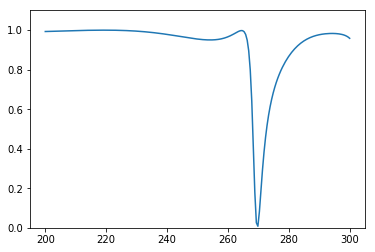

Predicted spectrum: 


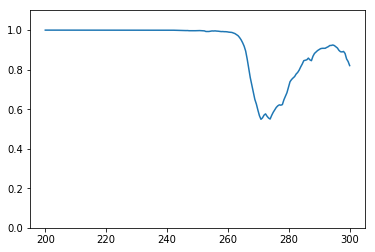

Test 1
True spectrum: 


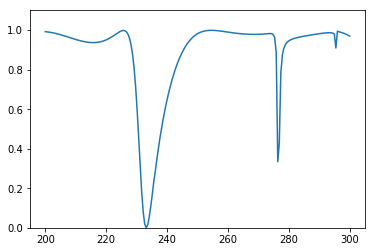

Predicted spectrum: 


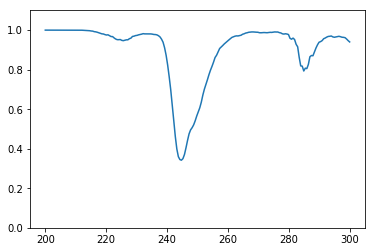

Test 2
True spectrum: 


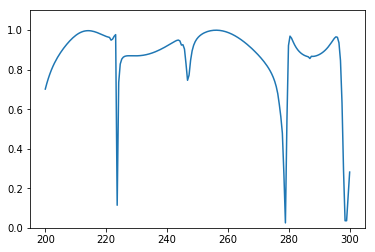

Predicted spectrum: 


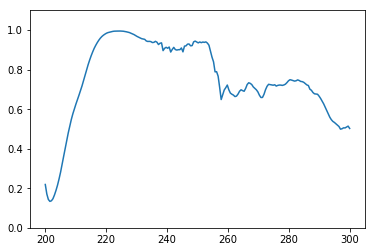

Test 3
True spectrum: 


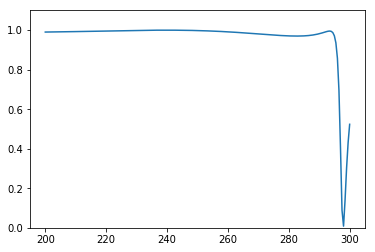

Predicted spectrum: 


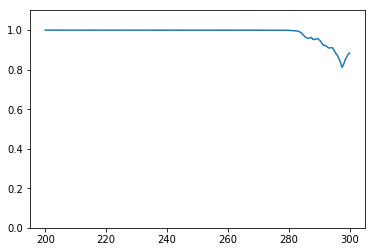

Test 4
True spectrum: 


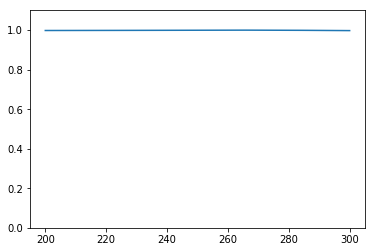

Predicted spectrum: 


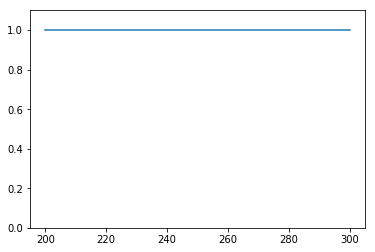

Test 5
True spectrum: 


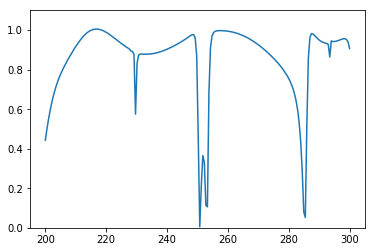

Predicted spectrum: 


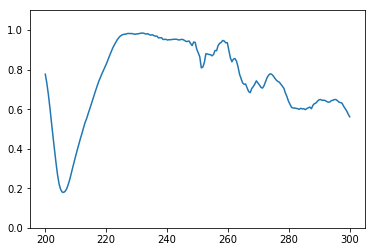

Test 6
True spectrum: 


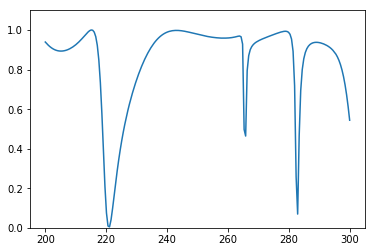

Predicted spectrum: 


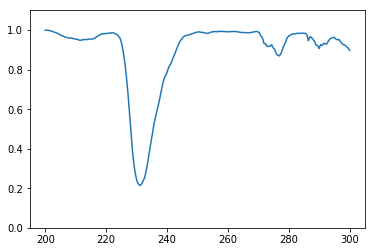

Test 7
True spectrum: 


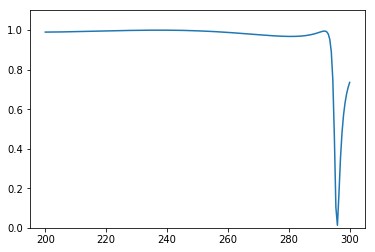

Predicted spectrum: 


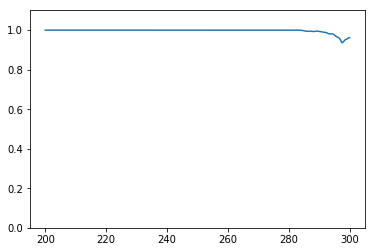

Test 8
True spectrum: 


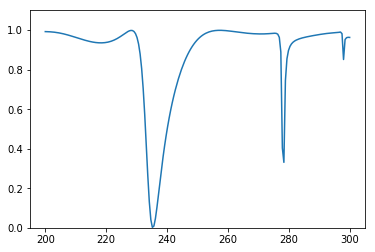

Predicted spectrum: 


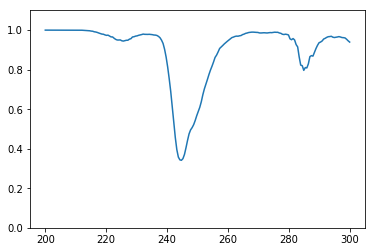

Test 9
True spectrum: 


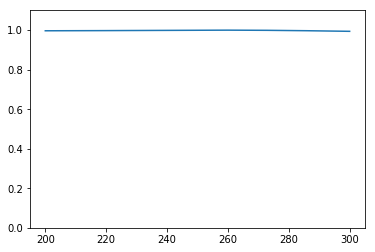

Predicted spectrum: 


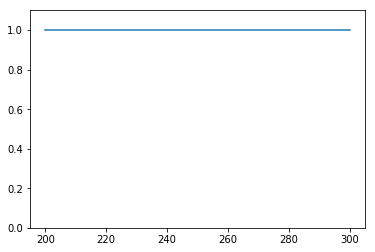

Test 10
True spectrum: 


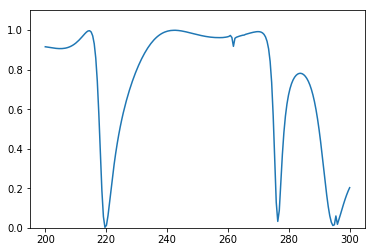

Predicted spectrum: 


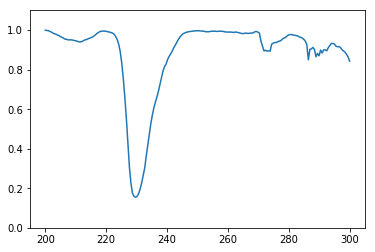

Test 11
True spectrum: 


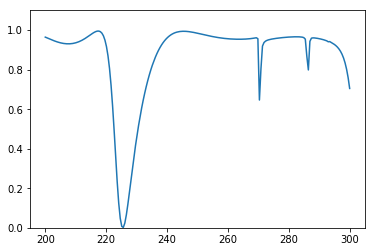

Predicted spectrum: 


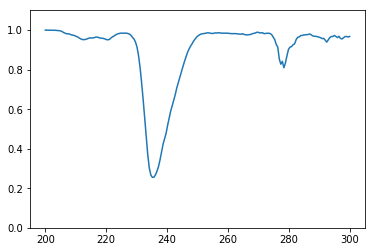

Test 12
True spectrum: 


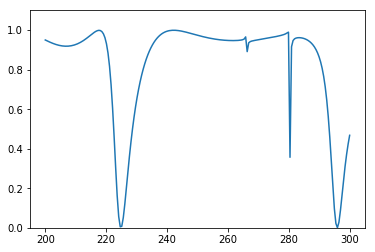

Predicted spectrum: 


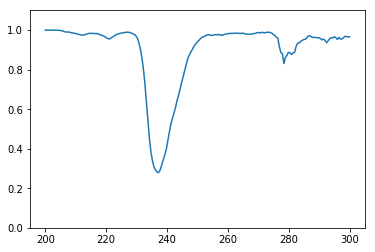

Test 13
True spectrum: 


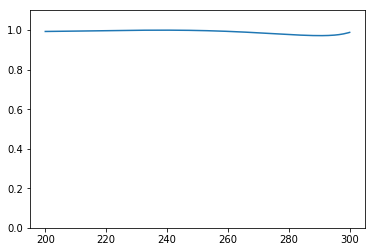

Predicted spectrum: 


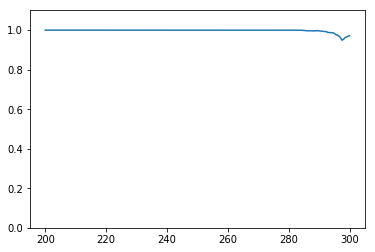

Test 14
True spectrum: 


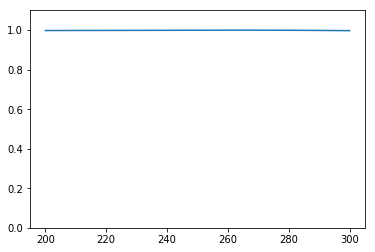

Predicted spectrum: 


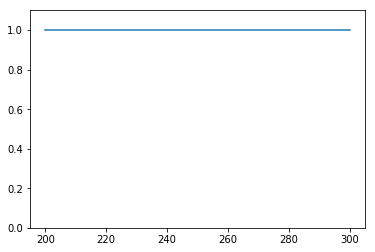

Test 15
True spectrum: 


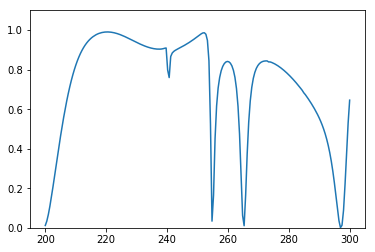

Predicted spectrum: 


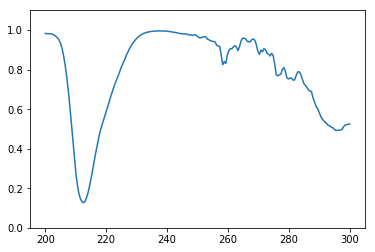

Test 16
True spectrum: 


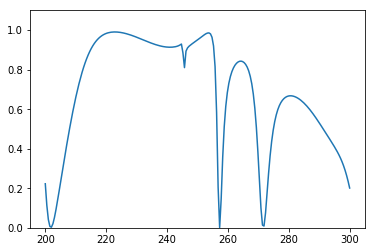

Predicted spectrum: 


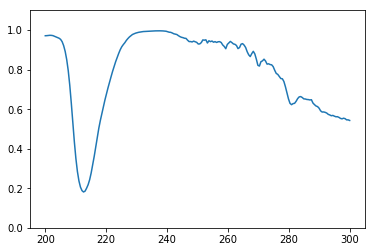

Test 17
True spectrum: 


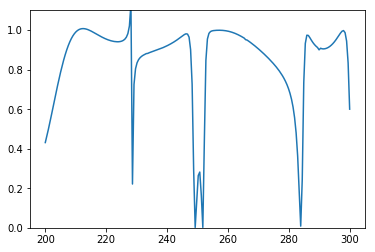

Predicted spectrum: 


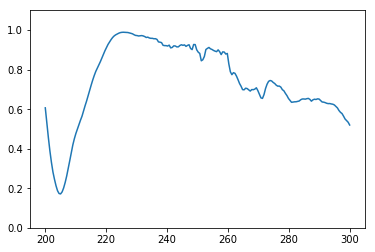

Test 18
True spectrum: 


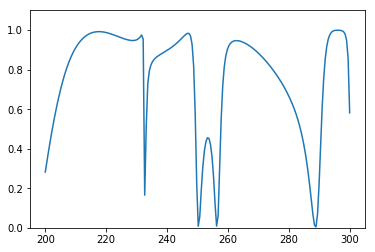

Predicted spectrum: 


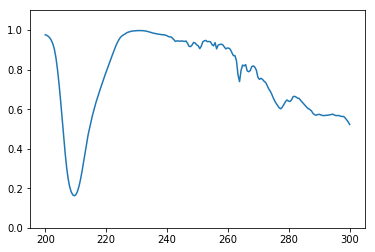

Test 19
True spectrum: 


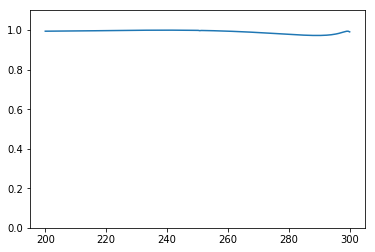

Predicted spectrum: 


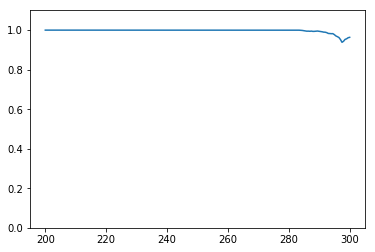

Test 20
True spectrum: 


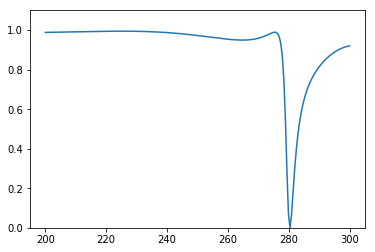

Predicted spectrum: 


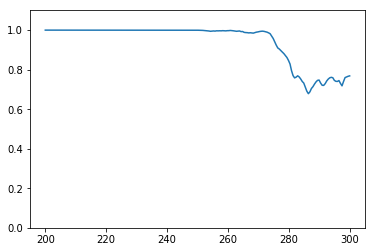

Test 21
True spectrum: 


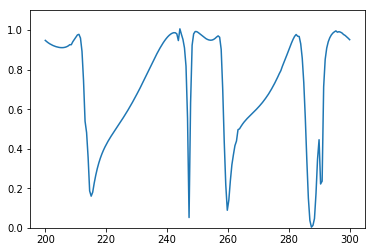

Predicted spectrum: 


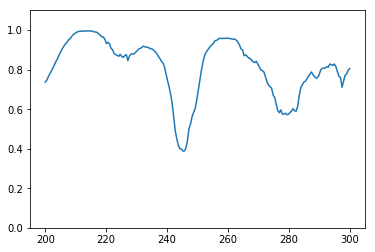

Test 22
True spectrum: 


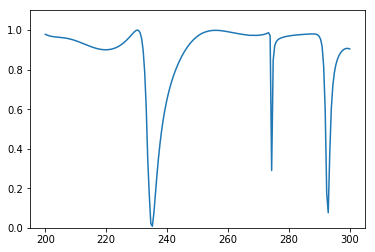

Predicted spectrum: 


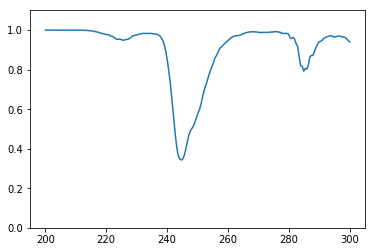

Test 23
True spectrum: 


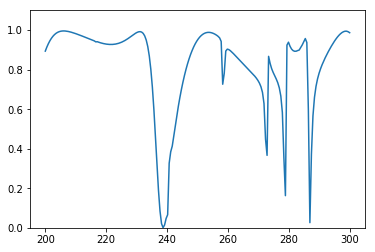

Predicted spectrum: 


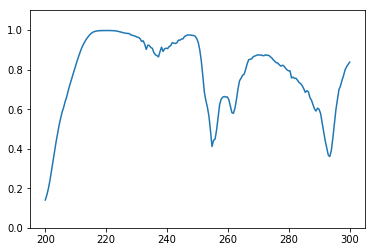

Test 24
True spectrum: 


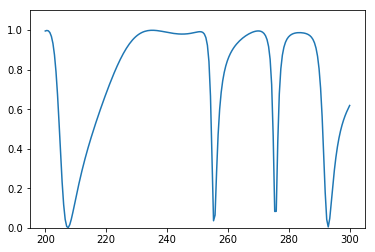

Predicted spectrum: 


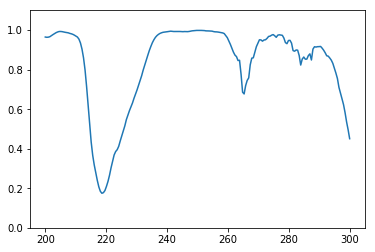

Test 25
True spectrum: 


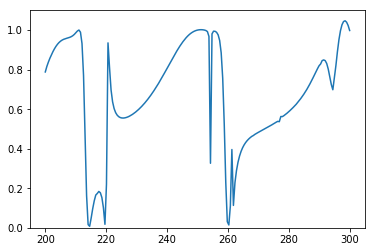

Predicted spectrum: 


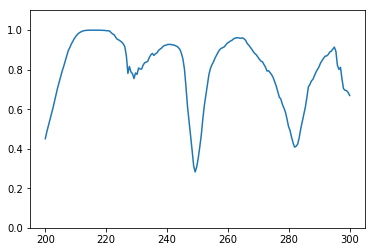

Test 26
True spectrum: 


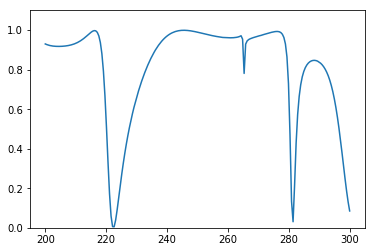

Predicted spectrum: 


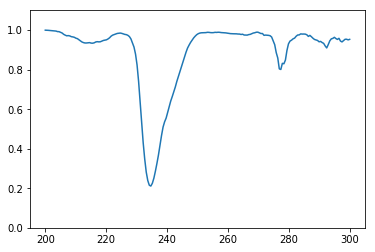

Test 27
True spectrum: 


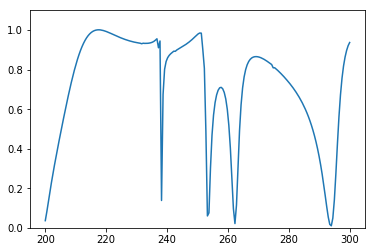

Predicted spectrum: 


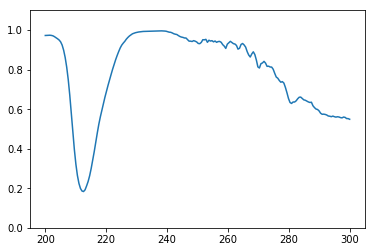

Test 28
True spectrum: 


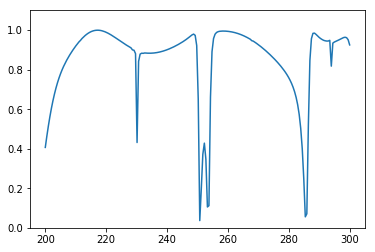

Predicted spectrum: 


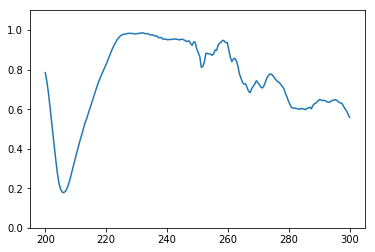

Test 29
True spectrum: 


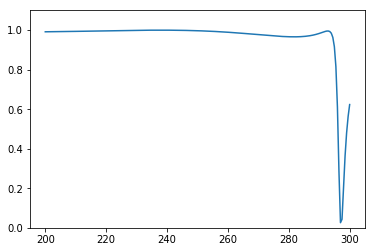

Predicted spectrum: 


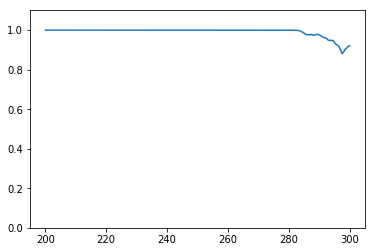

Test 30
True spectrum: 


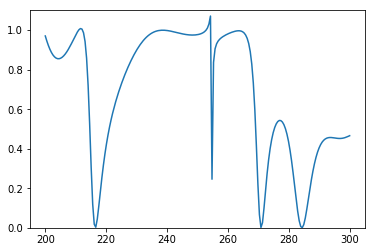

Predicted spectrum: 


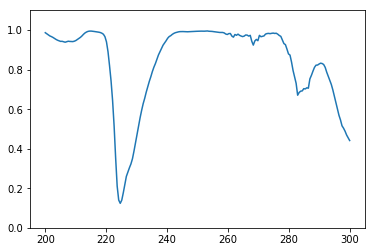

Test 31
True spectrum: 


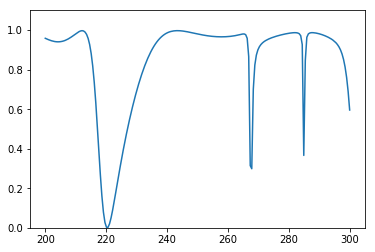

Predicted spectrum: 


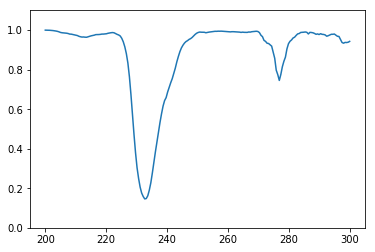

Test 32
True spectrum: 


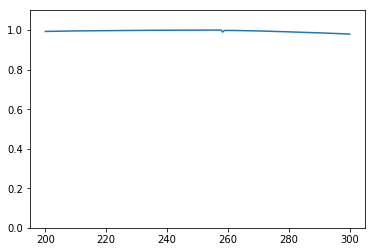

Predicted spectrum: 


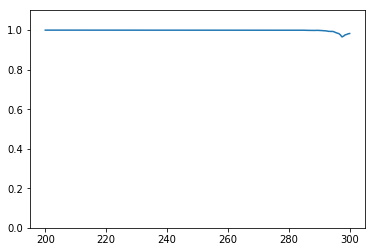

Test 33
True spectrum: 


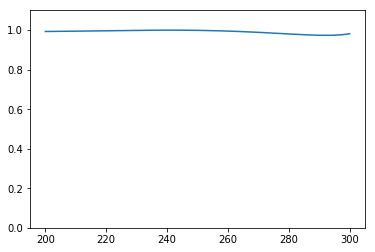

Predicted spectrum: 


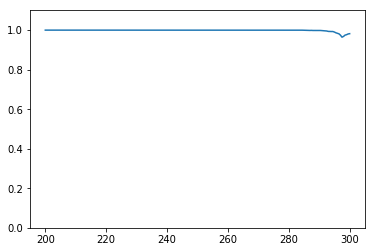

Test 34
True spectrum: 


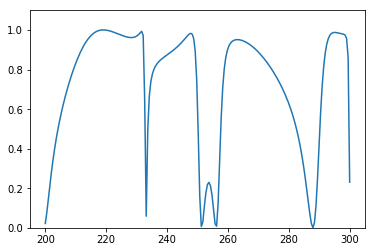

Predicted spectrum: 


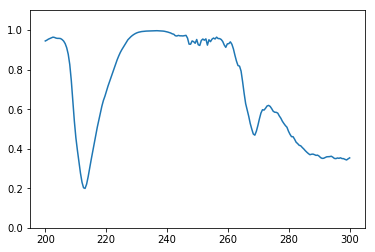

Test 35
True spectrum: 


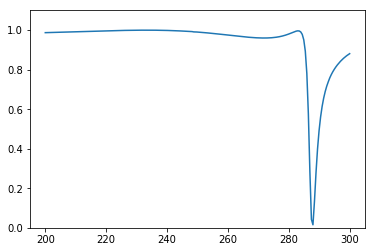

Predicted spectrum: 


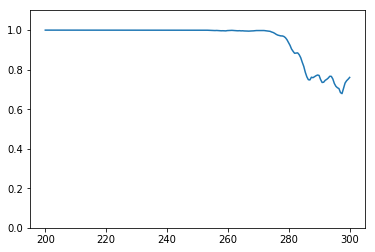

Test 36
True spectrum: 


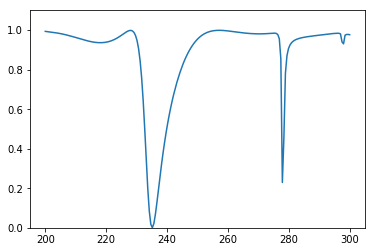

Predicted spectrum: 


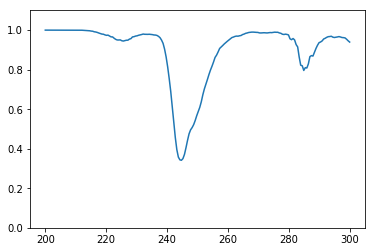

Test 37
True spectrum: 


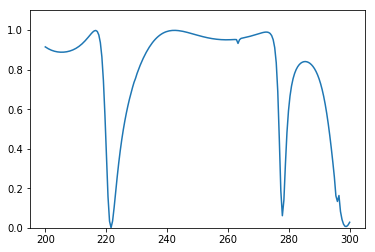

Predicted spectrum: 


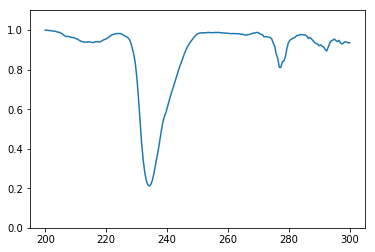

Test 38
True spectrum: 


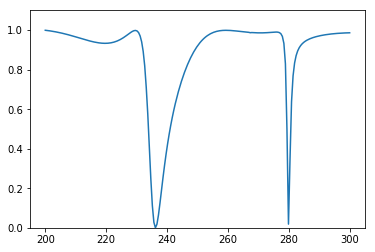

Predicted spectrum: 


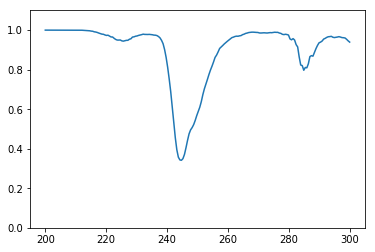

Test 39
True spectrum: 


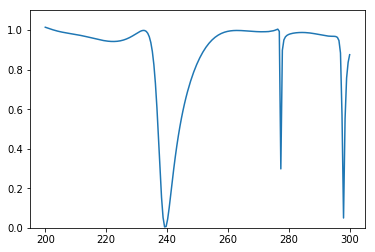

Predicted spectrum: 


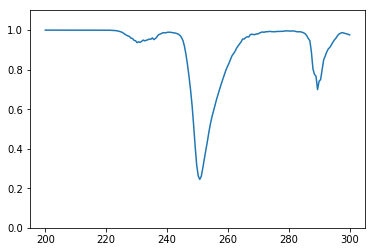

Test 40
True spectrum: 


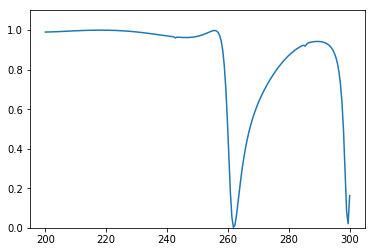

Predicted spectrum: 


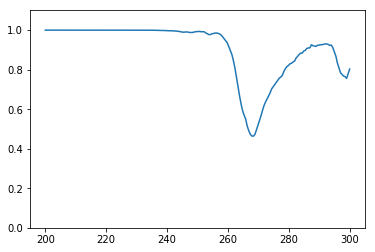

Test 41
True spectrum: 


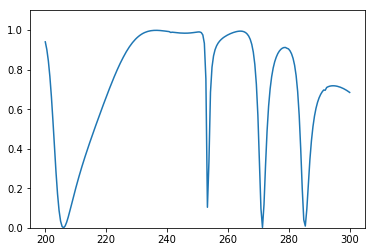

Predicted spectrum: 


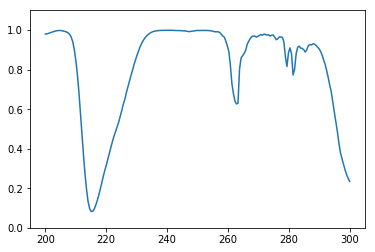

Test 42
True spectrum: 


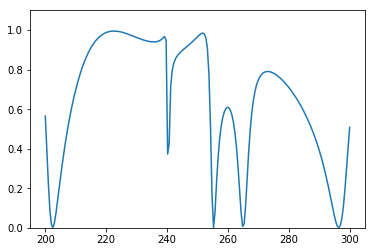

Predicted spectrum: 


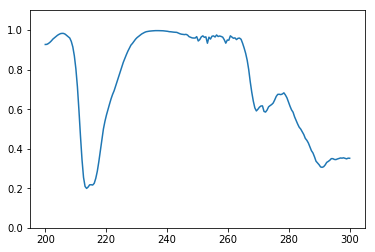

Test 43
True spectrum: 


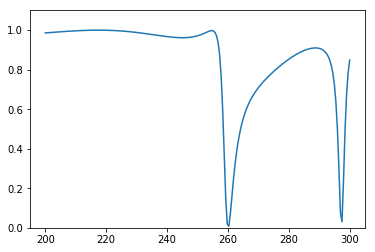

Predicted spectrum: 


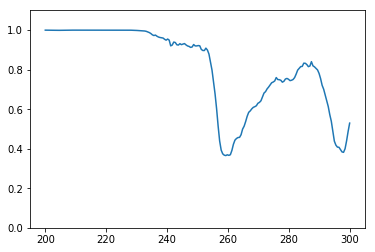

Test 44
True spectrum: 


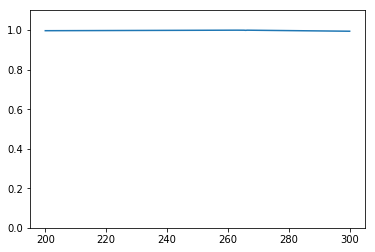

Predicted spectrum: 


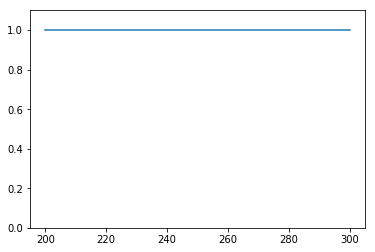

Test 45
True spectrum: 


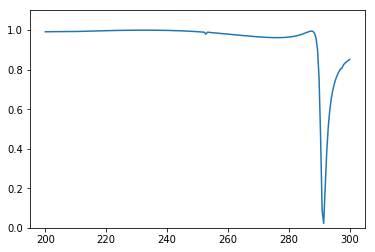

Predicted spectrum: 


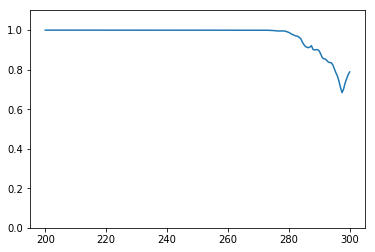

Test 46
True spectrum: 


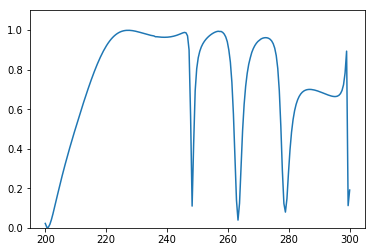

Predicted spectrum: 


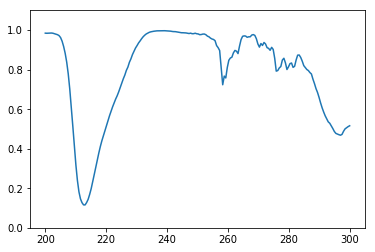

Test 47
True spectrum: 


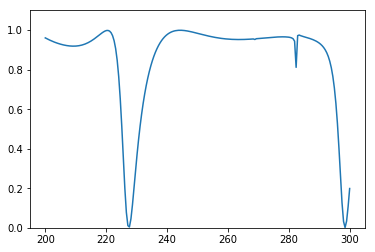

Predicted spectrum: 


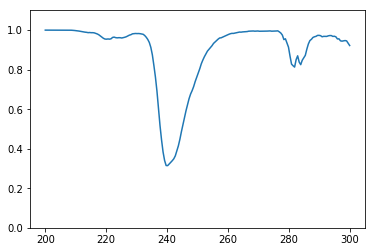

Test 48
True spectrum: 


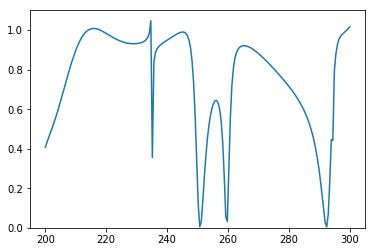

Predicted spectrum: 


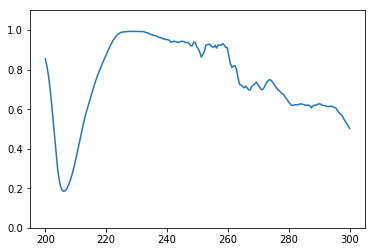

Test 49
True spectrum: 


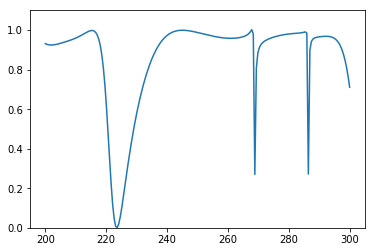

Predicted spectrum: 


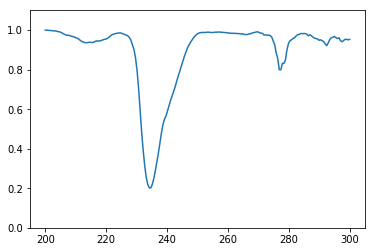

Test 50
True spectrum: 


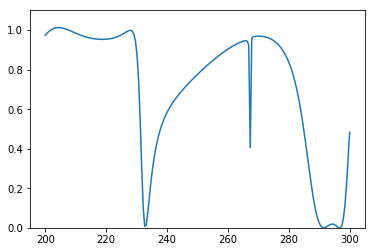

Predicted spectrum: 


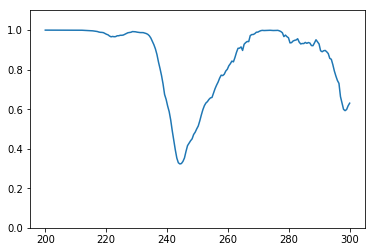

Test 51
True spectrum: 


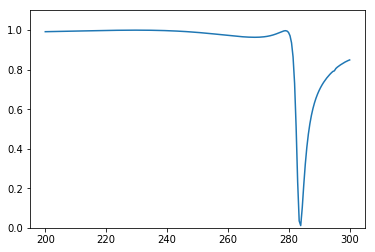

Predicted spectrum: 


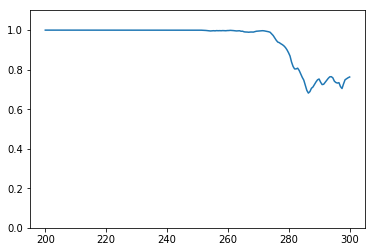

Test 52
True spectrum: 


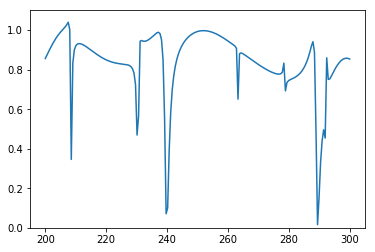

Predicted spectrum: 


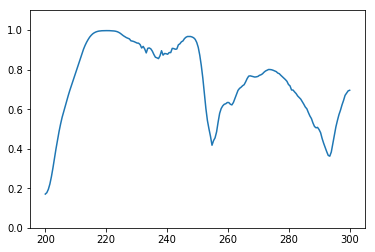

Test 53
True spectrum: 


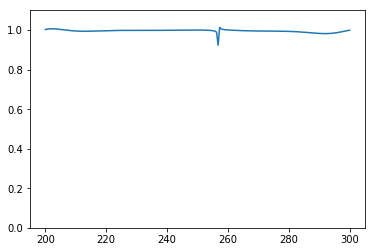

Predicted spectrum: 


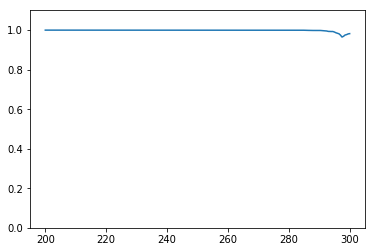

Test 54
True spectrum: 


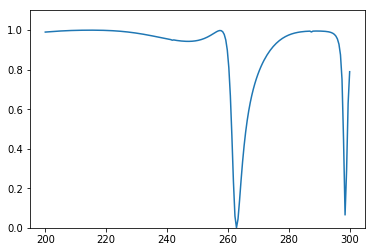

Predicted spectrum: 


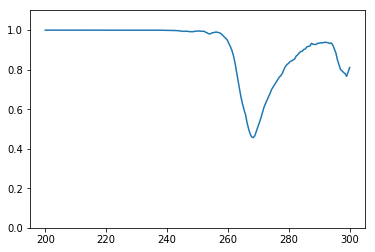

Test 55
True spectrum: 


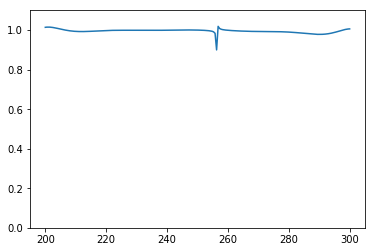

Predicted spectrum: 


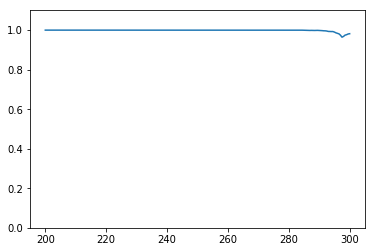

Test 56
True spectrum: 


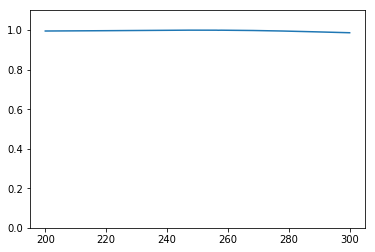

Predicted spectrum: 


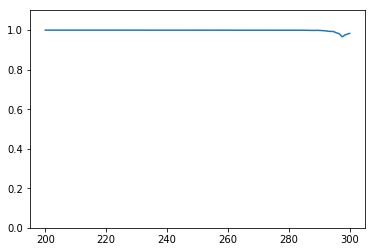

Test 57
True spectrum: 


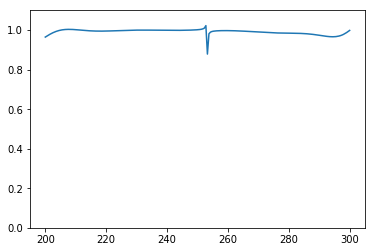

Predicted spectrum: 


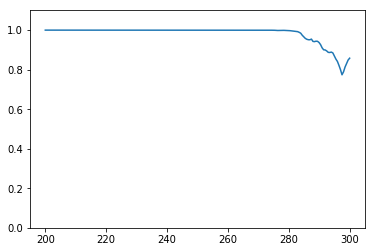

Test 58
True spectrum: 


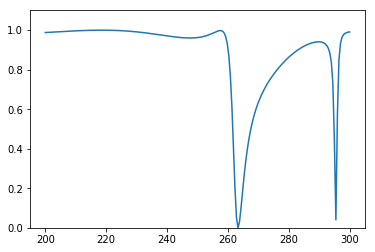

Predicted spectrum: 


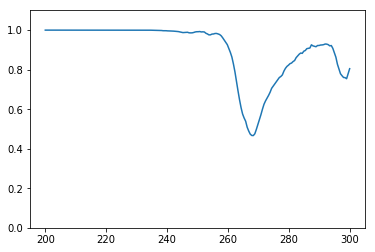

Test 59
True spectrum: 


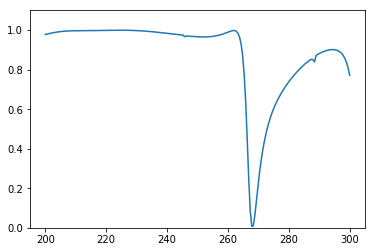

Predicted spectrum: 


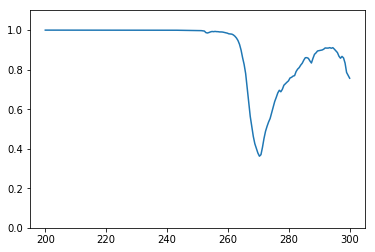

Test 60
True spectrum: 


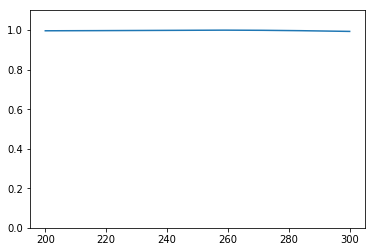

Predicted spectrum: 


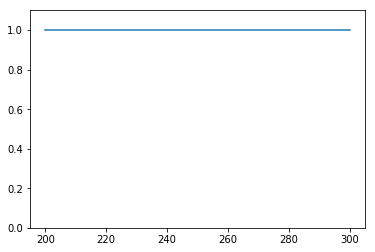

Test 61
True spectrum: 


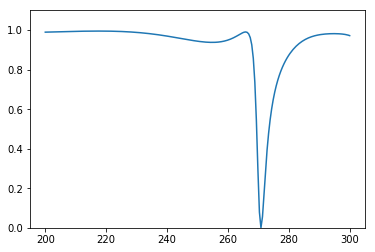

Predicted spectrum: 


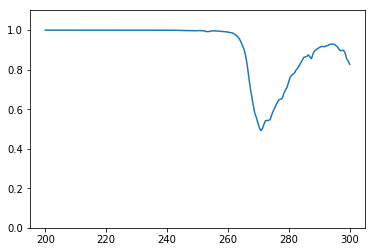

Test 62
True spectrum: 


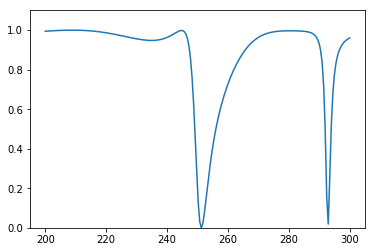

Predicted spectrum: 


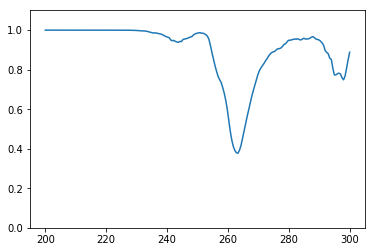

Test 63
True spectrum: 


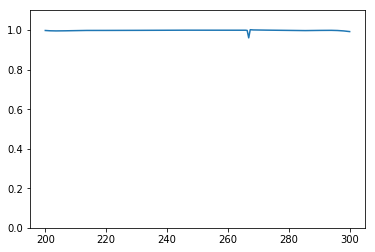

Predicted spectrum: 


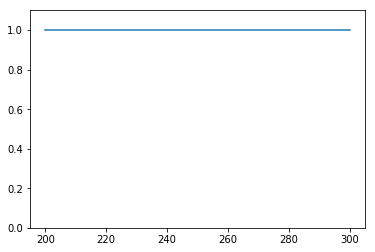

Test 64
True spectrum: 


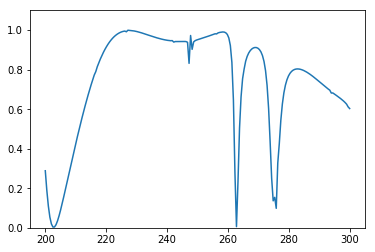

Predicted spectrum: 


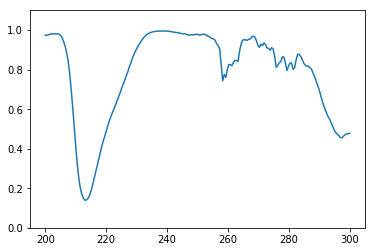

Test 65
True spectrum: 


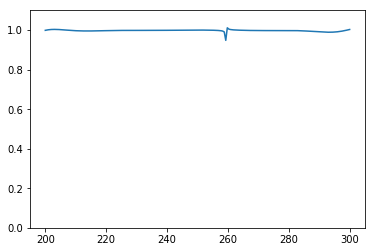

Predicted spectrum: 


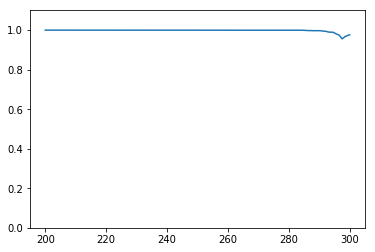

Test 66
True spectrum: 


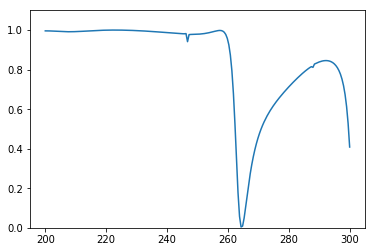

Predicted spectrum: 


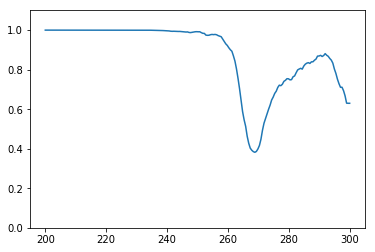

Test 67
True spectrum: 


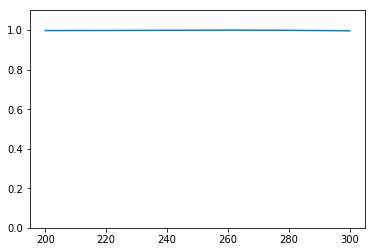

Predicted spectrum: 


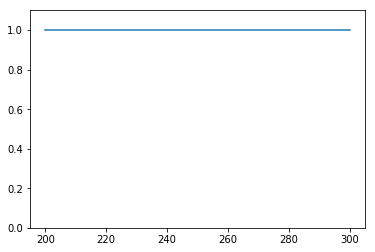

Test 68
True spectrum: 


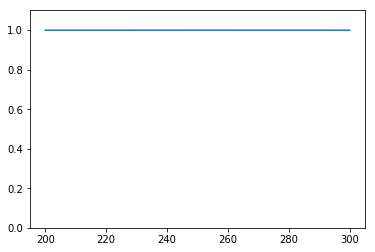

Predicted spectrum: 


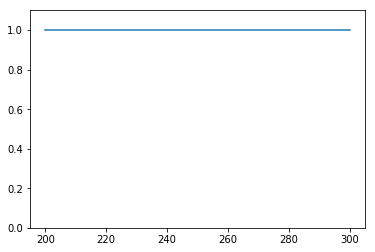

Test 69
True spectrum: 


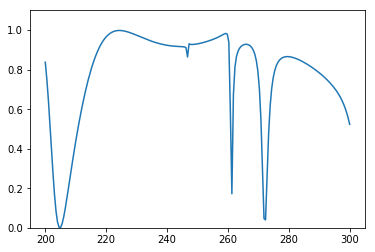

Predicted spectrum: 


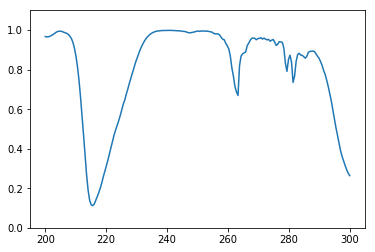

Test 70
True spectrum: 


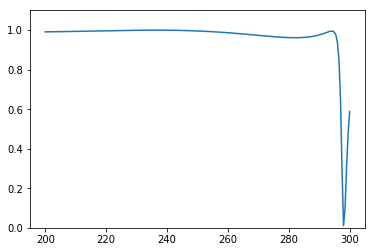

Predicted spectrum: 


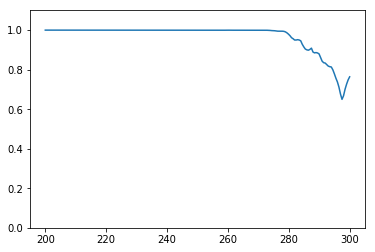

Test 71
True spectrum: 


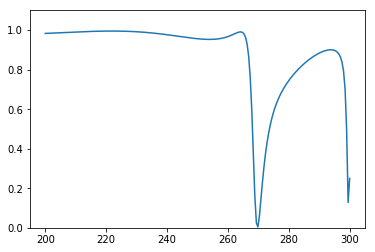

Predicted spectrum: 


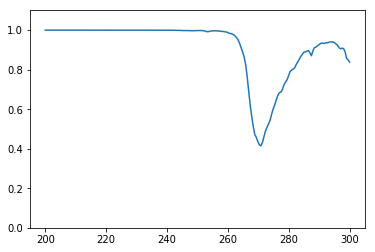

Test 72
True spectrum: 


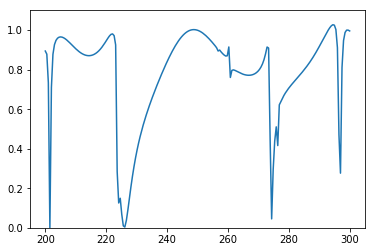

Predicted spectrum: 


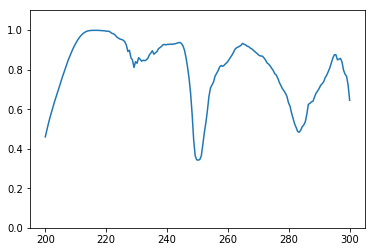

Test 73
True spectrum: 


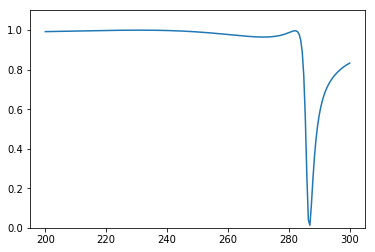

Predicted spectrum: 


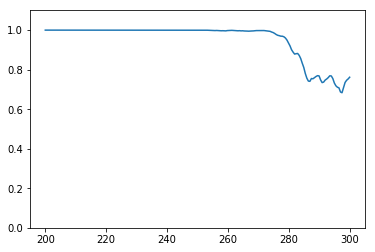

Test 74
True spectrum: 


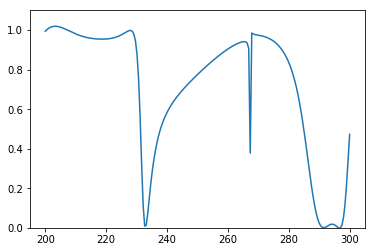

Predicted spectrum: 


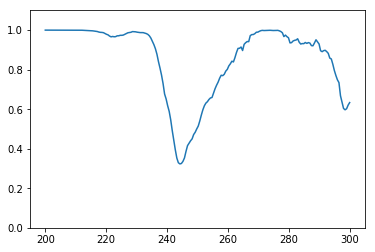

Test 75
True spectrum: 


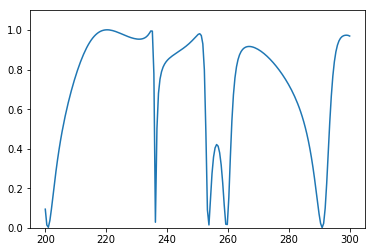

Predicted spectrum: 


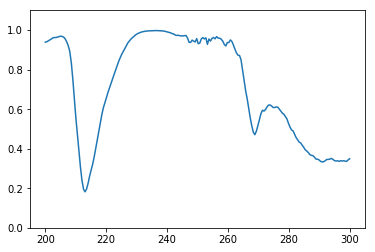

Test 76
True spectrum: 


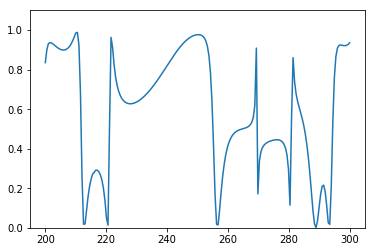

Predicted spectrum: 


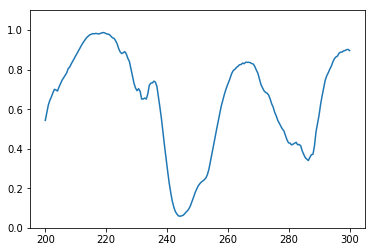

Test 77
True spectrum: 


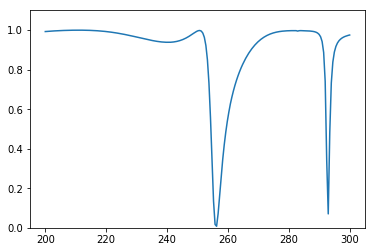

Predicted spectrum: 


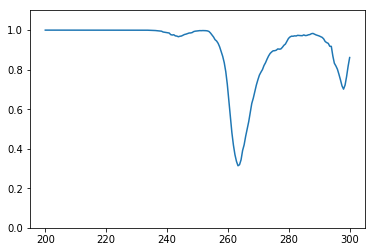

Test 78
True spectrum: 


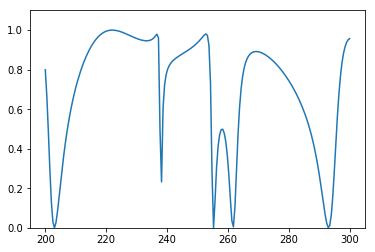

Predicted spectrum: 


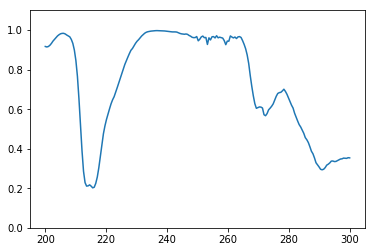

Test 79
True spectrum: 


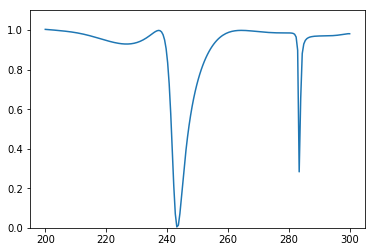

Predicted spectrum: 


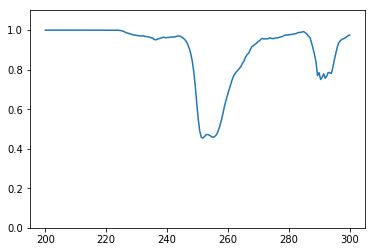

Test 80
True spectrum: 


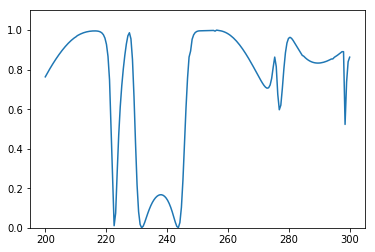

Predicted spectrum: 


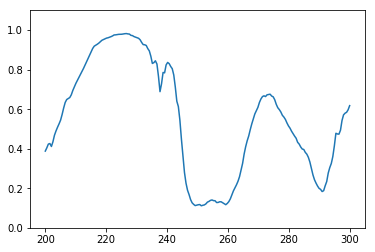

Test 81
True spectrum: 


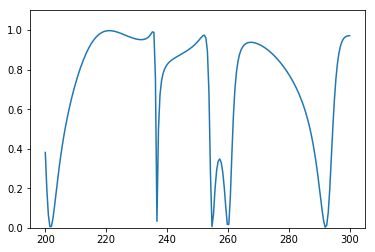

Predicted spectrum: 


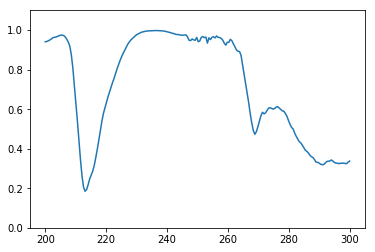

Test 82
True spectrum: 


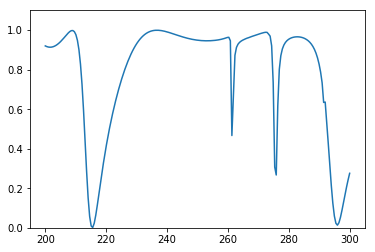

Predicted spectrum: 


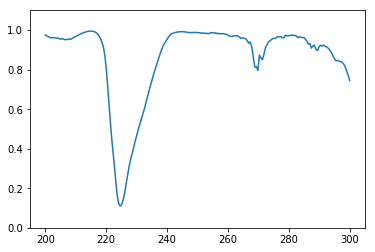

Test 83
True spectrum: 


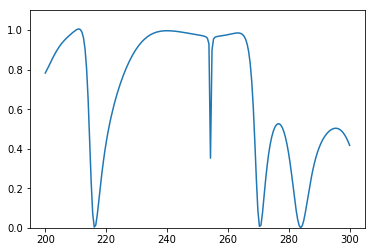

Predicted spectrum: 


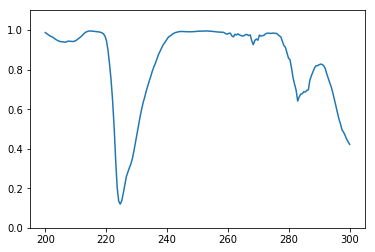

Test 84
True spectrum: 


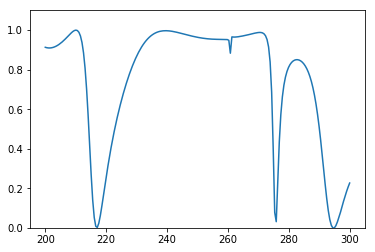

Predicted spectrum: 


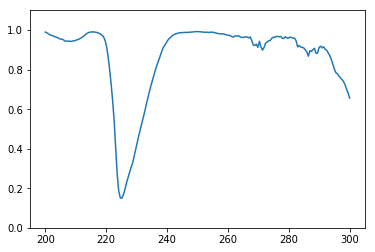

Test 85
True spectrum: 


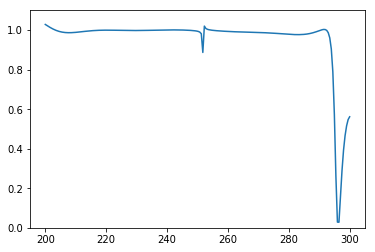

Predicted spectrum: 


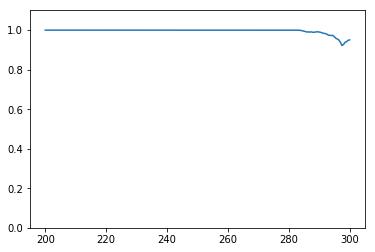

Test 86
True spectrum: 


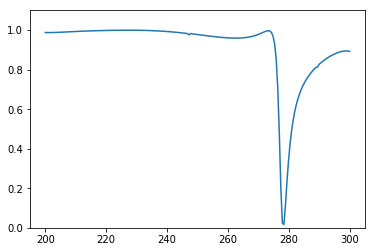

Predicted spectrum: 


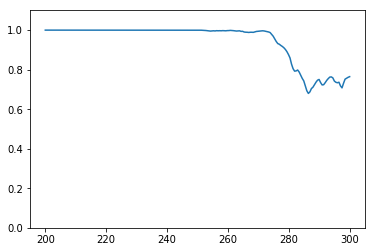

Test 87
True spectrum: 


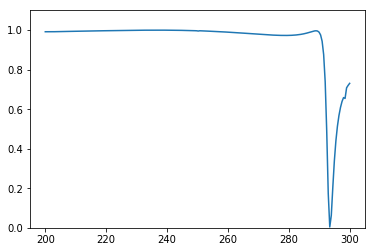

Predicted spectrum: 


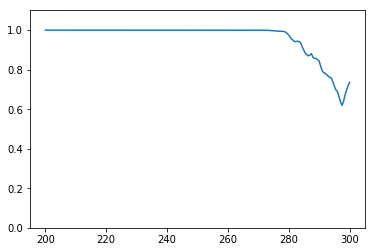

Test 88
True spectrum: 


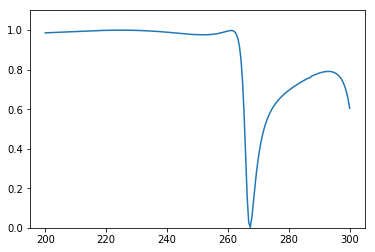

Predicted spectrum: 


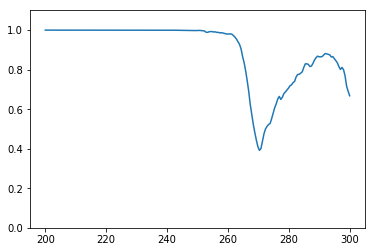

Test 89
True spectrum: 


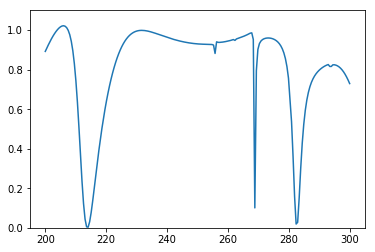

Predicted spectrum: 


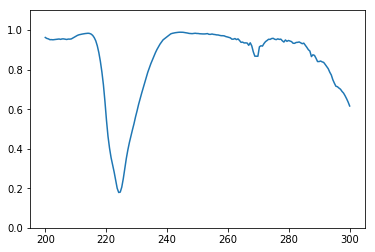

Test 90
True spectrum: 


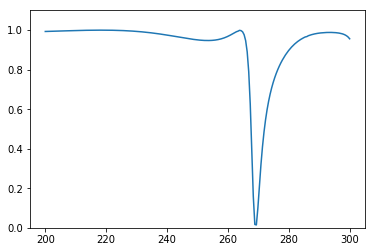

Predicted spectrum: 


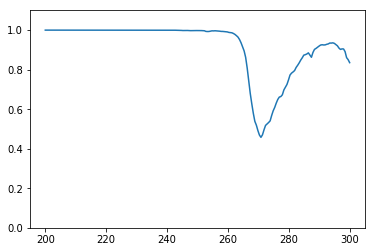

Test 91
True spectrum: 


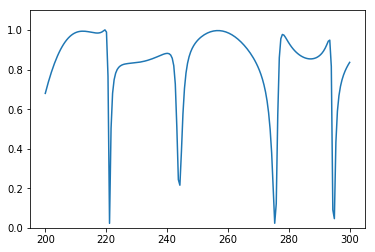

Predicted spectrum: 


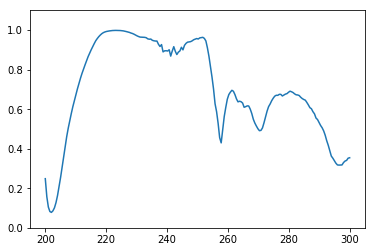

Test 92
True spectrum: 


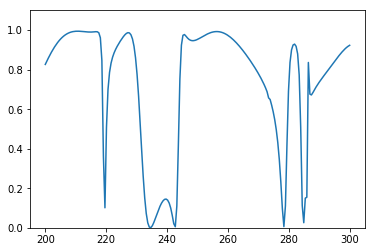

Predicted spectrum: 


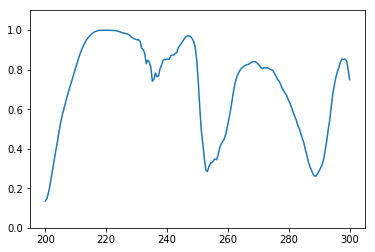

Test 93
True spectrum: 


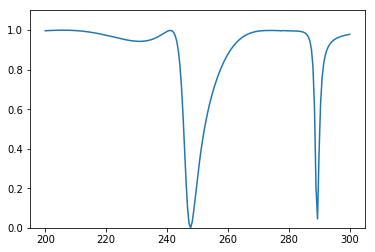

Predicted spectrum: 


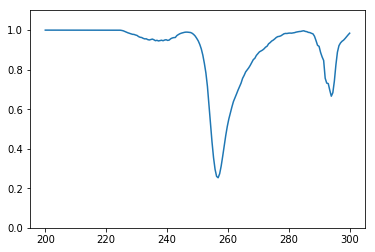

Test 94
True spectrum: 


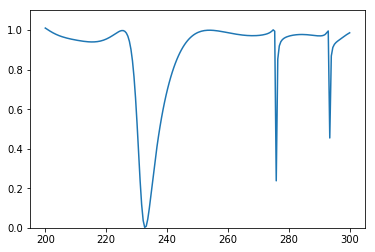

Predicted spectrum: 


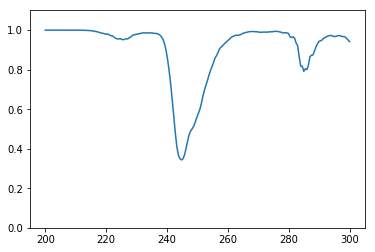

Test 95
True spectrum: 


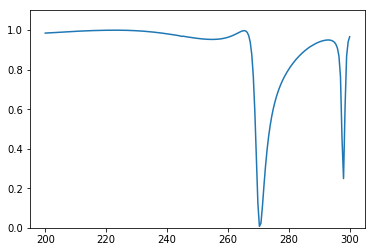

Predicted spectrum: 


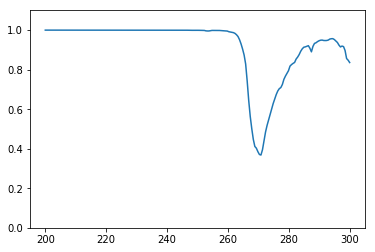

Test 96
True spectrum: 


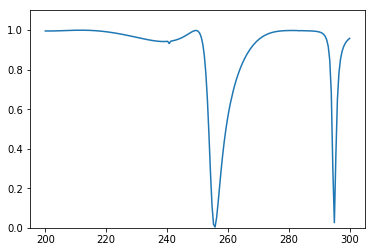

Predicted spectrum: 


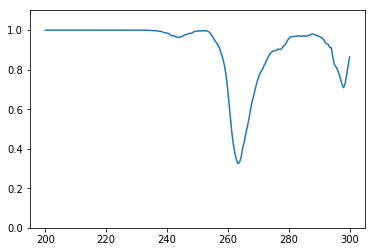

Test 97
True spectrum: 


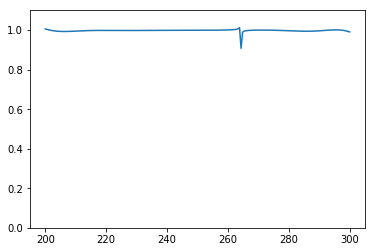

Predicted spectrum: 


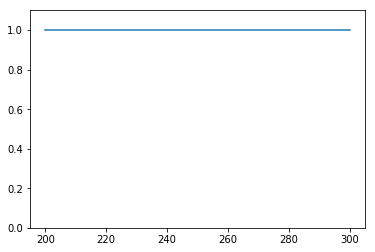

Test 98
True spectrum: 


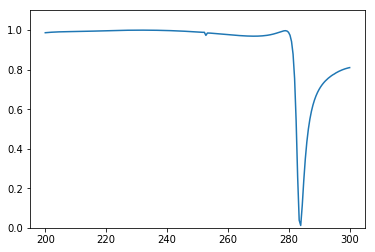

Predicted spectrum: 


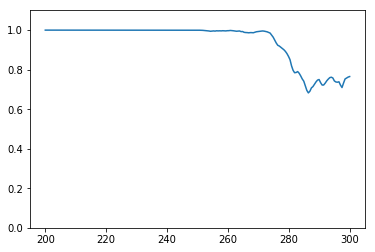

Test 99
True spectrum: 


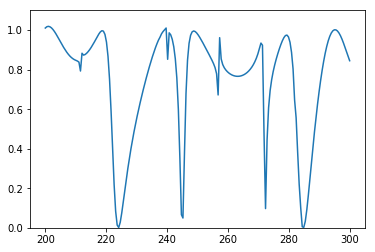

Predicted spectrum: 


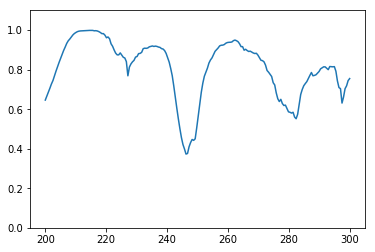

Test 100
True spectrum: 


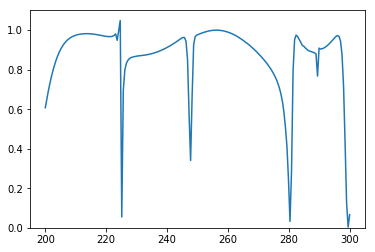

Predicted spectrum: 


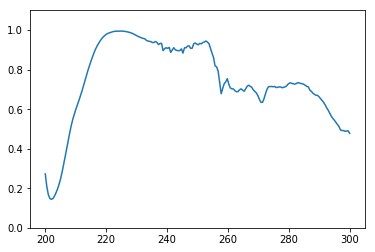

Test 101
True spectrum: 


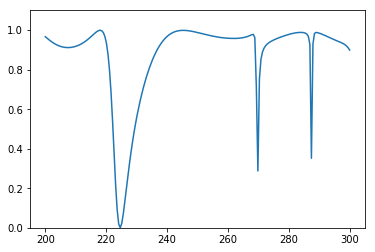

Predicted spectrum: 


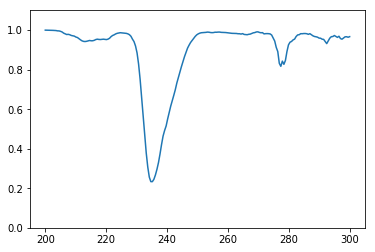

Test 102
True spectrum: 


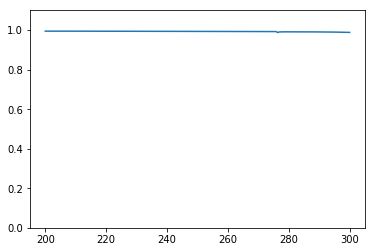

Predicted spectrum: 


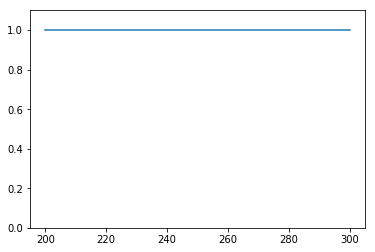

Test 103
True spectrum: 


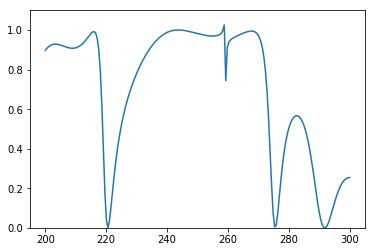

Predicted spectrum: 


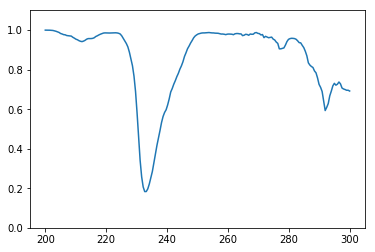

Test 104
True spectrum: 


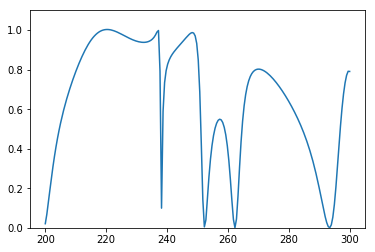

Predicted spectrum: 


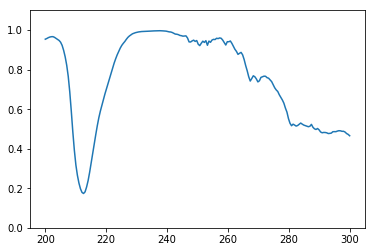

Test 105
True spectrum: 


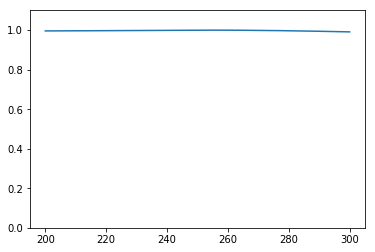

Predicted spectrum: 


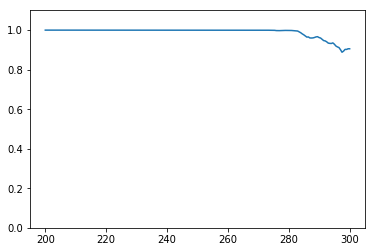

Test 106
True spectrum: 


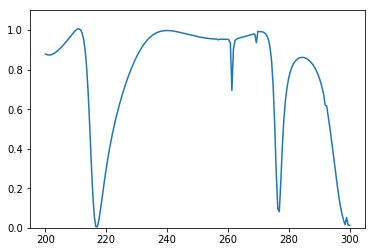

Predicted spectrum: 


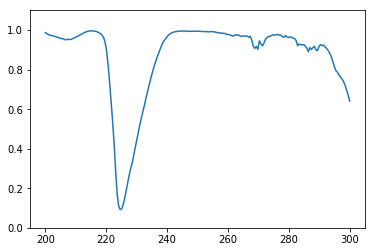

Test 107
True spectrum: 


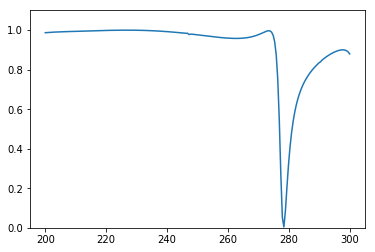

Predicted spectrum: 


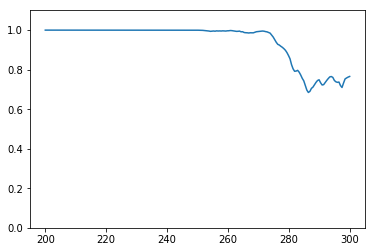

Test 108
True spectrum: 


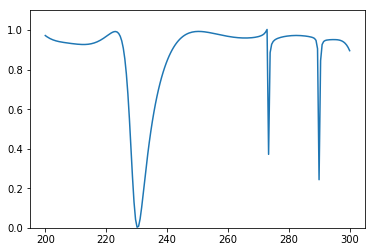

Predicted spectrum: 


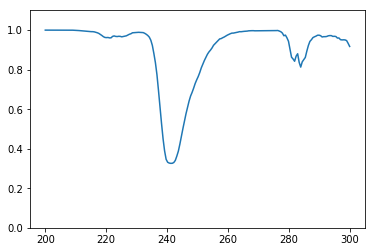

Test 109
True spectrum: 


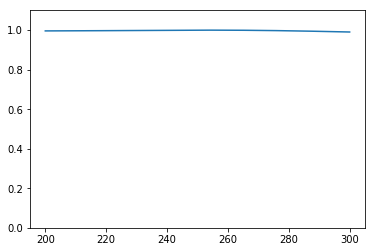

Predicted spectrum: 


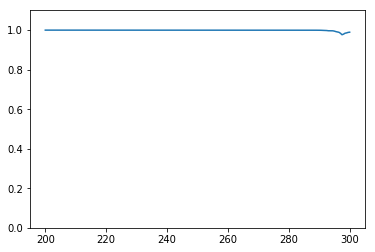

Test 110
True spectrum: 


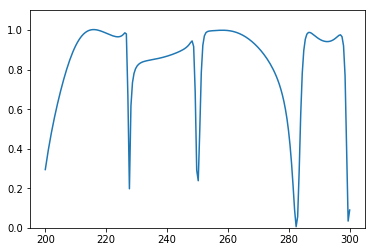

Predicted spectrum: 


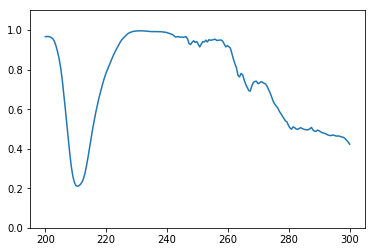

Test 111
True spectrum: 


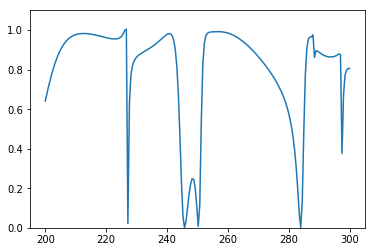

Predicted spectrum: 


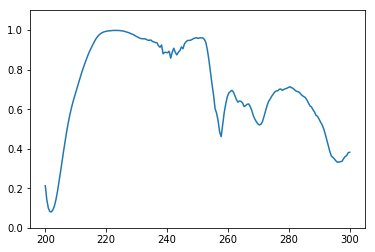

Test 112
True spectrum: 


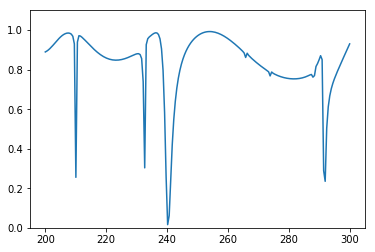

Predicted spectrum: 


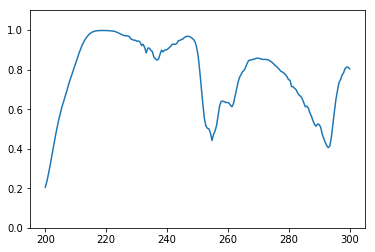

Test 113
True spectrum: 


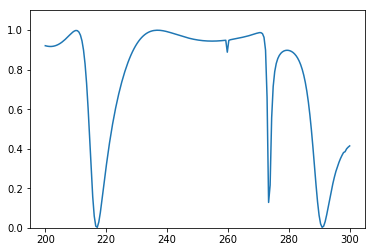

Predicted spectrum: 


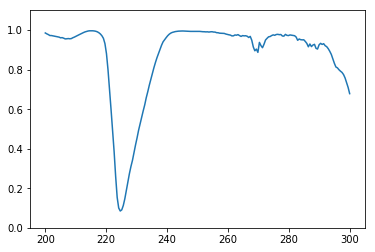

Test 114
True spectrum: 


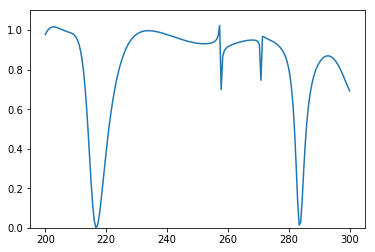

Predicted spectrum: 


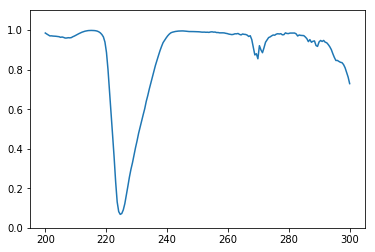

Test 115
True spectrum: 


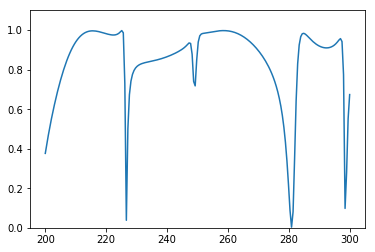

Predicted spectrum: 


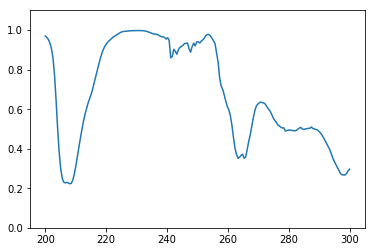

Test 116
True spectrum: 


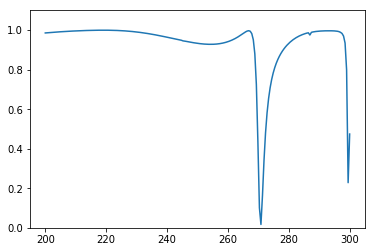

Predicted spectrum: 


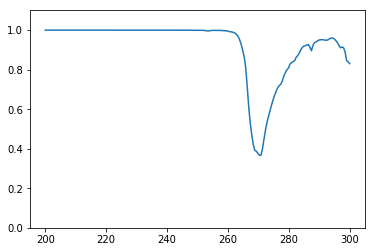

Test 117
True spectrum: 


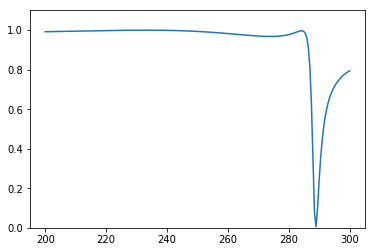

Predicted spectrum: 


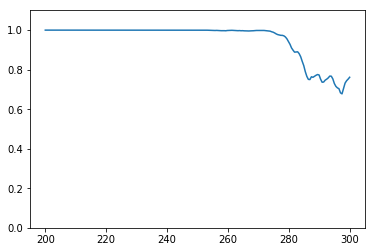

Test 118
True spectrum: 


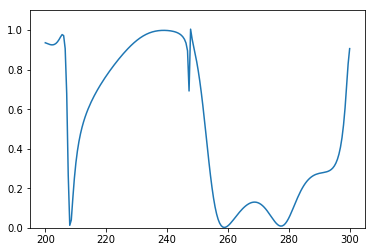

Predicted spectrum: 


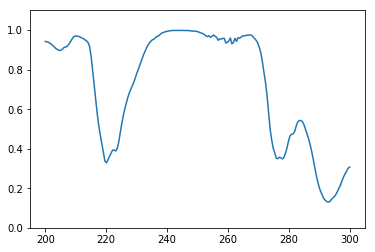

Test 119
True spectrum: 


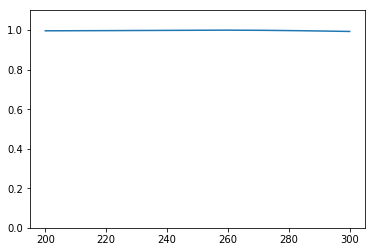

Predicted spectrum: 


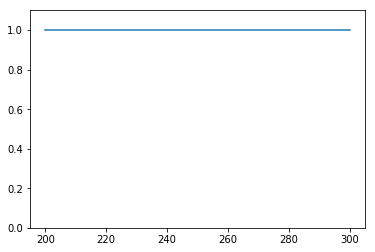

Test 120
True spectrum: 


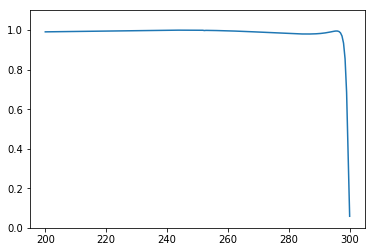

Predicted spectrum: 


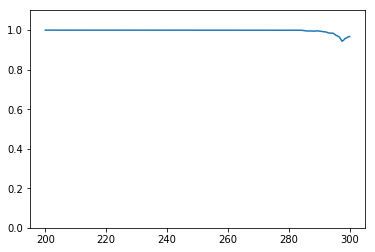

Test 121
True spectrum: 


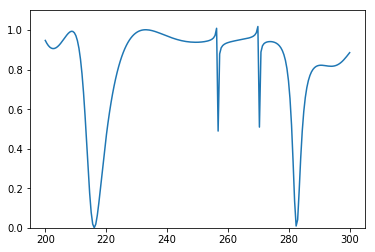

Predicted spectrum: 


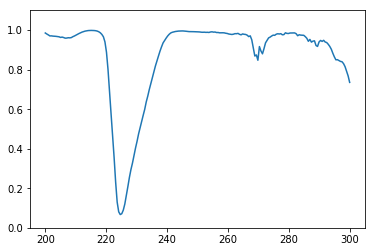

Test 122
True spectrum: 


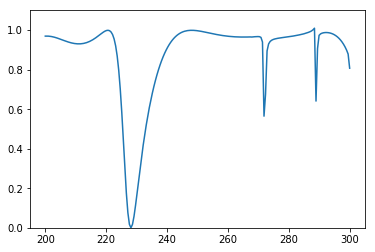

Predicted spectrum: 


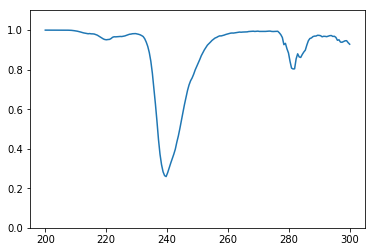

Test 123
True spectrum: 


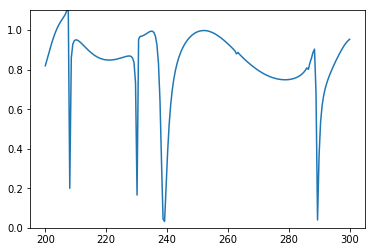

Predicted spectrum: 


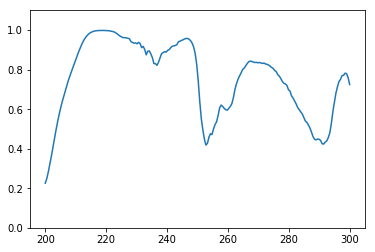

Test 124
True spectrum: 


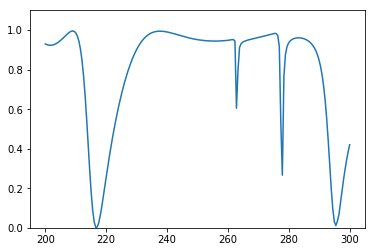

Predicted spectrum: 


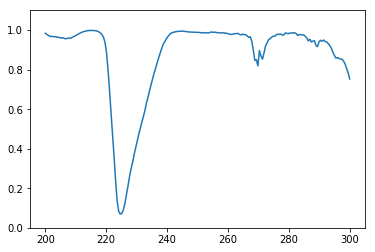

Test 125
True spectrum: 


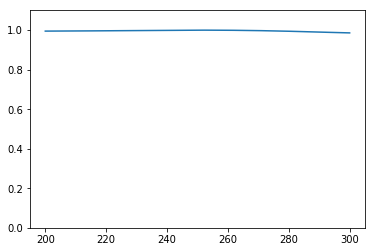

Predicted spectrum: 


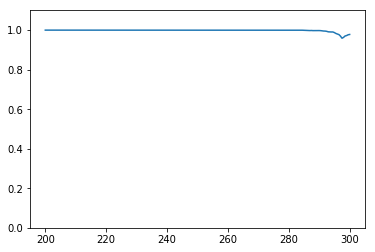

Test 126
True spectrum: 


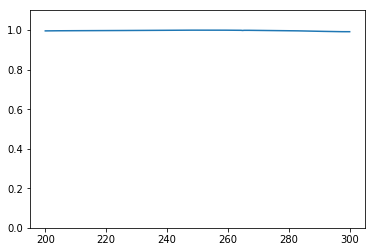

Predicted spectrum: 


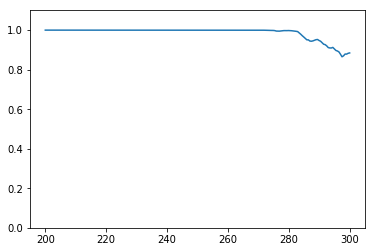

Test 127
True spectrum: 


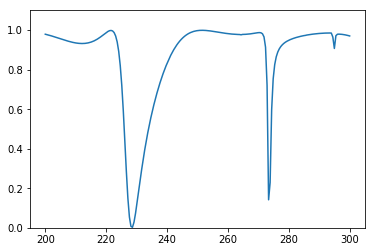

Predicted spectrum: 


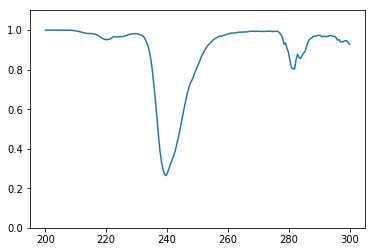

Test 128
True spectrum: 


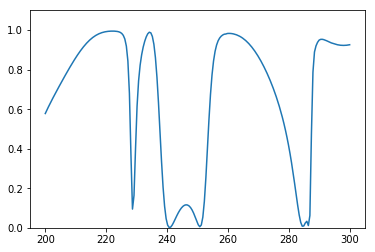

Predicted spectrum: 


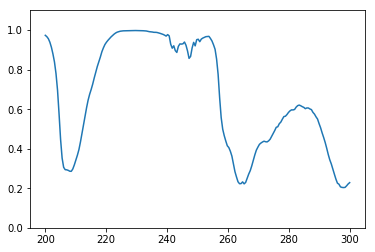

Test 129
True spectrum: 


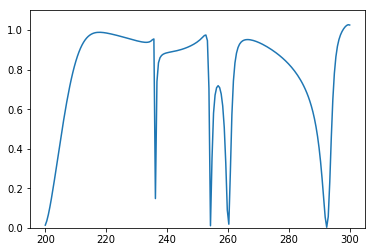

Predicted spectrum: 


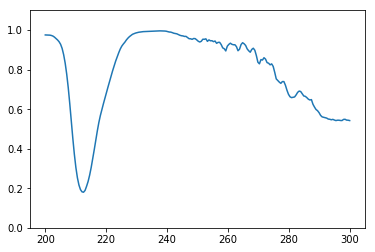

Test 130
True spectrum: 


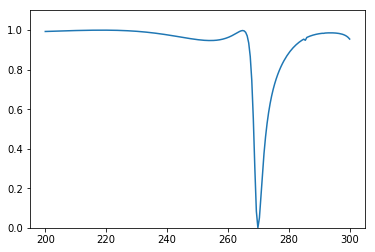

Predicted spectrum: 


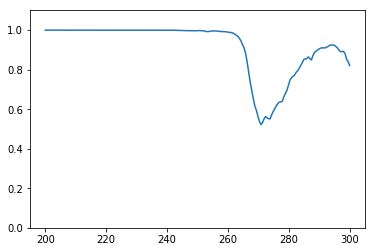

Test 131
True spectrum: 


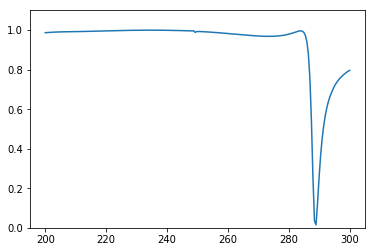

Predicted spectrum: 


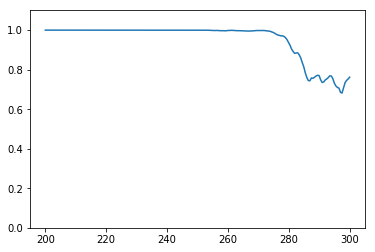

Test 132
True spectrum: 


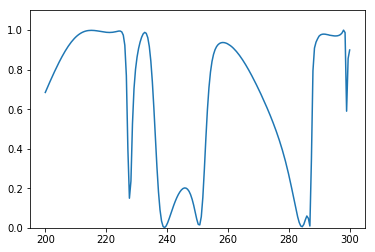

Predicted spectrum: 


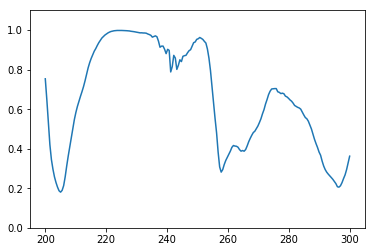

Test 133
True spectrum: 


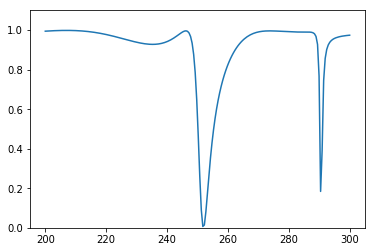

Predicted spectrum: 


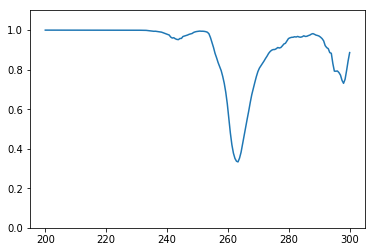

Test 134
True spectrum: 


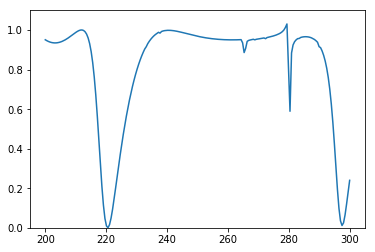

Predicted spectrum: 


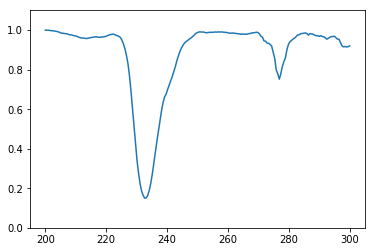

Test 135
True spectrum: 


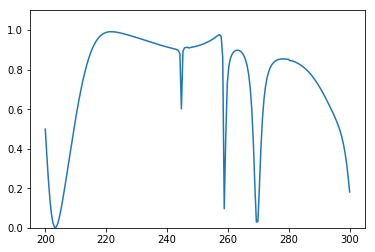

Predicted spectrum: 


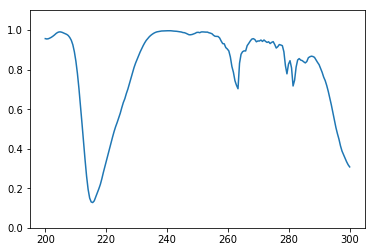

Test 136
True spectrum: 


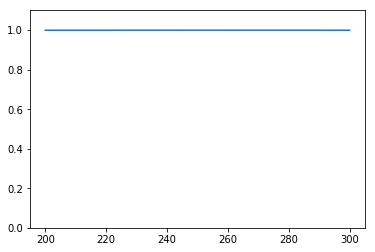

Predicted spectrum: 


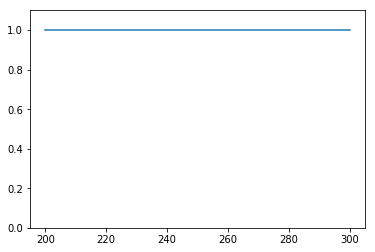

Test 137
True spectrum: 


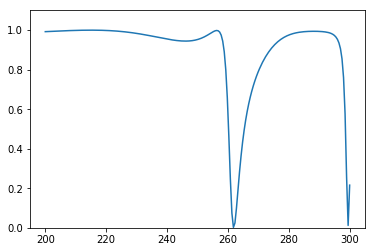

Predicted spectrum: 


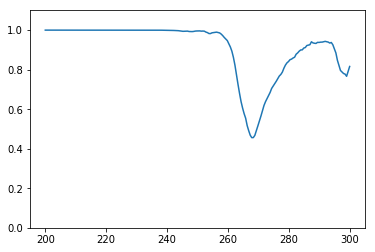

Test 138
True spectrum: 


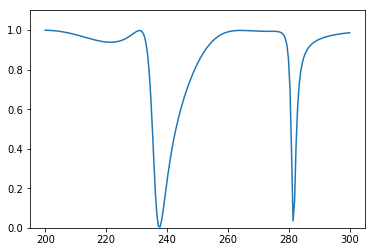

Predicted spectrum: 


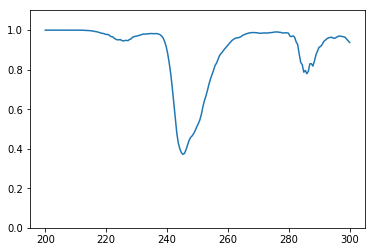

Test 139
True spectrum: 


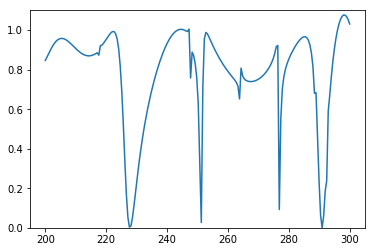

Predicted spectrum: 


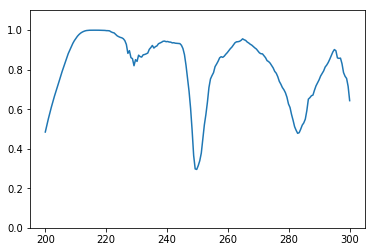

Test 140
True spectrum: 


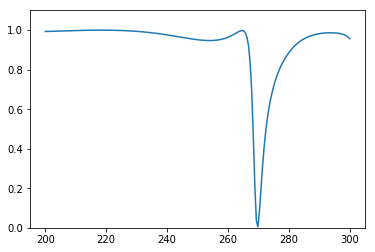

Predicted spectrum: 


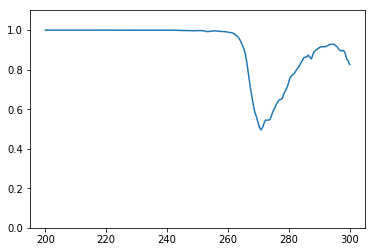

Test 141
True spectrum: 


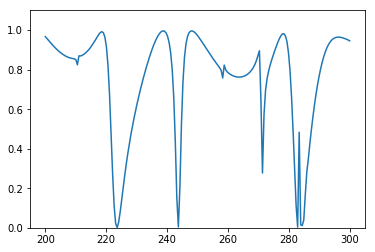

Predicted spectrum: 


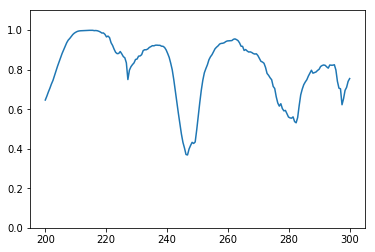

Test 142
True spectrum: 


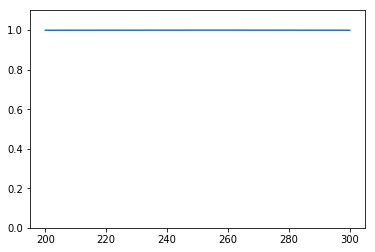

Predicted spectrum: 


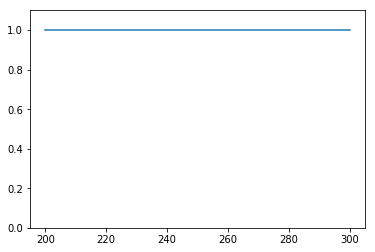

Test 143
True spectrum: 


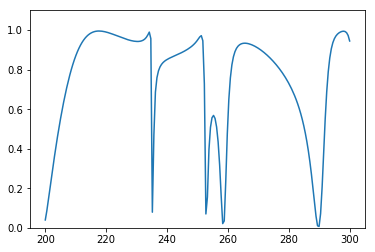

Predicted spectrum: 


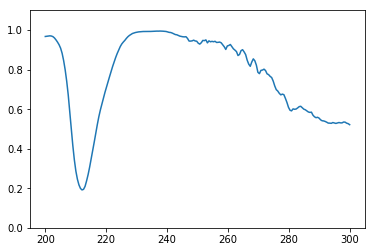

Test 144
True spectrum: 


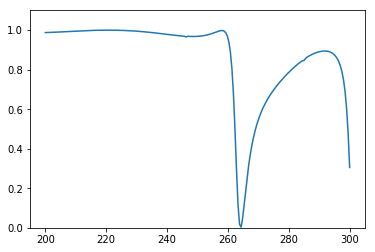

Predicted spectrum: 


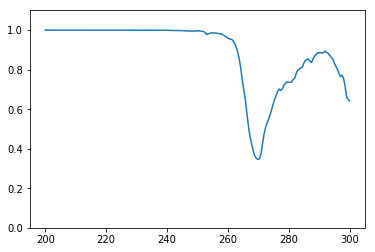

Test 145
True spectrum: 


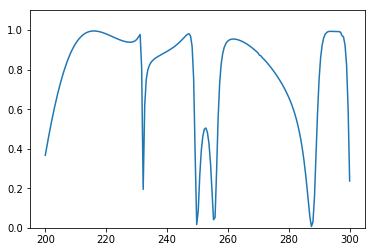

Predicted spectrum: 


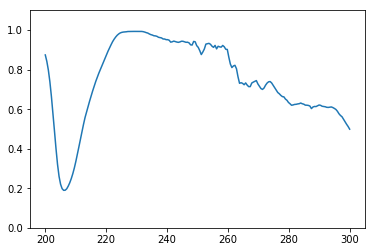

Test 146
True spectrum: 


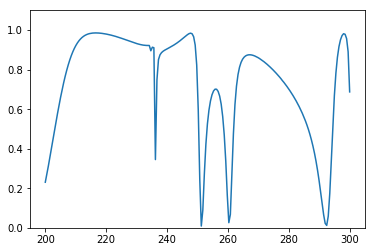

Predicted spectrum: 


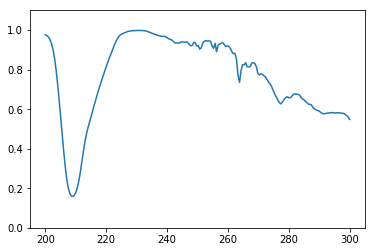

Test 147
True spectrum: 


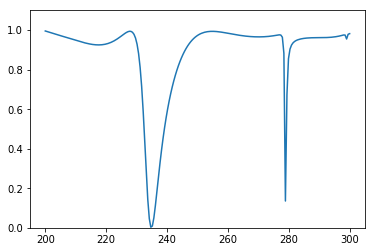

Predicted spectrum: 


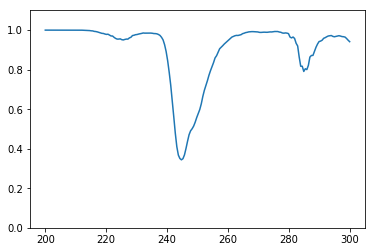

Test 148
True spectrum: 


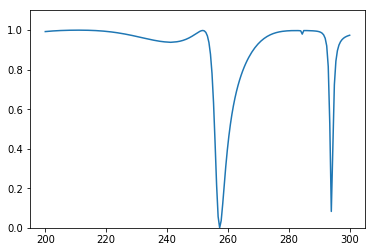

Predicted spectrum: 


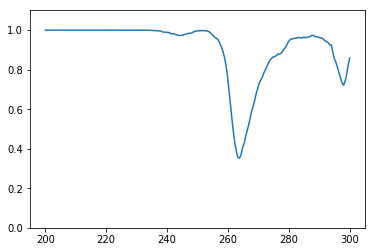

Test 149
True spectrum: 


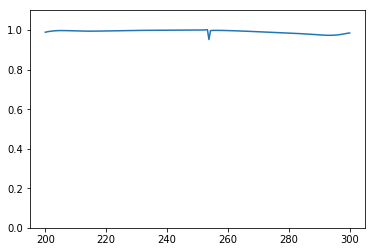

Predicted spectrum: 


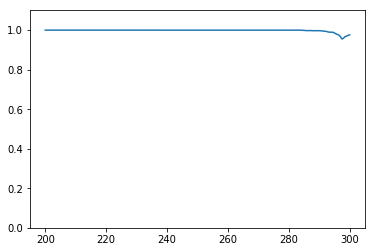

Test 150
True spectrum: 


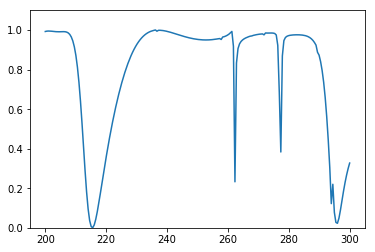

Predicted spectrum: 


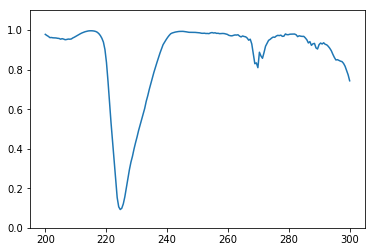

Test 151
True spectrum: 


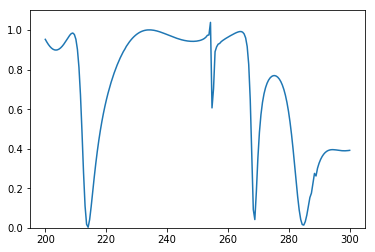

Predicted spectrum: 


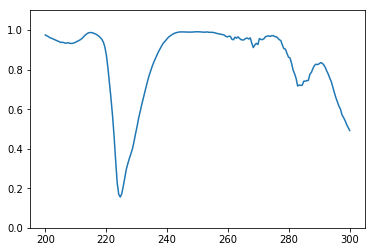

Test 152
True spectrum: 


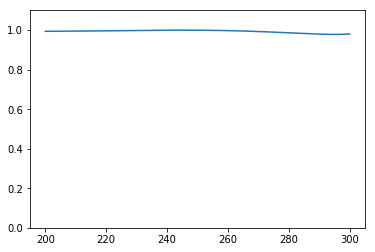

Predicted spectrum: 


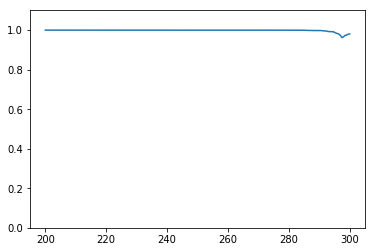

Test 153
True spectrum: 


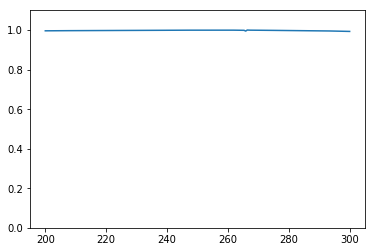

Predicted spectrum: 


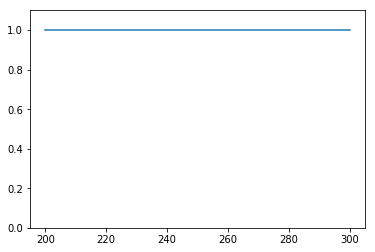

Test 154
True spectrum: 


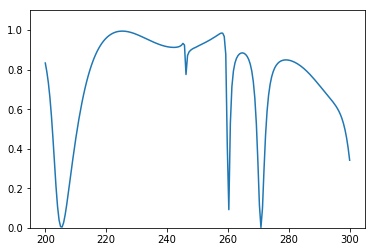

Predicted spectrum: 


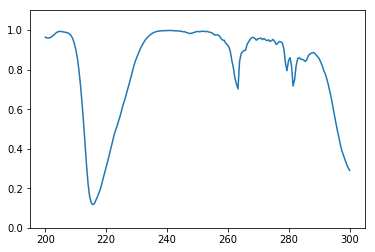

Test 155
True spectrum: 


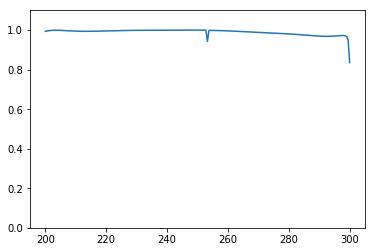

Predicted spectrum: 


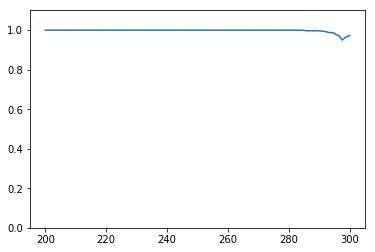

Test 156
True spectrum: 


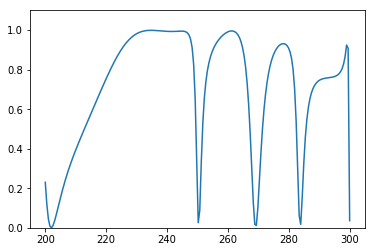

Predicted spectrum: 


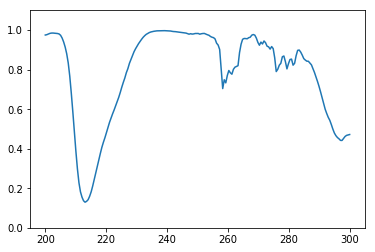

Test 157
True spectrum: 


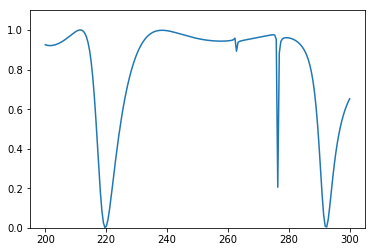

Predicted spectrum: 


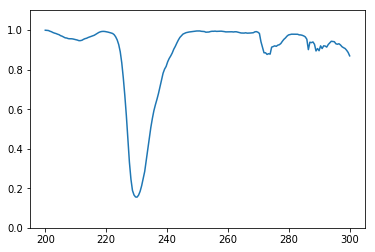

Test 158
True spectrum: 


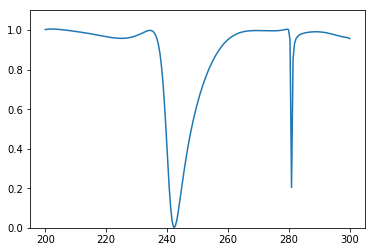

Predicted spectrum: 


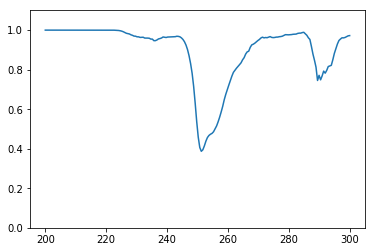

Test 159
True spectrum: 


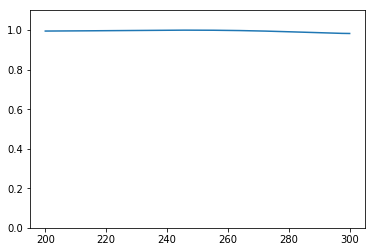

Predicted spectrum: 


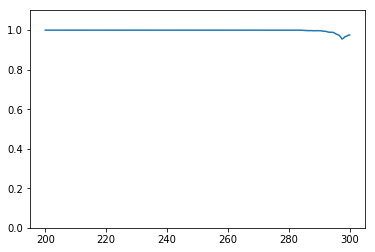

Test 160
True spectrum: 


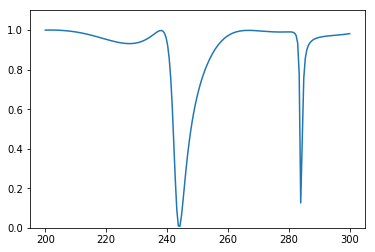

Predicted spectrum: 


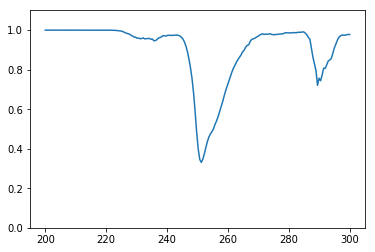

Test 161
True spectrum: 


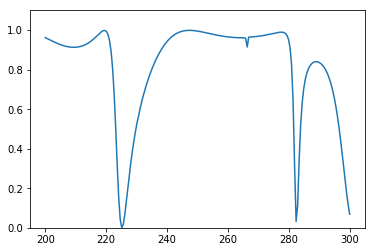

Predicted spectrum: 


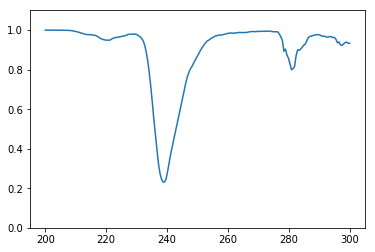

Test 162
True spectrum: 


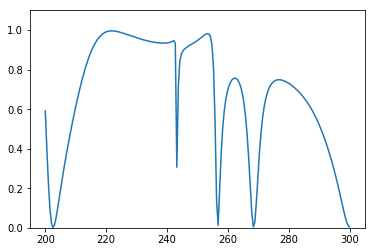

Predicted spectrum: 


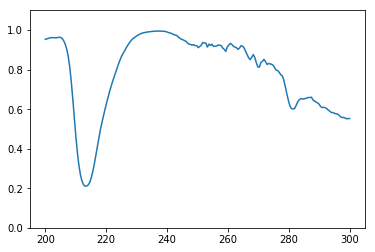

Test 163
True spectrum: 


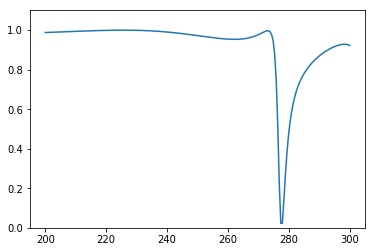

Predicted spectrum: 


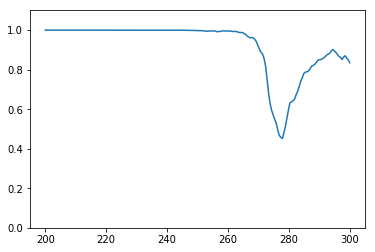

Test 164
True spectrum: 


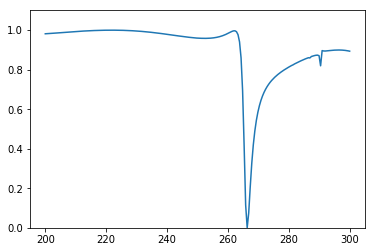

Predicted spectrum: 


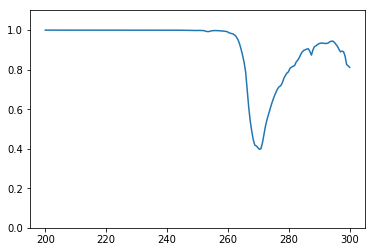

Test 165
True spectrum: 


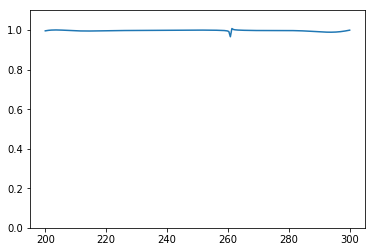

Predicted spectrum: 


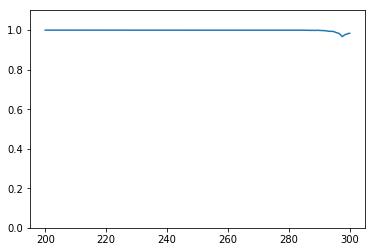

Test 166
True spectrum: 


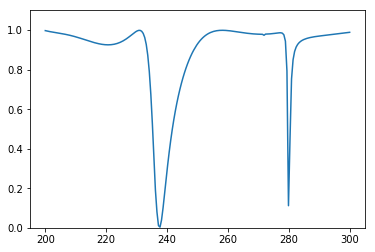

Predicted spectrum: 


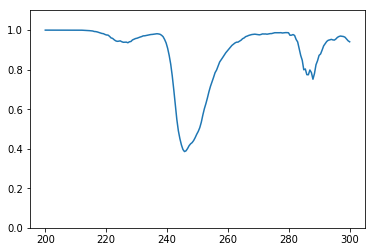

Test 167
True spectrum: 


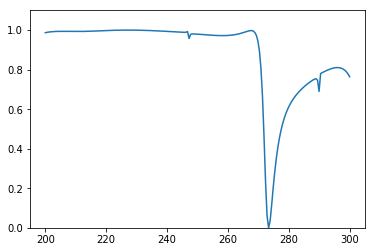

Predicted spectrum: 


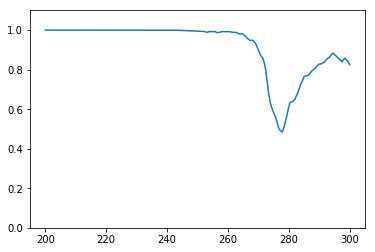

Test 168
True spectrum: 


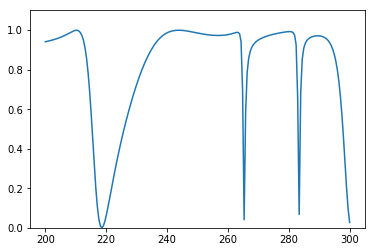

Predicted spectrum: 


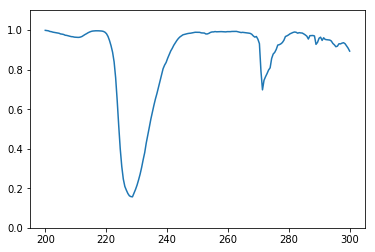

Test 169
True spectrum: 


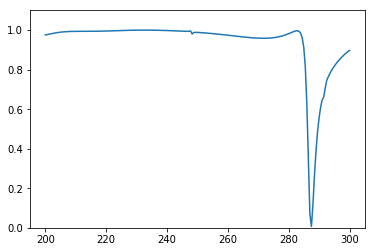

Predicted spectrum: 


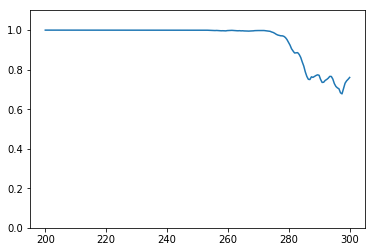

Test 170
True spectrum: 


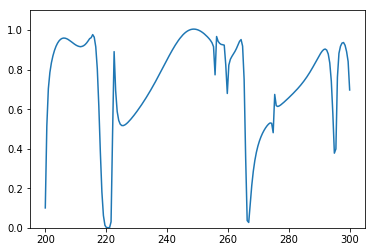

Predicted spectrum: 


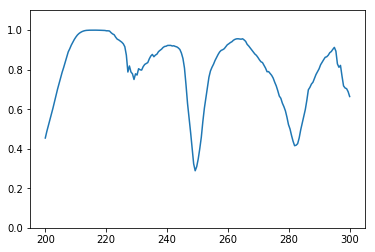

Test 171
True spectrum: 


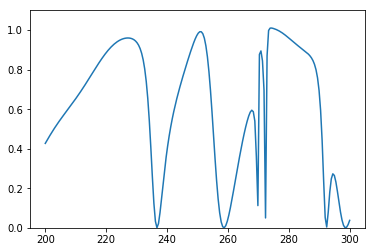

Predicted spectrum: 


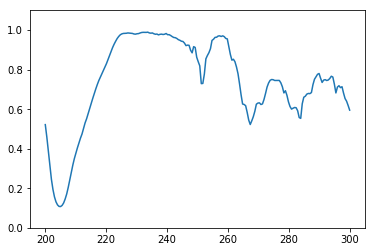

Test 172
True spectrum: 


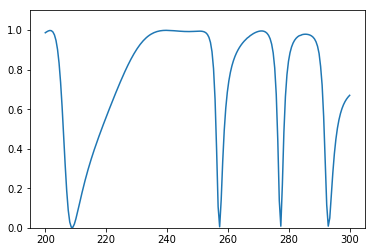

Predicted spectrum: 


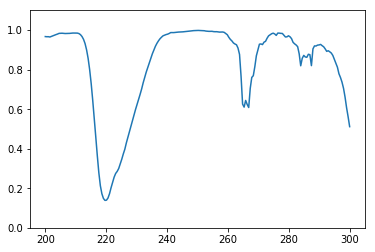

Test 173
True spectrum: 


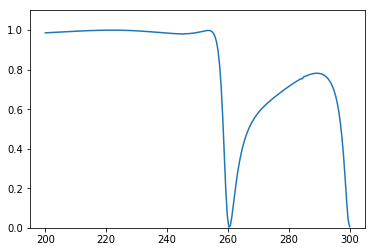

Predicted spectrum: 


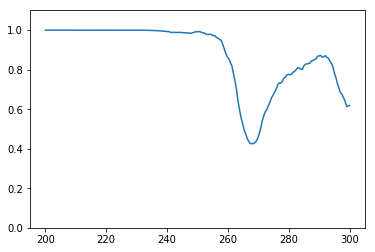

Test 174
True spectrum: 


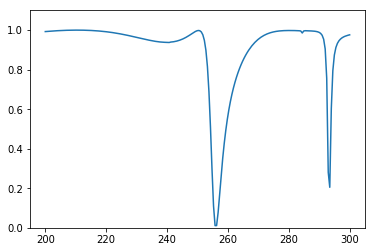

Predicted spectrum: 


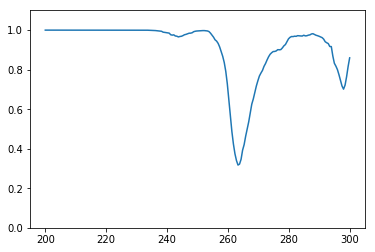

Test 175
True spectrum: 


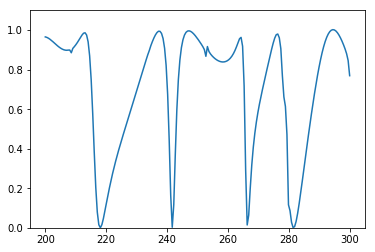

Predicted spectrum: 


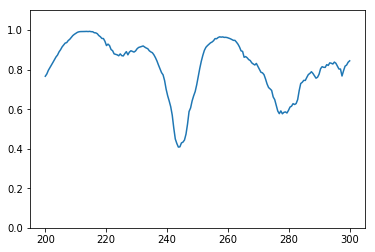

Test 176
True spectrum: 


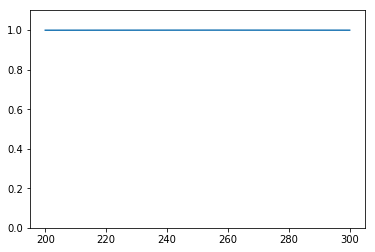

Predicted spectrum: 


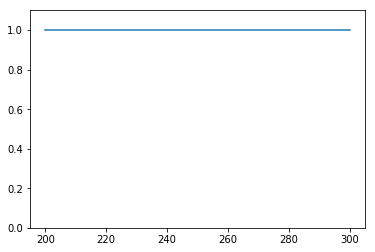

Test 177
True spectrum: 


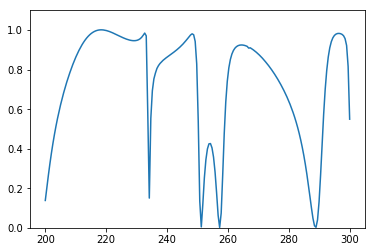

Predicted spectrum: 


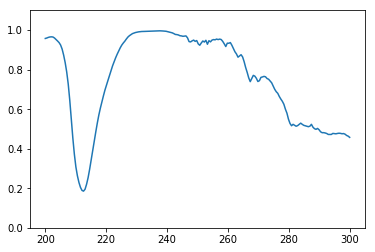

Test 178
True spectrum: 


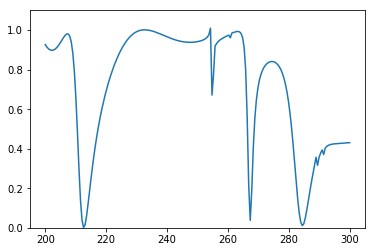

Predicted spectrum: 


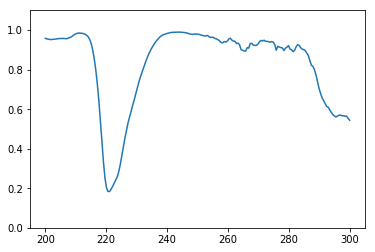

Test 179
True spectrum: 


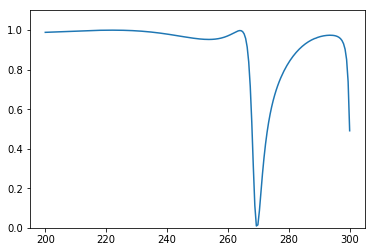

Predicted spectrum: 


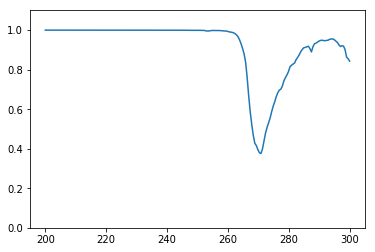

Test 180
True spectrum: 


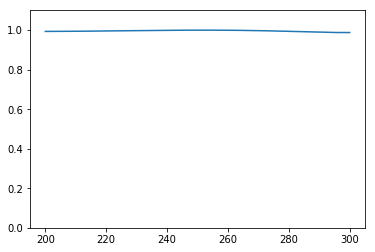

Predicted spectrum: 


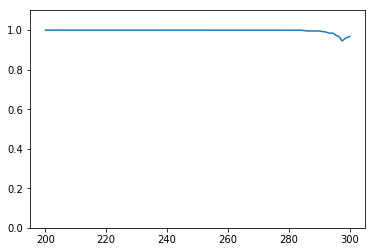

Test 181
True spectrum: 


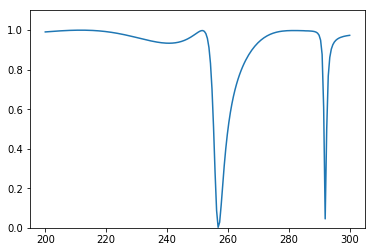

Predicted spectrum: 


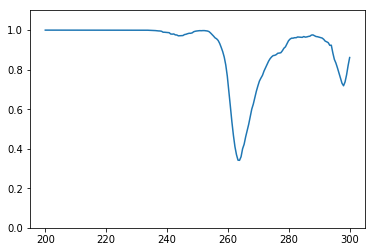

Test 182
True spectrum: 


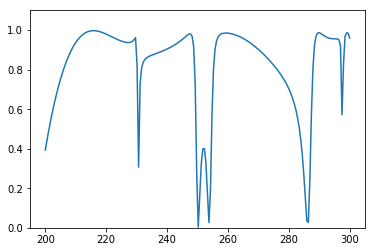

Predicted spectrum: 


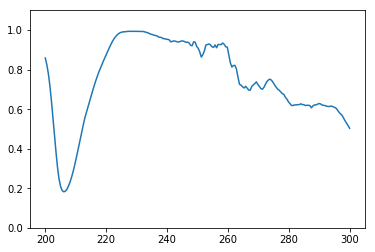

Test 183
True spectrum: 


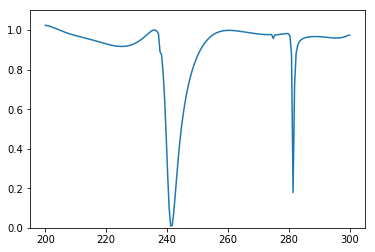

Predicted spectrum: 


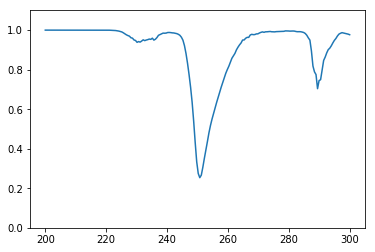

Test 184
True spectrum: 


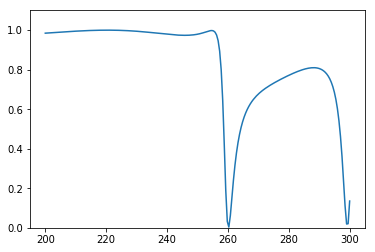

Predicted spectrum: 


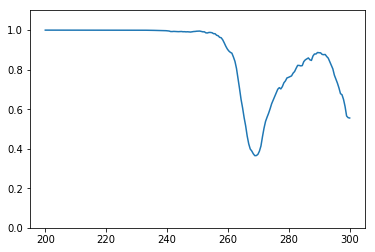

Test 185
True spectrum: 


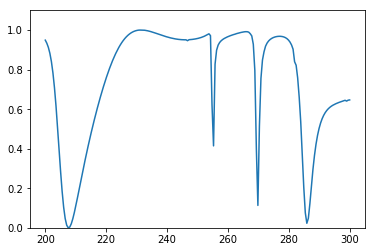

Predicted spectrum: 


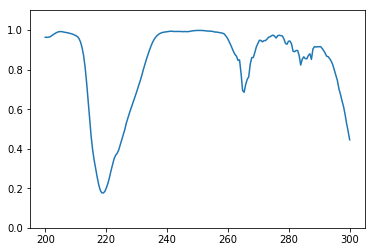

Test 186
True spectrum: 


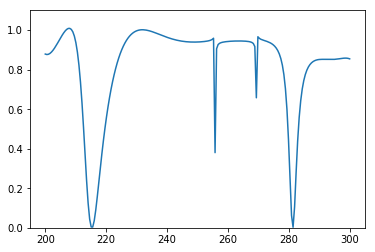

Predicted spectrum: 


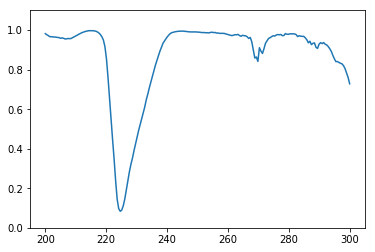

Test 187
True spectrum: 


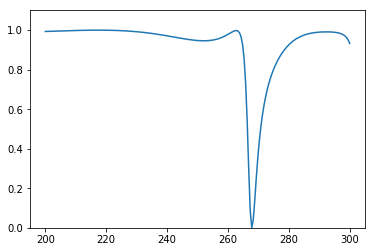

Predicted spectrum: 


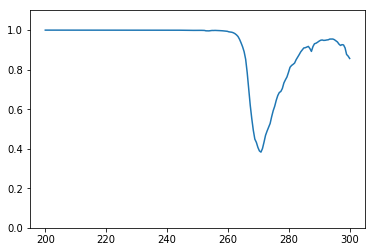

Test 188
True spectrum: 


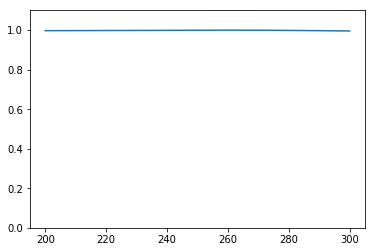

Predicted spectrum: 


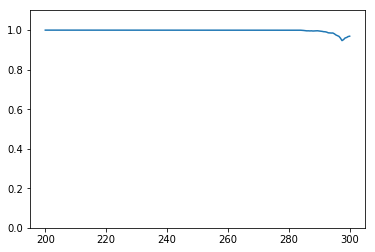

Test 189
True spectrum: 


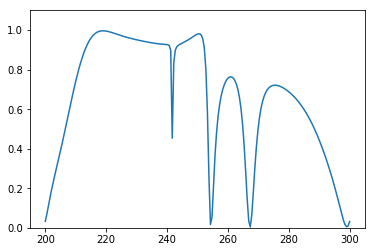

Predicted spectrum: 


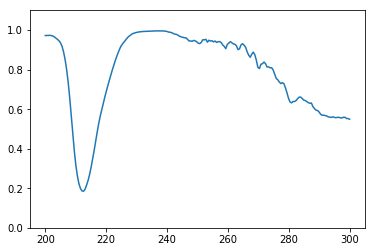

Test 190
True spectrum: 


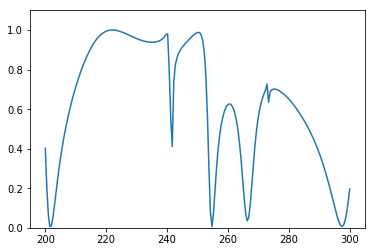

Predicted spectrum: 


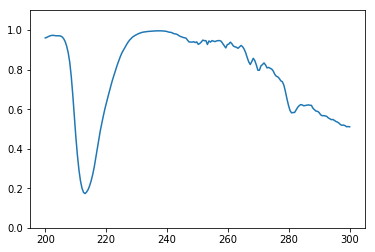

Test 191
True spectrum: 


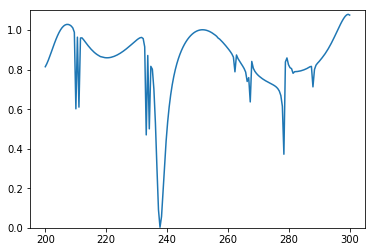

Predicted spectrum: 


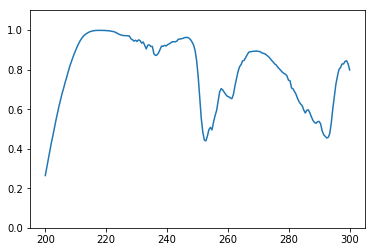

Test 192
True spectrum: 


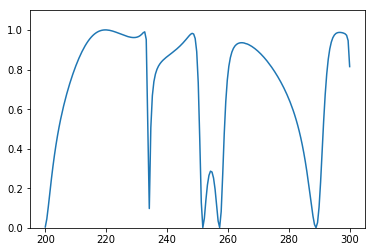

Predicted spectrum: 


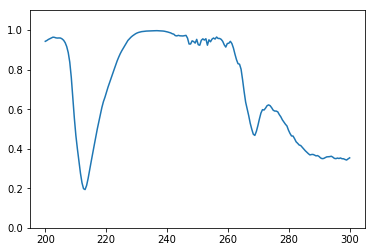

Test 193
True spectrum: 


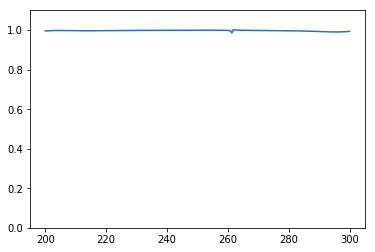

Predicted spectrum: 


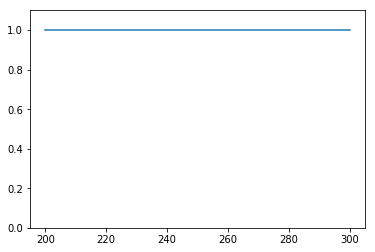

Test 194
True spectrum: 


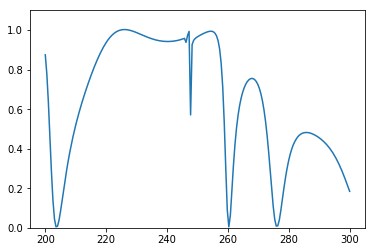

Predicted spectrum: 


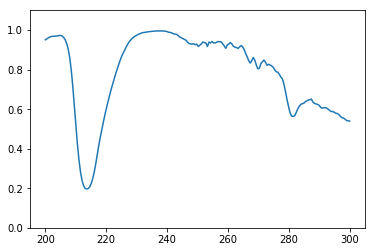

Test 195
True spectrum: 


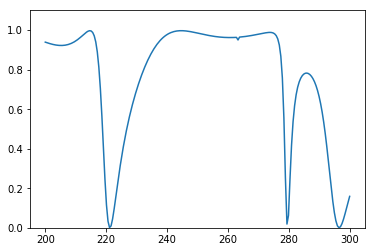

Predicted spectrum: 


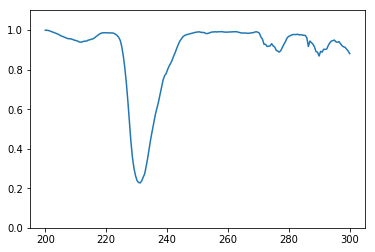

Test 196
True spectrum: 


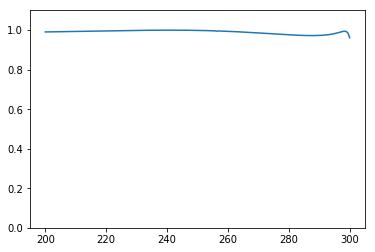

Predicted spectrum: 


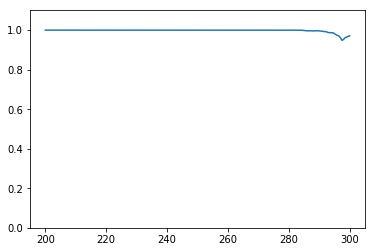

Test 197
True spectrum: 


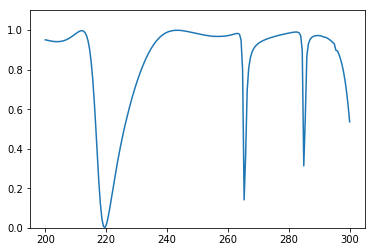

Predicted spectrum: 


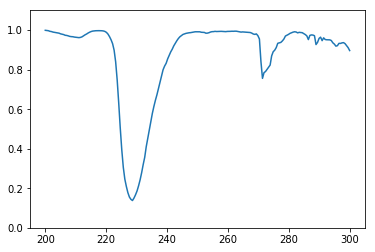

Test 198
True spectrum: 


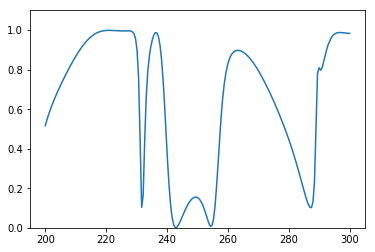

Predicted spectrum: 


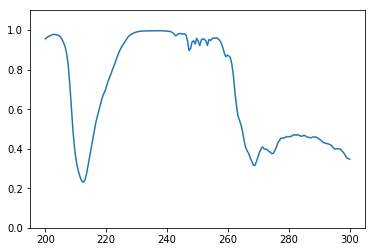

Test 199
True spectrum: 


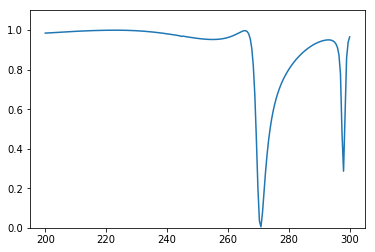

Predicted spectrum: 


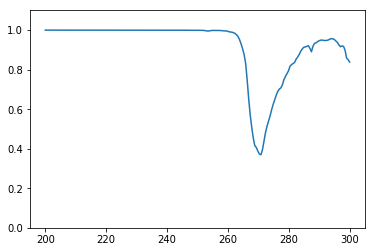

Test 200
True spectrum: 


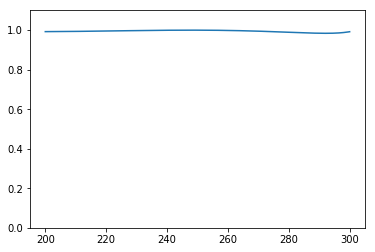

Predicted spectrum: 


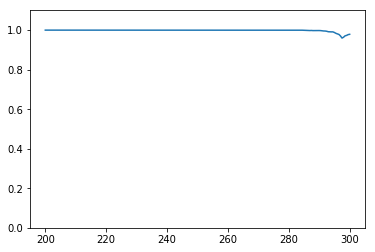

Test 201
True spectrum: 


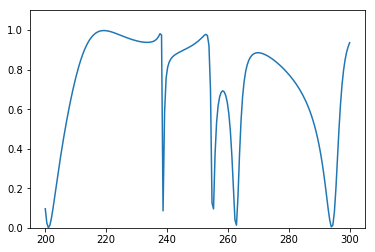

Predicted spectrum: 


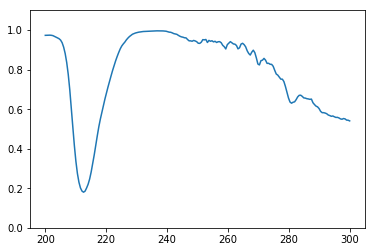

Test 202
True spectrum: 


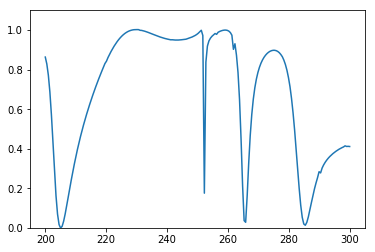

Predicted spectrum: 


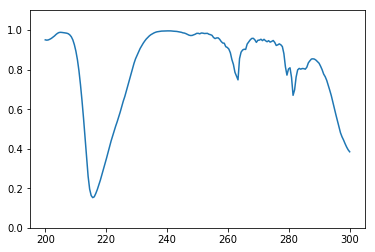

Test 203
True spectrum: 


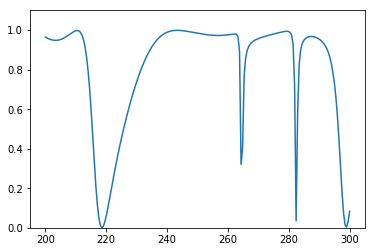

Predicted spectrum: 


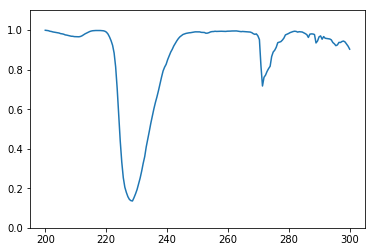

Test 204
True spectrum: 


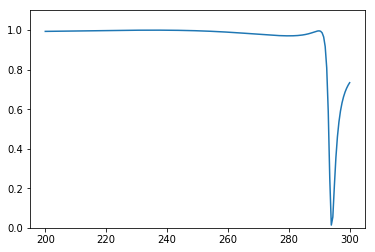

Predicted spectrum: 


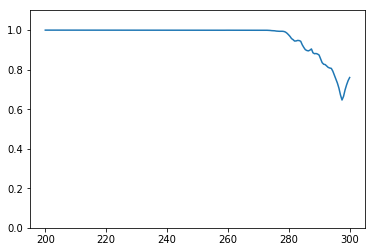

Test 205
True spectrum: 


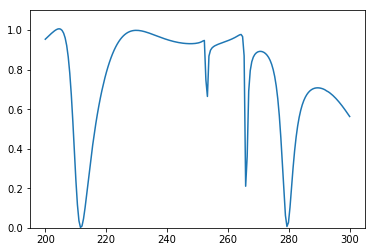

Predicted spectrum: 


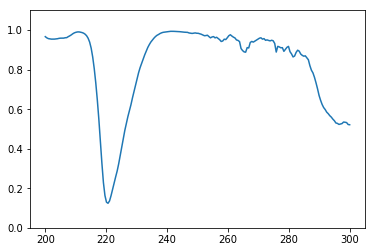

Test 206
True spectrum: 


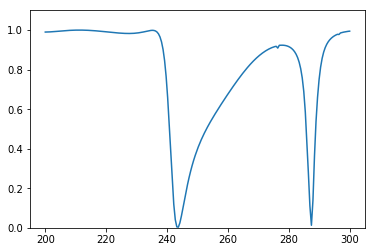

Predicted spectrum: 


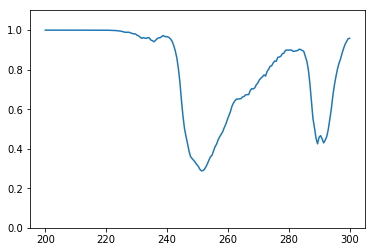

Test 207
True spectrum: 


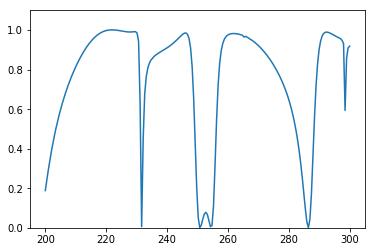

Predicted spectrum: 


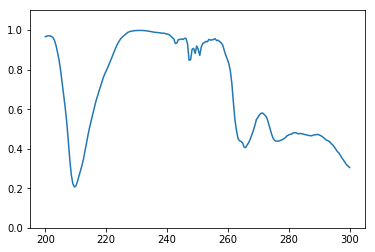

Test 208
True spectrum: 


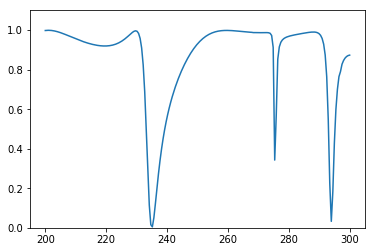

Predicted spectrum: 


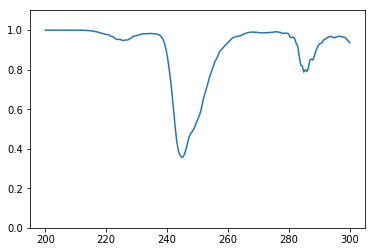

Test 209
True spectrum: 


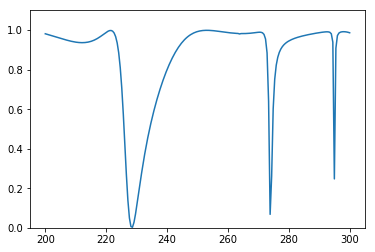

Predicted spectrum: 


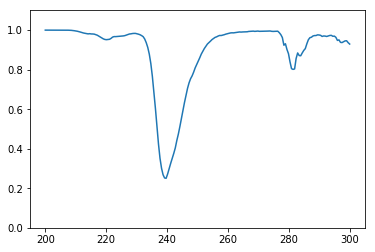

Test 210
True spectrum: 


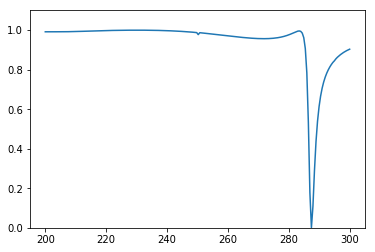

Predicted spectrum: 


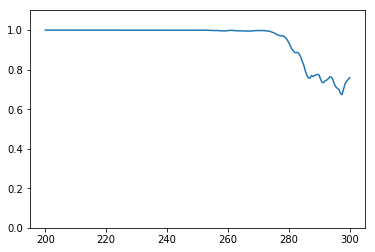

Test 211
True spectrum: 


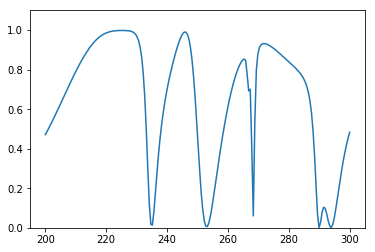

Predicted spectrum: 


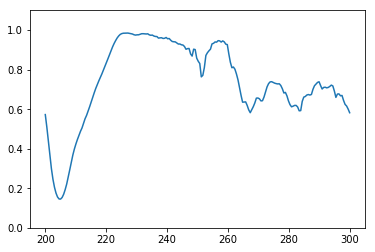

Test 212
True spectrum: 


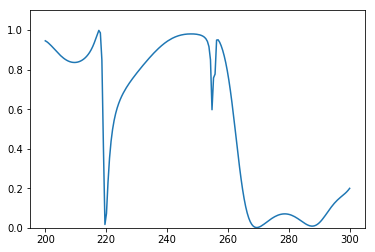

Predicted spectrum: 


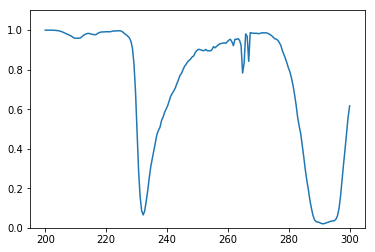

Test 213
True spectrum: 


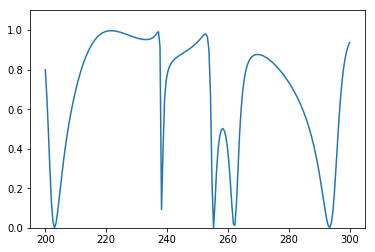

Predicted spectrum: 


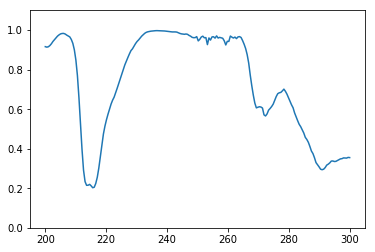

Test 214
True spectrum: 


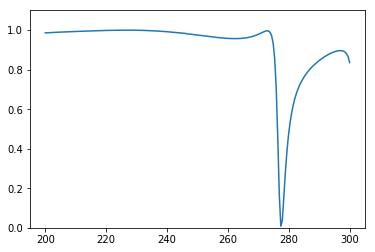

Predicted spectrum: 


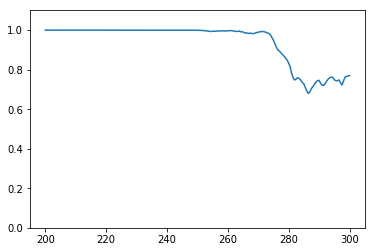

Test 215
True spectrum: 


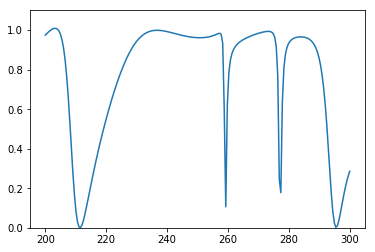

Predicted spectrum: 


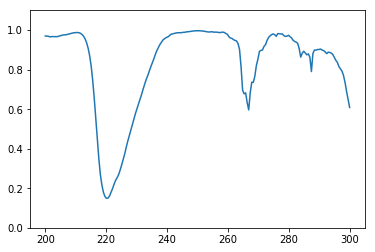

Test 216
True spectrum: 


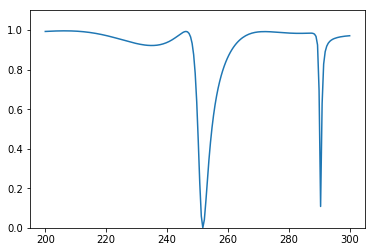

Predicted spectrum: 


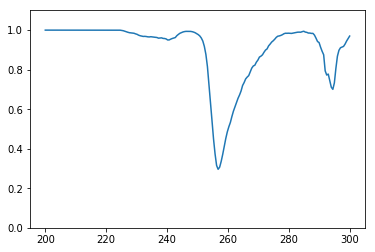

Test 217
True spectrum: 


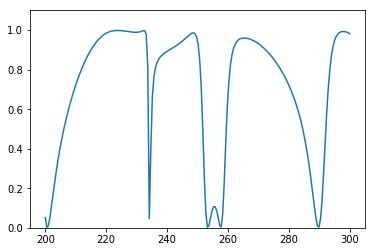

Predicted spectrum: 


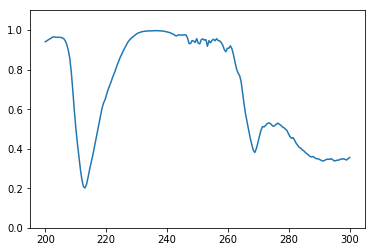

Test 218
True spectrum: 


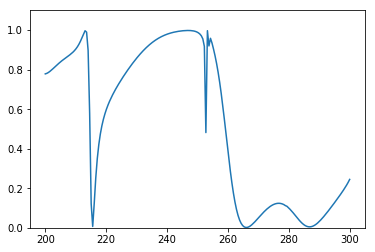

Predicted spectrum: 


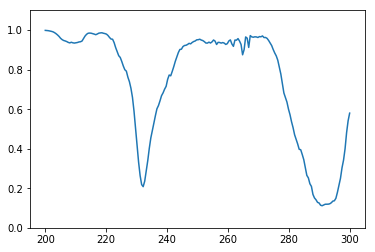

Test 219
True spectrum: 


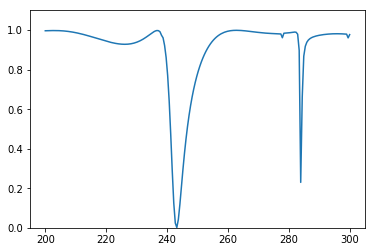

Predicted spectrum: 


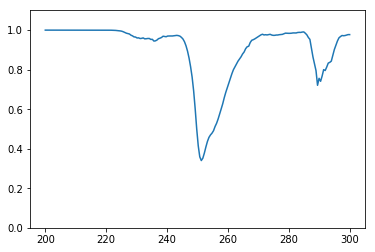

Test 220
True spectrum: 


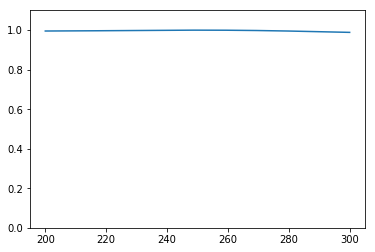

Predicted spectrum: 


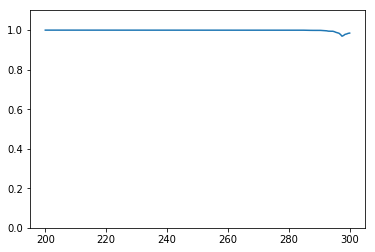

Test 221
True spectrum: 


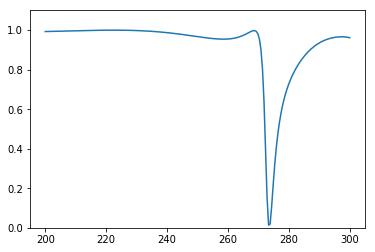

Predicted spectrum: 


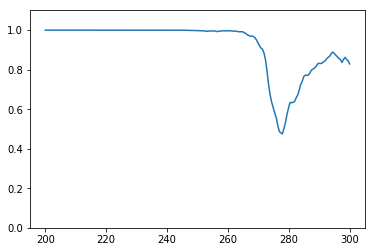

Test 222
True spectrum: 


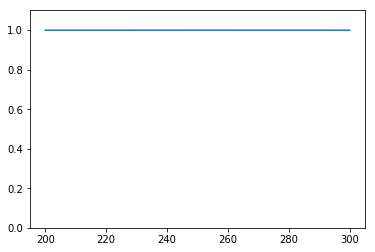

Predicted spectrum: 


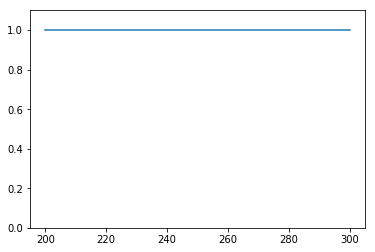

Test 223
True spectrum: 


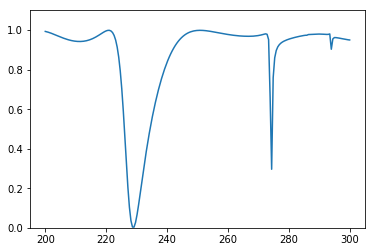

Predicted spectrum: 


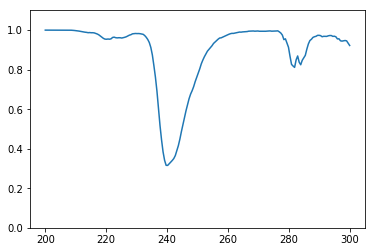

Test 224
True spectrum: 


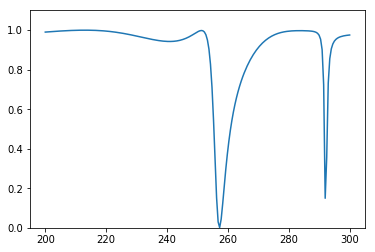

Predicted spectrum: 


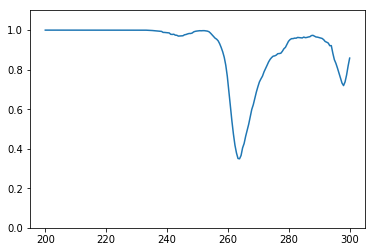

Test 225
True spectrum: 


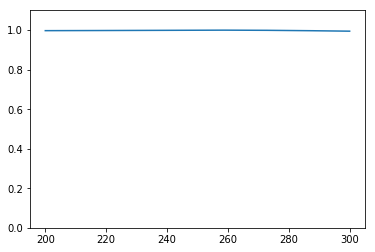

Predicted spectrum: 


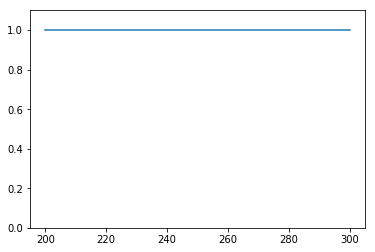

Test 226
True spectrum: 


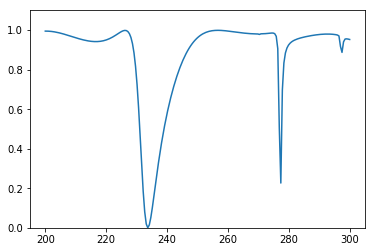

Predicted spectrum: 


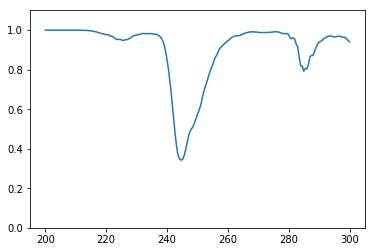

Test 227
True spectrum: 


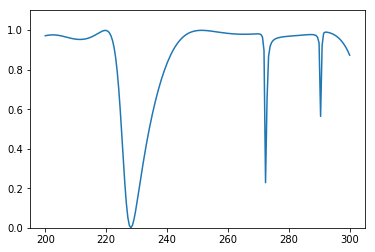

Predicted spectrum: 


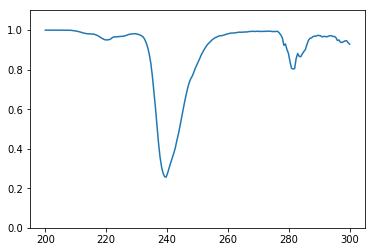

Test 228
True spectrum: 


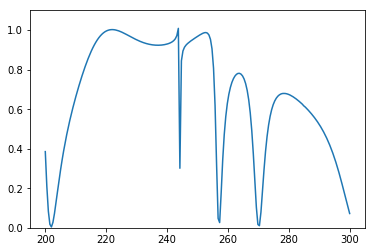

Predicted spectrum: 


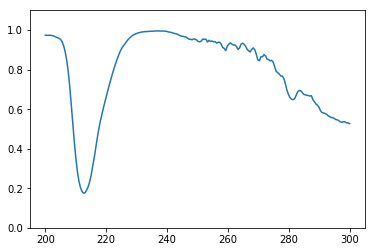

Test 229
True spectrum: 


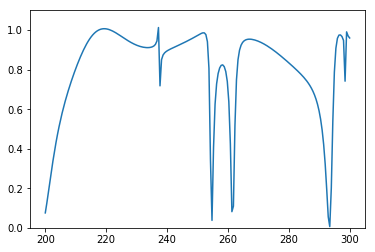

Predicted spectrum: 


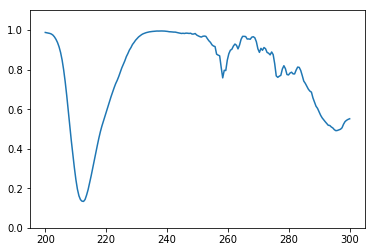

Test 230
True spectrum: 


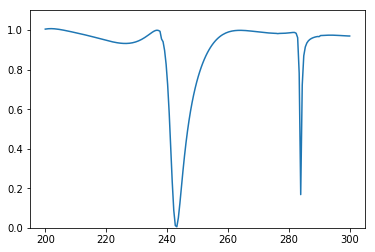

Predicted spectrum: 


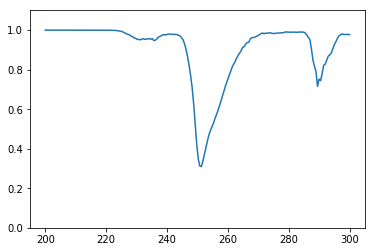

Test 231
True spectrum: 


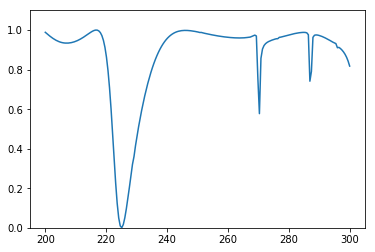

Predicted spectrum: 


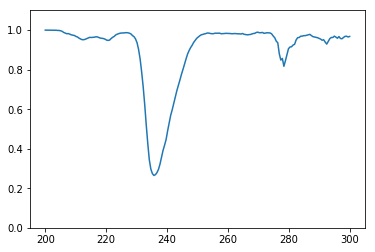

Test 232
True spectrum: 


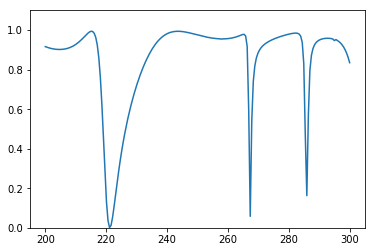

Predicted spectrum: 


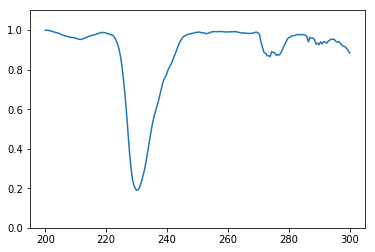

Test 233
True spectrum: 


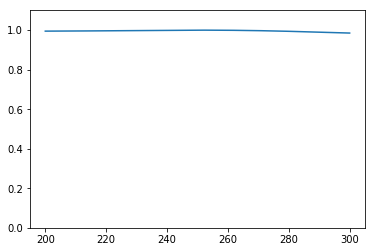

Predicted spectrum: 


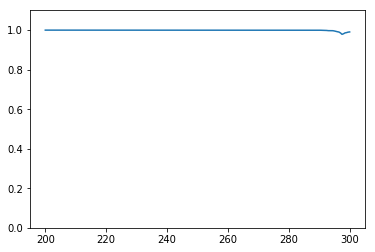

Test 234
True spectrum: 


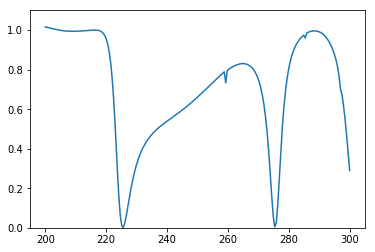

Predicted spectrum: 


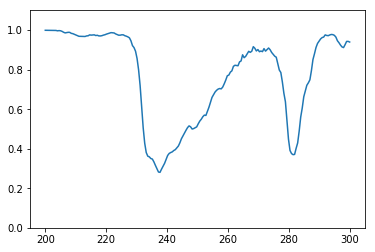

Test 235
True spectrum: 


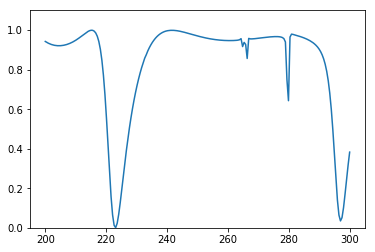

Predicted spectrum: 


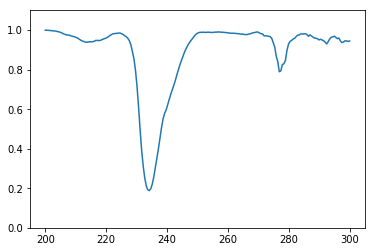

Test 236
True spectrum: 


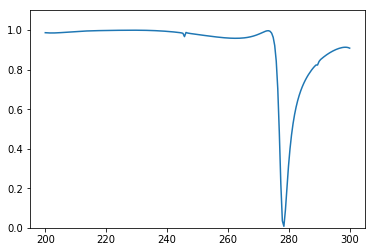

Predicted spectrum: 


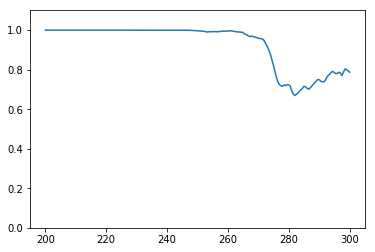

Test 237
True spectrum: 


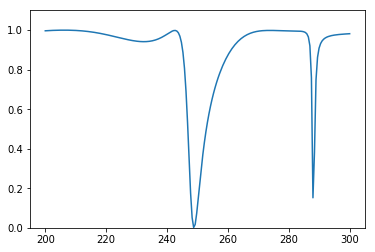

Predicted spectrum: 


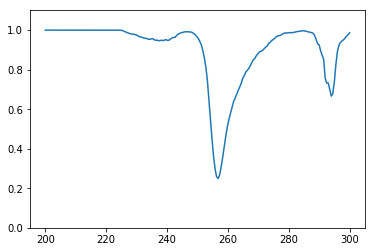

Test 238
True spectrum: 


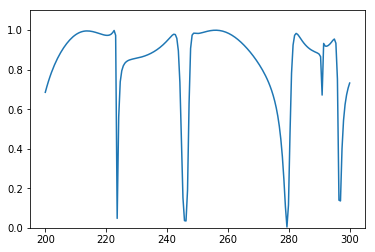

Predicted spectrum: 


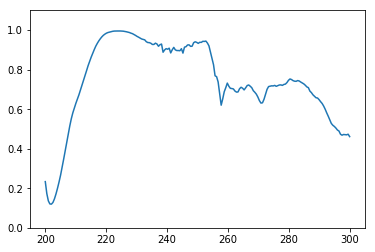

Test 239
True spectrum: 


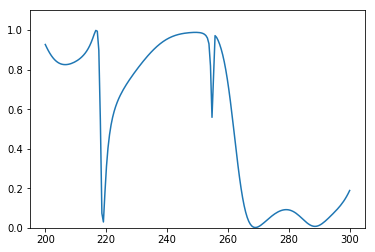

Predicted spectrum: 


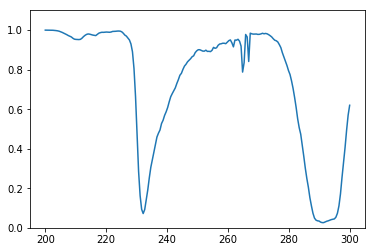

Test 240
True spectrum: 


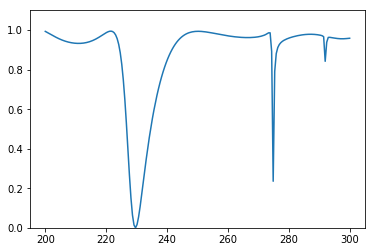

Predicted spectrum: 


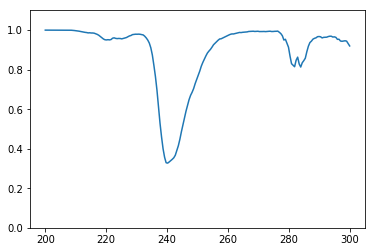

Test 241
True spectrum: 


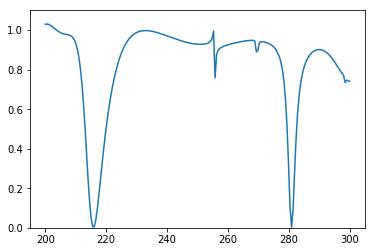

Predicted spectrum: 


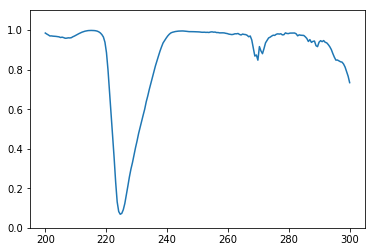

Test 242
True spectrum: 


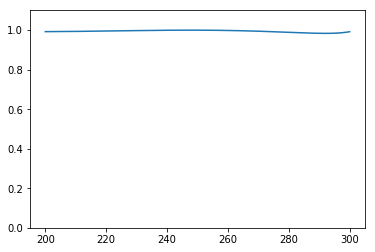

Predicted spectrum: 


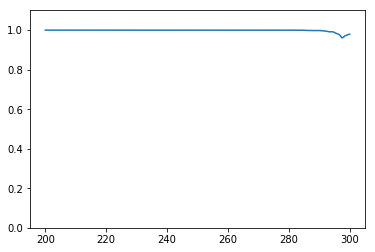

Test 243
True spectrum: 


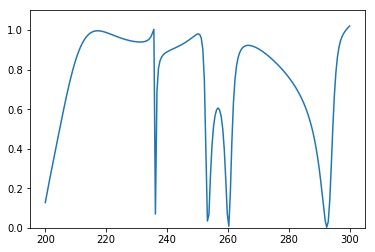

Predicted spectrum: 


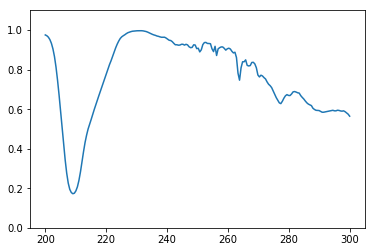

Test 244
True spectrum: 


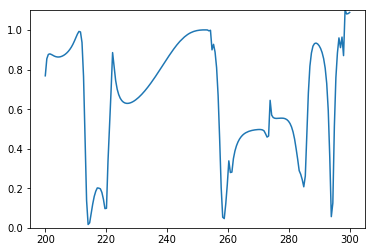

Predicted spectrum: 


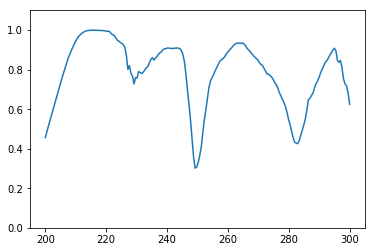

Test 245
True spectrum: 


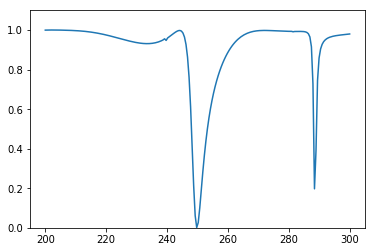

Predicted spectrum: 


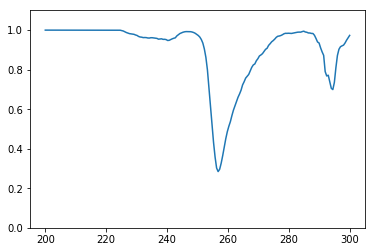

Test 246
True spectrum: 


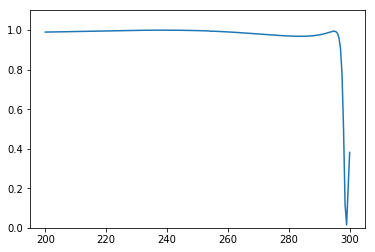

Predicted spectrum: 


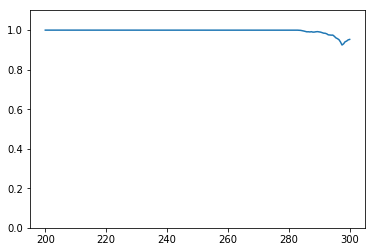

Test 247
True spectrum: 


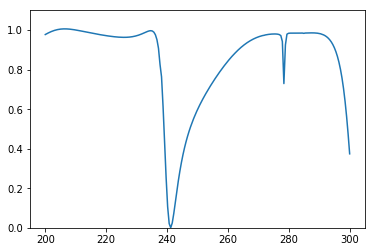

Predicted spectrum: 


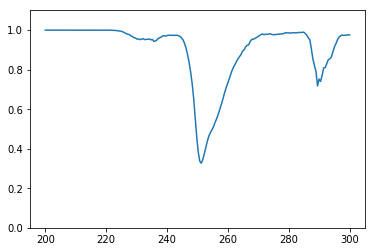

Test 248
True spectrum: 


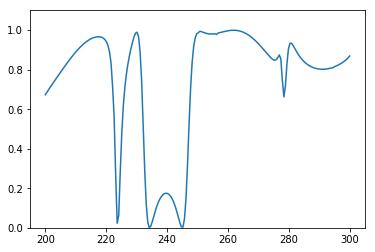

Predicted spectrum: 


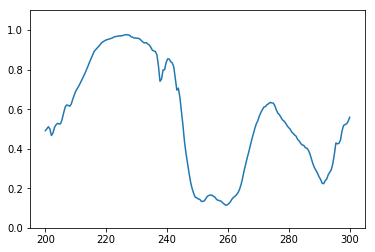

Test 249
True spectrum: 


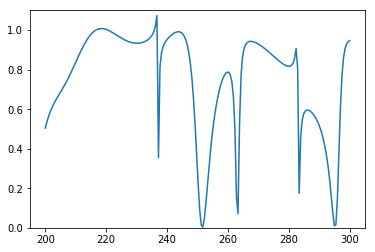

Predicted spectrum: 


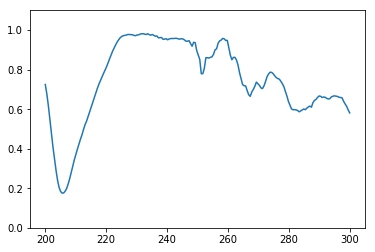

Test 250
True spectrum: 


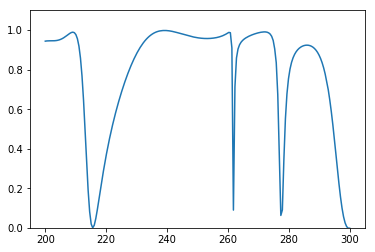

Predicted spectrum: 


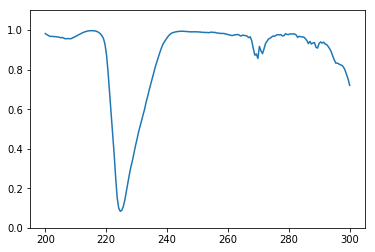

Test 251
True spectrum: 


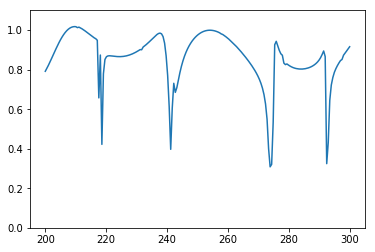

Predicted spectrum: 


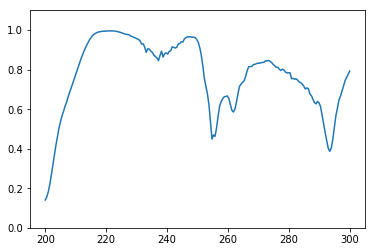

Test 252
True spectrum: 


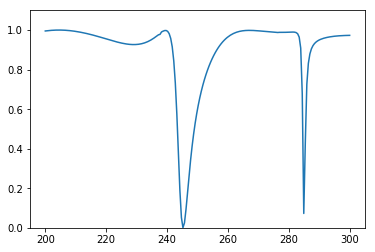

Predicted spectrum: 


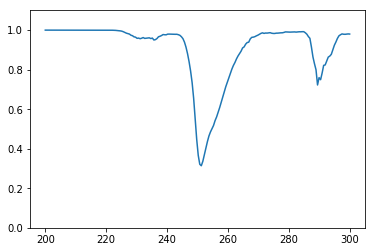

Test 253
True spectrum: 


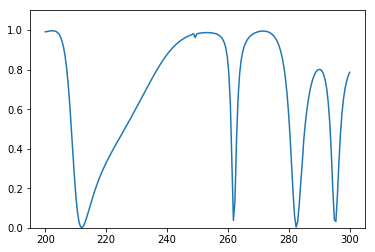

Predicted spectrum: 


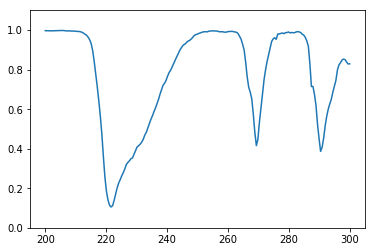

Test 254
True spectrum: 


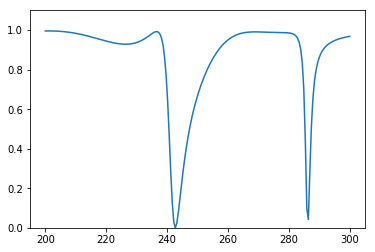

Predicted spectrum: 


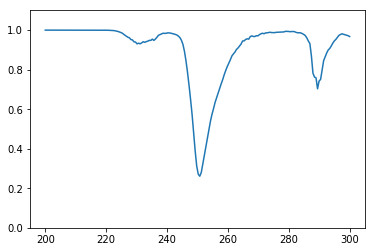

Test 255
True spectrum: 


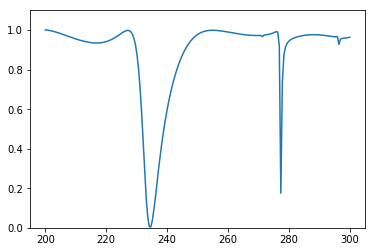

Predicted spectrum: 


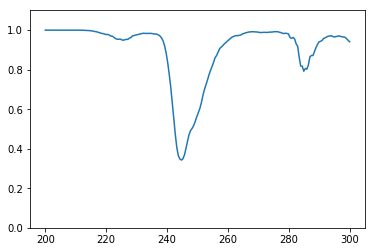

Test 256
True spectrum: 


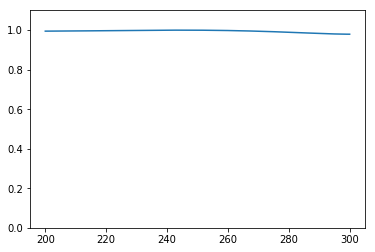

Predicted spectrum: 


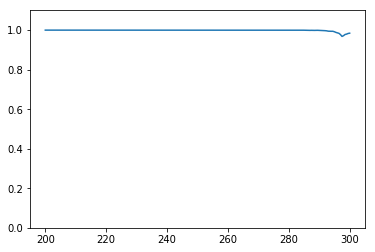

Test 257
True spectrum: 


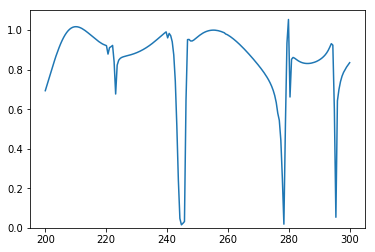

Predicted spectrum: 


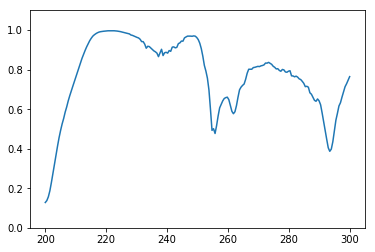

Test 258
True spectrum: 


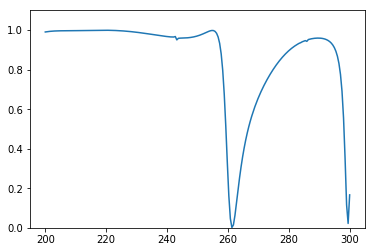

Predicted spectrum: 


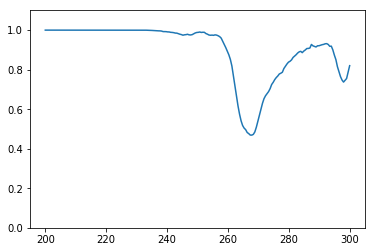

Test 259
True spectrum: 


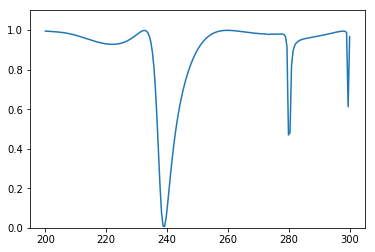

Predicted spectrum: 


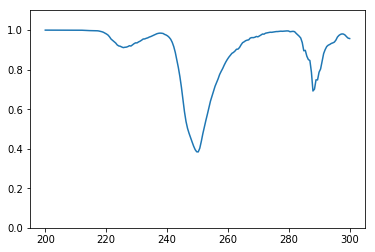

Test 260
True spectrum: 


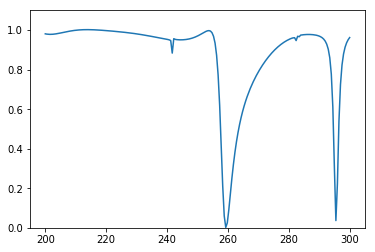

Predicted spectrum: 


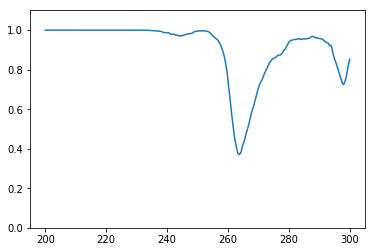

Test 261
True spectrum: 


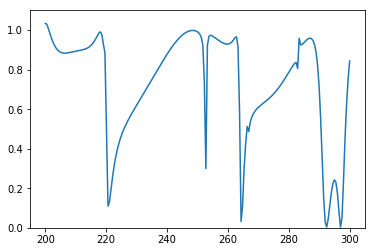

Predicted spectrum: 


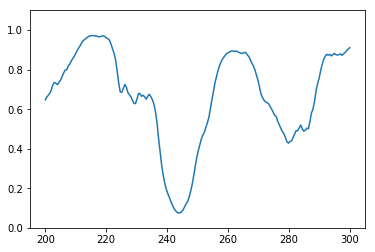

Test 262
True spectrum: 


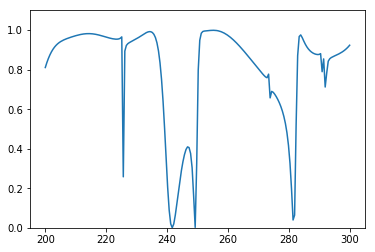

Predicted spectrum: 


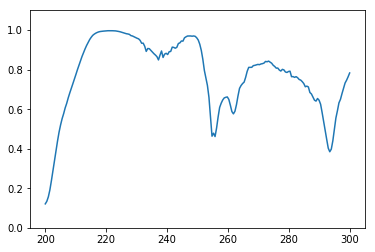

Test 263
True spectrum: 


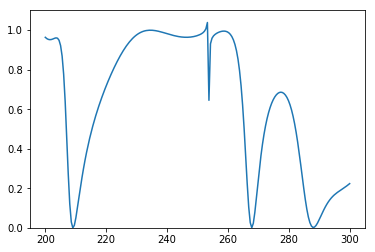

Predicted spectrum: 


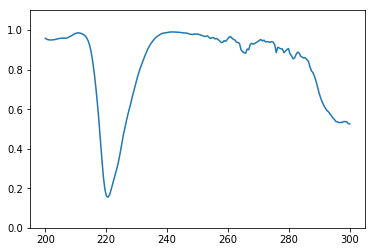

Test 264
True spectrum: 


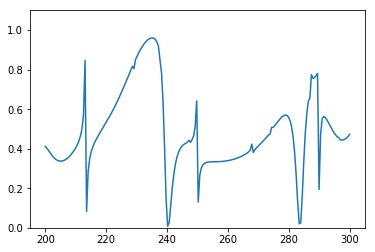

Predicted spectrum: 


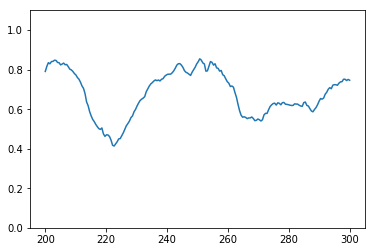

Test 265
True spectrum: 


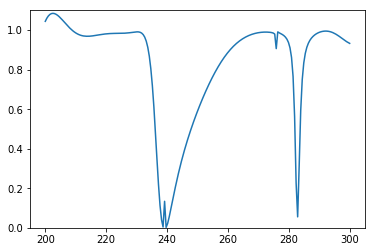

Predicted spectrum: 


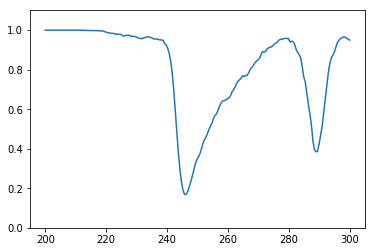

Test 266
True spectrum: 


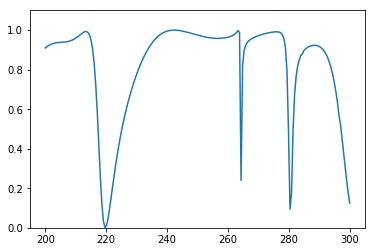

Predicted spectrum: 


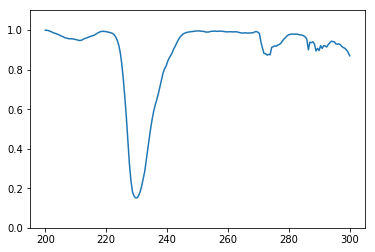

Test 267
True spectrum: 


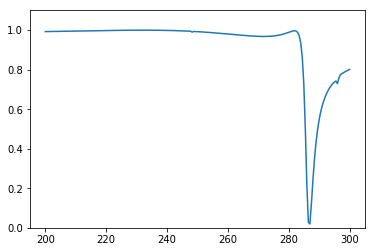

Predicted spectrum: 


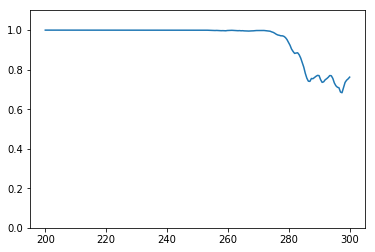

Test 268
True spectrum: 


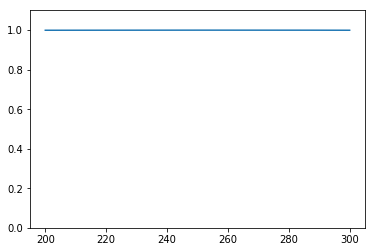

Predicted spectrum: 


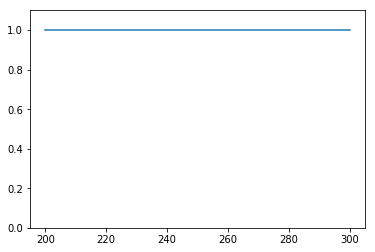

Test 269
True spectrum: 


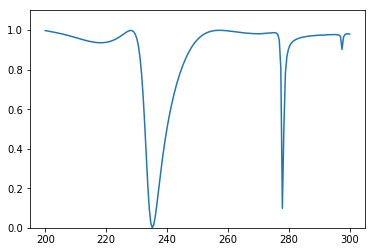

Predicted spectrum: 


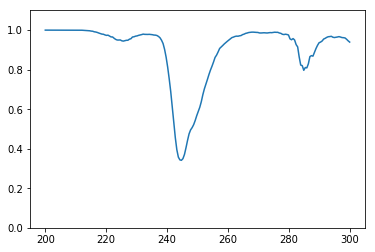

Test 270
True spectrum: 


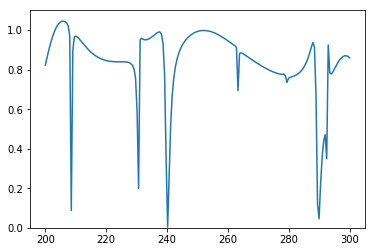

Predicted spectrum: 


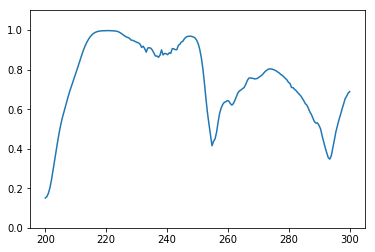

Test 271
True spectrum: 


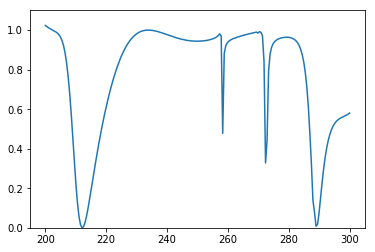

Predicted spectrum: 


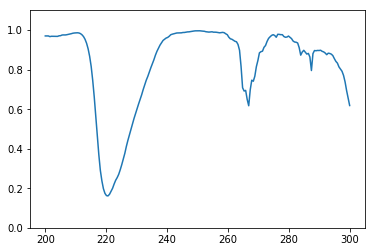

Test 272
True spectrum: 


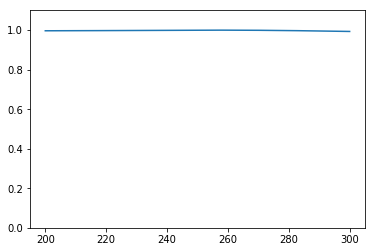

Predicted spectrum: 


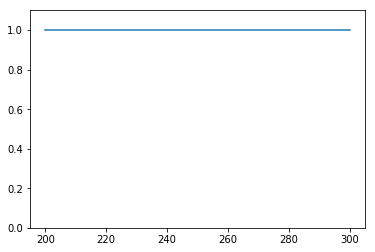

Test 273
True spectrum: 


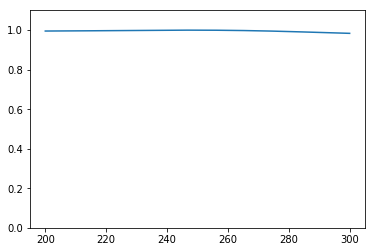

Predicted spectrum: 


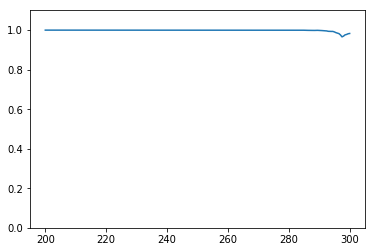

Test 274
True spectrum: 


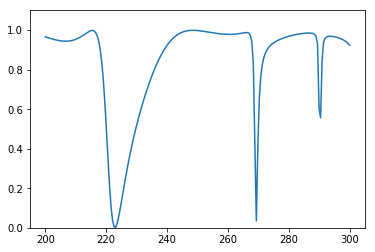

Predicted spectrum: 


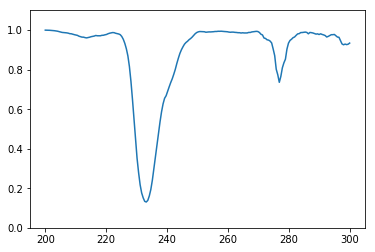

Test 275
True spectrum: 


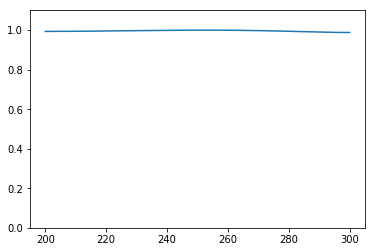

Predicted spectrum: 


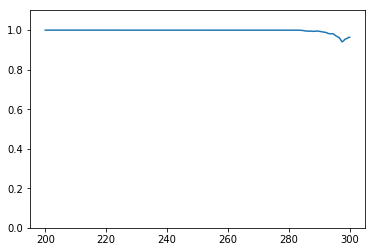

Test 276
True spectrum: 


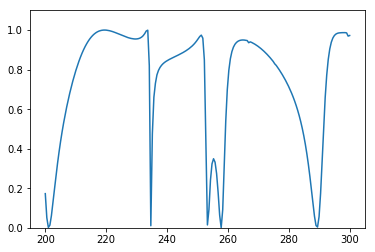

Predicted spectrum: 


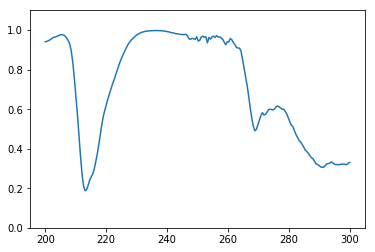

Test 277
True spectrum: 


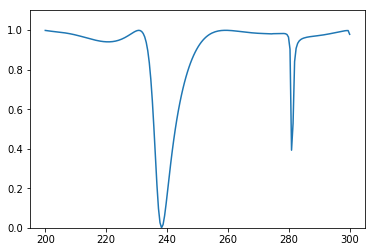

Predicted spectrum: 


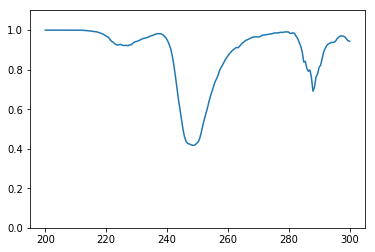

Test 278
True spectrum: 


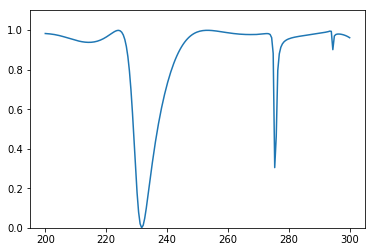

Predicted spectrum: 


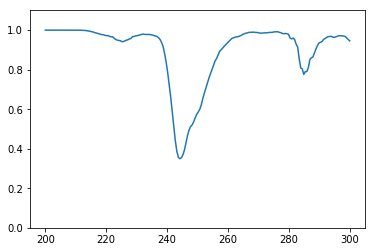

Test 279
True spectrum: 


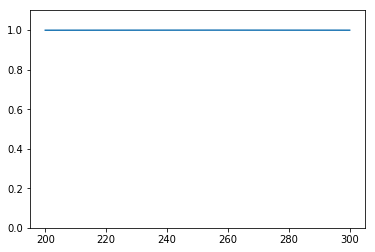

Predicted spectrum: 


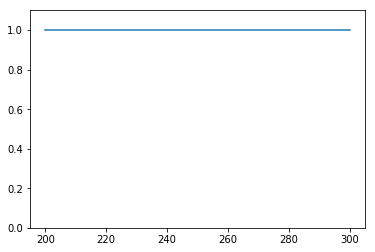

Test 280
True spectrum: 


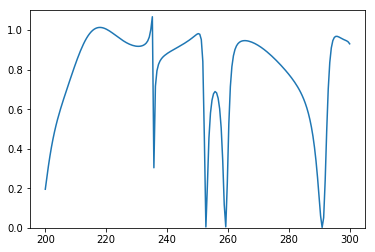

Predicted spectrum: 


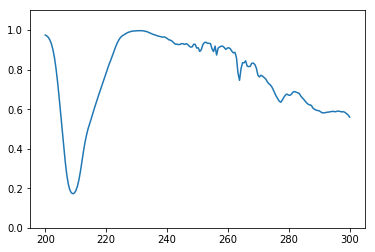

Test 281
True spectrum: 


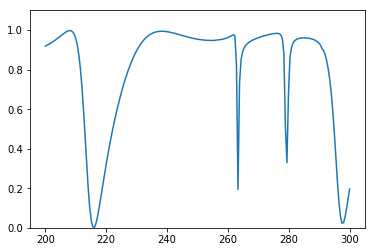

Predicted spectrum: 


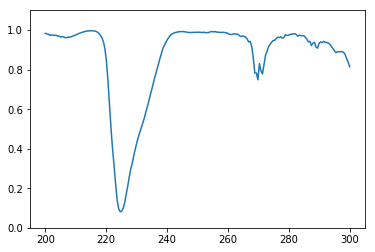

Test 282
True spectrum: 


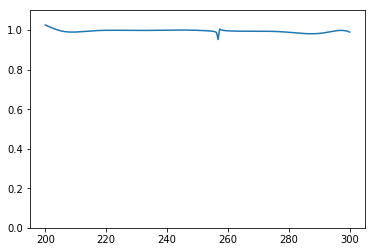

Predicted spectrum: 


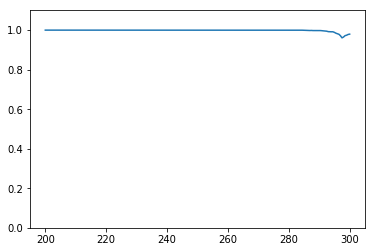

Test 283
True spectrum: 


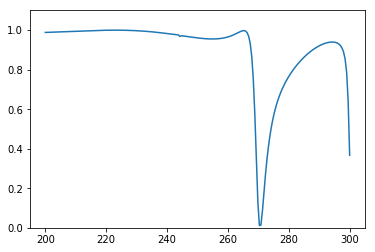

Predicted spectrum: 


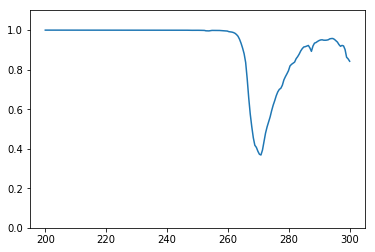

Test 284
True spectrum: 


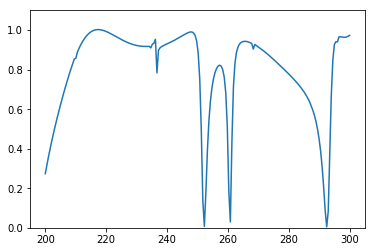

Predicted spectrum: 


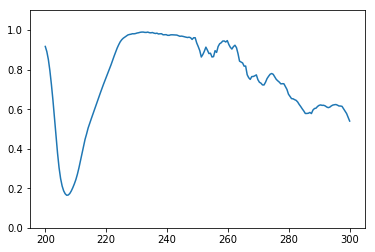

Test 285
True spectrum: 


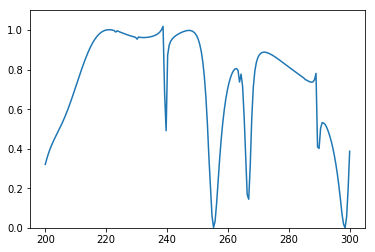

Predicted spectrum: 


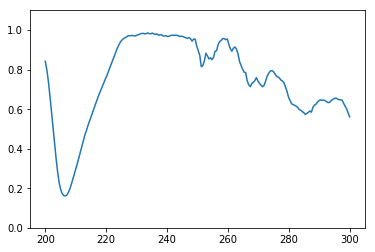

Test 286
True spectrum: 


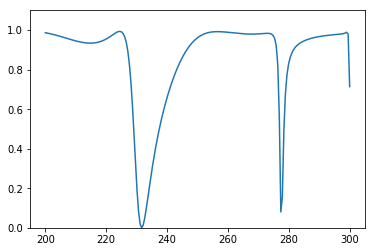

Predicted spectrum: 


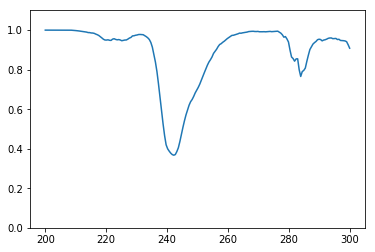

Test 287
True spectrum: 


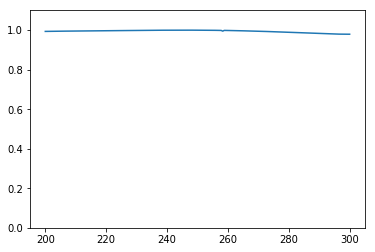

Predicted spectrum: 


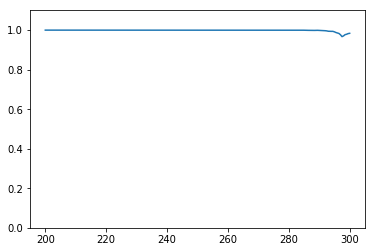

Test 288
True spectrum: 


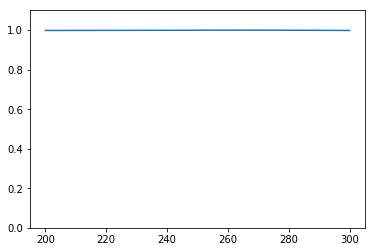

Predicted spectrum: 


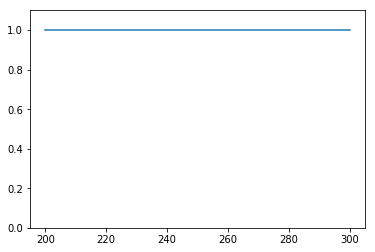

Test 289
True spectrum: 


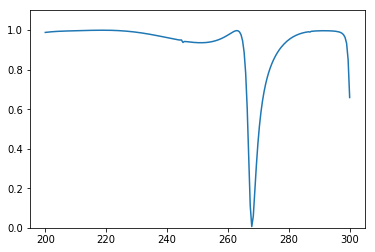

Predicted spectrum: 


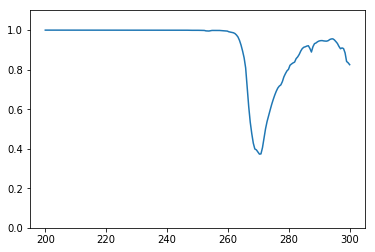

Test 290
True spectrum: 


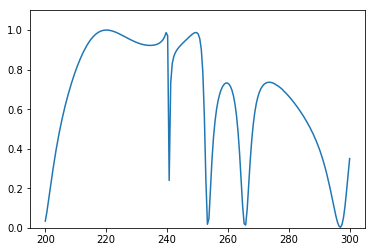

Predicted spectrum: 


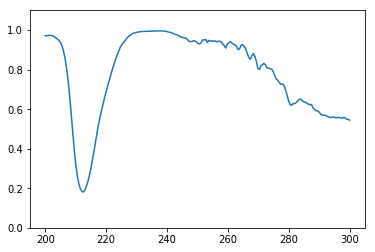

Test 291
True spectrum: 


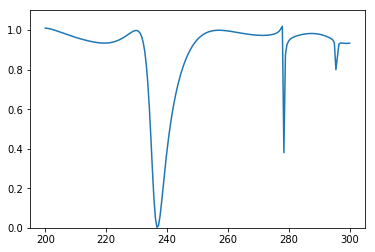

Predicted spectrum: 


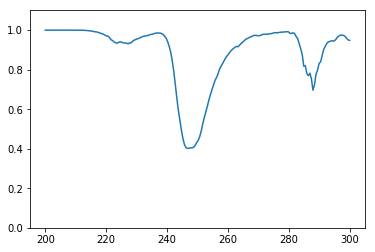

Test 292
True spectrum: 


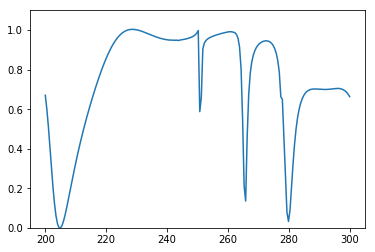

Predicted spectrum: 


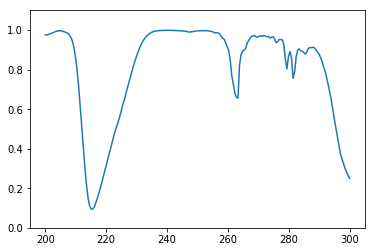

Test 293
True spectrum: 


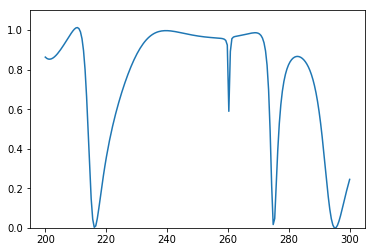

Predicted spectrum: 


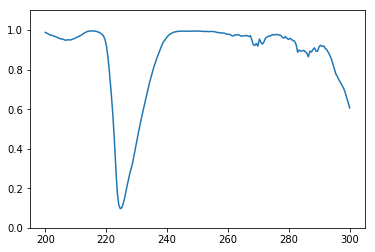

Test 294
True spectrum: 


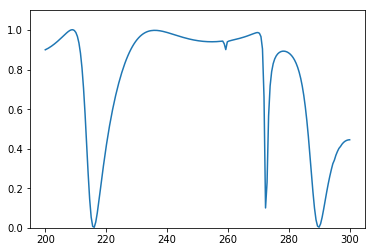

Predicted spectrum: 


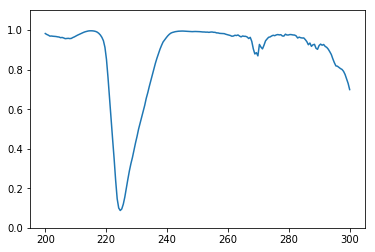

Test 295
True spectrum: 


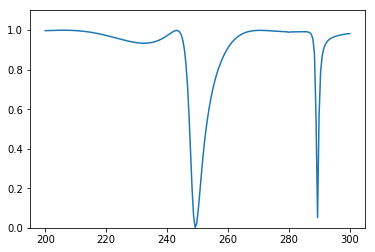

Predicted spectrum: 


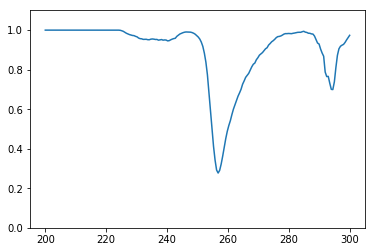

Test 296
True spectrum: 


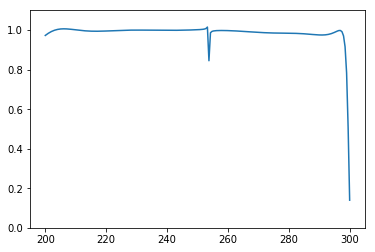

Predicted spectrum: 


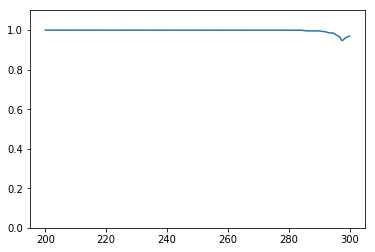

Test 297
True spectrum: 


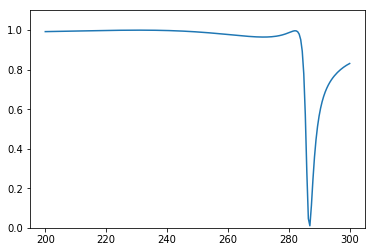

Predicted spectrum: 


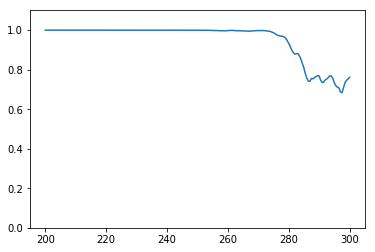

Test 298
True spectrum: 


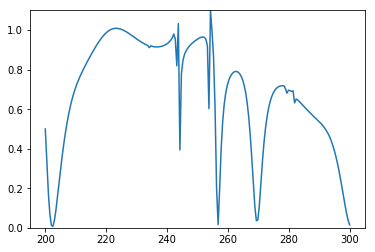

Predicted spectrum: 


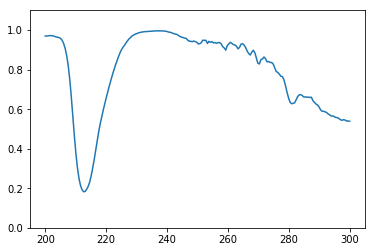

Test 299
True spectrum: 


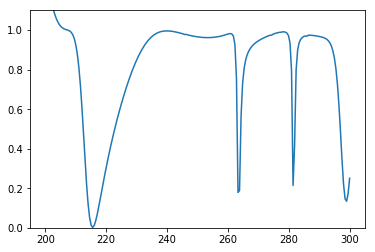

Predicted spectrum: 


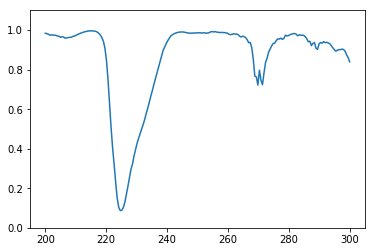

Test 300
True spectrum: 


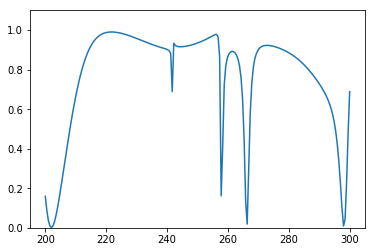

Predicted spectrum: 


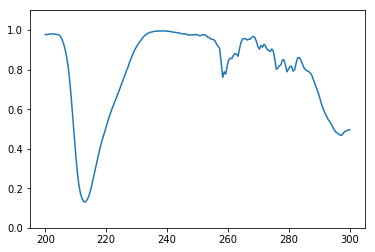

Test 301
True spectrum: 


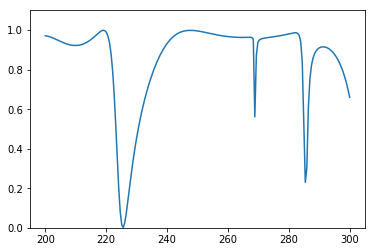

Predicted spectrum: 


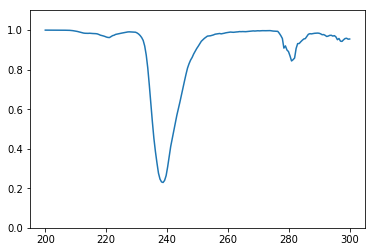

Test 302
True spectrum: 


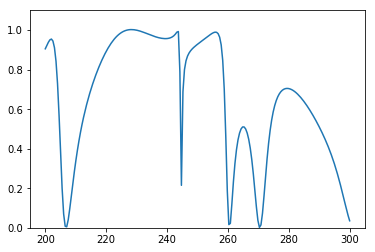

Predicted spectrum: 


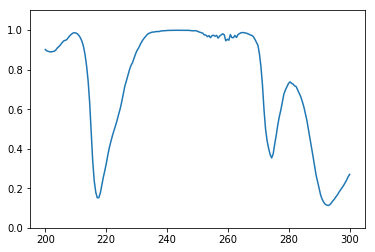

Test 303
True spectrum: 


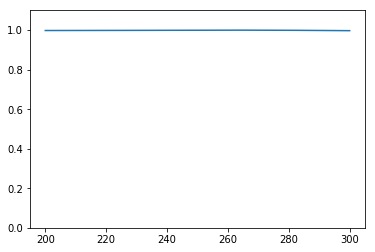

Predicted spectrum: 


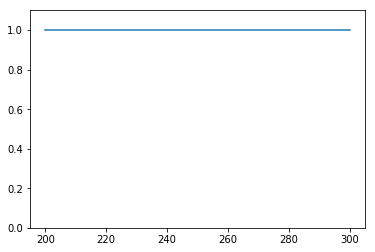

Test 304
True spectrum: 


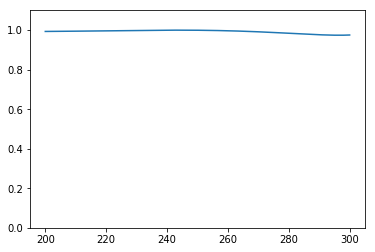

Predicted spectrum: 


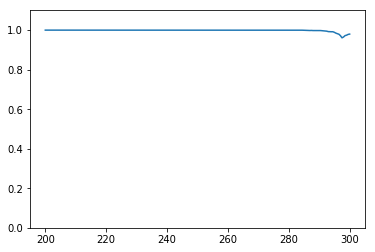

Test 305
True spectrum: 


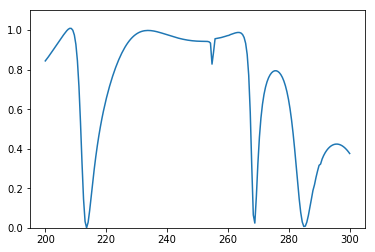

Predicted spectrum: 


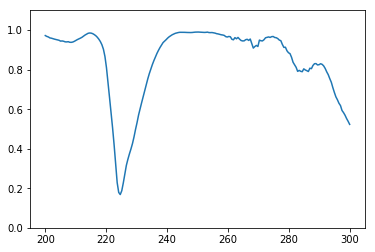

Test 306
True spectrum: 


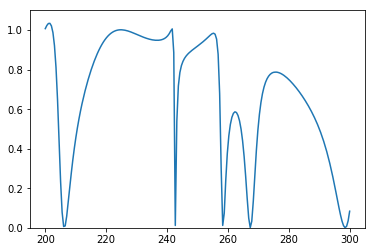

Predicted spectrum: 


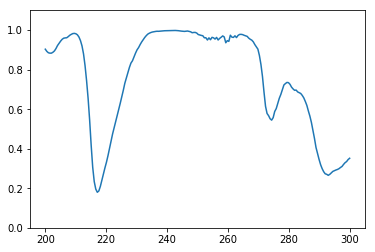

Test 307
True spectrum: 


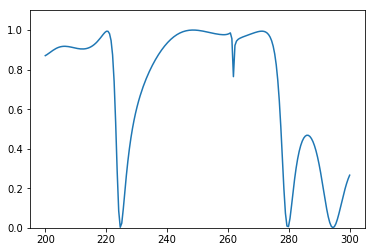

Predicted spectrum: 


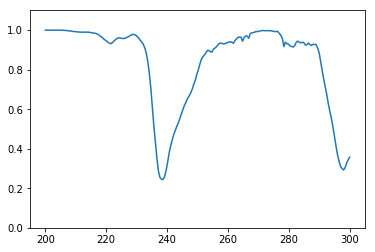

Test 308
True spectrum: 


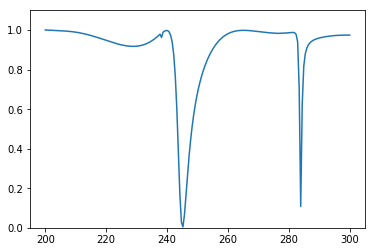

Predicted spectrum: 


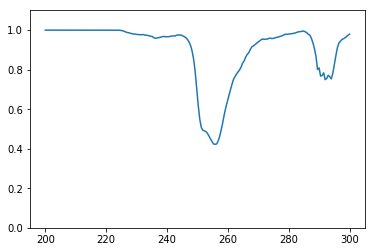

Test 309
True spectrum: 


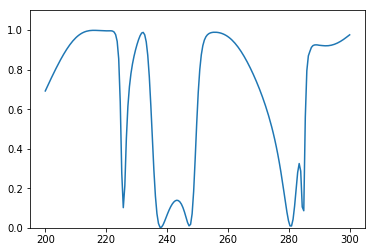

Predicted spectrum: 


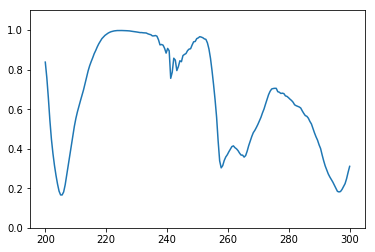

Test 310
True spectrum: 


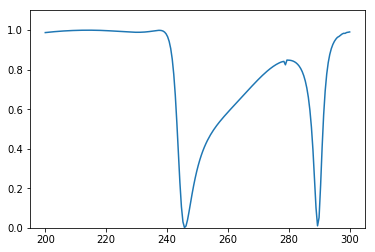

Predicted spectrum: 


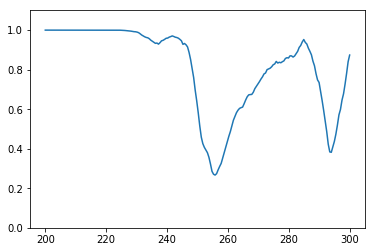

Test 311
True spectrum: 


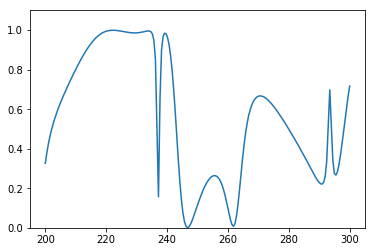

Predicted spectrum: 


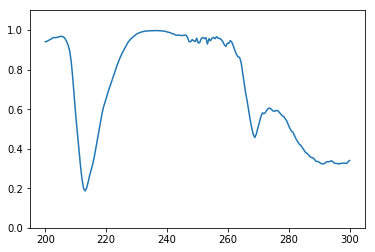

Test 312
True spectrum: 


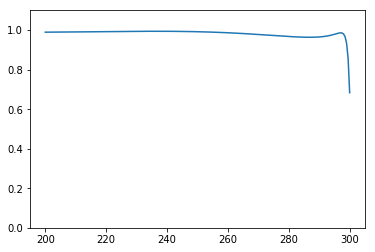

Predicted spectrum: 


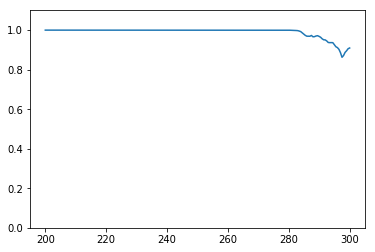

Test 313
True spectrum: 


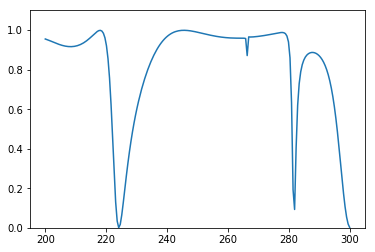

Predicted spectrum: 


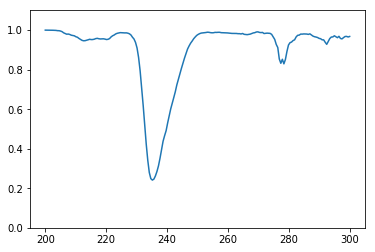

Test 314
True spectrum: 


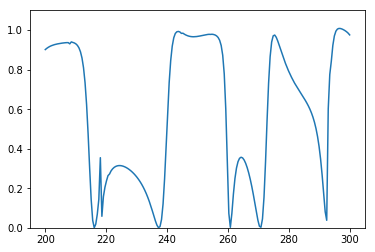

Predicted spectrum: 


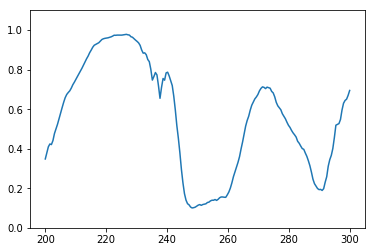

Test 315
True spectrum: 


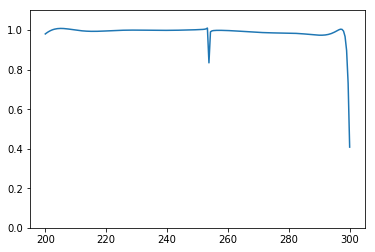

Predicted spectrum: 


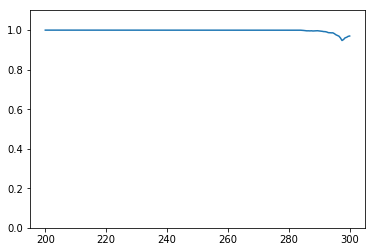

Test 316
True spectrum: 


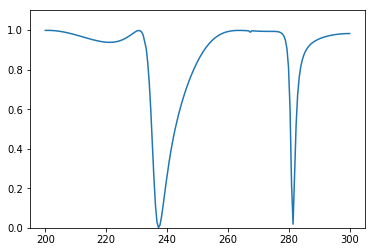

Predicted spectrum: 


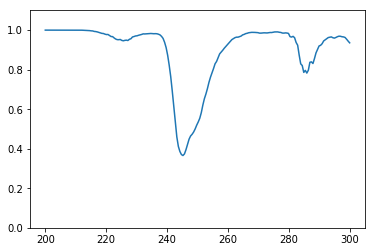

Test 317
True spectrum: 


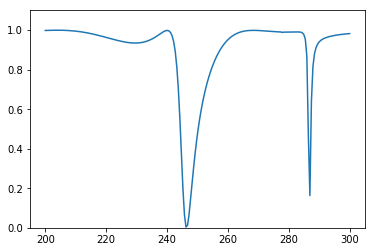

Predicted spectrum: 


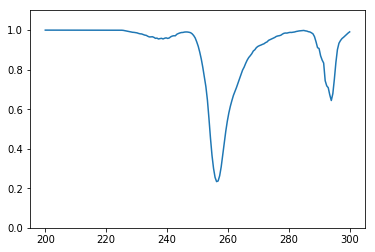

Test 318
True spectrum: 


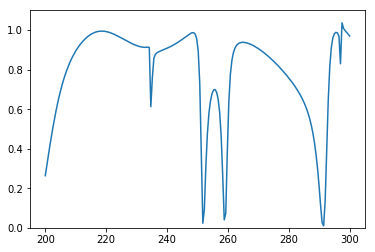

Predicted spectrum: 


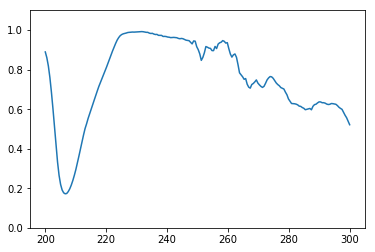

Test 319
True spectrum: 


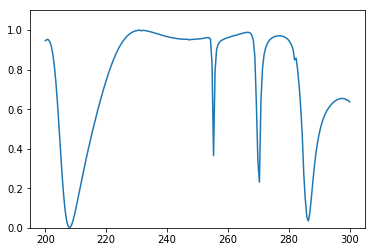

Predicted spectrum: 


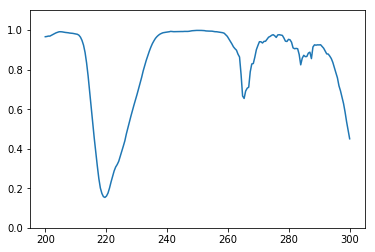

Test 320
True spectrum: 


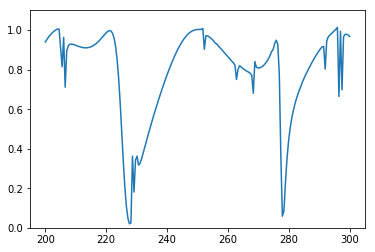

Predicted spectrum: 


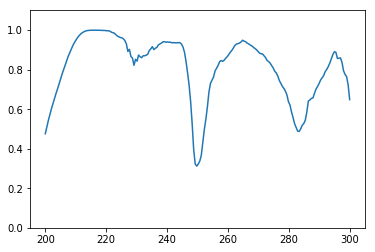

Test 321
True spectrum: 


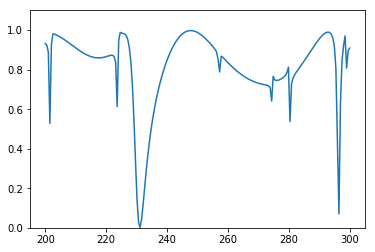

Predicted spectrum: 


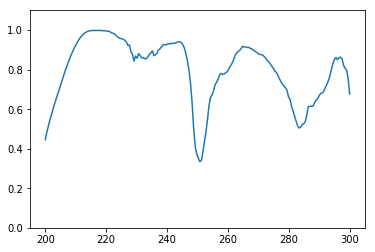

Test 322
True spectrum: 


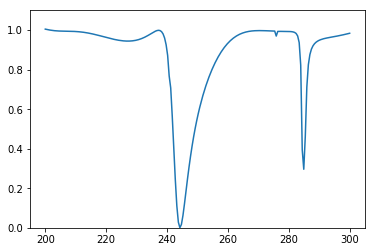

Predicted spectrum: 


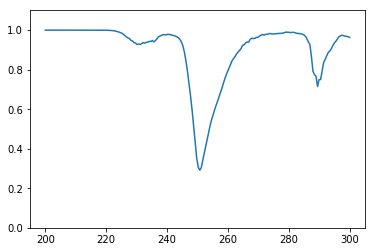

Test 323
True spectrum: 


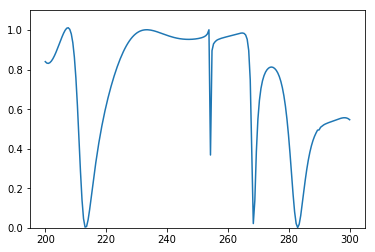

Predicted spectrum: 


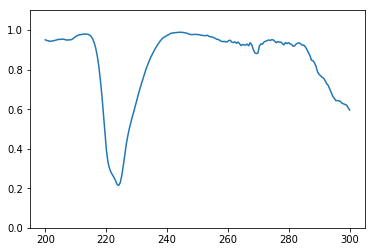

Test 324
True spectrum: 


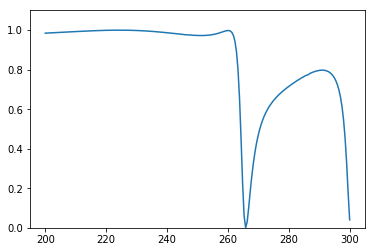

Predicted spectrum: 


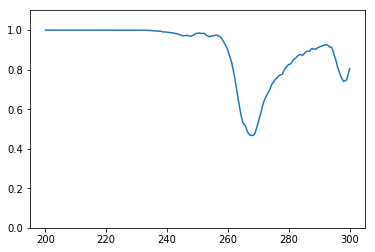

Test 325
True spectrum: 


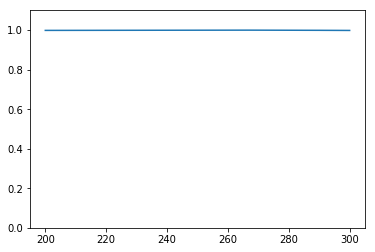

Predicted spectrum: 


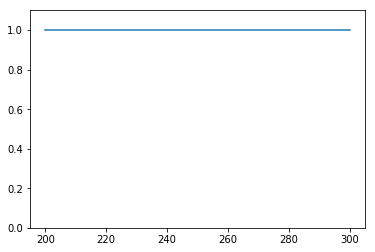

Test 326
True spectrum: 


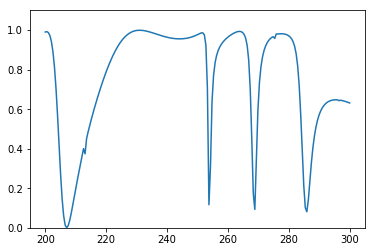

Predicted spectrum: 


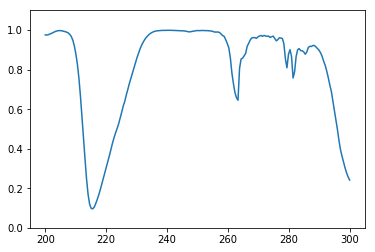

Test 327
True spectrum: 


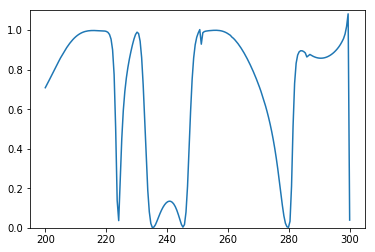

Predicted spectrum: 


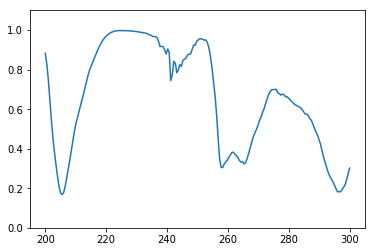

Test 328
True spectrum: 


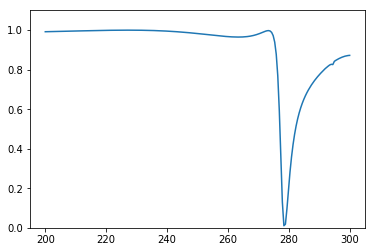

Predicted spectrum: 


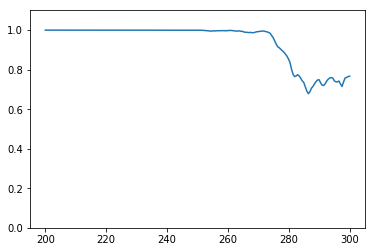

Test 329
True spectrum: 


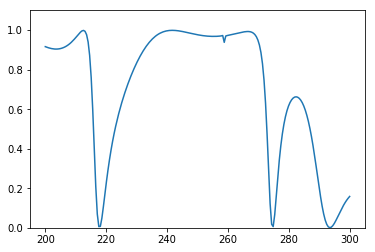

Predicted spectrum: 


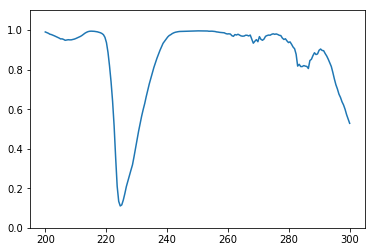

Test 330
True spectrum: 


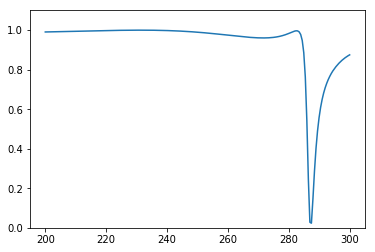

Predicted spectrum: 


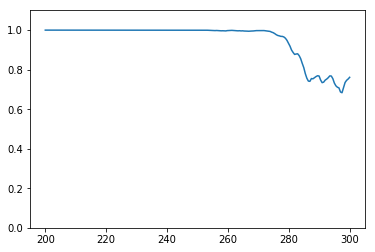

Test 331
True spectrum: 


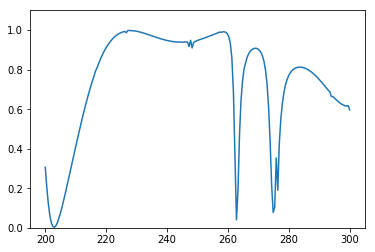

Predicted spectrum: 


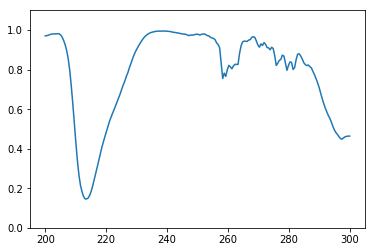

Test 332
True spectrum: 


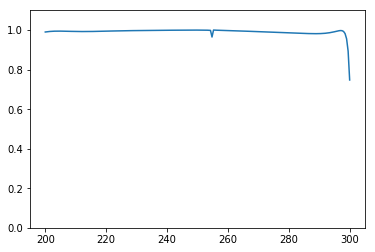

Predicted spectrum: 


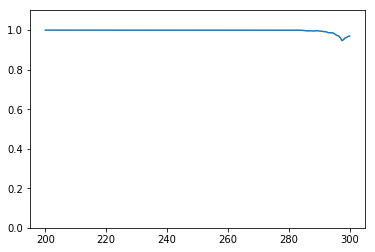

Test 333
True spectrum: 


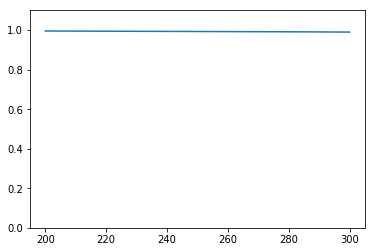

Predicted spectrum: 


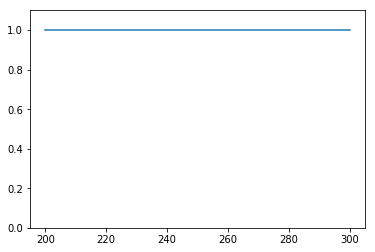

Test 334
True spectrum: 


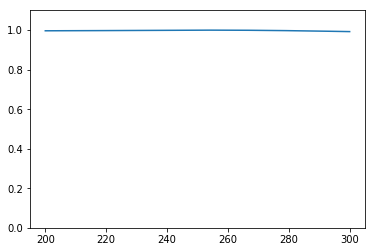

Predicted spectrum: 


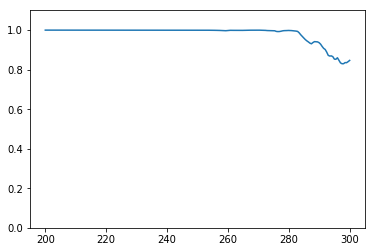

Test 335
True spectrum: 


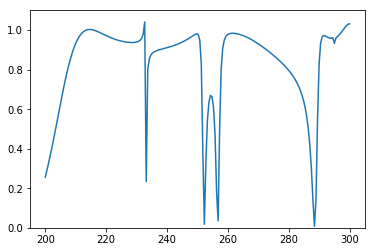

Predicted spectrum: 


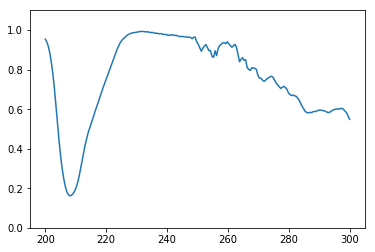

Test 336
True spectrum: 


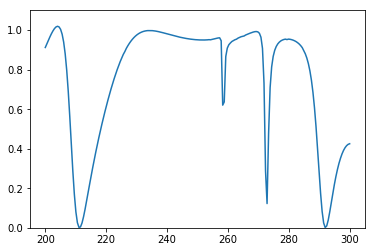

Predicted spectrum: 


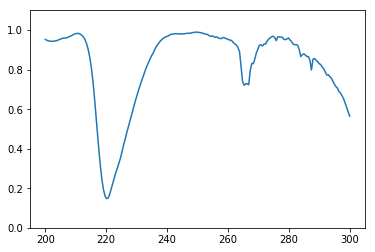

Test 337
True spectrum: 


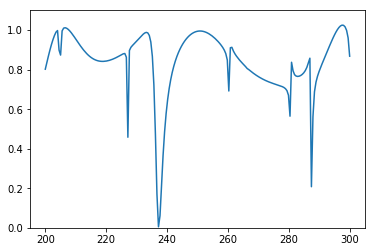

Predicted spectrum: 


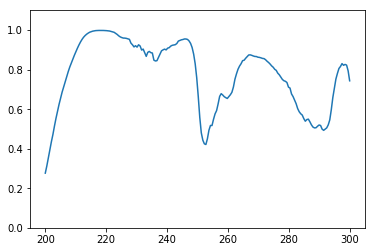

Test 338
True spectrum: 


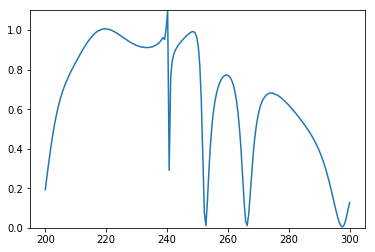

Predicted spectrum: 


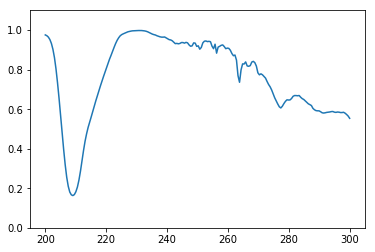

Test 339
True spectrum: 


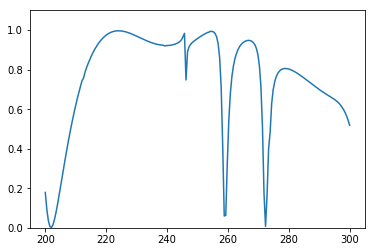

Predicted spectrum: 


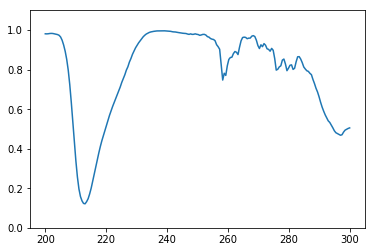

Test 340
True spectrum: 


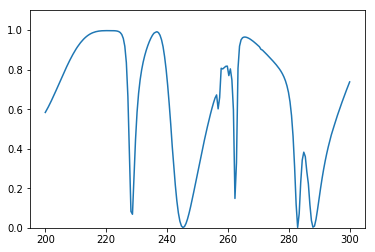

Predicted spectrum: 


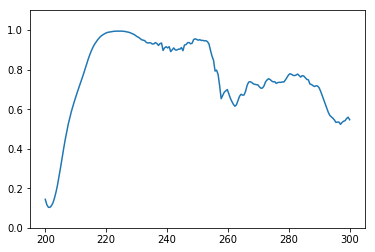

Test 341
True spectrum: 


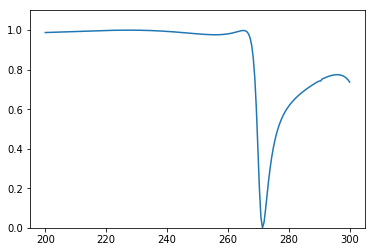

Predicted spectrum: 


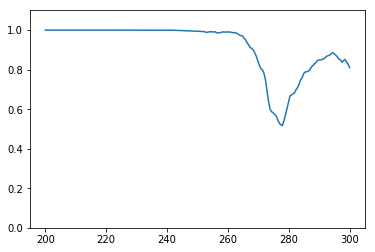

Test 342
True spectrum: 


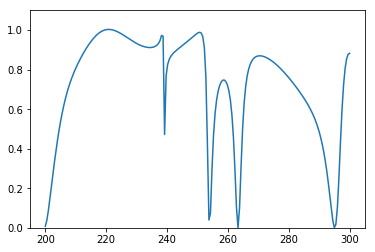

Predicted spectrum: 


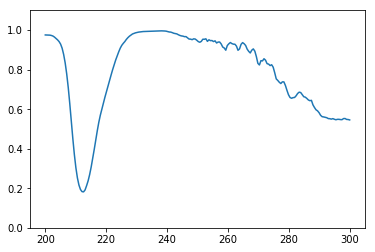

Test 343
True spectrum: 


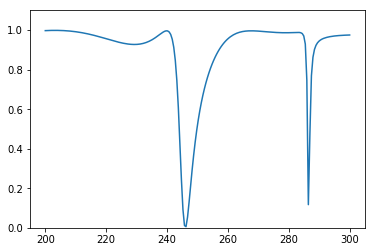

Predicted spectrum: 


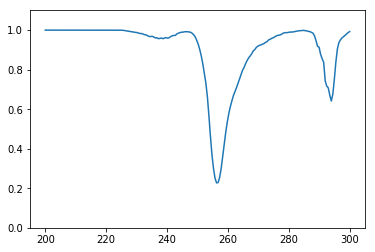

Test 344
True spectrum: 


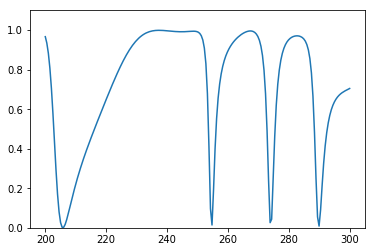

Predicted spectrum: 


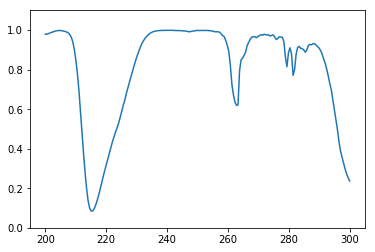

Test 345
True spectrum: 


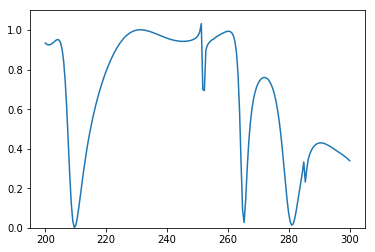

Predicted spectrum: 


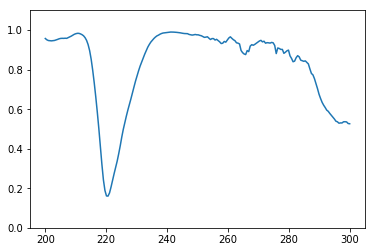

Test 346
True spectrum: 


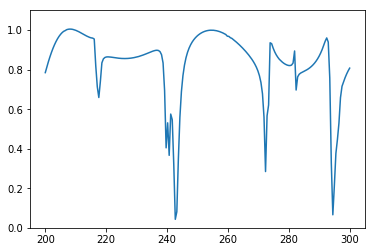

Predicted spectrum: 


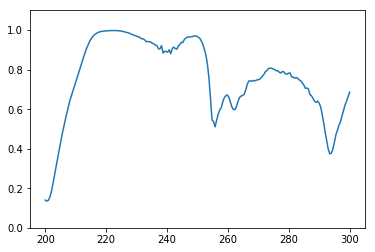

Test 347
True spectrum: 


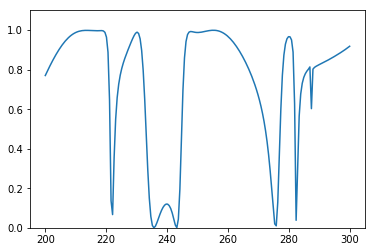

Predicted spectrum: 


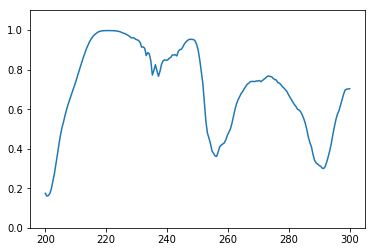

Test 348
True spectrum: 


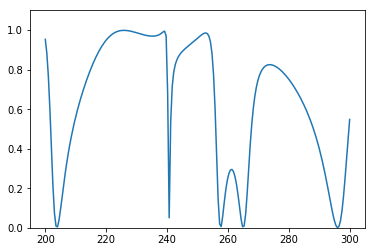

Predicted spectrum: 


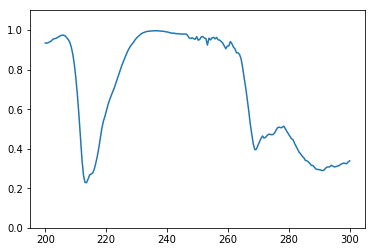

Test 349
True spectrum: 


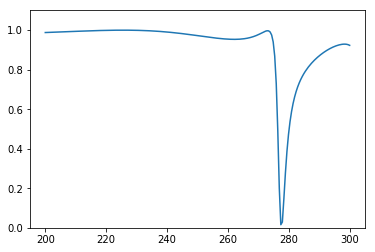

Predicted spectrum: 


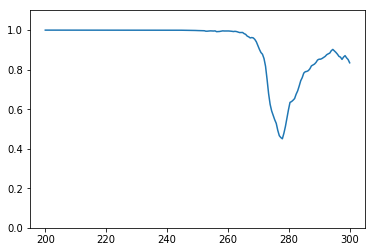

Test 350
True spectrum: 


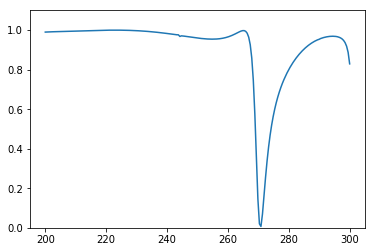

Predicted spectrum: 


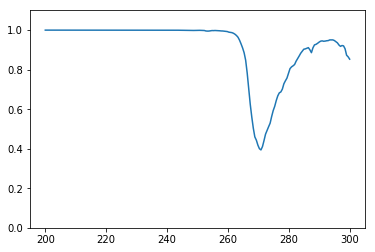

Test 351
True spectrum: 


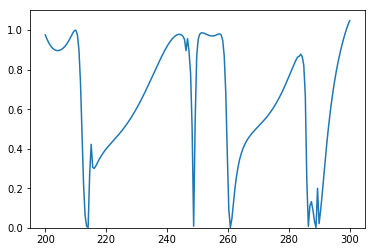

Predicted spectrum: 


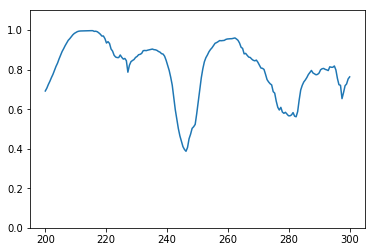

Test 352
True spectrum: 


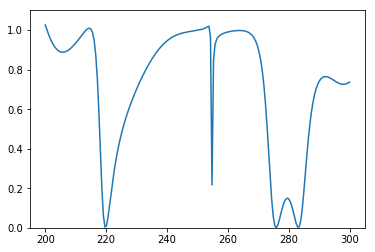

Predicted spectrum: 


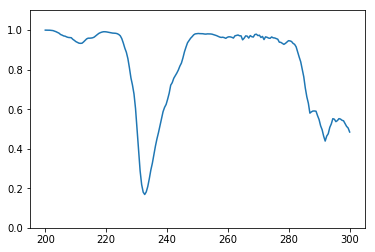

Test 353
True spectrum: 


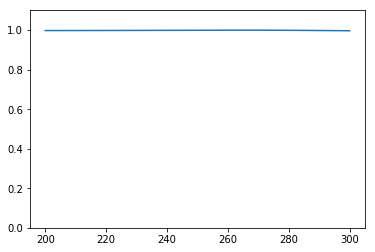

Predicted spectrum: 


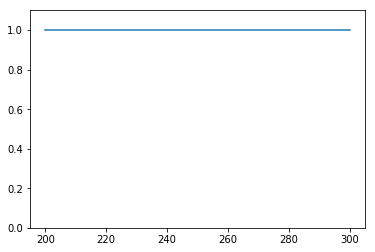

Test 354
True spectrum: 


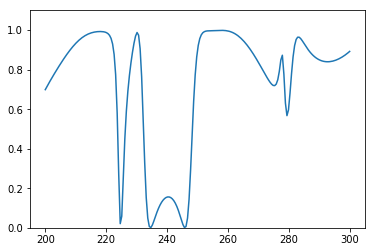

Predicted spectrum: 


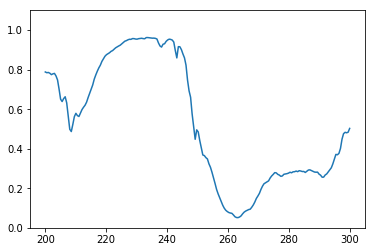

Test 355
True spectrum: 


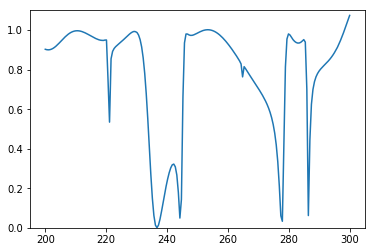

Predicted spectrum: 


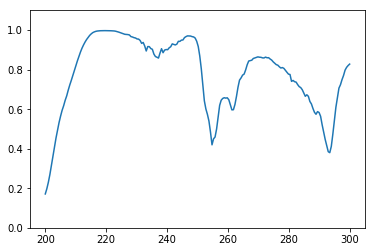

Test 356
True spectrum: 


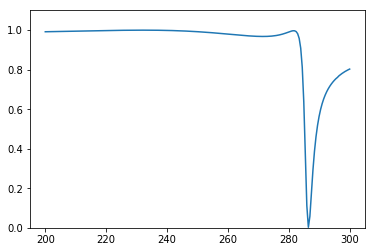

Predicted spectrum: 


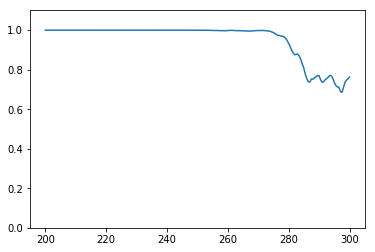

Test 357
True spectrum: 


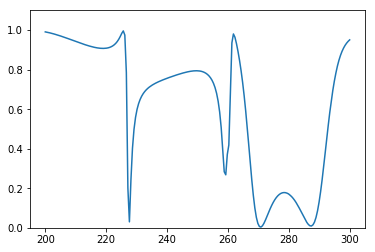

Predicted spectrum: 


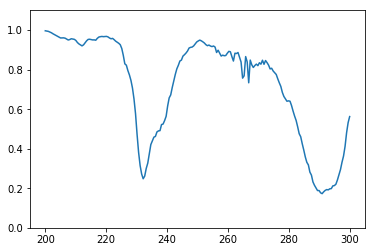

Test 358
True spectrum: 


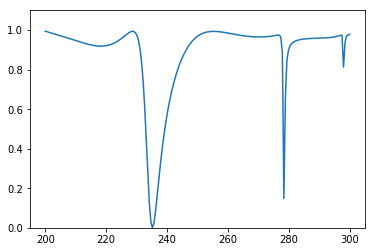

Predicted spectrum: 


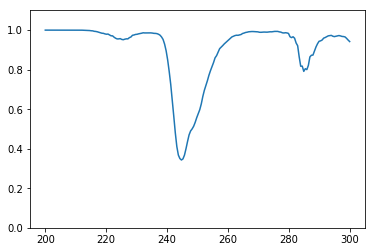

Test 359
True spectrum: 


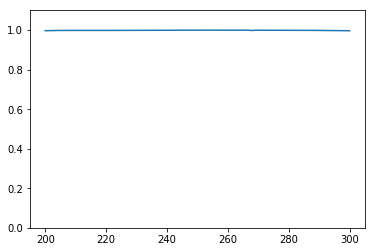

Predicted spectrum: 


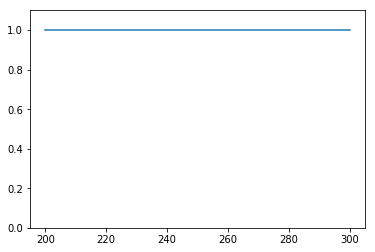

Test 360
True spectrum: 


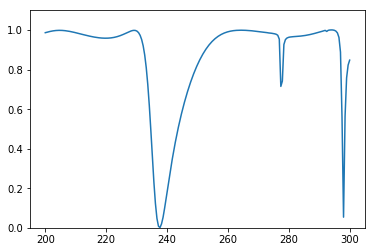

Predicted spectrum: 


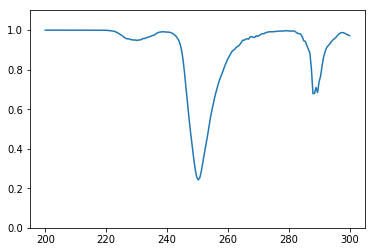

Test 361
True spectrum: 


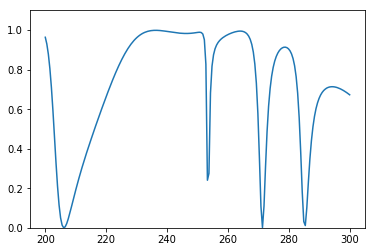

Predicted spectrum: 


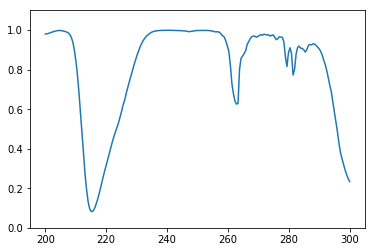

Test 362
True spectrum: 


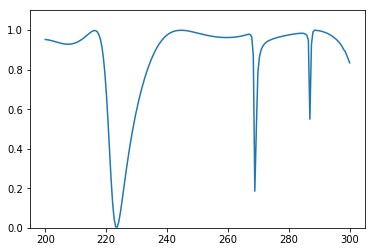

Predicted spectrum: 


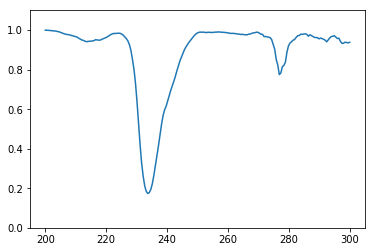

Test 363
True spectrum: 


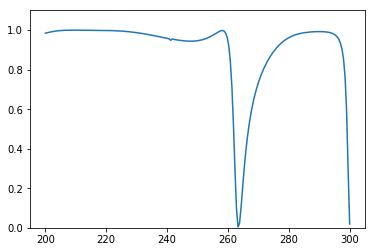

Predicted spectrum: 


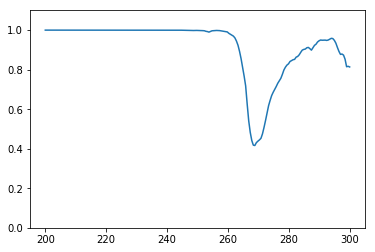

Test 364
True spectrum: 


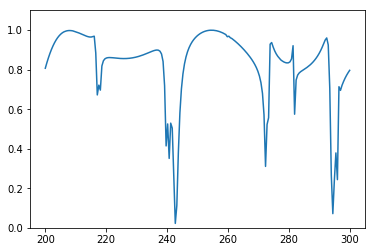

Predicted spectrum: 


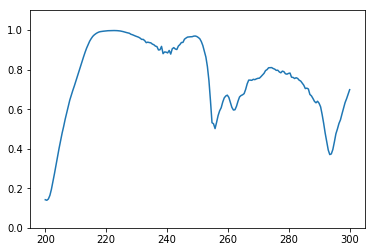

Test 365
True spectrum: 


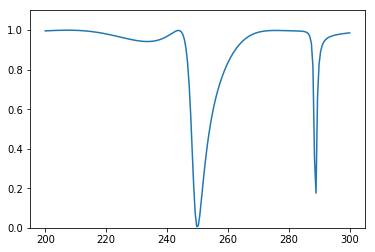

Predicted spectrum: 


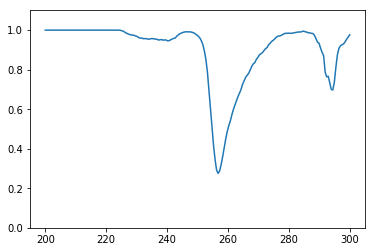

Test 366
True spectrum: 


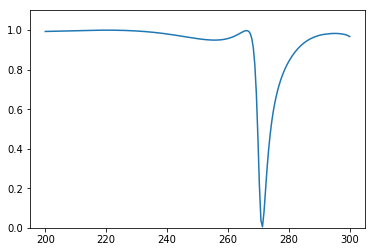

Predicted spectrum: 


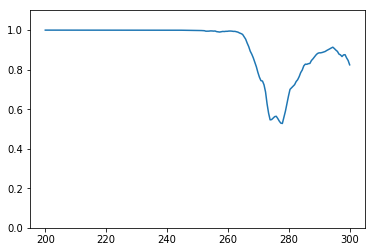

Test 367
True spectrum: 


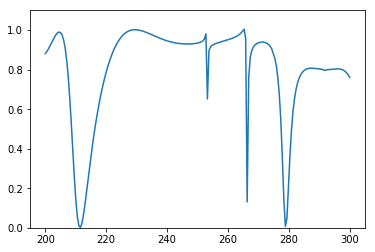

Predicted spectrum: 


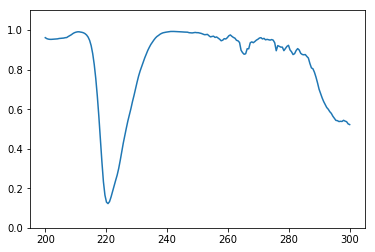

Test 368
True spectrum: 


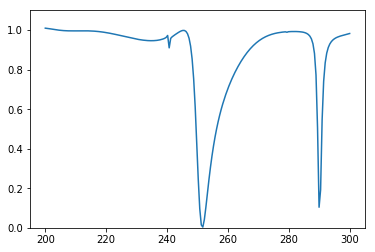

Predicted spectrum: 


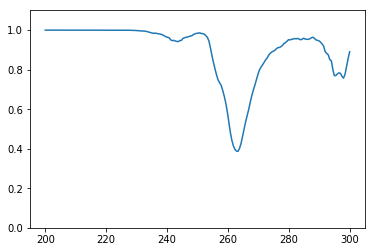

Test 369
True spectrum: 


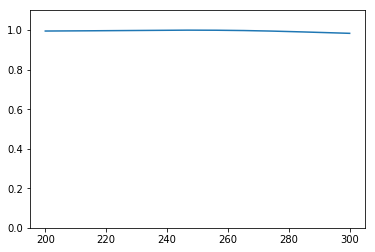

Predicted spectrum: 


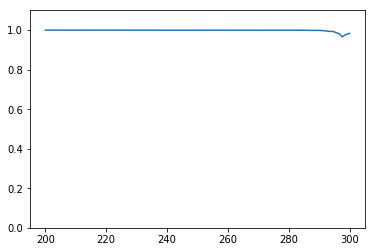

Test 370
True spectrum: 


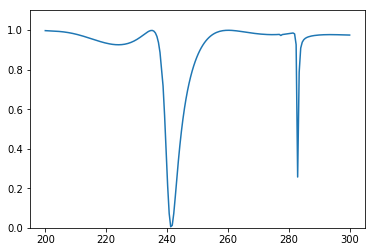

Predicted spectrum: 


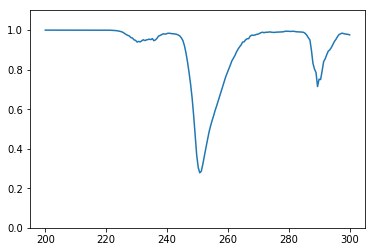

Test 371
True spectrum: 


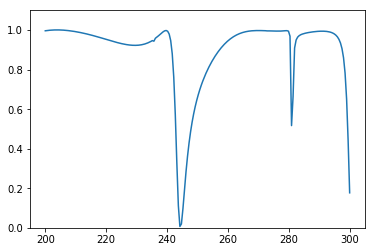

Predicted spectrum: 


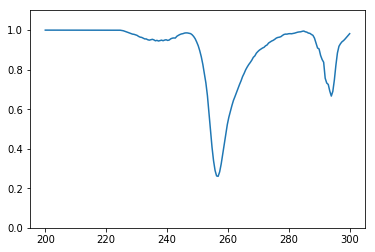

Test 372
True spectrum: 


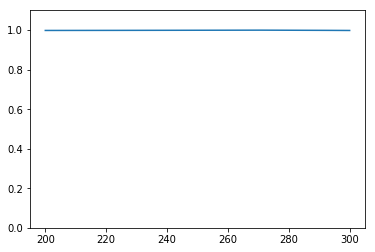

Predicted spectrum: 


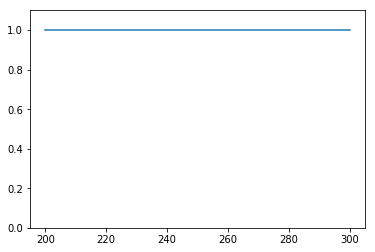

Test 373
True spectrum: 


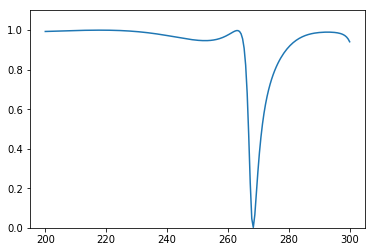

Predicted spectrum: 


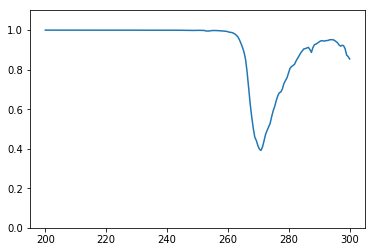

Test 374
True spectrum: 


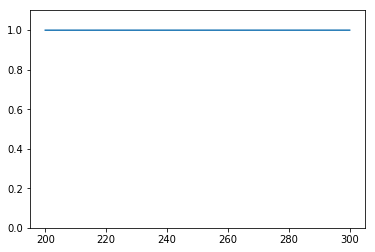

Predicted spectrum: 


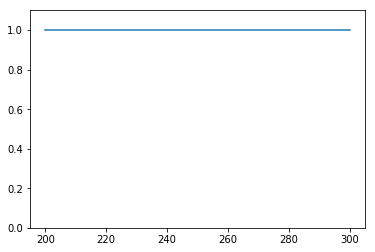

Test 375
True spectrum: 


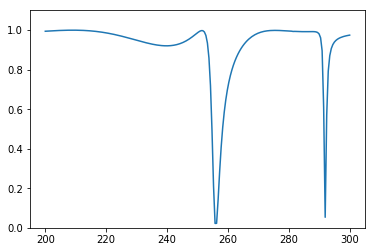

Predicted spectrum: 


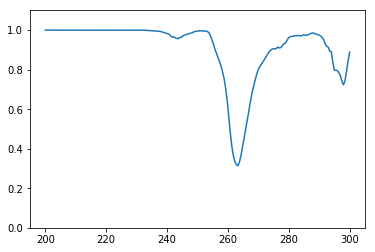

Test 376
True spectrum: 


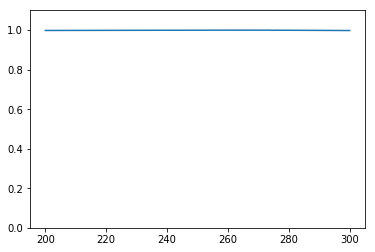

Predicted spectrum: 


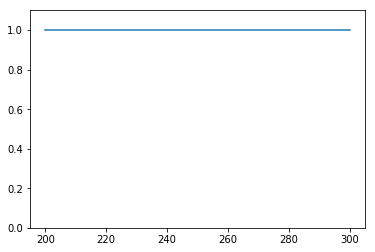

Test 377
True spectrum: 


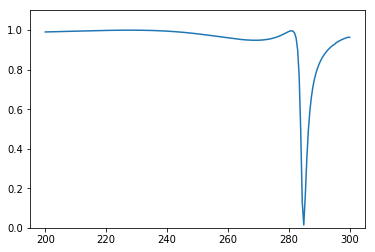

Predicted spectrum: 


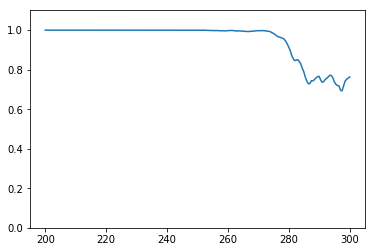

Test 378
True spectrum: 


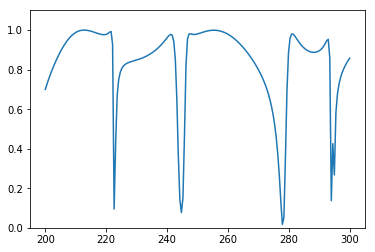

Predicted spectrum: 


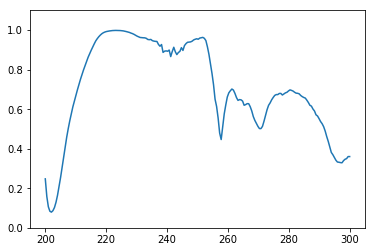

Test 379
True spectrum: 


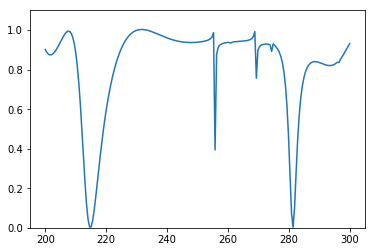

Predicted spectrum: 


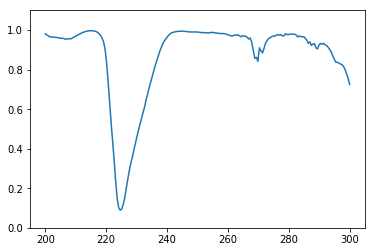

Test 380
True spectrum: 


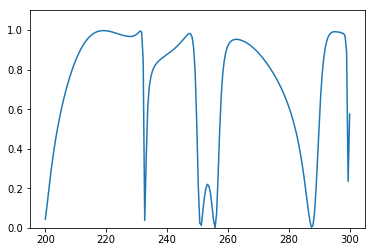

Predicted spectrum: 


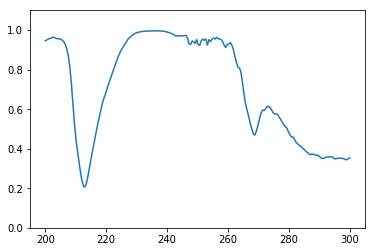

Test 381
True spectrum: 


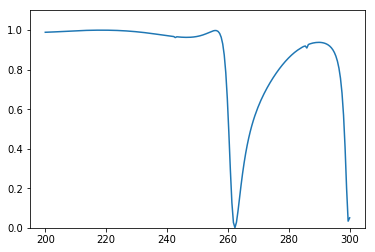

Predicted spectrum: 


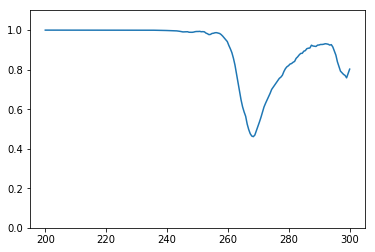

Test 382
True spectrum: 


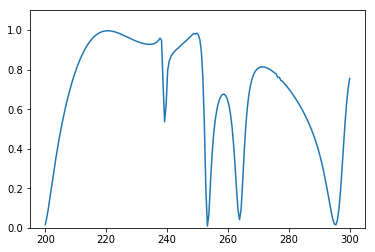

Predicted spectrum: 


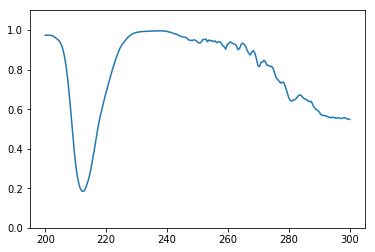

Test 383
True spectrum: 


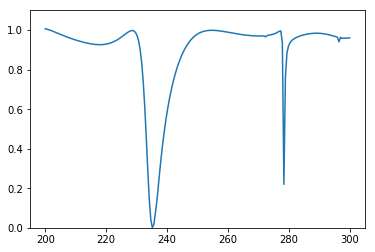

Predicted spectrum: 


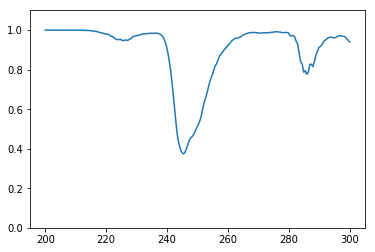

Test 384
True spectrum: 


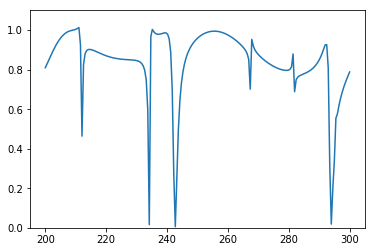

Predicted spectrum: 


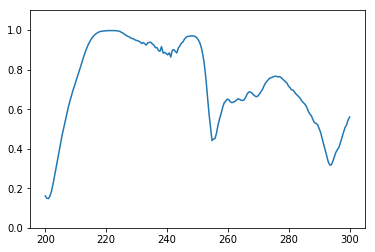

Test 385
True spectrum: 


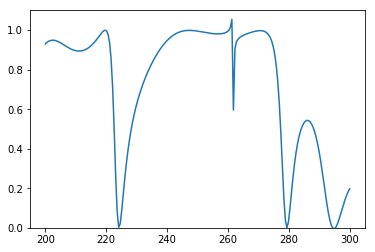

Predicted spectrum: 


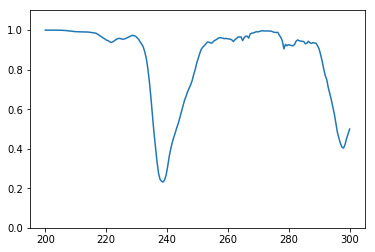

Test 386
True spectrum: 


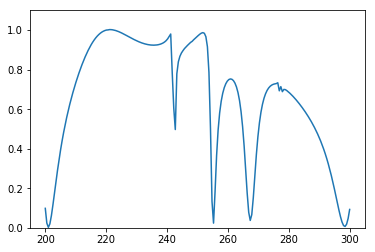

Predicted spectrum: 


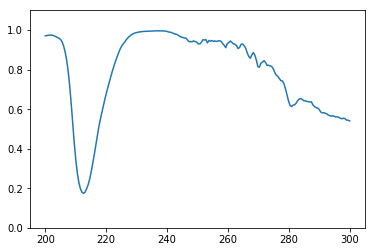

Test 387
True spectrum: 


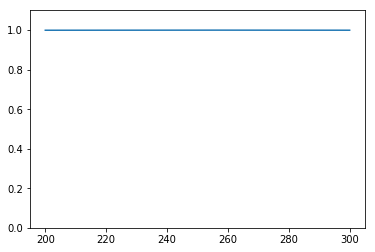

Predicted spectrum: 


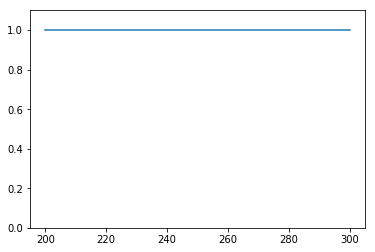

Test 388
True spectrum: 


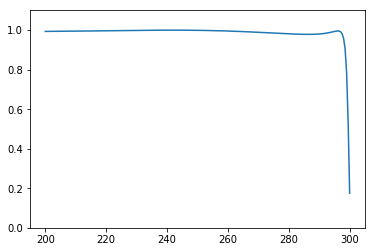

Predicted spectrum: 


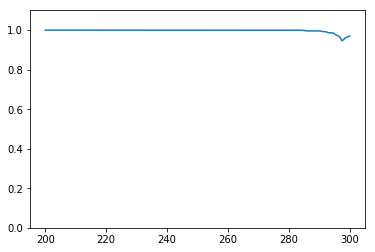

Test 389
True spectrum: 


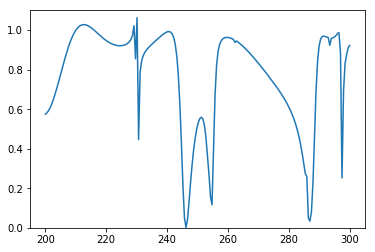

Predicted spectrum: 


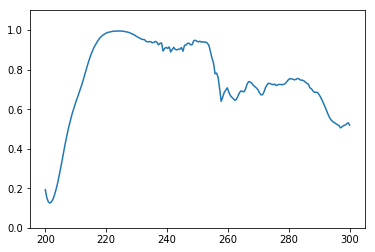

Test 390
True spectrum: 


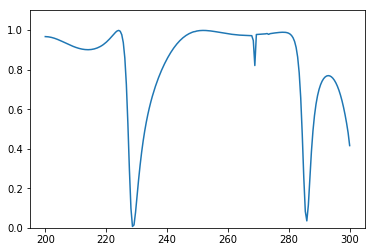

Predicted spectrum: 


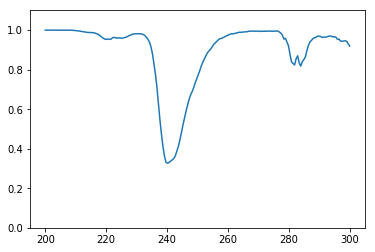

Test 391
True spectrum: 


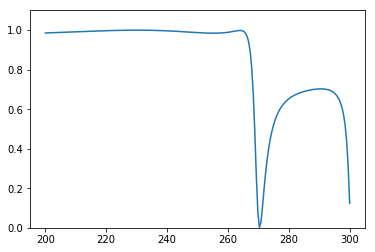

Predicted spectrum: 


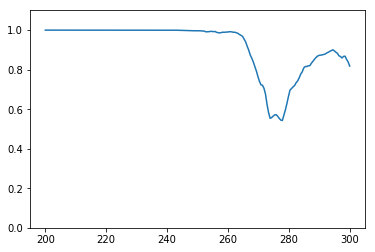

Test 392
True spectrum: 


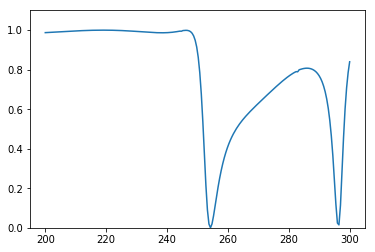

Predicted spectrum: 


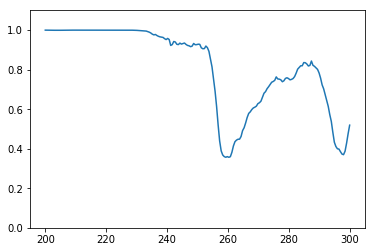

Test 393
True spectrum: 


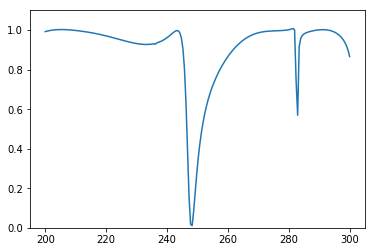

Predicted spectrum: 


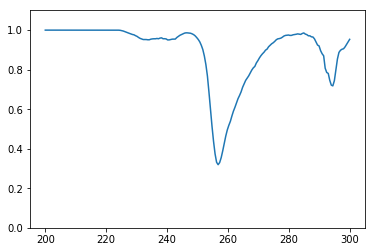

Test 394
True spectrum: 


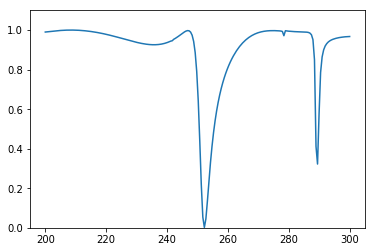

Predicted spectrum: 


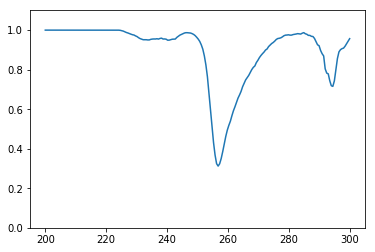

Test 395
True spectrum: 


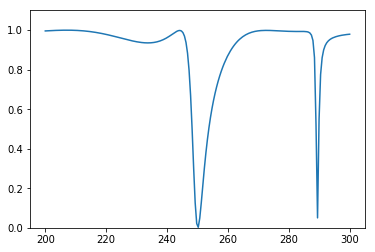

Predicted spectrum: 


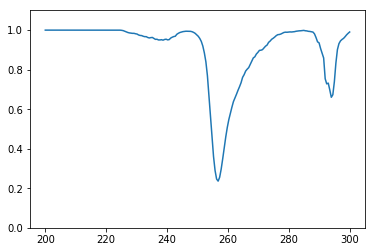

Test 396
True spectrum: 


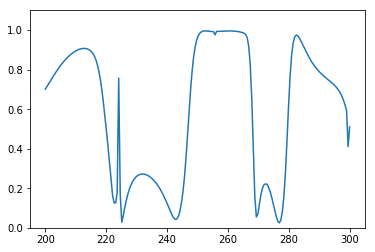

Predicted spectrum: 


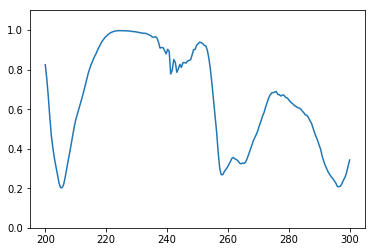

Test 397
True spectrum: 


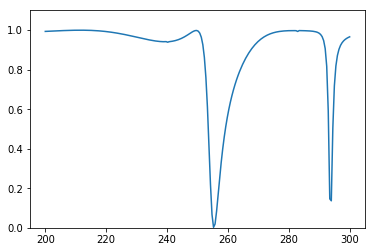

Predicted spectrum: 


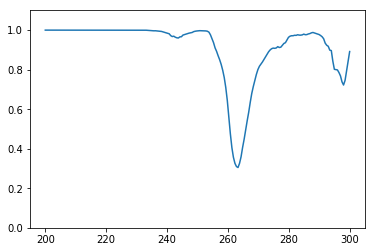

Test 398
True spectrum: 


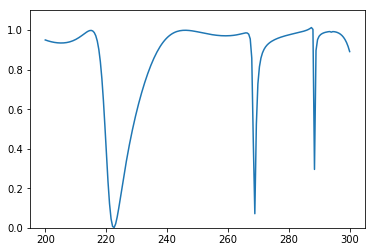

Predicted spectrum: 


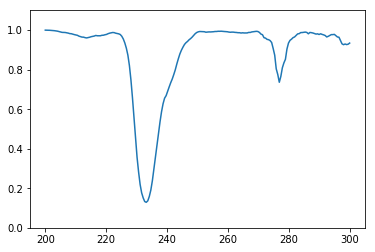

Test 399
True spectrum: 


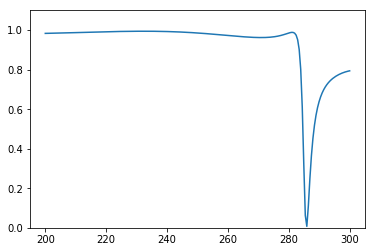

Predicted spectrum: 


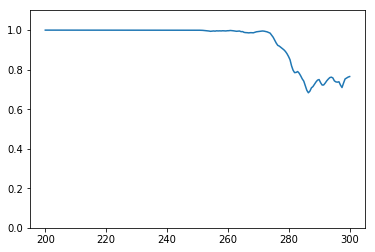

Test 400
True spectrum: 


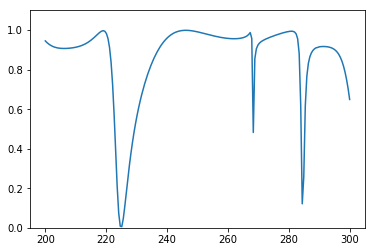

Predicted spectrum: 


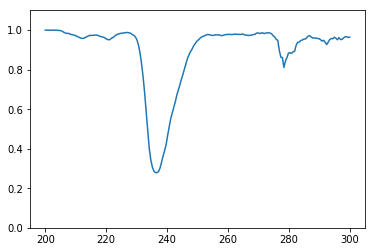

Test 401
True spectrum: 


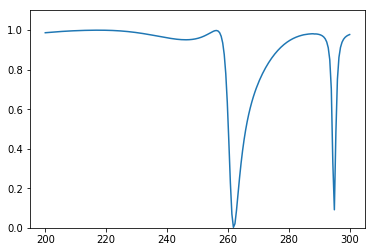

Predicted spectrum: 


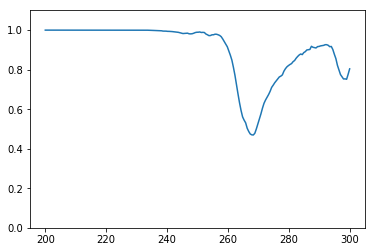

Test 402
True spectrum: 


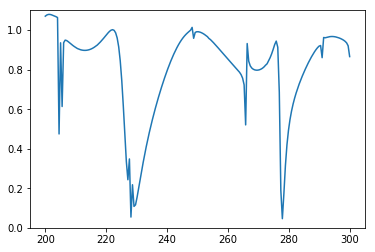

Predicted spectrum: 


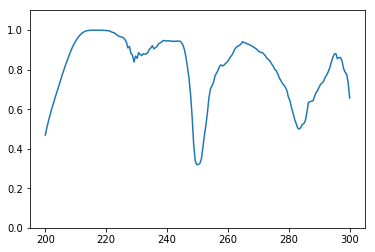

Test 403
True spectrum: 


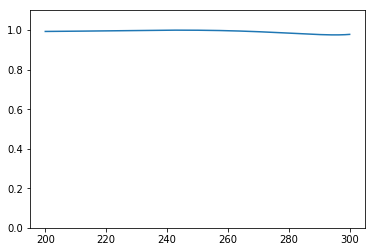

Predicted spectrum: 


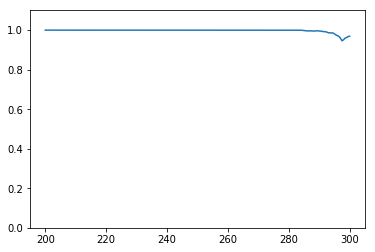

Test 404
True spectrum: 


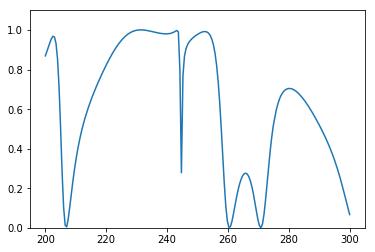

Predicted spectrum: 


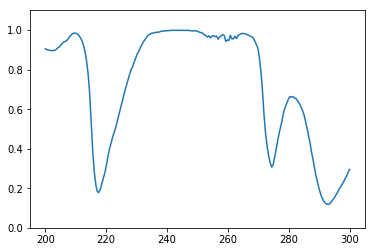

Test 405
True spectrum: 


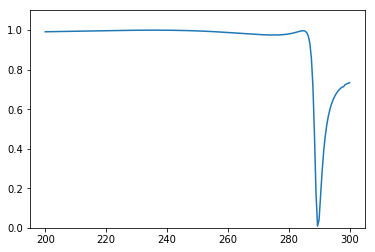

Predicted spectrum: 


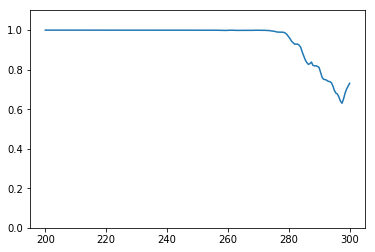

Test 406
True spectrum: 


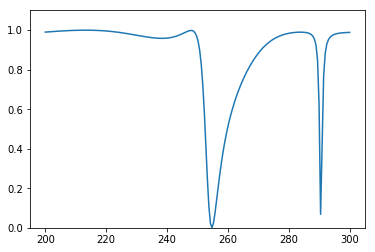

Predicted spectrum: 


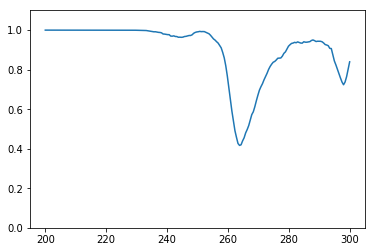

Test 407
True spectrum: 


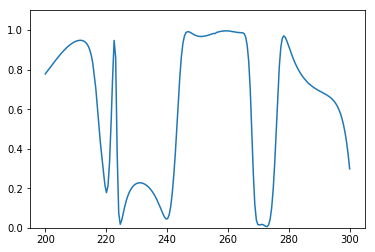

Predicted spectrum: 


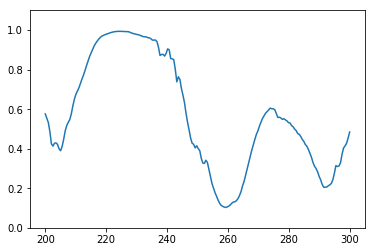

Test 408
True spectrum: 


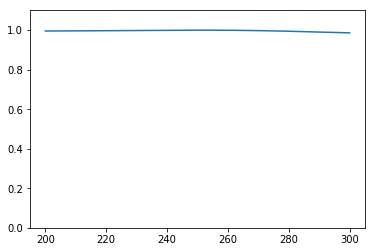

Predicted spectrum: 


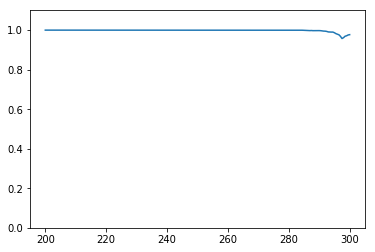

Test 409
True spectrum: 


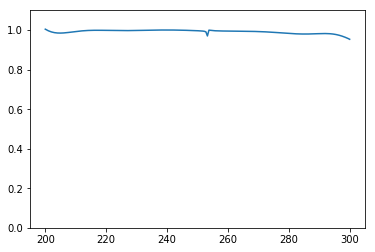

Predicted spectrum: 


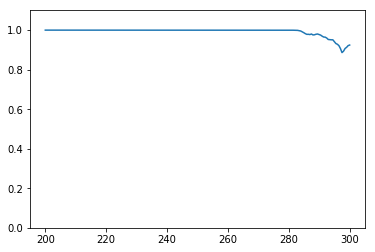

Test 410
True spectrum: 


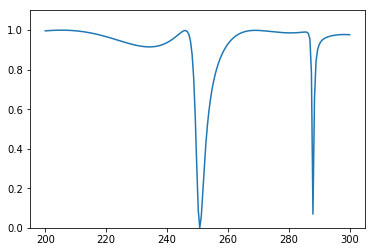

Predicted spectrum: 


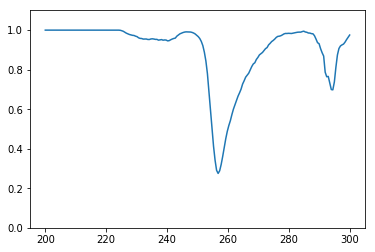

Test 411
True spectrum: 


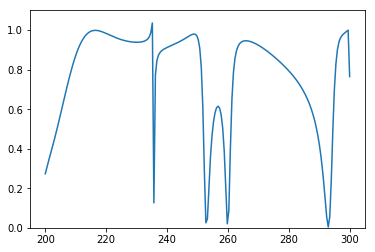

Predicted spectrum: 


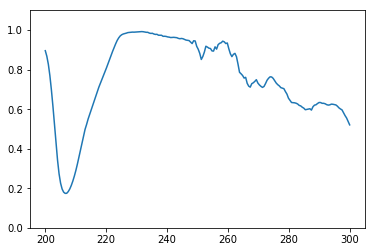

Test 412
True spectrum: 


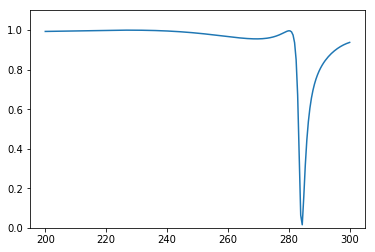

Predicted spectrum: 


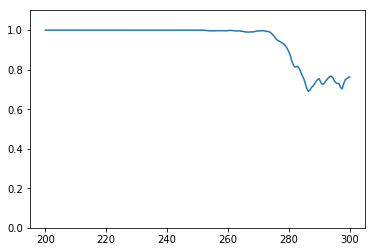

Test 413
True spectrum: 


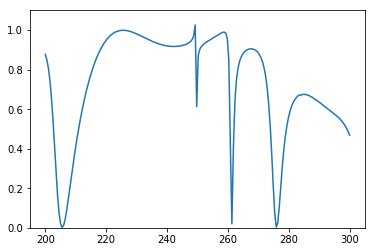

Predicted spectrum: 


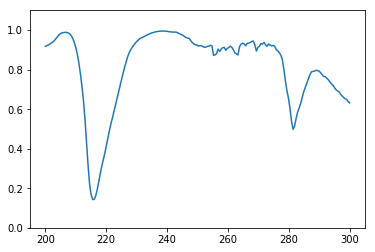

Test 414
True spectrum: 


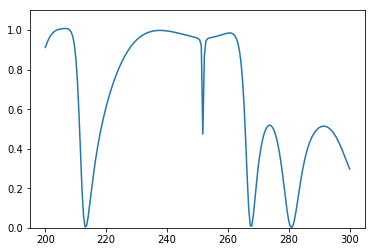

Predicted spectrum: 


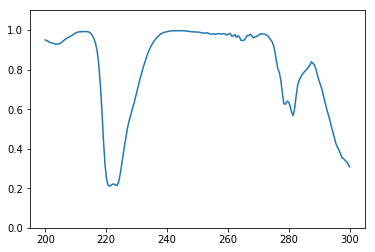

Test 415
True spectrum: 


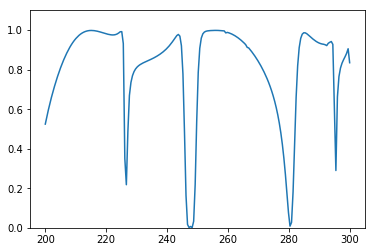

Predicted spectrum: 


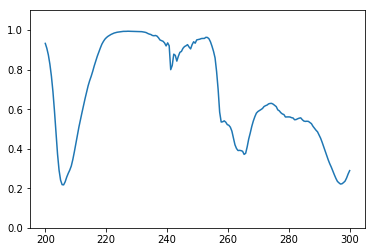

Test 416
True spectrum: 


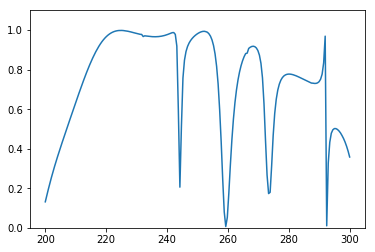

Predicted spectrum: 


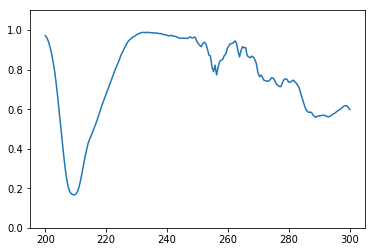

Test 417
True spectrum: 


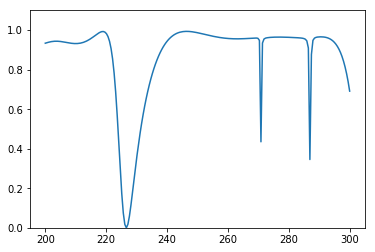

Predicted spectrum: 


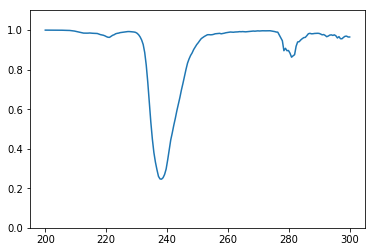

Test 418
True spectrum: 


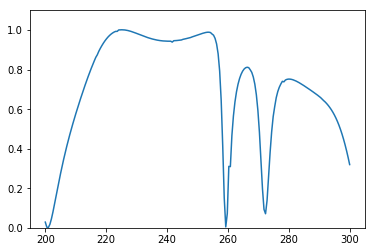

Predicted spectrum: 


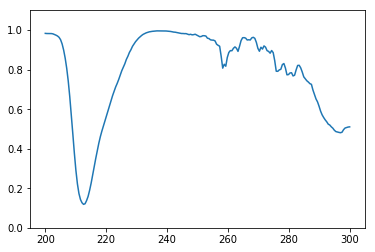

Test 419
True spectrum: 


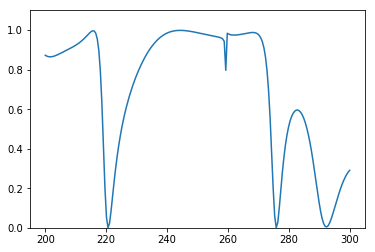

Predicted spectrum: 


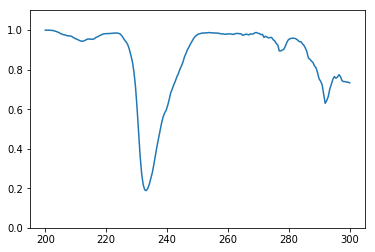

Test 420
True spectrum: 


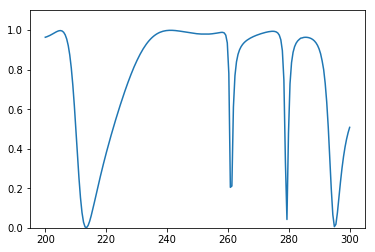

Predicted spectrum: 


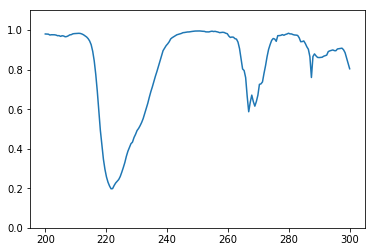

Test 421
True spectrum: 


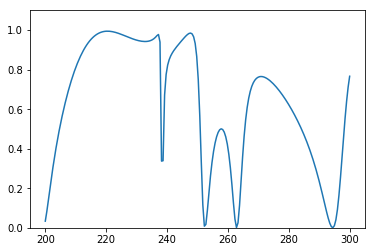

Predicted spectrum: 


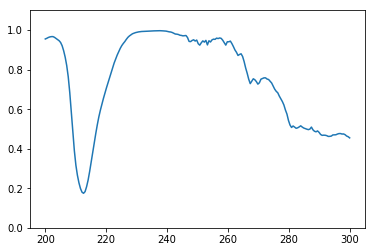

Test 422
True spectrum: 


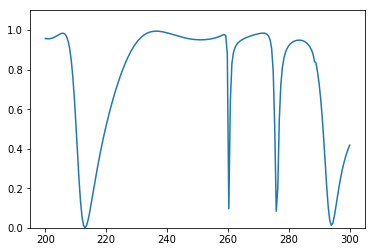

Predicted spectrum: 


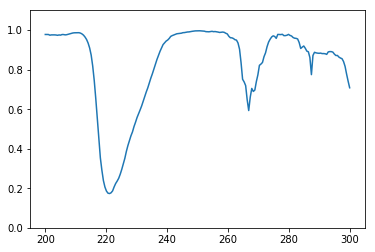

Test 423
True spectrum: 


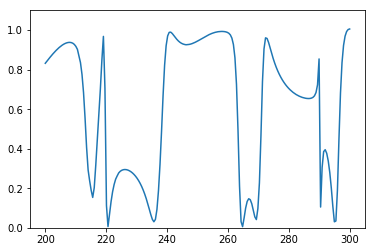

Predicted spectrum: 


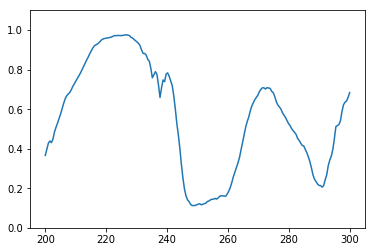

Test 424
True spectrum: 


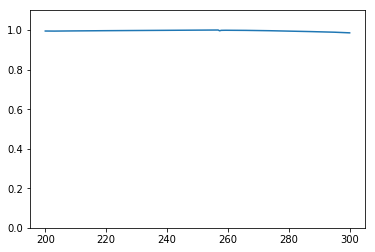

Predicted spectrum: 


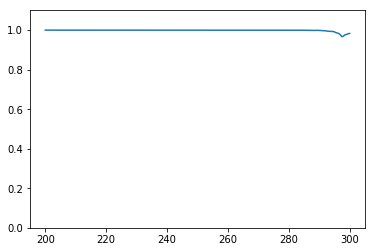

Test 425
True spectrum: 


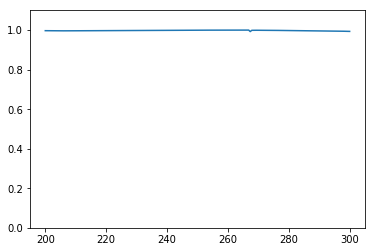

Predicted spectrum: 


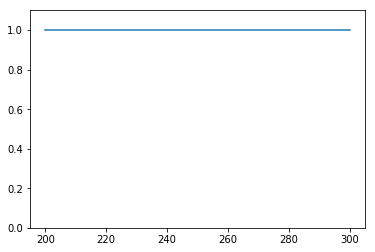

Test 426
True spectrum: 


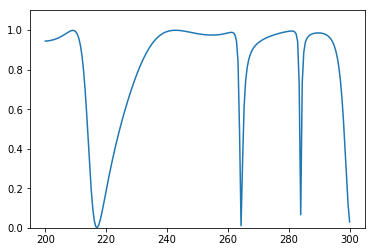

Predicted spectrum: 


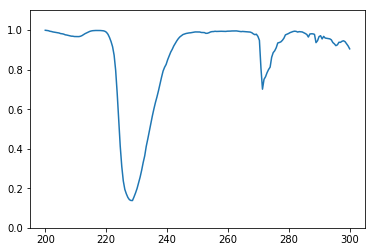

Test 427
True spectrum: 


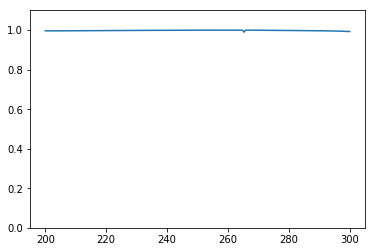

Predicted spectrum: 


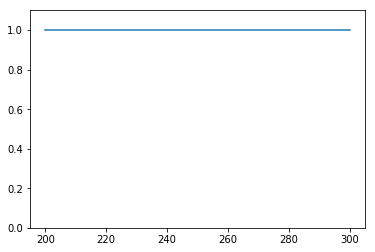

Test 428
True spectrum: 


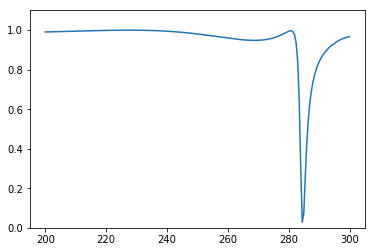

Predicted spectrum: 


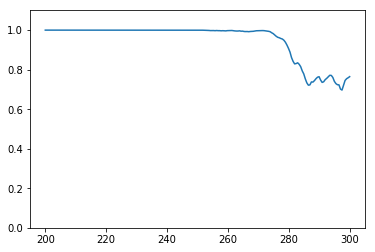

Test 429
True spectrum: 


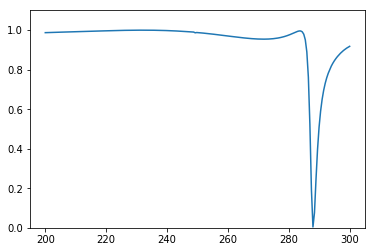

Predicted spectrum: 


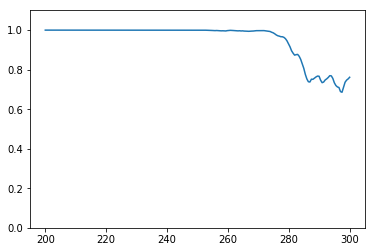

Test 430
True spectrum: 


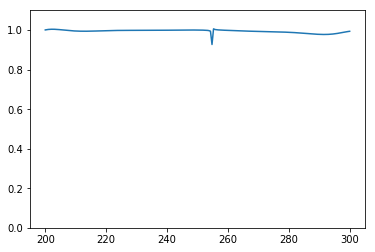

Predicted spectrum: 


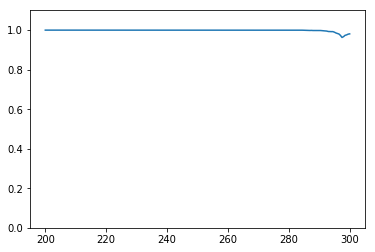

Test 431
True spectrum: 


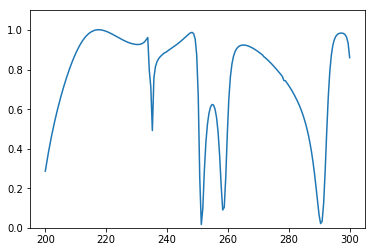

Predicted spectrum: 


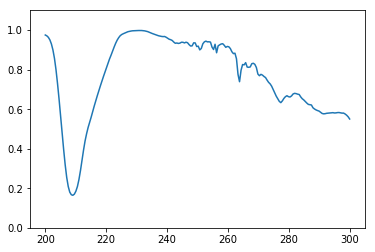

Test 432
True spectrum: 


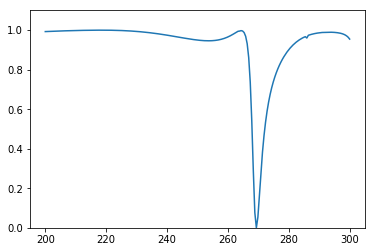

Predicted spectrum: 


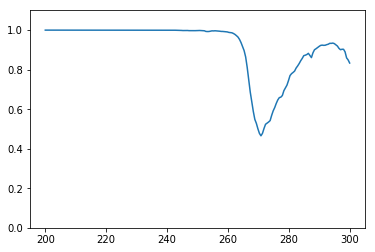

Test 433
True spectrum: 


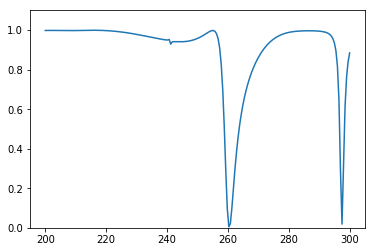

Predicted spectrum: 


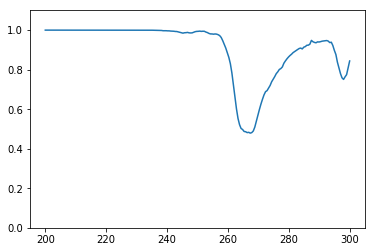

Test 434
True spectrum: 


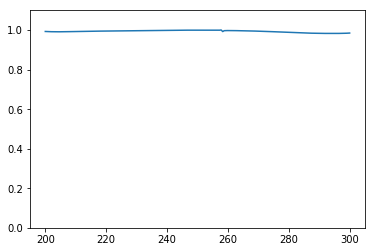

Predicted spectrum: 


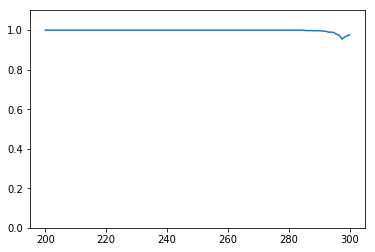

Test 435
True spectrum: 


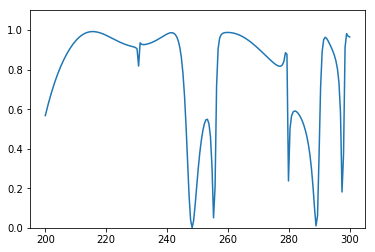

Predicted spectrum: 


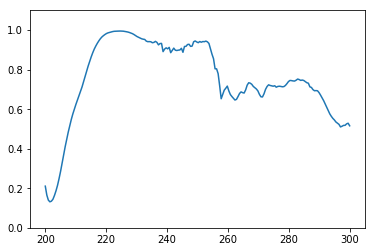

Test 436
True spectrum: 


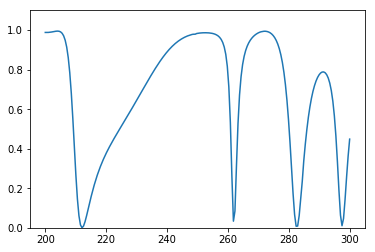

Predicted spectrum: 


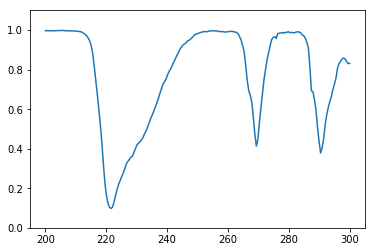

Test 437
True spectrum: 


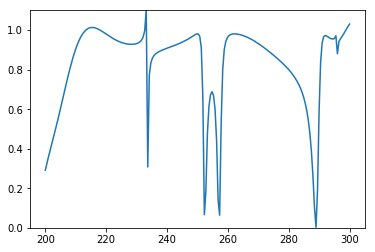

Predicted spectrum: 


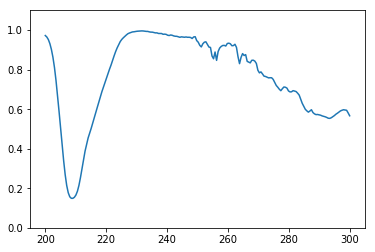

Test 438
True spectrum: 


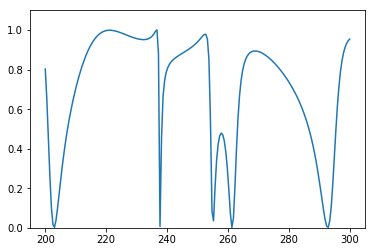

Predicted spectrum: 


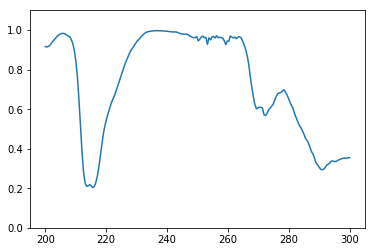

Test 439
True spectrum: 


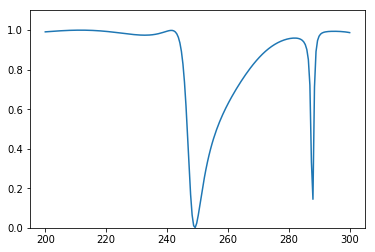

Predicted spectrum: 


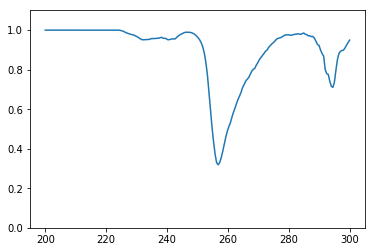

Test 440
True spectrum: 


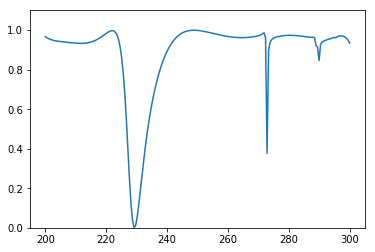

Predicted spectrum: 


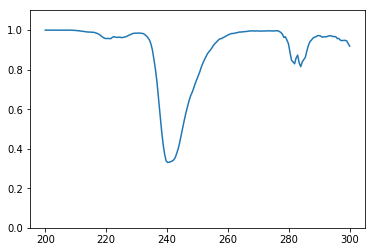

Test 441
True spectrum: 


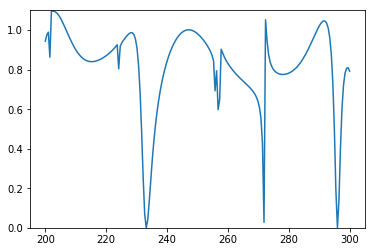

Predicted spectrum: 


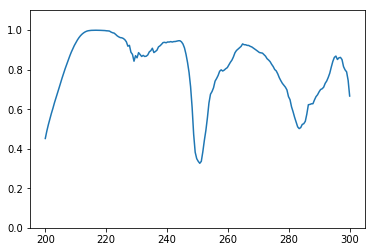

Test 442
True spectrum: 


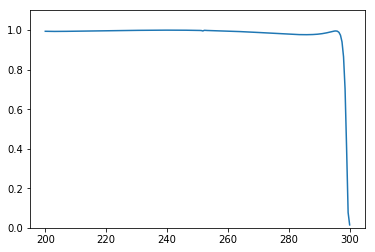

Predicted spectrum: 


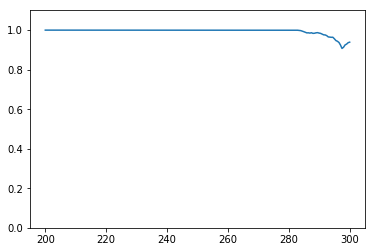

Test 443
True spectrum: 


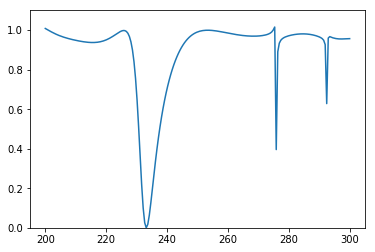

Predicted spectrum: 


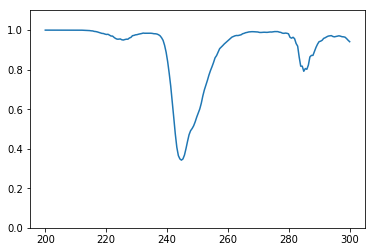

Test 444
True spectrum: 


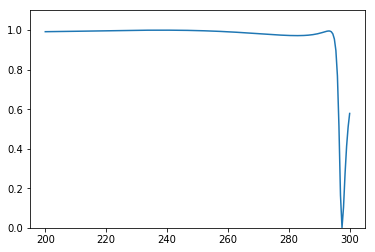

Predicted spectrum: 


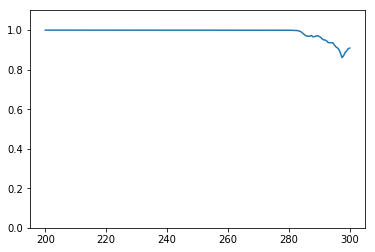

Test 445
True spectrum: 


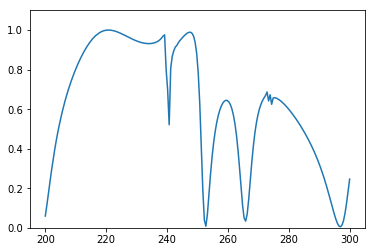

Predicted spectrum: 


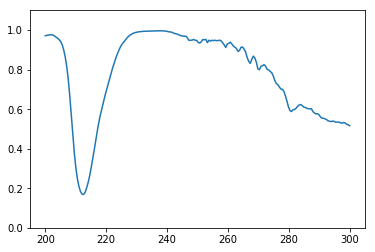

Test 446
True spectrum: 


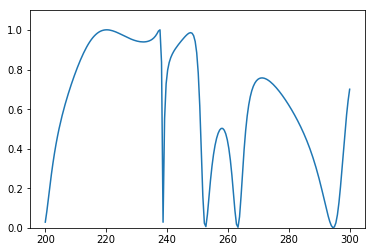

Predicted spectrum: 


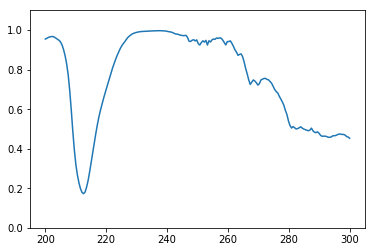

Test 447
True spectrum: 


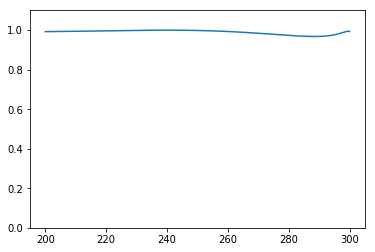

Predicted spectrum: 


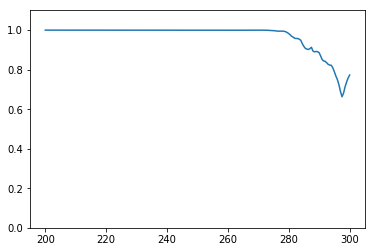

Test 448
True spectrum: 


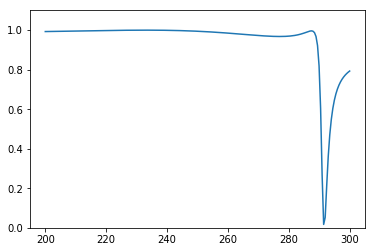

Predicted spectrum: 


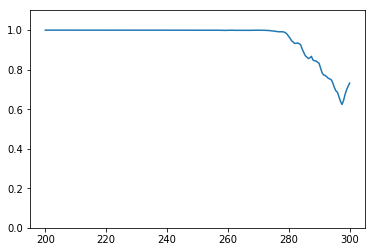

Test 449
True spectrum: 


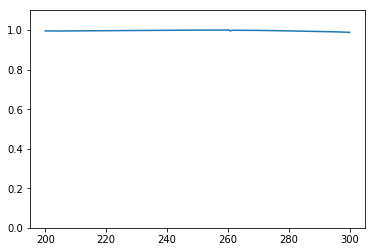

Predicted spectrum: 


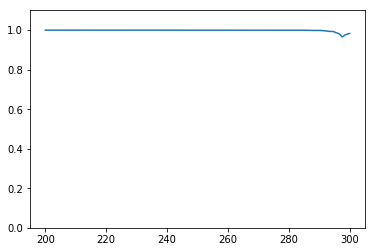

Test 450
True spectrum: 


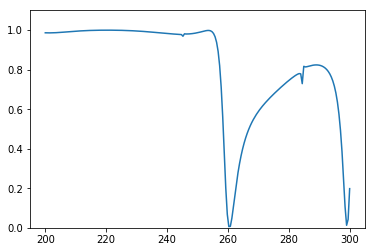

Predicted spectrum: 


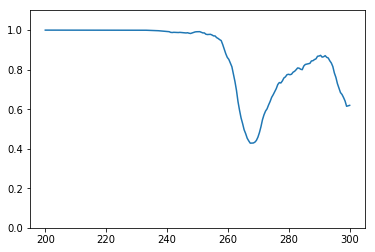

Test 451
True spectrum: 


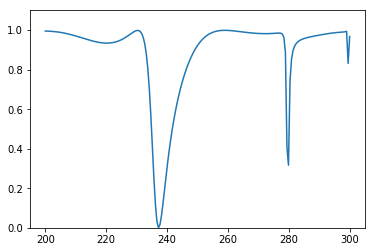

Predicted spectrum: 


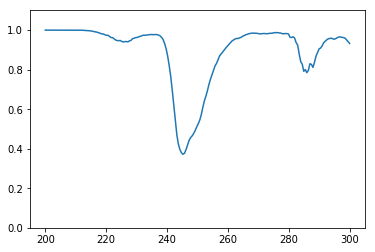

Test 452
True spectrum: 


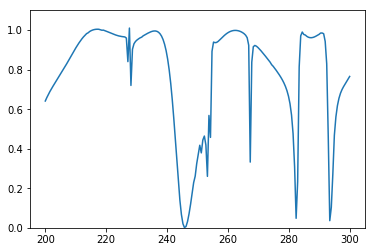

Predicted spectrum: 


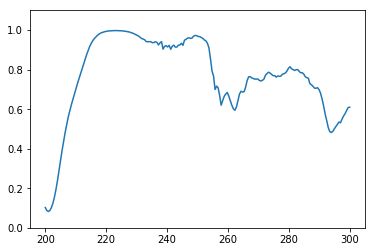

Test 453
True spectrum: 


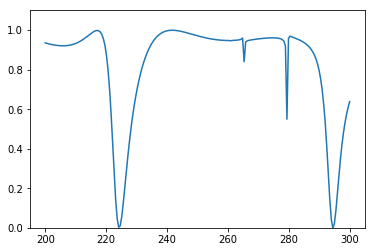

Predicted spectrum: 


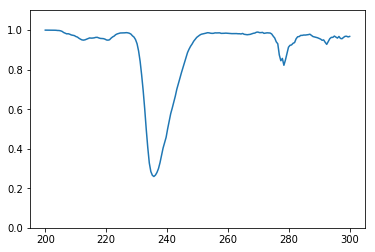

Test 454
True spectrum: 


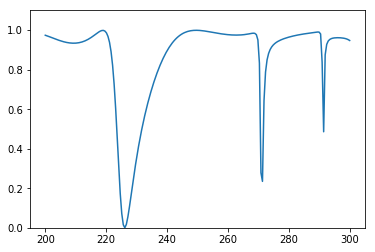

Predicted spectrum: 


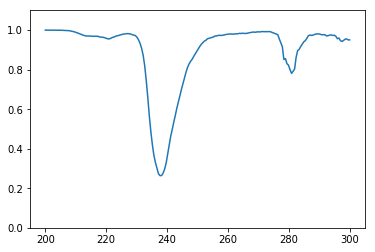

Test 455
True spectrum: 


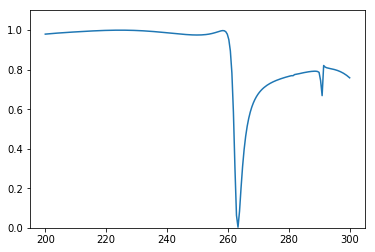

Predicted spectrum: 


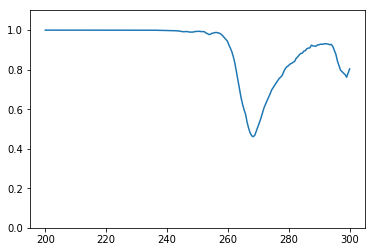

Test 456
True spectrum: 


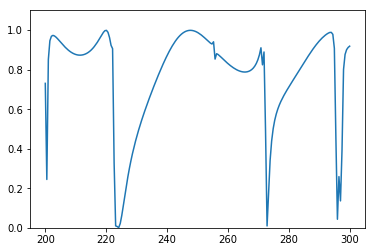

Predicted spectrum: 


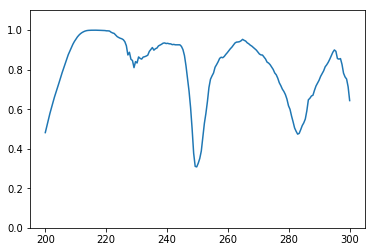

Test 457
True spectrum: 


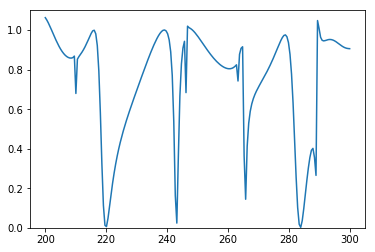

Predicted spectrum: 


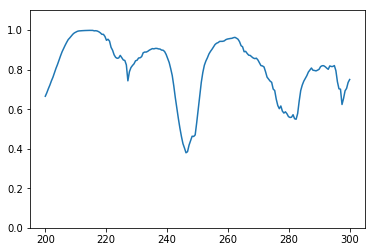

Test 458
True spectrum: 


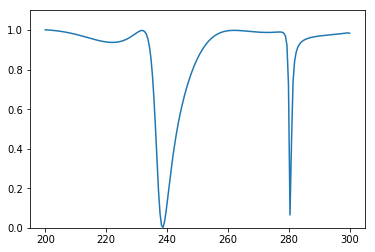

Predicted spectrum: 


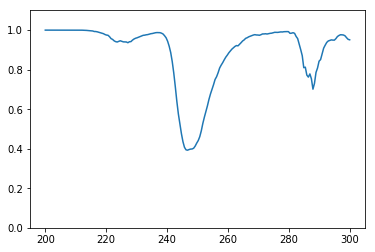

Test 459
True spectrum: 


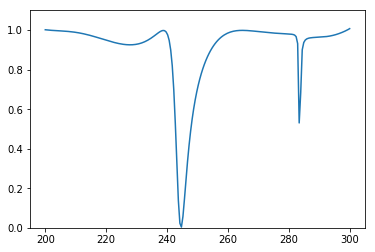

Predicted spectrum: 


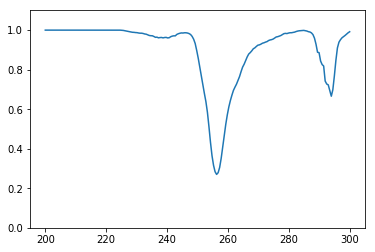

Test 460
True spectrum: 


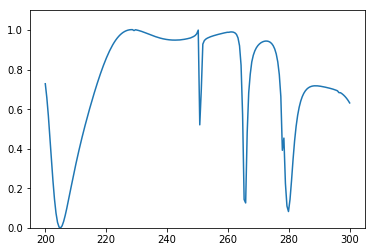

Predicted spectrum: 


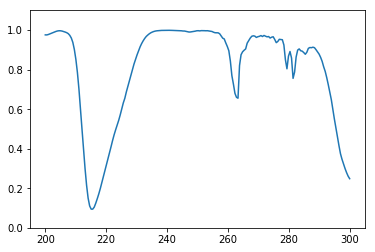

Test 461
True spectrum: 


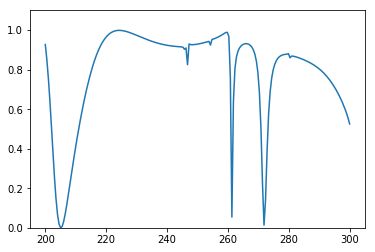

Predicted spectrum: 


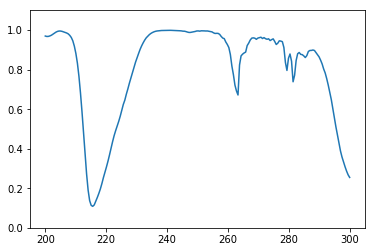

Test 462
True spectrum: 


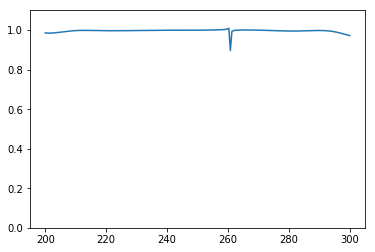

Predicted spectrum: 


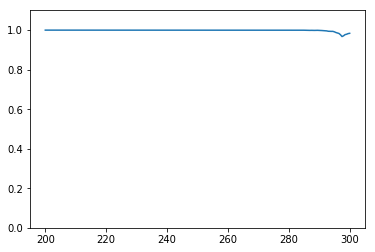

Test 463
True spectrum: 


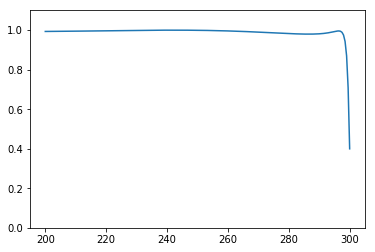

Predicted spectrum: 


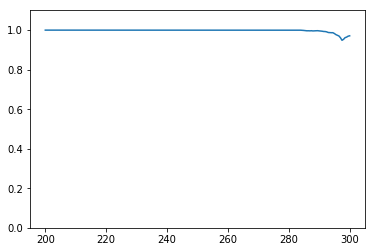

Test 464
True spectrum: 


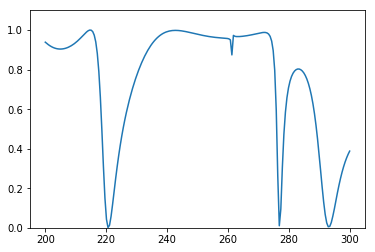

Predicted spectrum: 


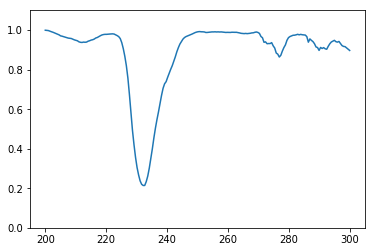

Test 465
True spectrum: 


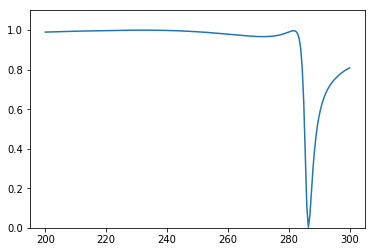

Predicted spectrum: 


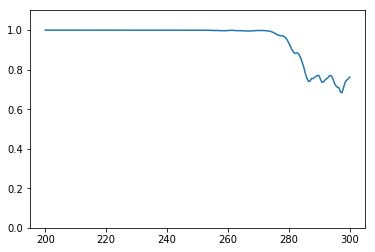

Test 466
True spectrum: 


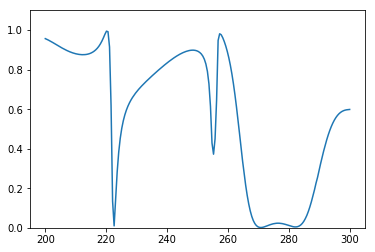

Predicted spectrum: 


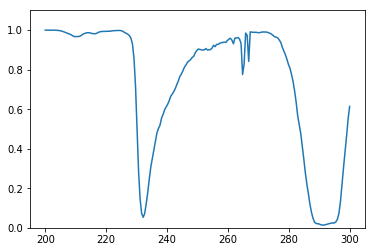

Test 467
True spectrum: 


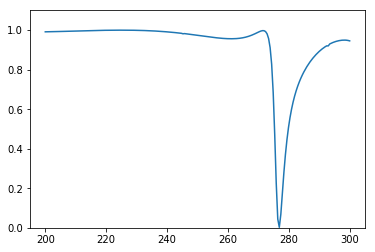

Predicted spectrum: 


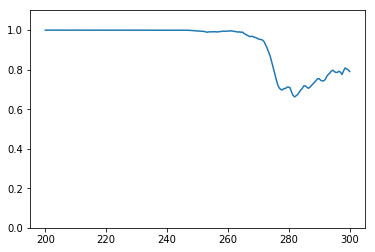

Test 468
True spectrum: 


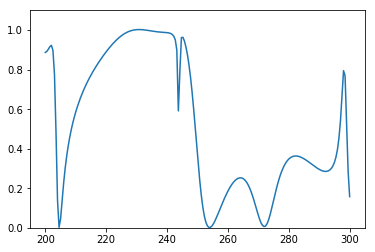

Predicted spectrum: 


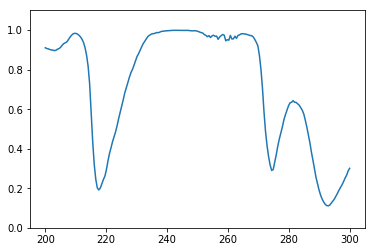

Test 469
True spectrum: 


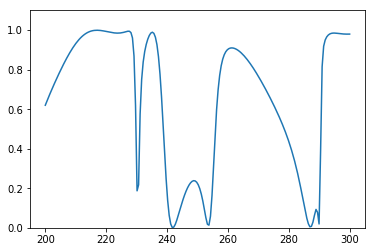

Predicted spectrum: 


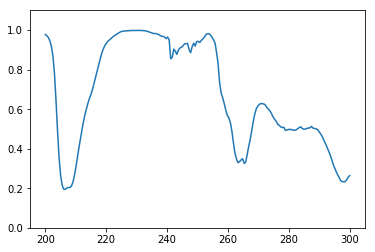

Test 470
True spectrum: 


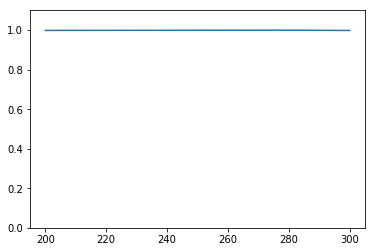

Predicted spectrum: 


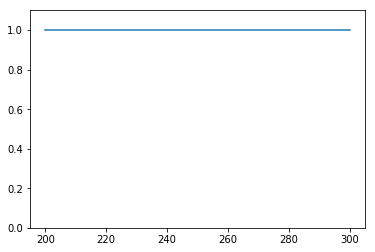

Test 471
True spectrum: 


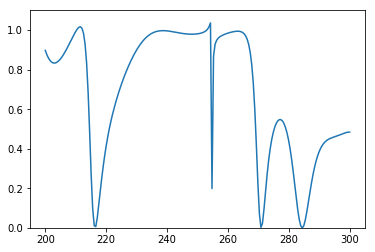

Predicted spectrum: 


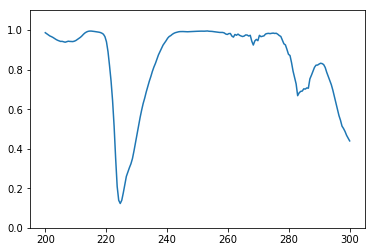

Test 472
True spectrum: 


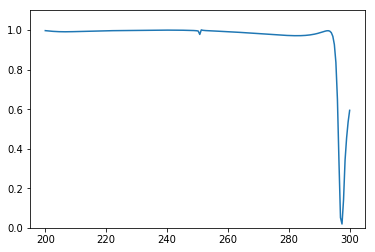

Predicted spectrum: 


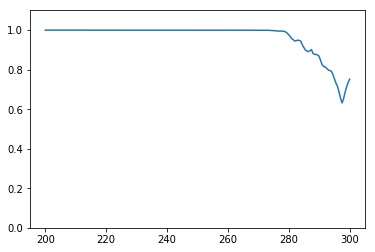

Test 473
True spectrum: 


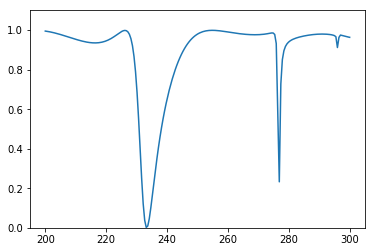

Predicted spectrum: 


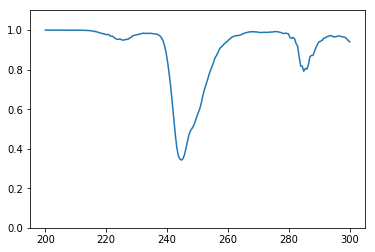

Test 474
True spectrum: 


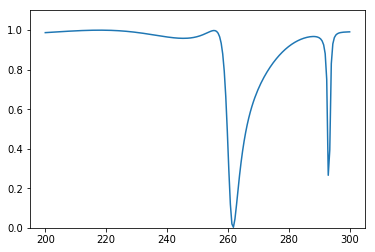

Predicted spectrum: 


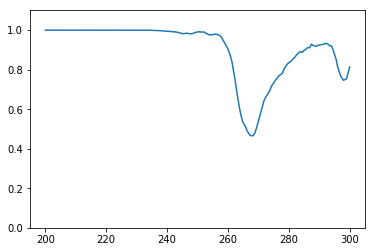

Test 475
True spectrum: 


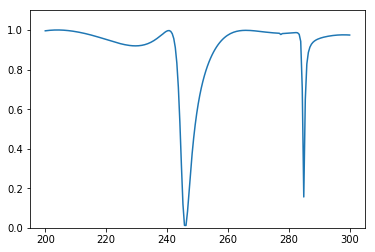

Predicted spectrum: 


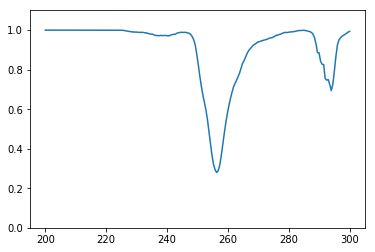

Test 476
True spectrum: 


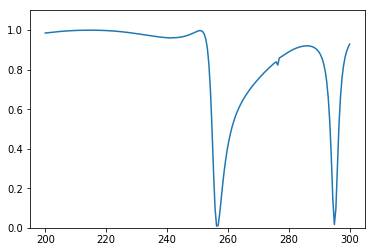

Predicted spectrum: 


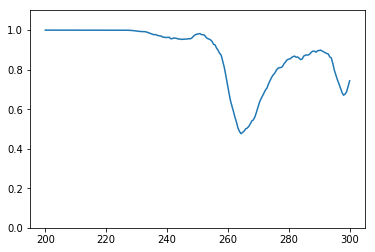

Test 477
True spectrum: 


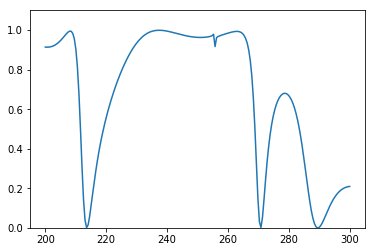

Predicted spectrum: 


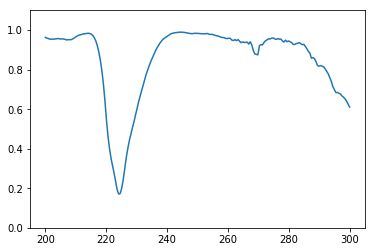

Test 478
True spectrum: 


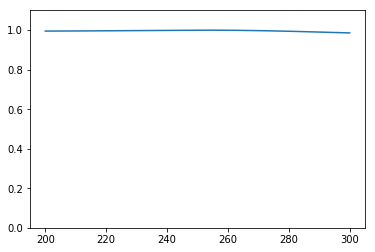

Predicted spectrum: 


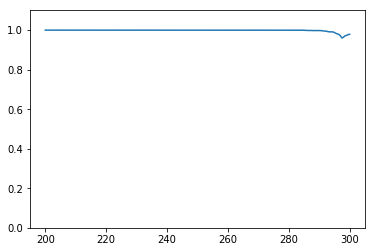

Test 479
True spectrum: 


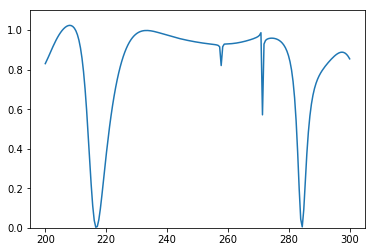

Predicted spectrum: 


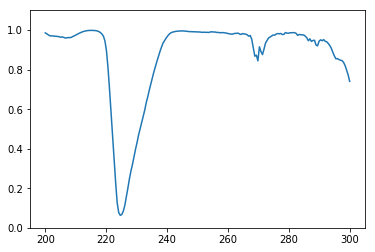

Test 480
True spectrum: 


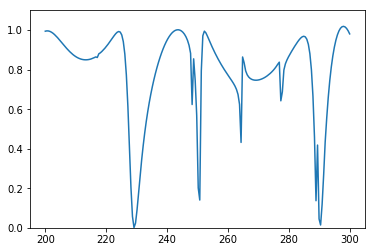

Predicted spectrum: 


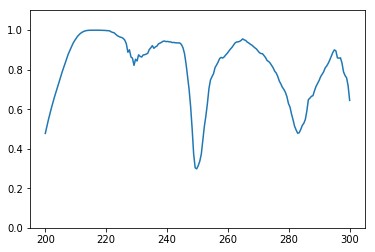

Test 481
True spectrum: 


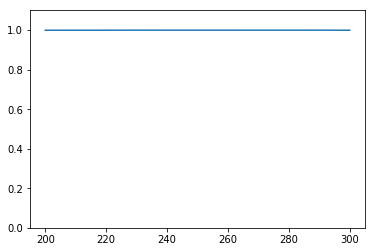

Predicted spectrum: 


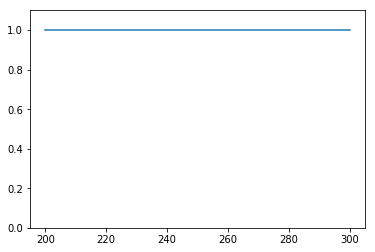

Test 482
True spectrum: 


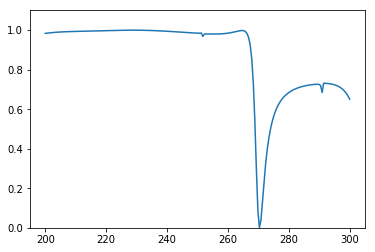

Predicted spectrum: 


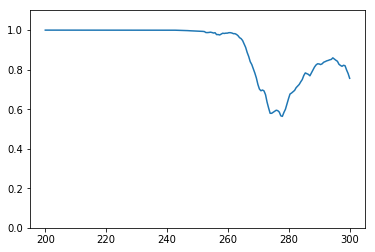

Test 483
True spectrum: 


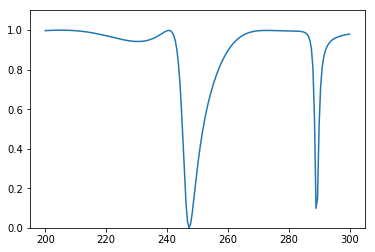

Predicted spectrum: 


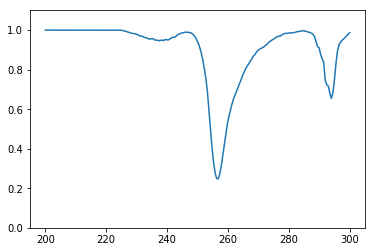

Test 484
True spectrum: 


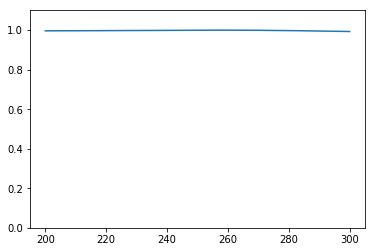

Predicted spectrum: 


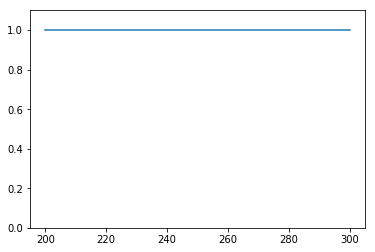

Test 485
True spectrum: 


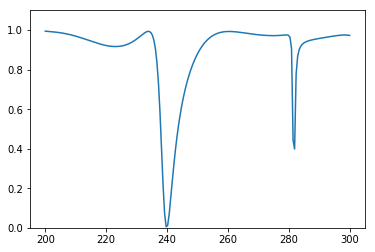

Predicted spectrum: 


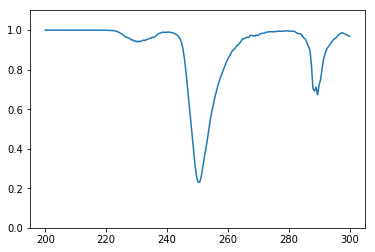

Test 486
True spectrum: 


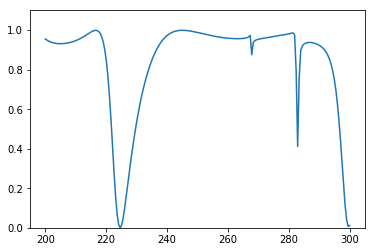

Predicted spectrum: 


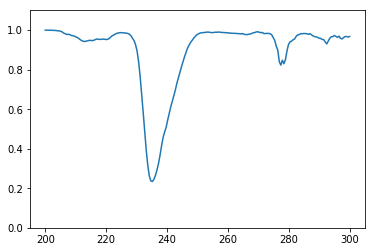

Test 487
True spectrum: 


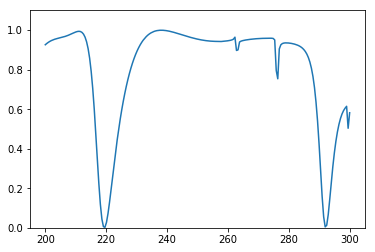

Predicted spectrum: 


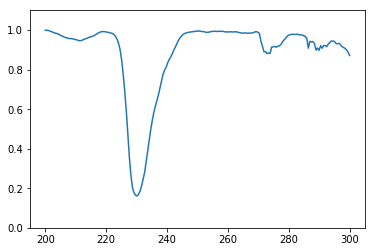

Test 488
True spectrum: 


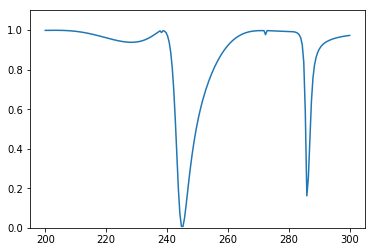

Predicted spectrum: 


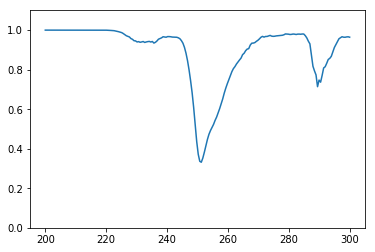

Test 489
True spectrum: 


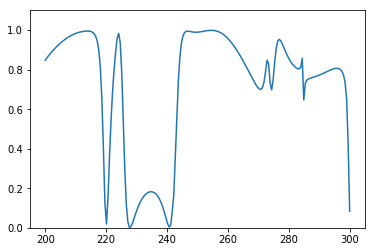

Predicted spectrum: 


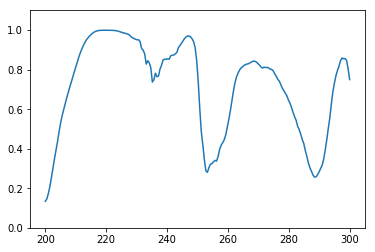

Test 490
True spectrum: 


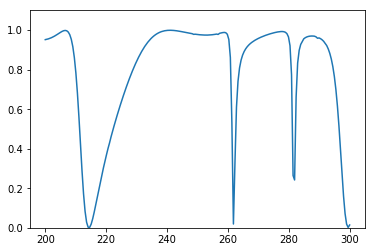

Predicted spectrum: 


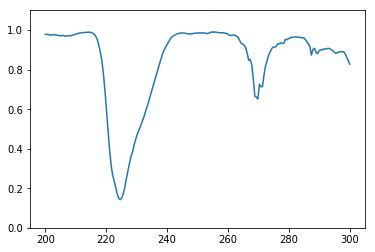

Test 491
True spectrum: 


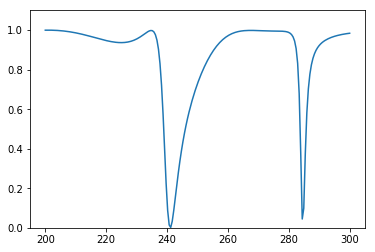

Predicted spectrum: 


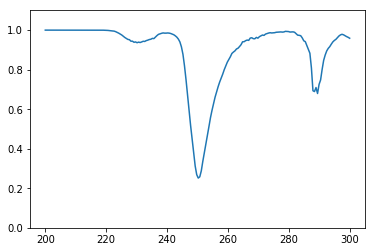

Test 492
True spectrum: 


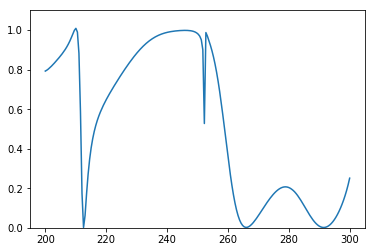

Predicted spectrum: 


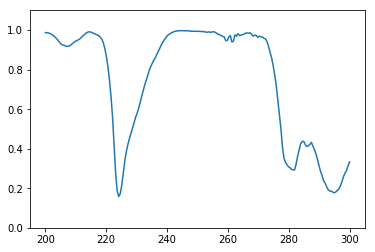

Test 493
True spectrum: 


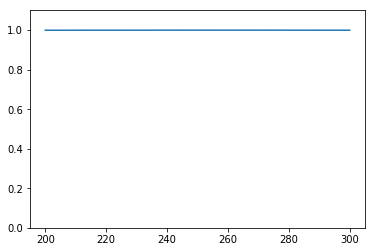

Predicted spectrum: 


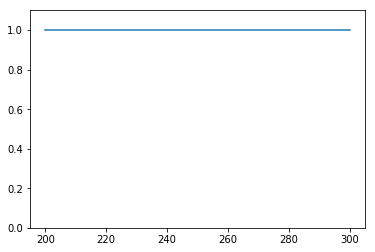

Test 494
True spectrum: 


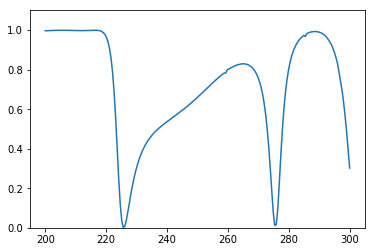

Predicted spectrum: 


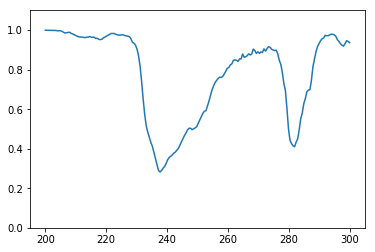

Test 495
True spectrum: 


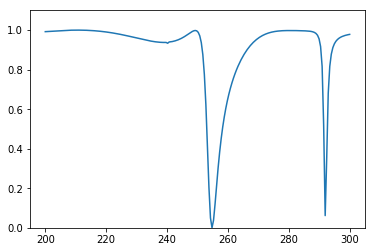

Predicted spectrum: 


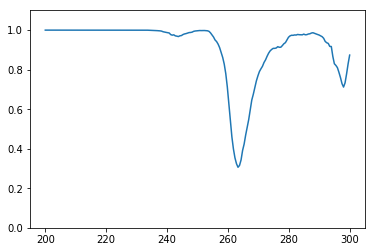

Test 496
True spectrum: 


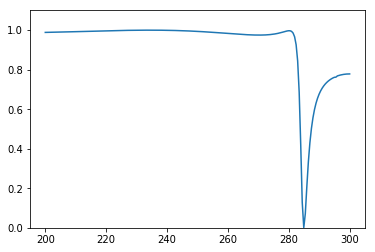

Predicted spectrum: 


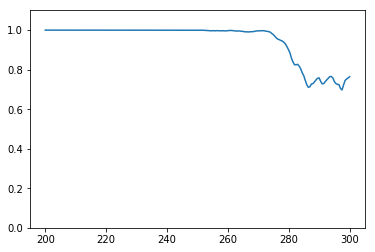

Test 497
True spectrum: 


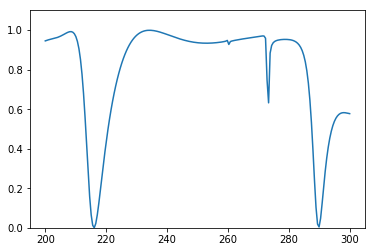

Predicted spectrum: 


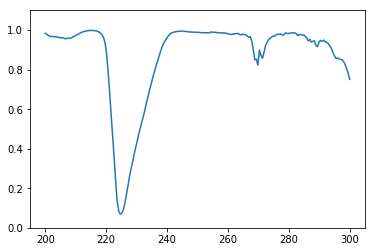

Test 498
True spectrum: 


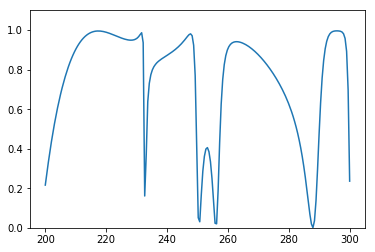

Predicted spectrum: 


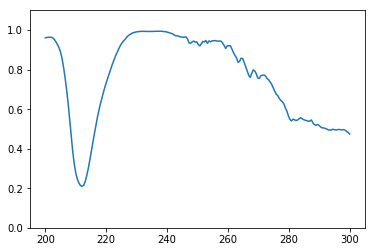

Test 499
True spectrum: 


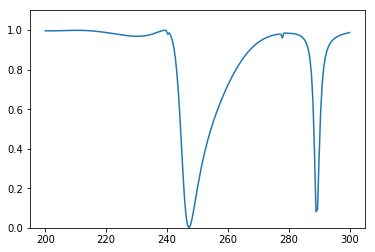

Predicted spectrum: 


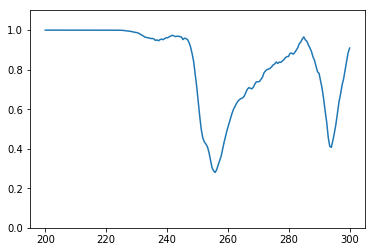

Test 500
True spectrum: 


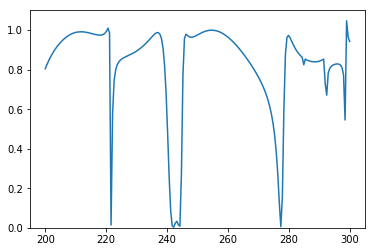

Predicted spectrum: 


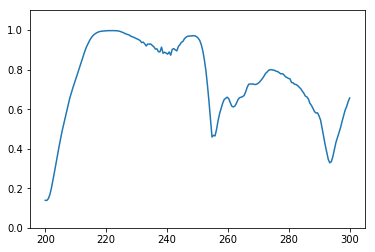

Test 501
True spectrum: 


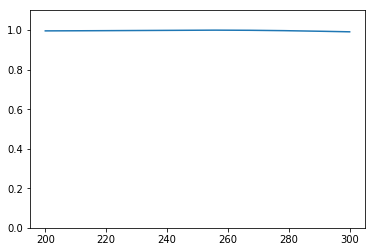

Predicted spectrum: 


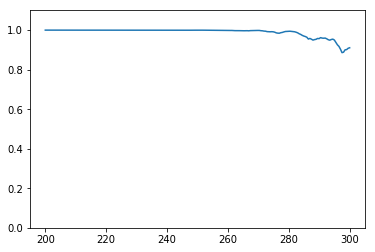

Test 502
True spectrum: 


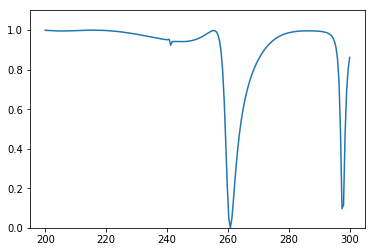

Predicted spectrum: 


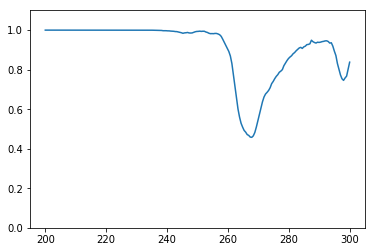

Test 503
True spectrum: 


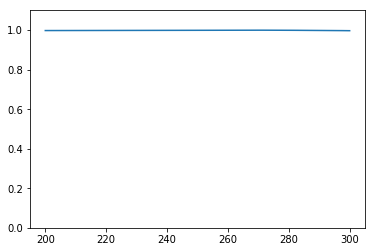

Predicted spectrum: 


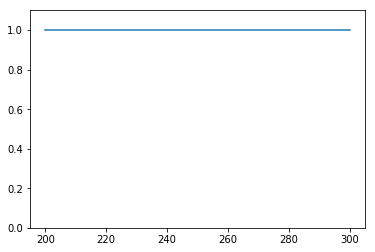

Test 504
True spectrum: 


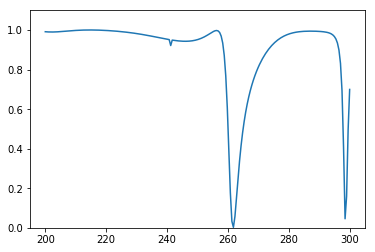

Predicted spectrum: 


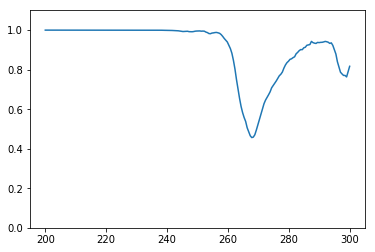

Test 505
True spectrum: 


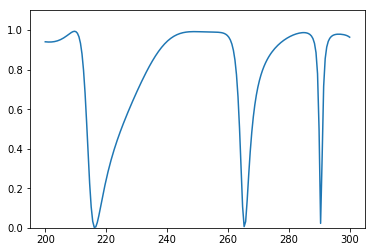

Predicted spectrum: 


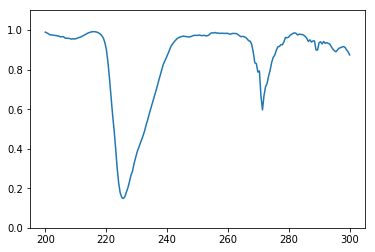

Test 506
True spectrum: 


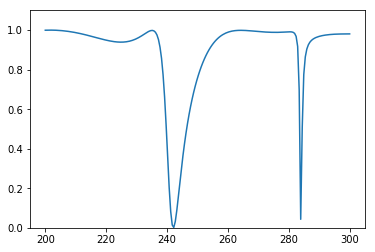

Predicted spectrum: 


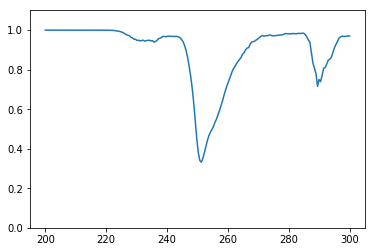

Test 507
True spectrum: 


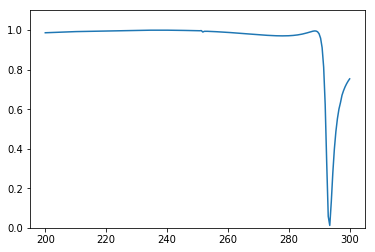

Predicted spectrum: 


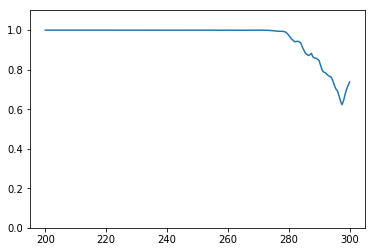

Test 508
True spectrum: 


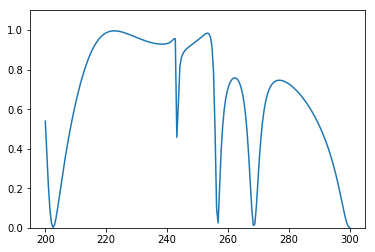

Predicted spectrum: 


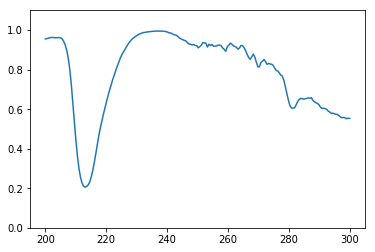

Test 509
True spectrum: 


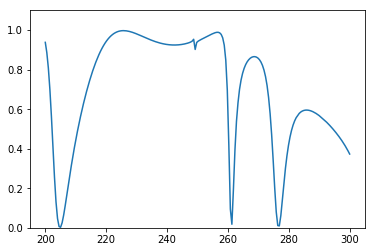

Predicted spectrum: 


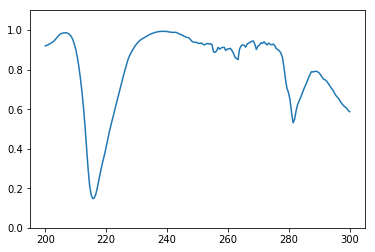

Test 510
True spectrum: 


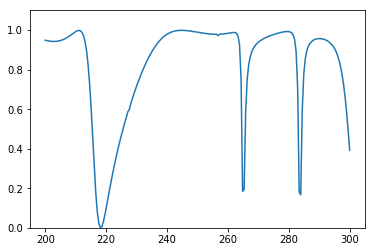

Predicted spectrum: 


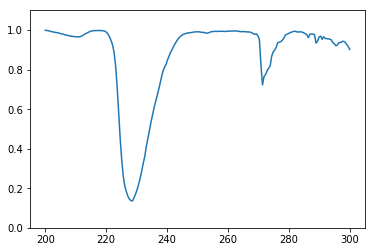

Test 511
True spectrum: 


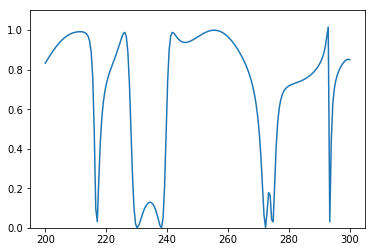

Predicted spectrum: 


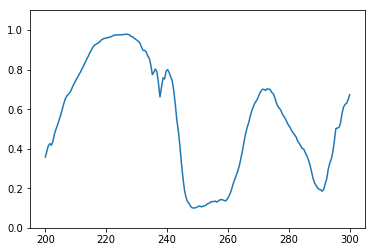

Test 512
True spectrum: 


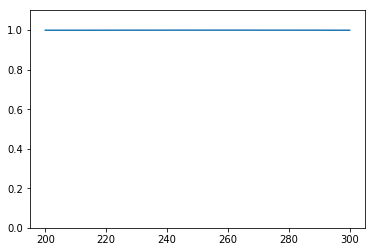

Predicted spectrum: 


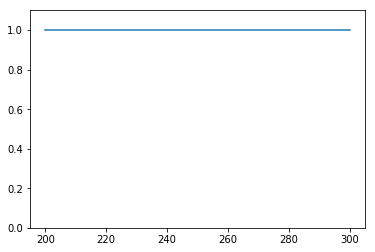

Test 513
True spectrum: 


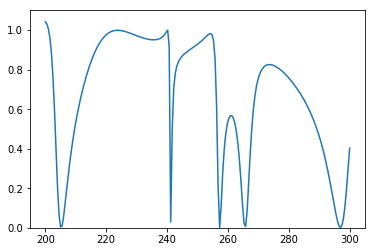

Predicted spectrum: 


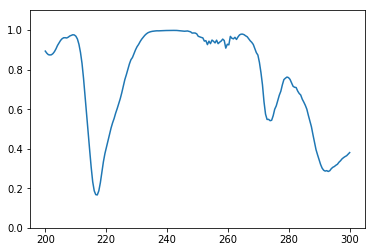

Test 514
True spectrum: 


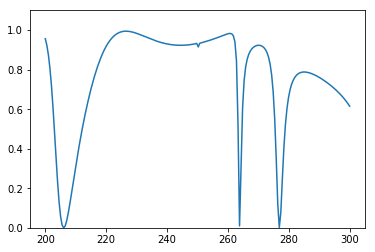

Predicted spectrum: 


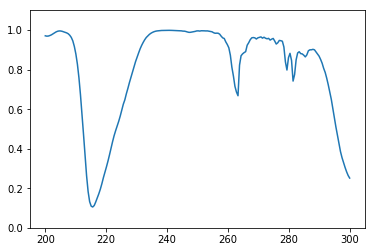

Test 515
True spectrum: 


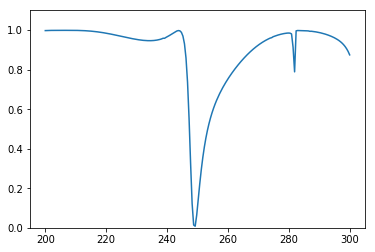

Predicted spectrum: 


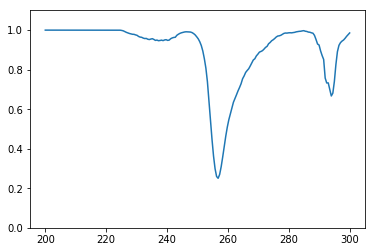

Test 516
True spectrum: 


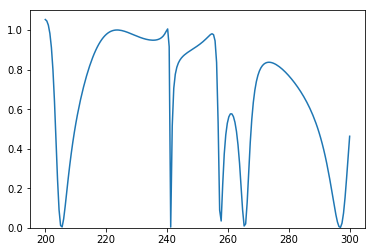

Predicted spectrum: 


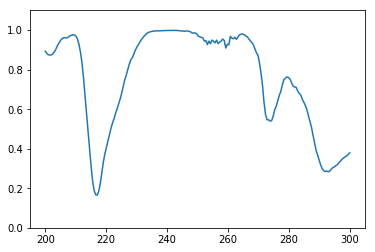

Test 517
True spectrum: 


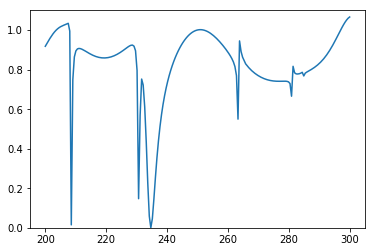

Predicted spectrum: 


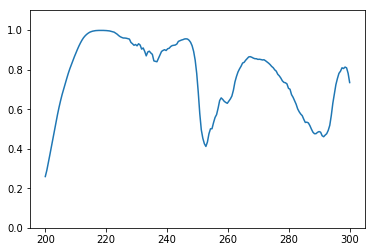

Test 518
True spectrum: 


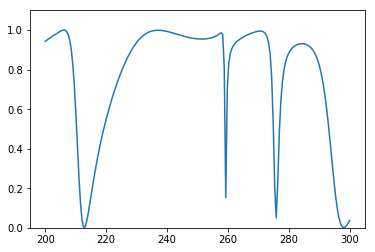

Predicted spectrum: 


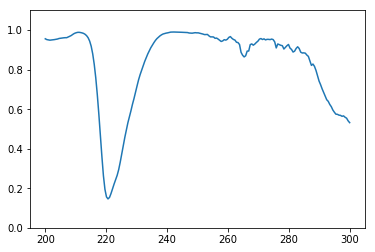

Test 519
True spectrum: 


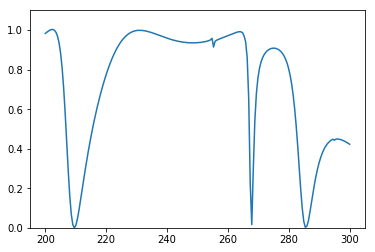

Predicted spectrum: 


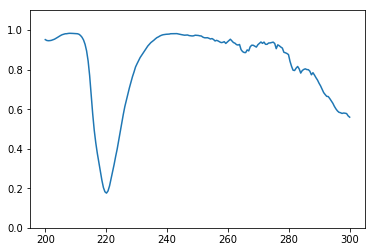

Test 520
True spectrum: 


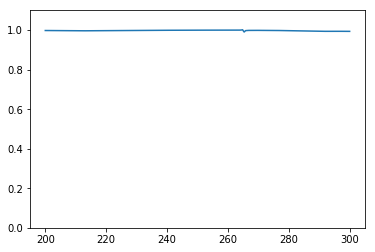

Predicted spectrum: 


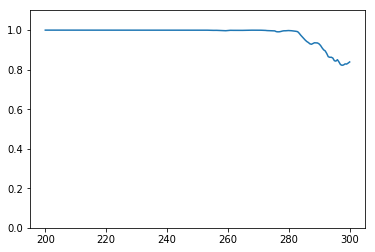

Test 521
True spectrum: 


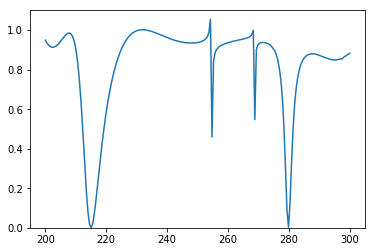

Predicted spectrum: 


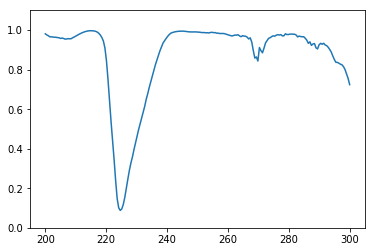

Test 522
True spectrum: 


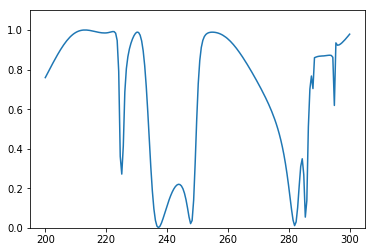

Predicted spectrum: 


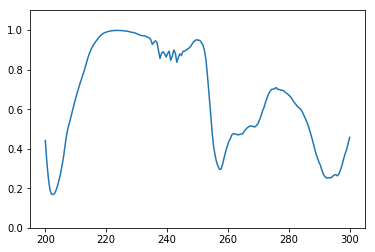

Test 523
True spectrum: 


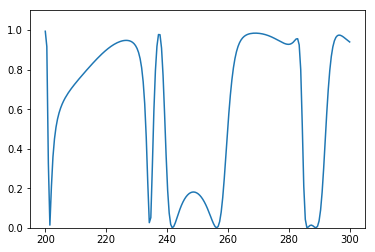

Predicted spectrum: 


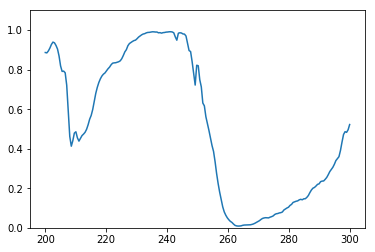

Test 524
True spectrum: 


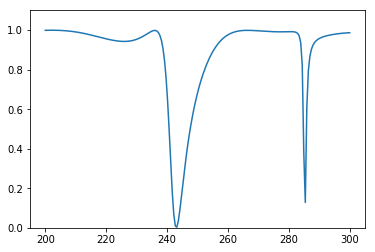

Predicted spectrum: 


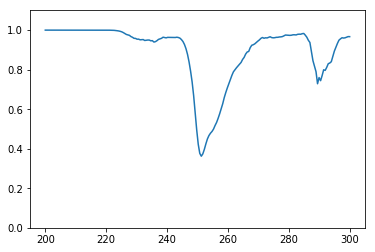

Test 525
True spectrum: 


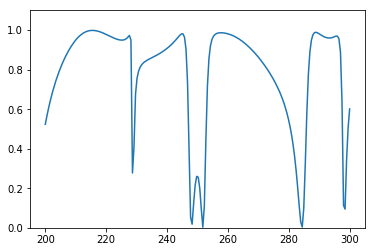

Predicted spectrum: 


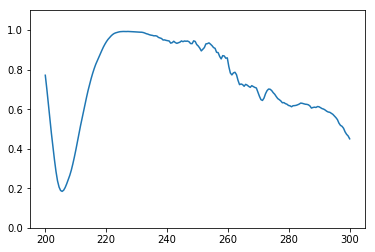

Test 526
True spectrum: 


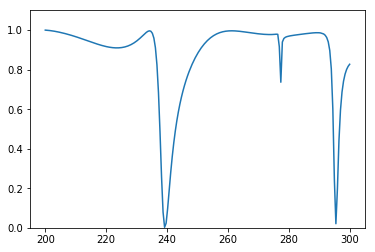

Predicted spectrum: 


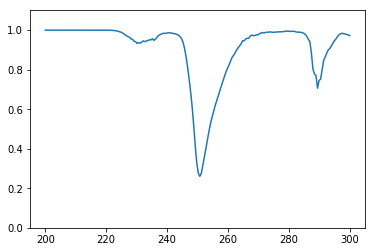

Test 527
True spectrum: 


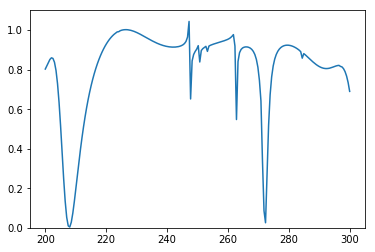

Predicted spectrum: 


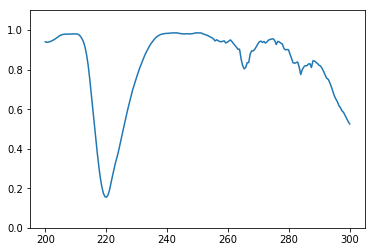

Test 528
True spectrum: 


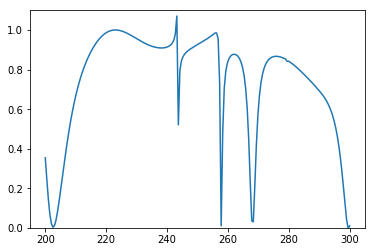

Predicted spectrum: 


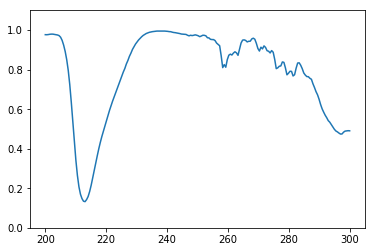

Test 529
True spectrum: 


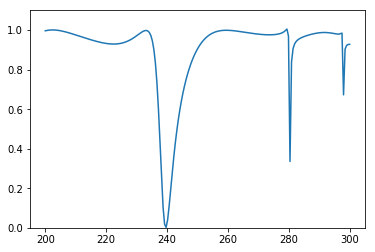

Predicted spectrum: 


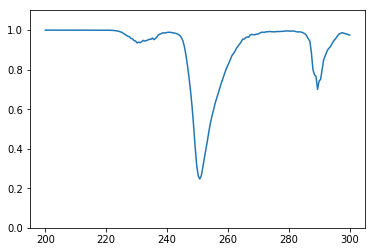

Test 530
True spectrum: 


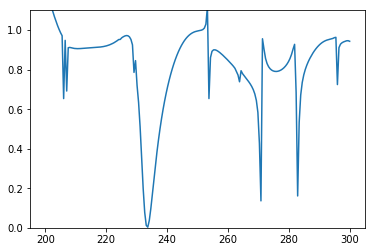

Predicted spectrum: 


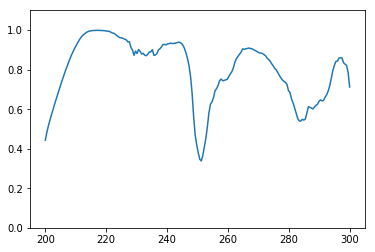

Test 531
True spectrum: 


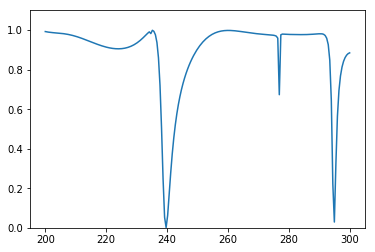

Predicted spectrum: 


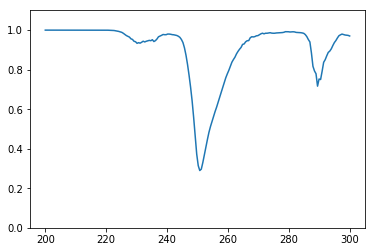

Test 532
True spectrum: 


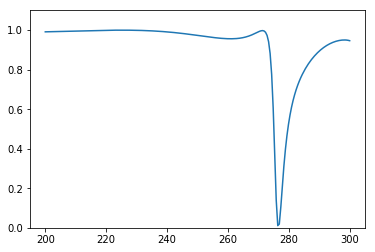

Predicted spectrum: 


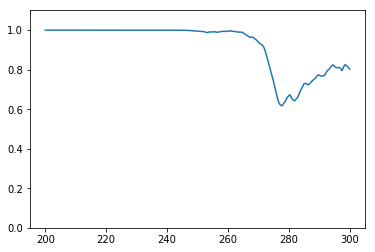

Test 533
True spectrum: 


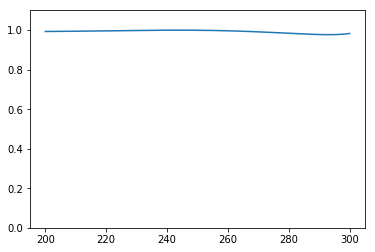

Predicted spectrum: 


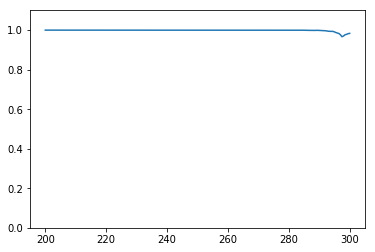

Test 534
True spectrum: 


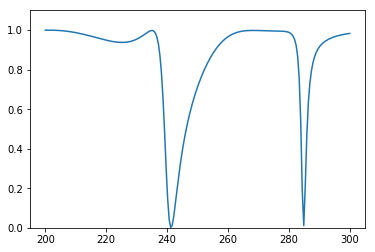

Predicted spectrum: 


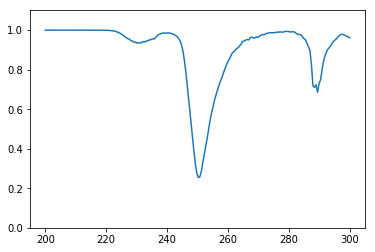

Test 535
True spectrum: 


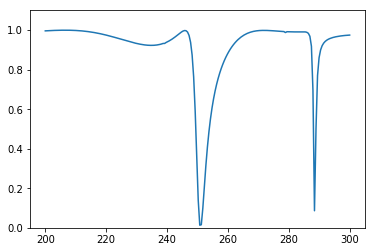

Predicted spectrum: 


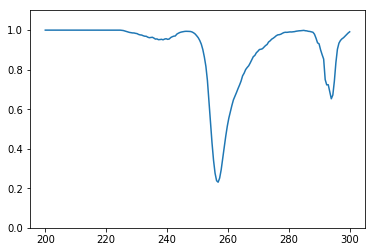

Test 536
True spectrum: 


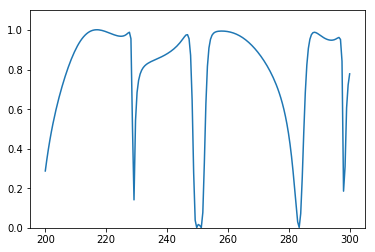

Predicted spectrum: 


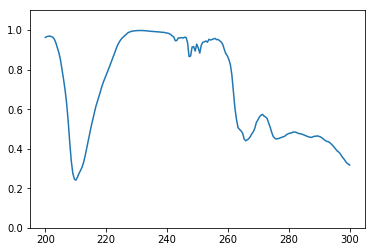

Test 537
True spectrum: 


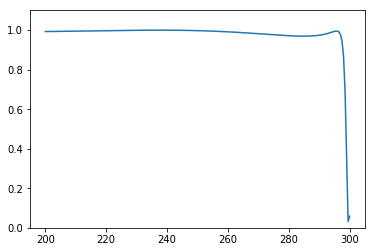

Predicted spectrum: 


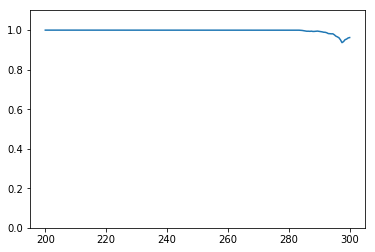

Test 538
True spectrum: 


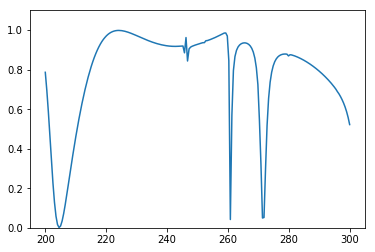

Predicted spectrum: 


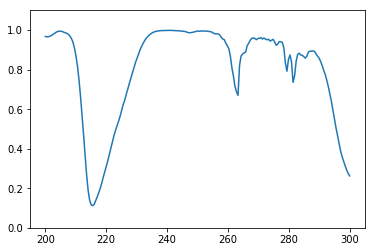

Test 539
True spectrum: 


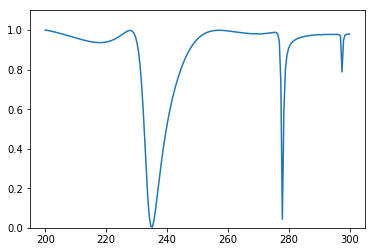

Predicted spectrum: 


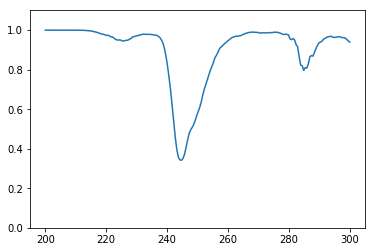

Test 540
True spectrum: 


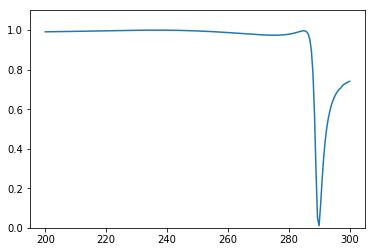

Predicted spectrum: 


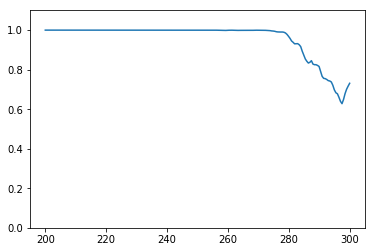

Test 541
True spectrum: 


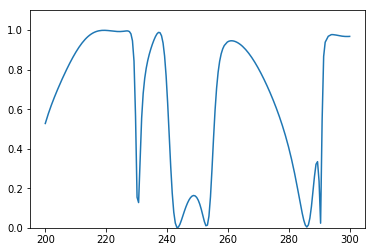

Predicted spectrum: 


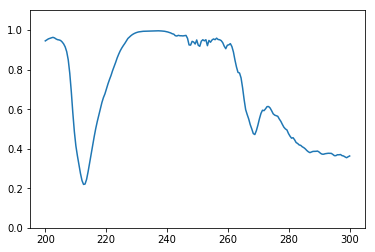

Test 542
True spectrum: 


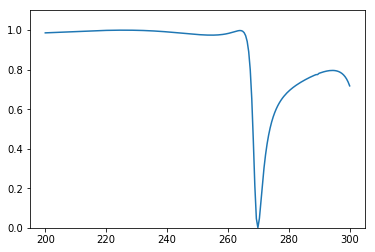

Predicted spectrum: 


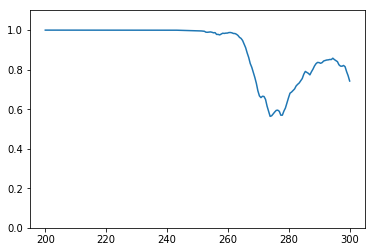

Test 543
True spectrum: 


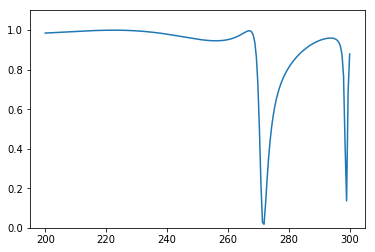

Predicted spectrum: 


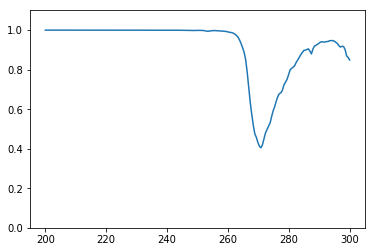

Test 544
True spectrum: 


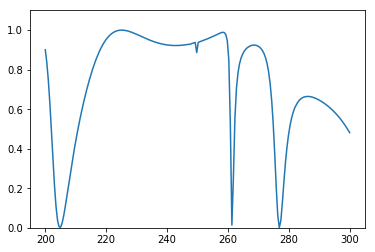

Predicted spectrum: 


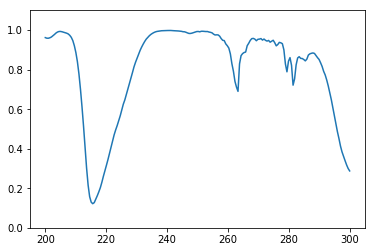

Test 545
True spectrum: 


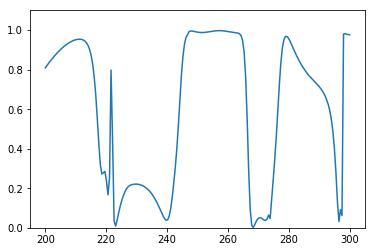

Predicted spectrum: 


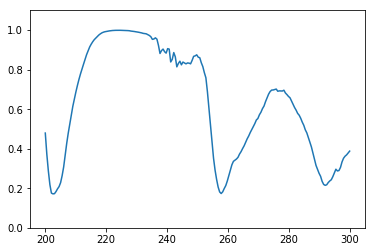

Test 546
True spectrum: 


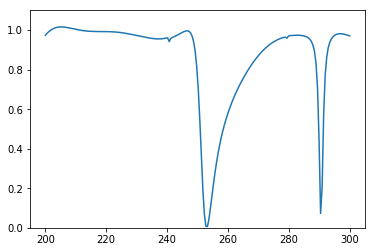

Predicted spectrum: 


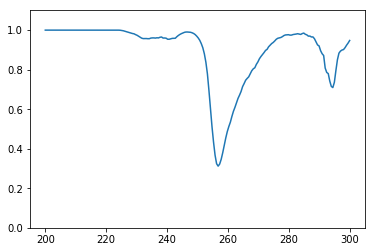

Test 547
True spectrum: 


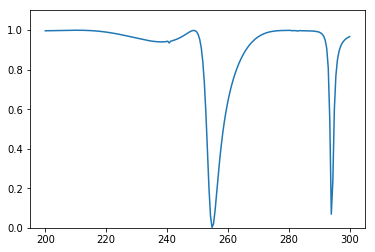

Predicted spectrum: 


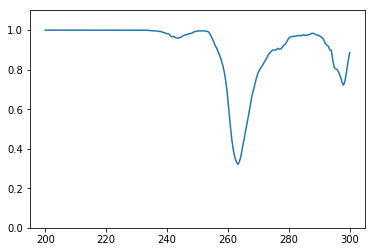

Test 548
True spectrum: 


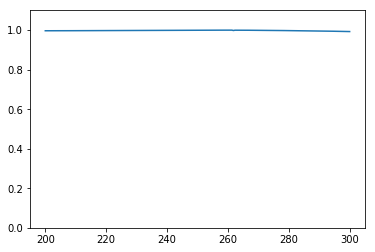

Predicted spectrum: 


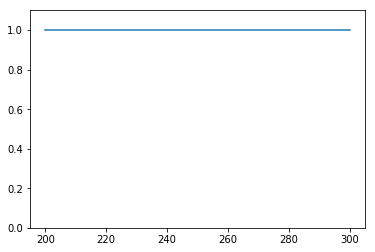

Test 549
True spectrum: 


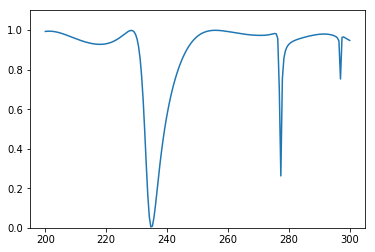

Predicted spectrum: 


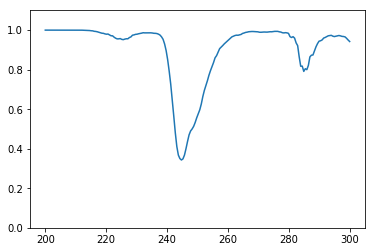

Test 550
True spectrum: 


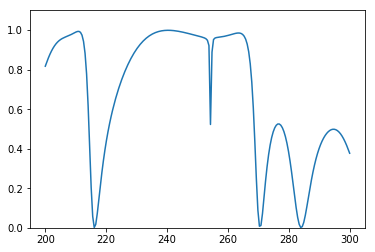

Predicted spectrum: 


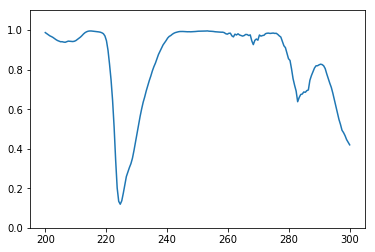

Test 551
True spectrum: 


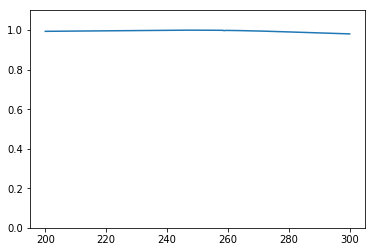

Predicted spectrum: 


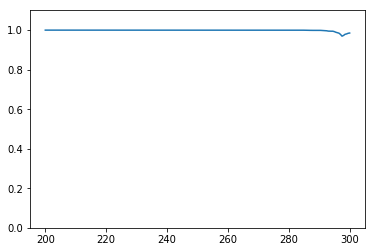

Test 552
True spectrum: 


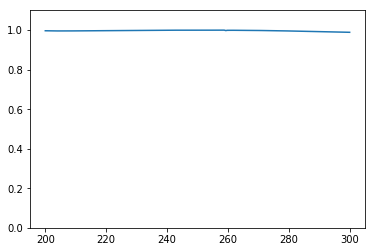

Predicted spectrum: 


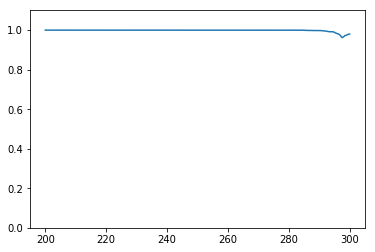

Test 553
True spectrum: 


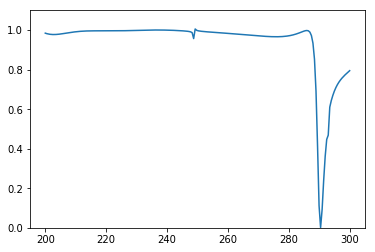

Predicted spectrum: 


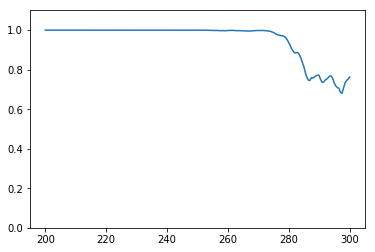

Test 554
True spectrum: 


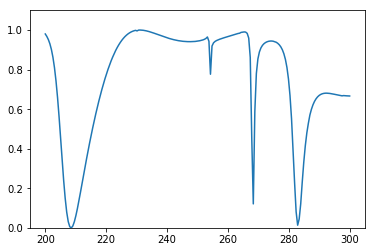

Predicted spectrum: 


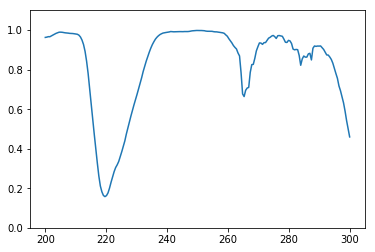

Test 555
True spectrum: 


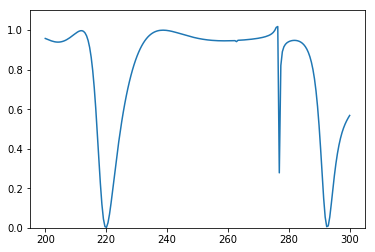

Predicted spectrum: 


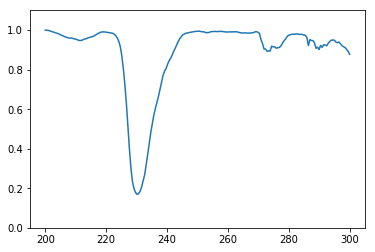

Test 556
True spectrum: 


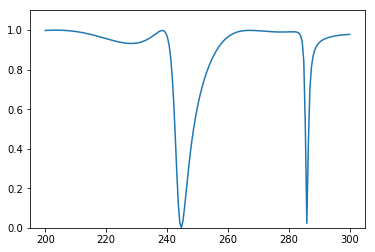

Predicted spectrum: 


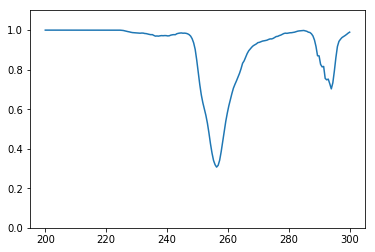

Test 557
True spectrum: 


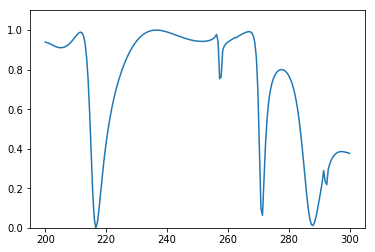

Predicted spectrum: 


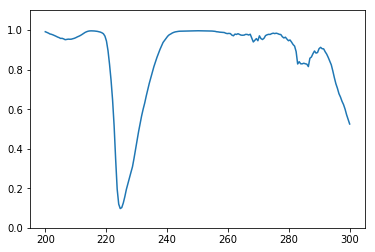

Test 558
True spectrum: 


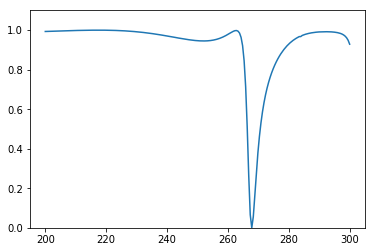

Predicted spectrum: 


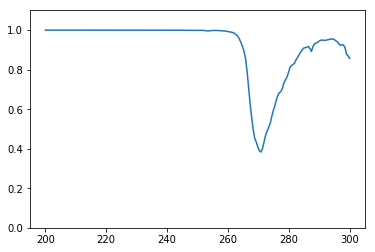

Test 559
True spectrum: 


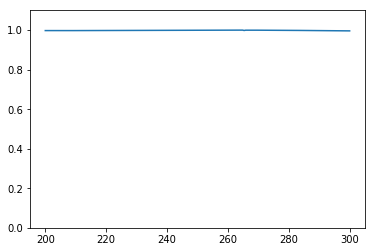

Predicted spectrum: 


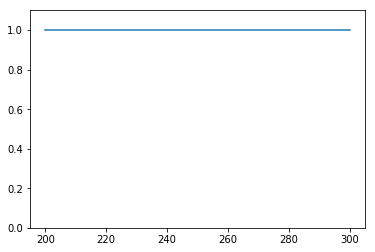

Test 560
True spectrum: 


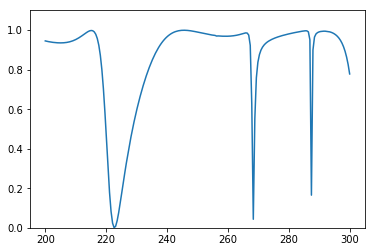

Predicted spectrum: 


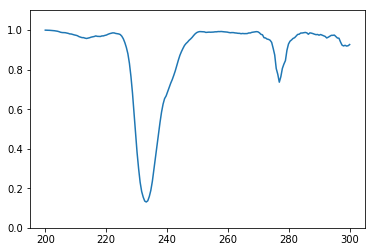

Test 561
True spectrum: 


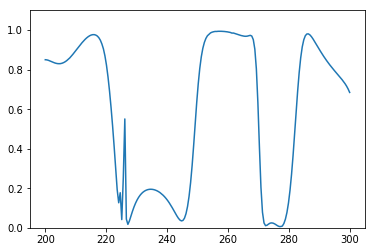

Predicted spectrum: 


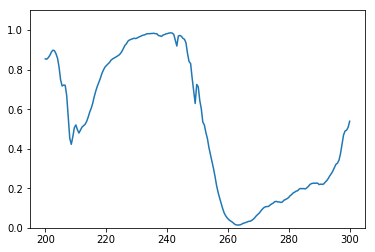

Test 562
True spectrum: 


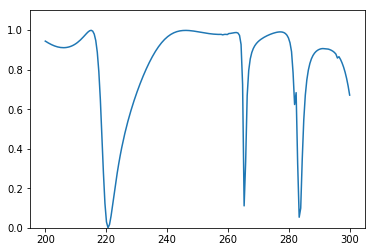

Predicted spectrum: 


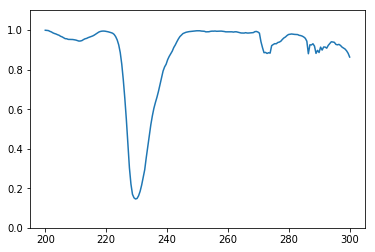

Test 563
True spectrum: 


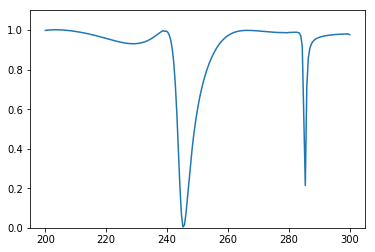

Predicted spectrum: 


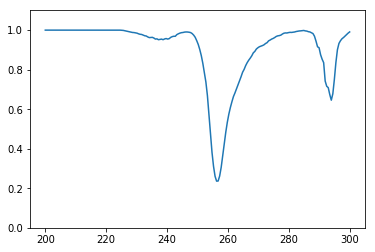

Test 564
True spectrum: 


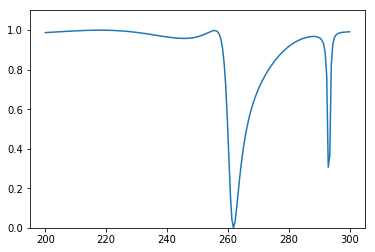

Predicted spectrum: 


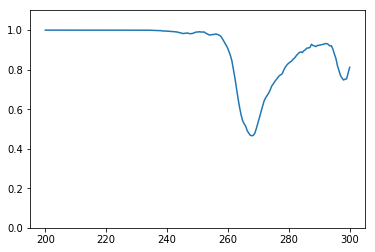

Test 565
True spectrum: 


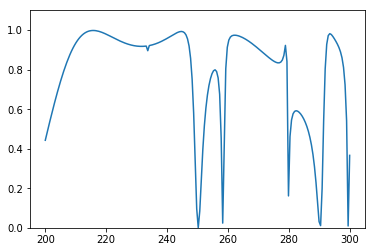

Predicted spectrum: 


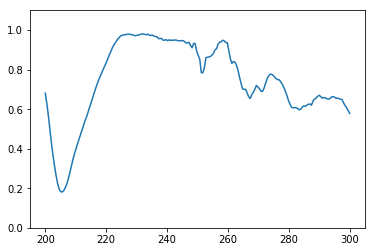

Test 566
True spectrum: 


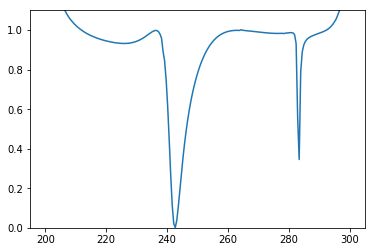

Predicted spectrum: 


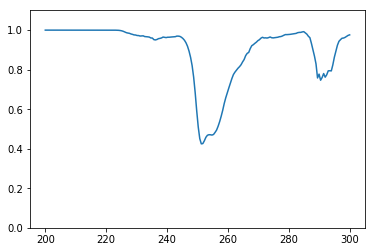

Test 567
True spectrum: 


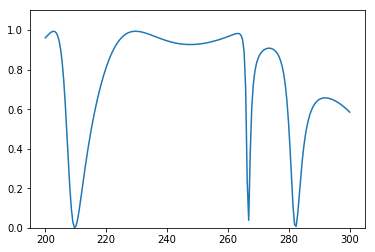

Predicted spectrum: 


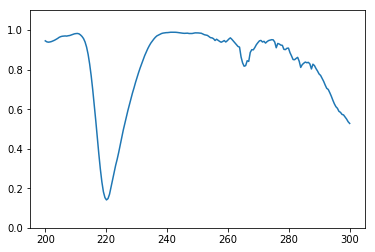

Test 568
True spectrum: 


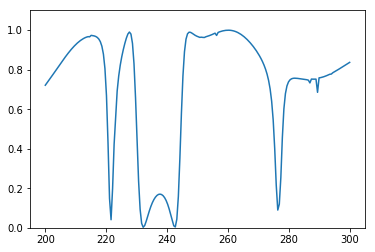

Predicted spectrum: 


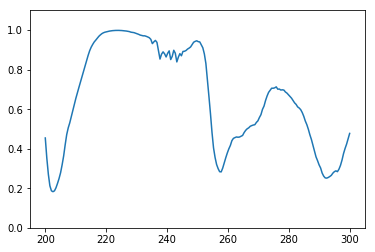

Test 569
True spectrum: 


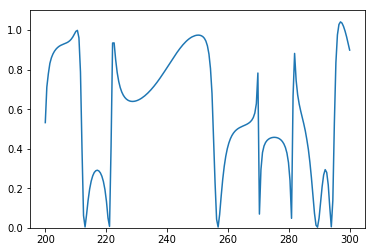

Predicted spectrum: 


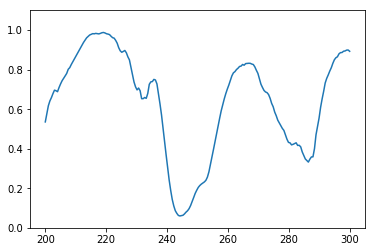

Test 570
True spectrum: 


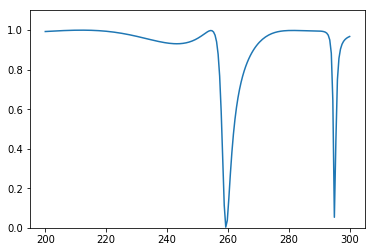

Predicted spectrum: 


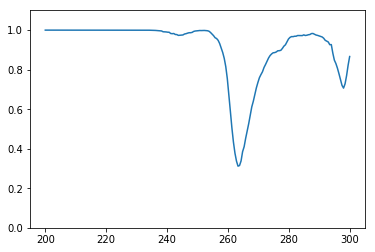

Test 571
True spectrum: 


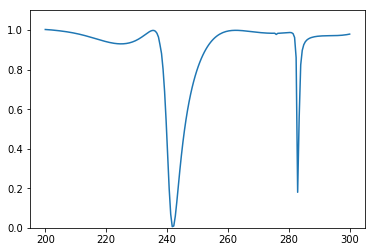

Predicted spectrum: 


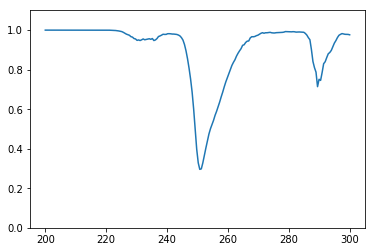

Test 572
True spectrum: 


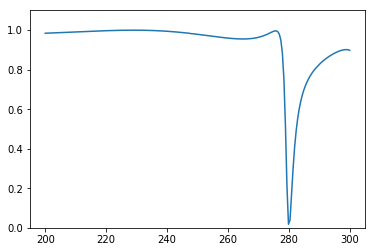

Predicted spectrum: 


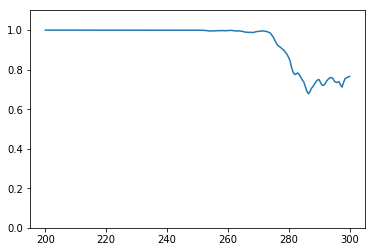

Test 573
True spectrum: 


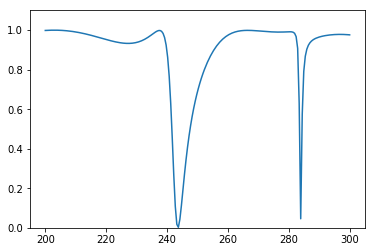

Predicted spectrum: 


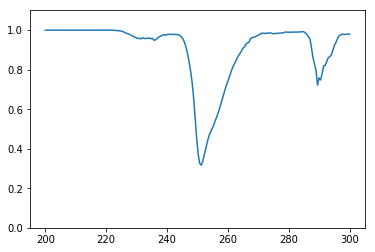

Test 574
True spectrum: 


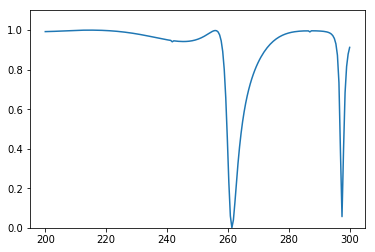

Predicted spectrum: 


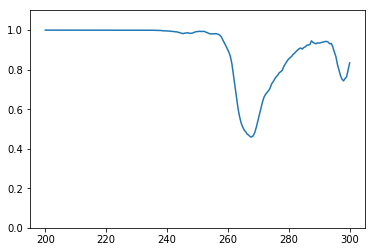

Test 575
True spectrum: 


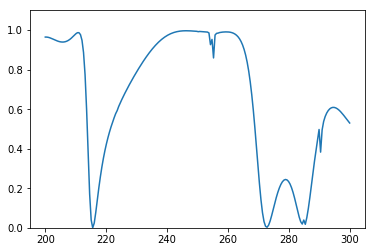

Predicted spectrum: 


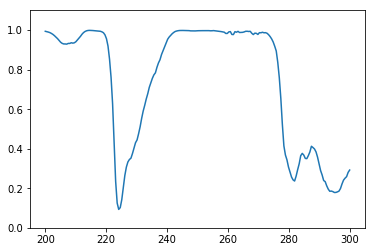

Test 576
True spectrum: 


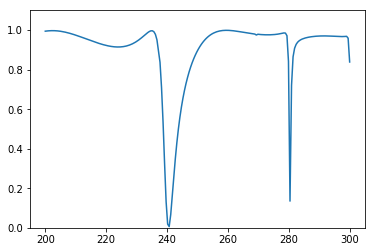

Predicted spectrum: 


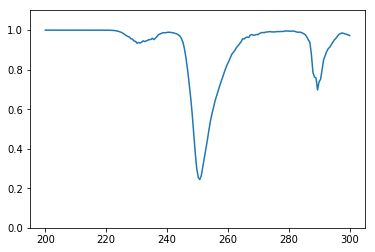

Test 577
True spectrum: 


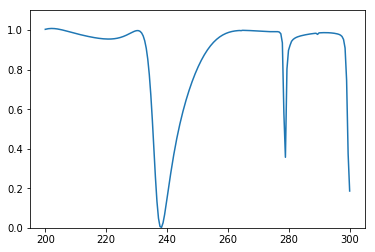

Predicted spectrum: 


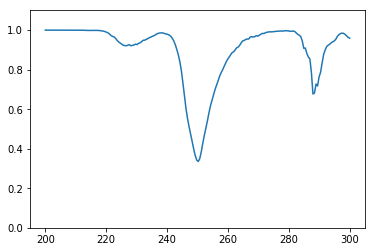

Test 578
True spectrum: 


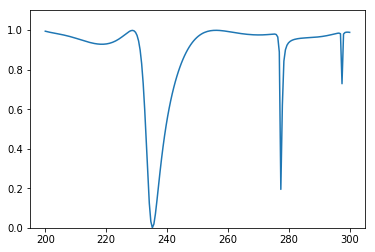

Predicted spectrum: 


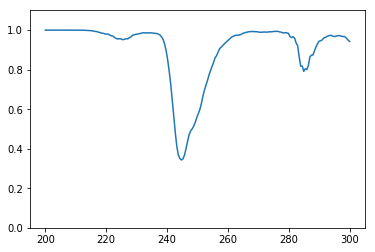

Test 579
True spectrum: 


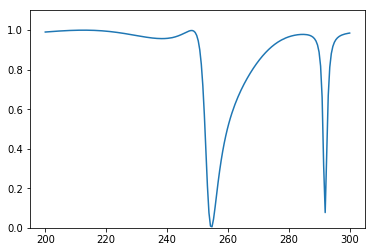

Predicted spectrum: 


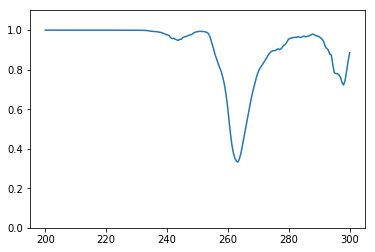

Test 580
True spectrum: 


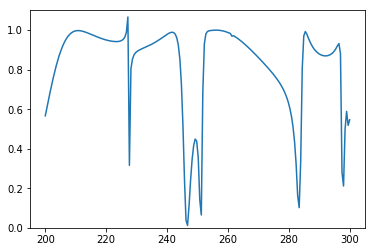

Predicted spectrum: 


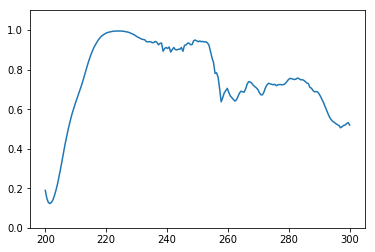

Test 581
True spectrum: 


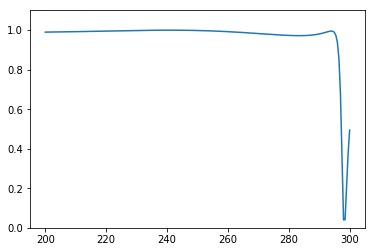

Predicted spectrum: 


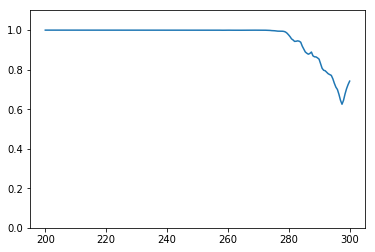

Test 582
True spectrum: 


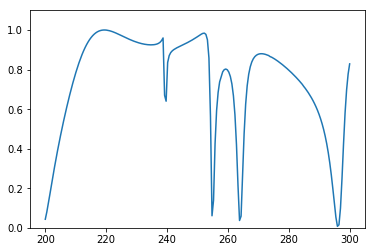

Predicted spectrum: 


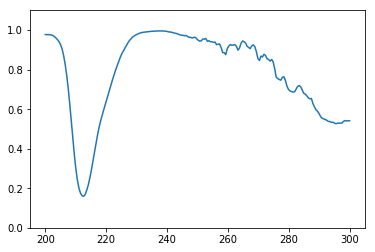

Test 583
True spectrum: 


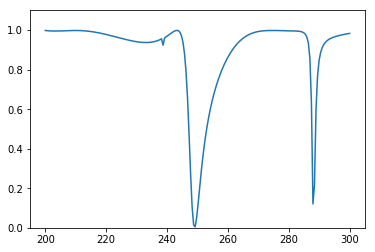

Predicted spectrum: 


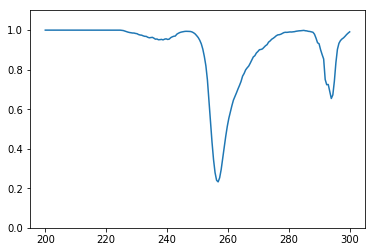

Test 584
True spectrum: 


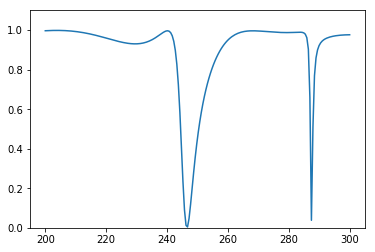

Predicted spectrum: 


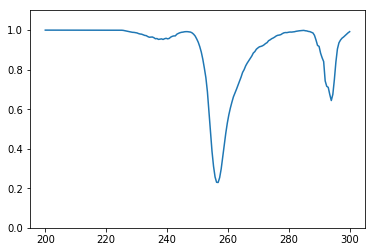

Test 585
True spectrum: 


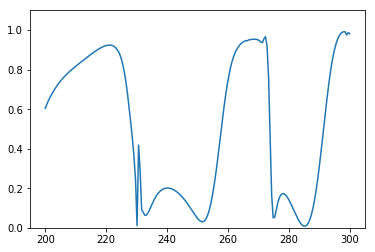

Predicted spectrum: 


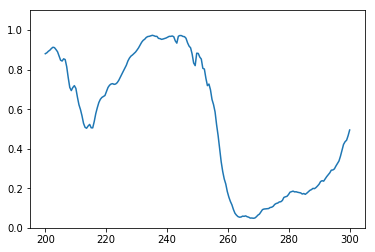

Test 586
True spectrum: 


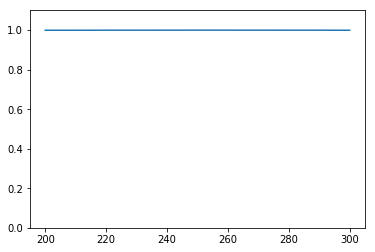

Predicted spectrum: 


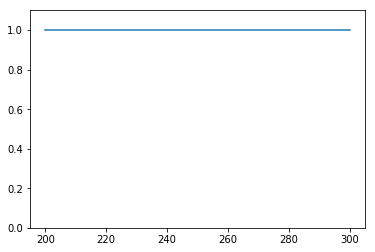

Test 587
True spectrum: 


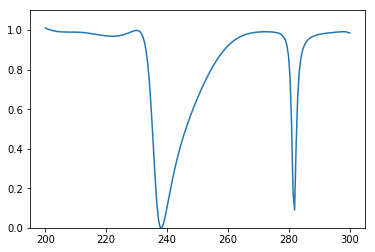

Predicted spectrum: 


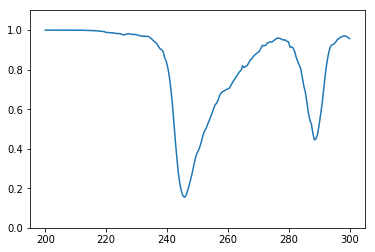

Test 588
True spectrum: 


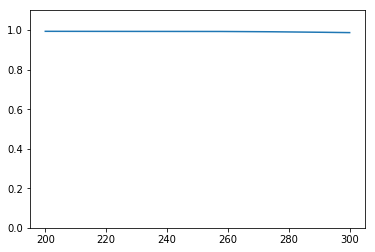

Predicted spectrum: 


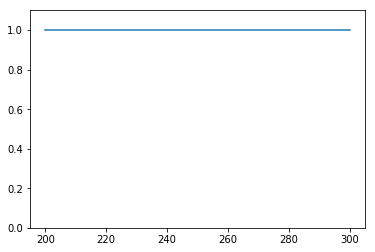

Test 589
True spectrum: 


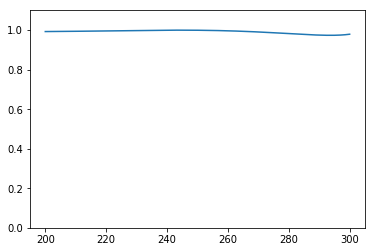

Predicted spectrum: 


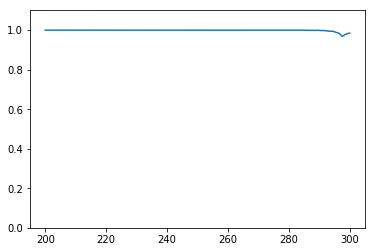

Test 590
True spectrum: 


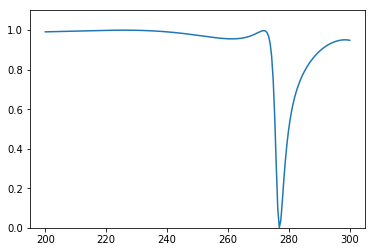

Predicted spectrum: 


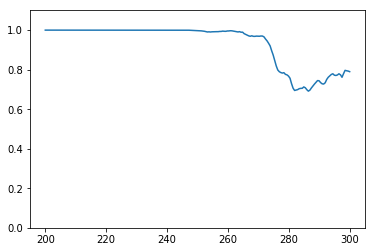

Test 591
True spectrum: 


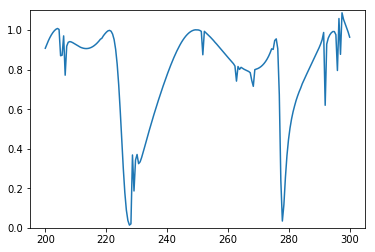

Predicted spectrum: 


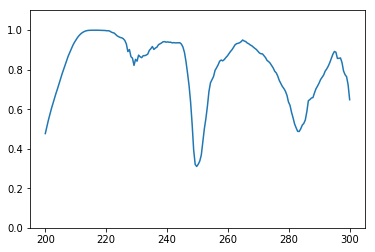

Test 592
True spectrum: 


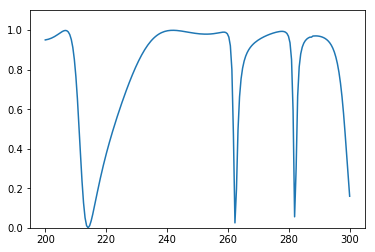

Predicted spectrum: 


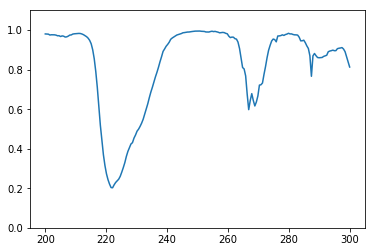

Test 593
True spectrum: 


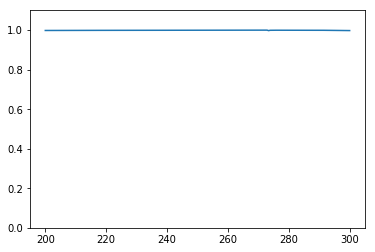

Predicted spectrum: 


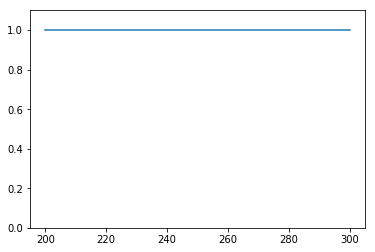

Test 594
True spectrum: 


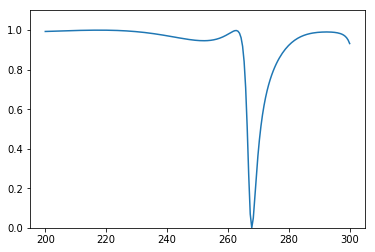

Predicted spectrum: 


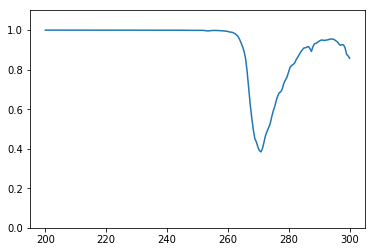

Test 595
True spectrum: 


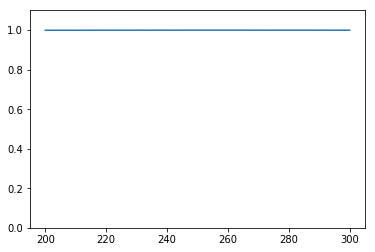

Predicted spectrum: 


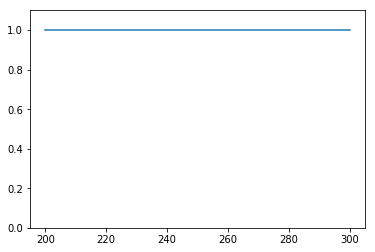

Test 596
True spectrum: 


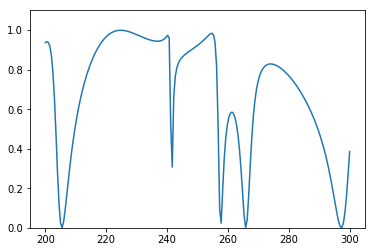

Predicted spectrum: 


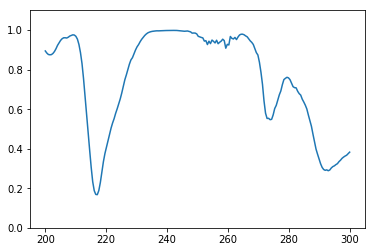

Test 597
True spectrum: 


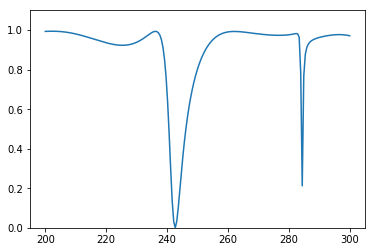

Predicted spectrum: 


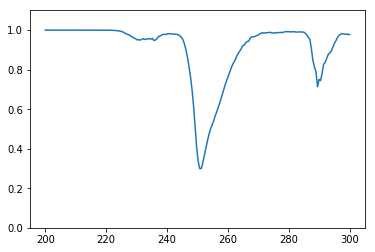

Test 598
True spectrum: 


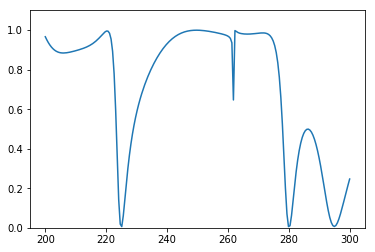

Predicted spectrum: 


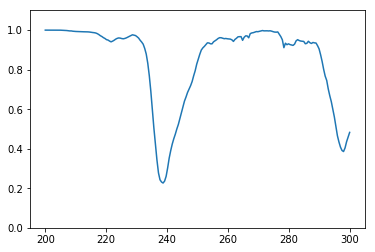

Test 599
True spectrum: 


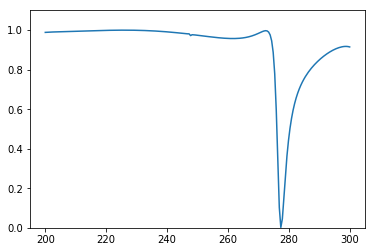

Predicted spectrum: 


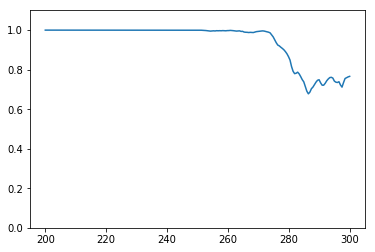

Test 600
True spectrum: 


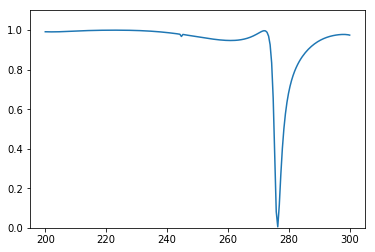

Predicted spectrum: 


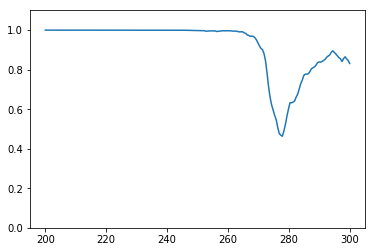

Test 601
True spectrum: 


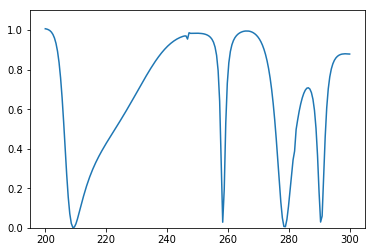

Predicted spectrum: 


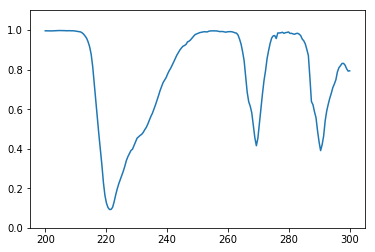

Test 602
True spectrum: 


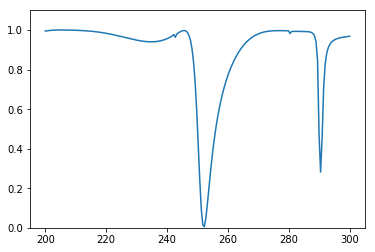

Predicted spectrum: 


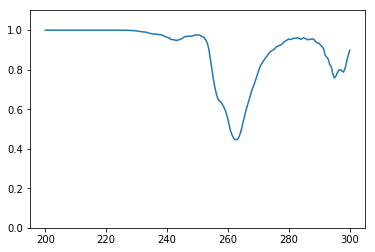

Test 603
True spectrum: 


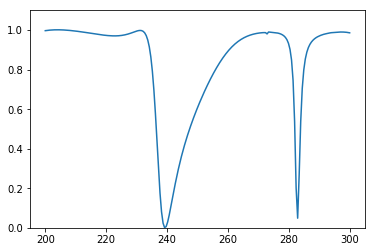

Predicted spectrum: 


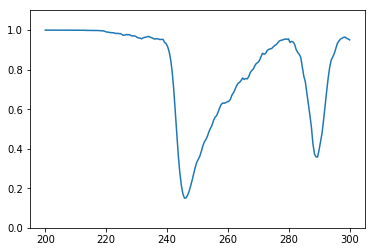

Test 604
True spectrum: 


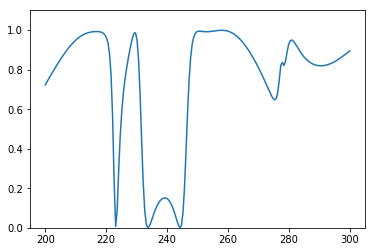

Predicted spectrum: 


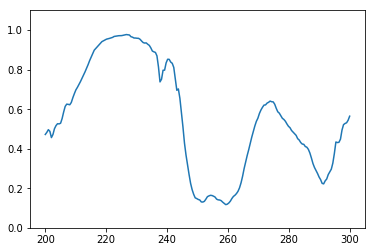

Test 605
True spectrum: 


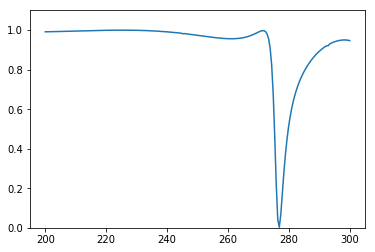

Predicted spectrum: 


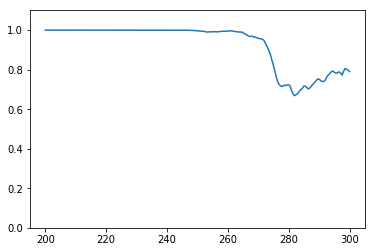

Test 606
True spectrum: 


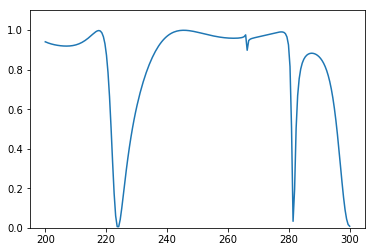

Predicted spectrum: 


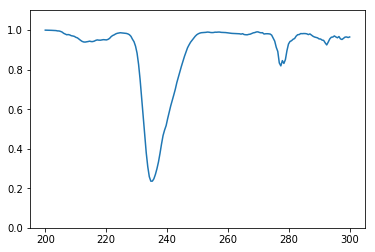

Test 607
True spectrum: 


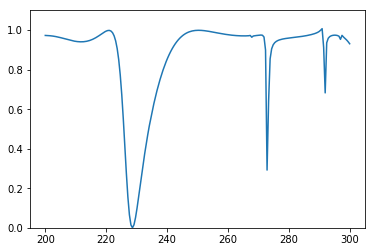

Predicted spectrum: 


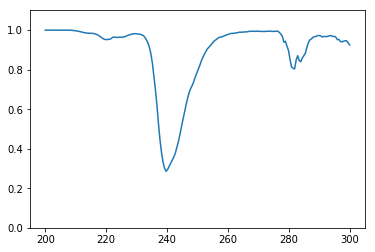

Test 608
True spectrum: 


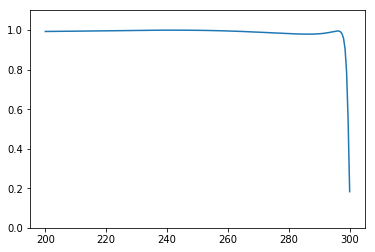

Predicted spectrum: 


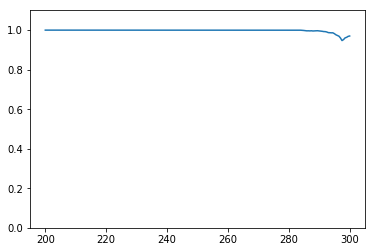

Test 609
True spectrum: 


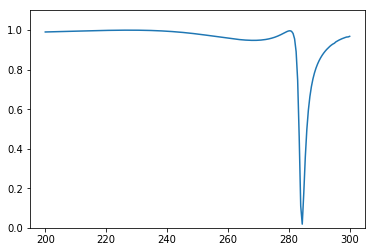

Predicted spectrum: 


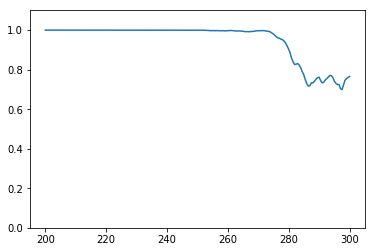

Test 610
True spectrum: 


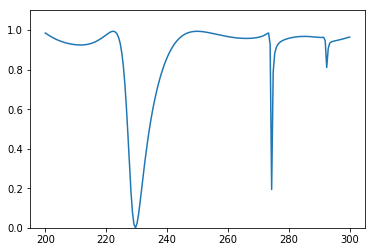

Predicted spectrum: 


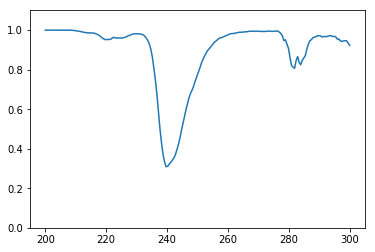

Test 611
True spectrum: 


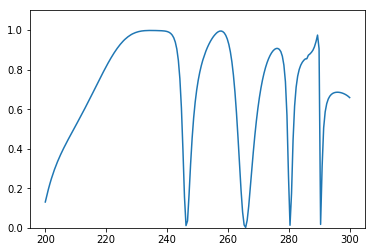

Predicted spectrum: 


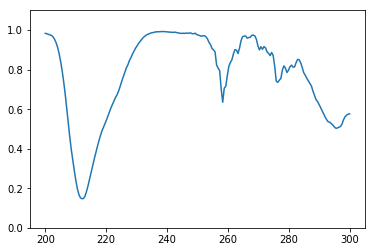

Test 612
True spectrum: 


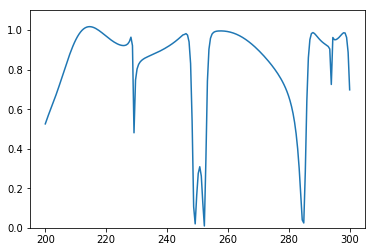

Predicted spectrum: 


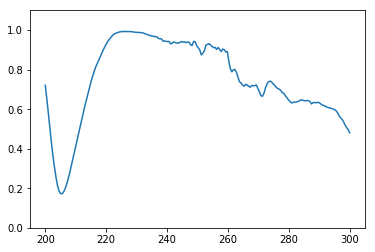

Test 613
True spectrum: 


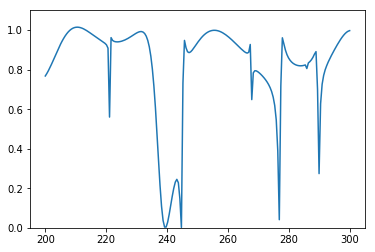

Predicted spectrum: 


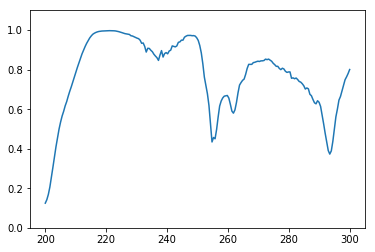

Test 614
True spectrum: 


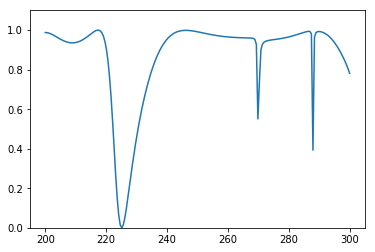

Predicted spectrum: 


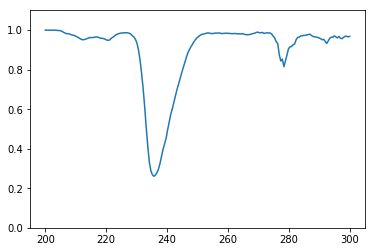

Test 615
True spectrum: 


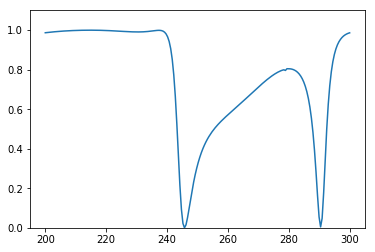

Predicted spectrum: 


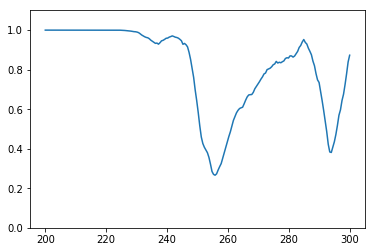

Test 616
True spectrum: 


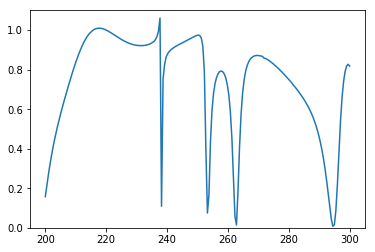

Predicted spectrum: 


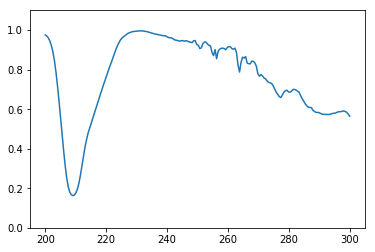

Test 617
True spectrum: 


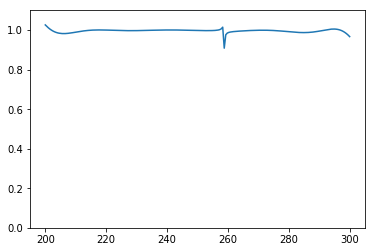

Predicted spectrum: 


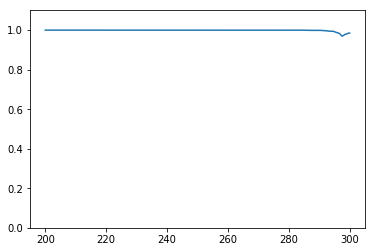

Test 618
True spectrum: 


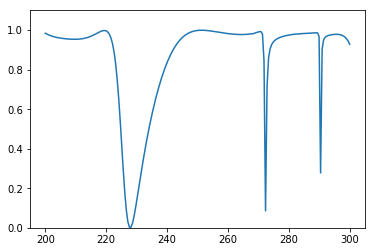

Predicted spectrum: 


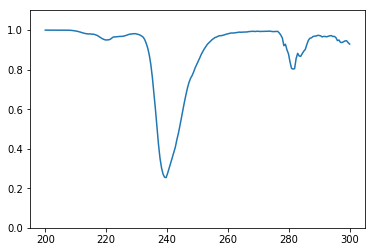

Test 619
True spectrum: 


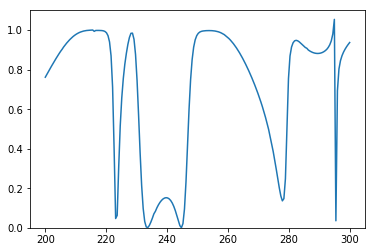

Predicted spectrum: 


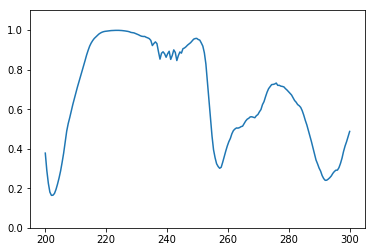

Test 620
True spectrum: 


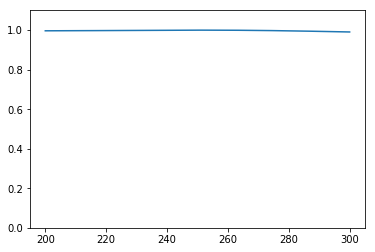

Predicted spectrum: 


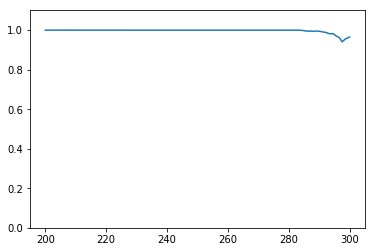

Test 621
True spectrum: 


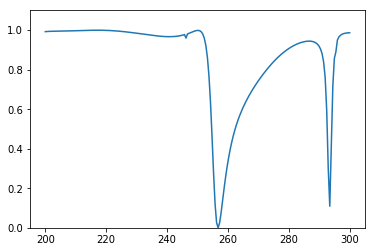

Predicted spectrum: 


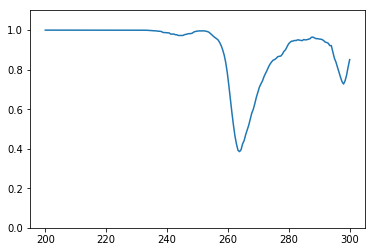

Test 622
True spectrum: 


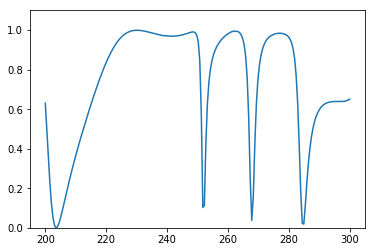

Predicted spectrum: 


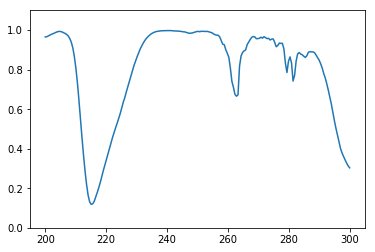

Test 623
True spectrum: 


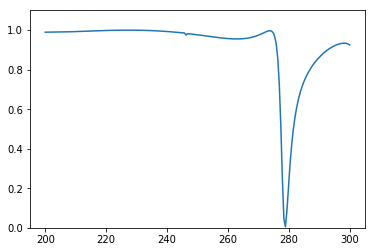

Predicted spectrum: 


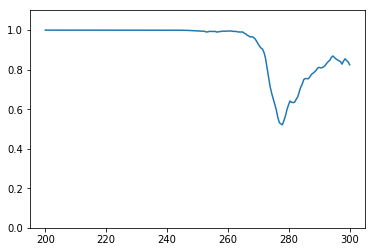

Test 624
True spectrum: 


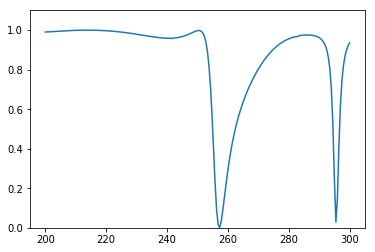

Predicted spectrum: 


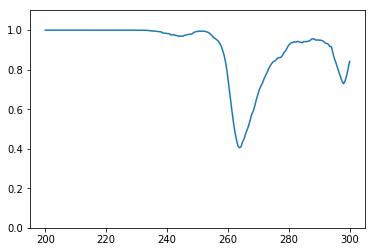

Test 625
True spectrum: 


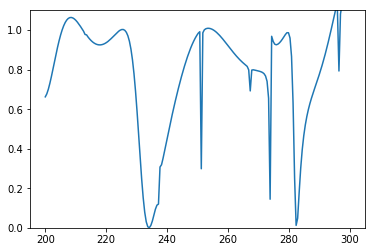

Predicted spectrum: 


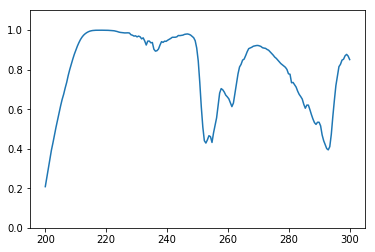

Test 626
True spectrum: 


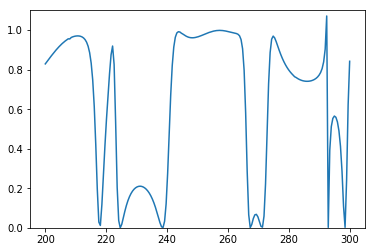

Predicted spectrum: 


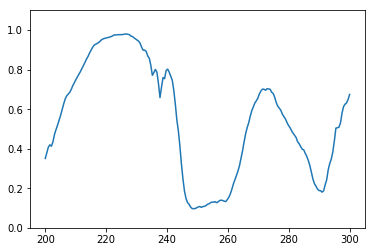

Test 627
True spectrum: 


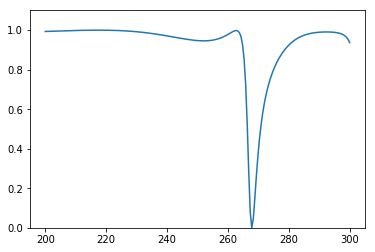

Predicted spectrum: 


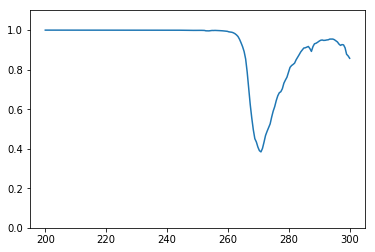

Test 628
True spectrum: 


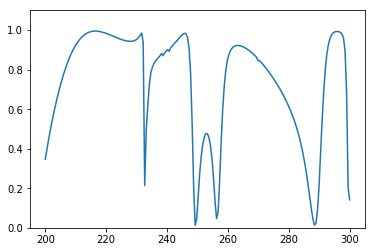

Predicted spectrum: 


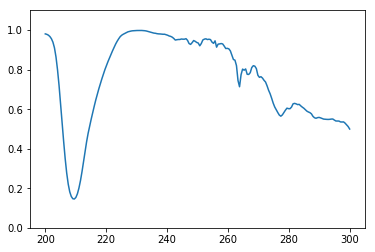

Test 629
True spectrum: 


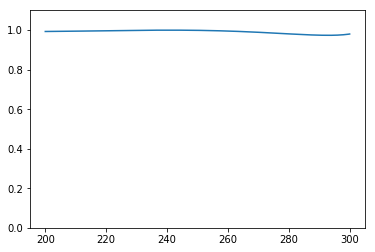

Predicted spectrum: 


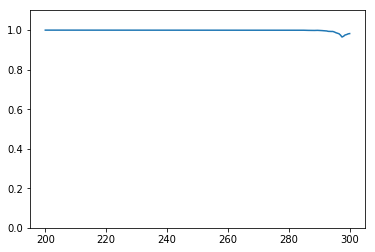

Test 630
True spectrum: 


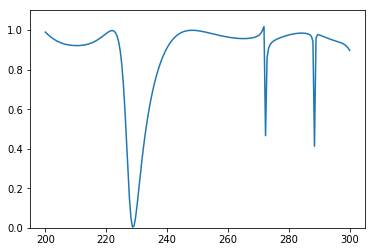

Predicted spectrum: 


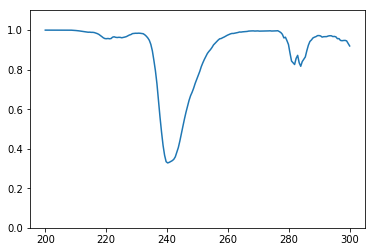

Test 631
True spectrum: 


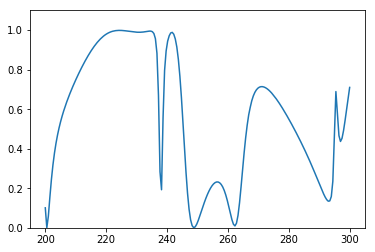

Predicted spectrum: 


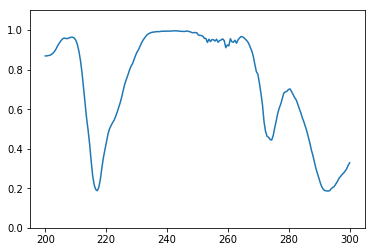

Test 632
True spectrum: 


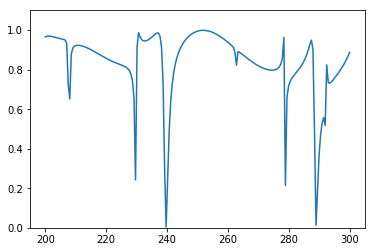

Predicted spectrum: 


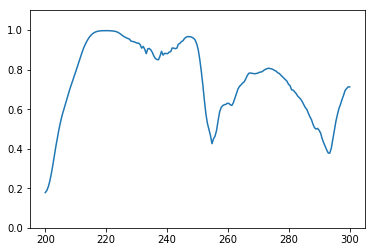

Test 633
True spectrum: 


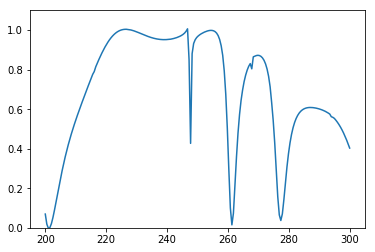

Predicted spectrum: 


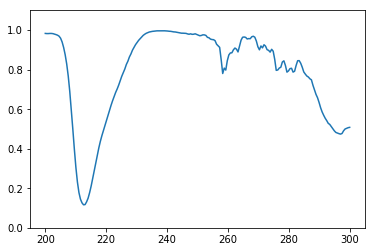

Test 634
True spectrum: 


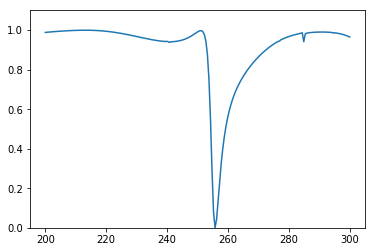

Predicted spectrum: 


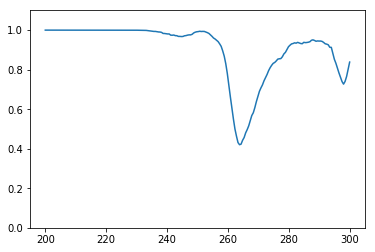

Test 635
True spectrum: 


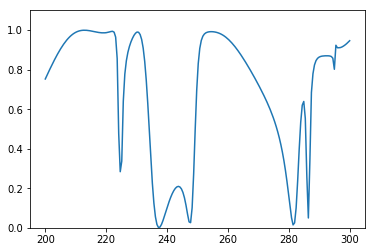

Predicted spectrum: 


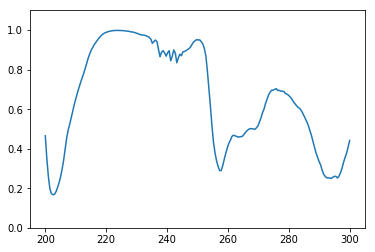

Test 636
True spectrum: 


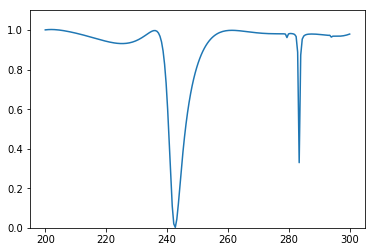

Predicted spectrum: 


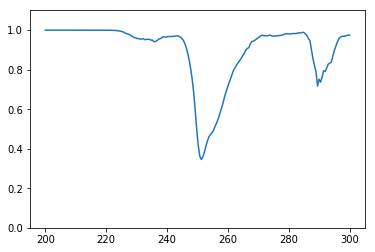

Test 637
True spectrum: 


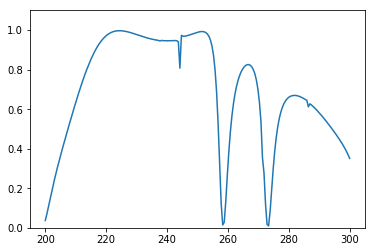

Predicted spectrum: 


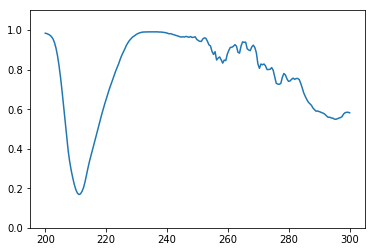

Test 638
True spectrum: 


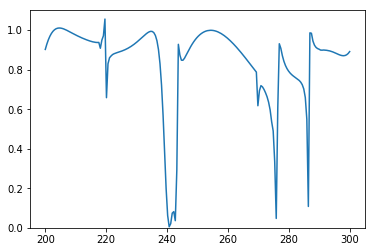

Predicted spectrum: 


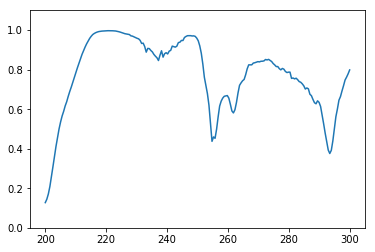

Test 639
True spectrum: 


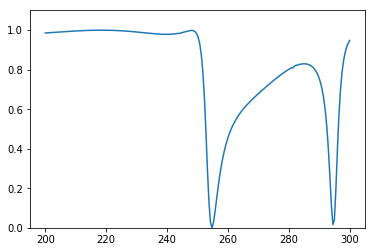

Predicted spectrum: 


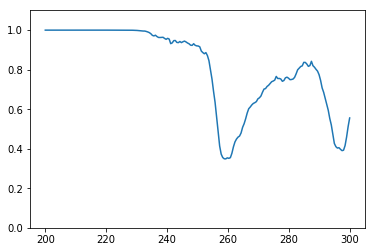

Test 640
True spectrum: 


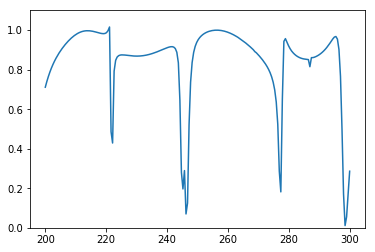

Predicted spectrum: 


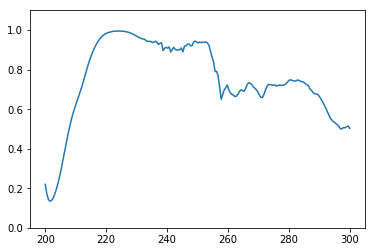

Test 641
True spectrum: 


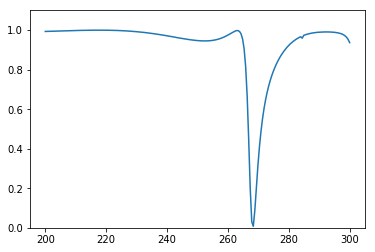

Predicted spectrum: 


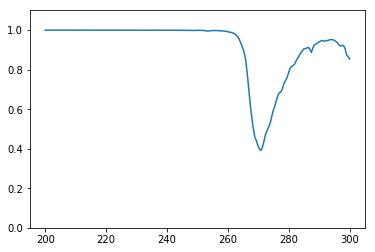

Test 642
True spectrum: 


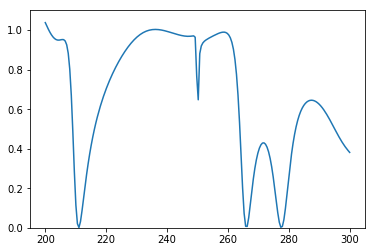

Predicted spectrum: 


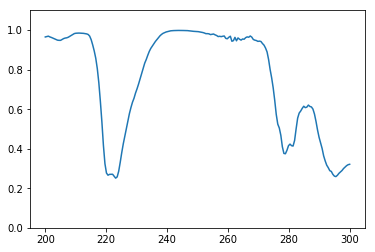

Test 643
True spectrum: 


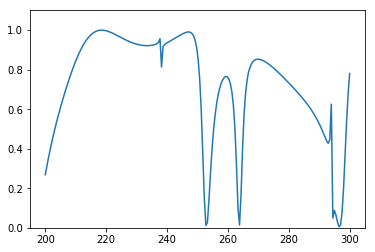

Predicted spectrum: 


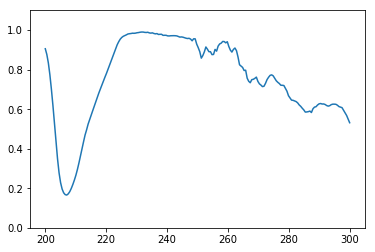

Test 644
True spectrum: 


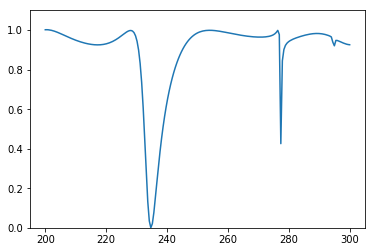

Predicted spectrum: 


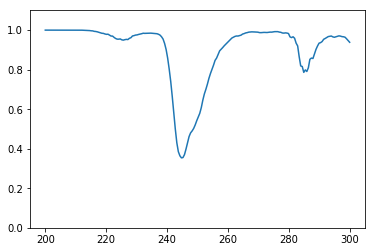

Test 645
True spectrum: 


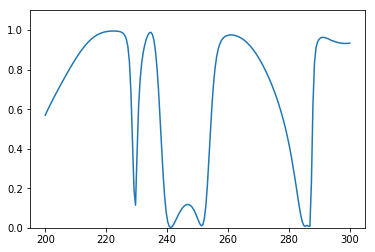

Predicted spectrum: 


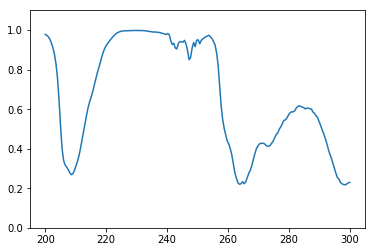

Test 646
True spectrum: 


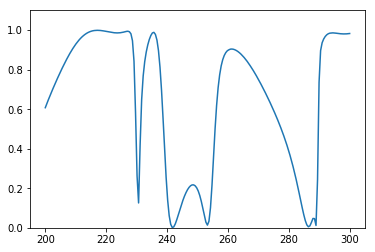

Predicted spectrum: 


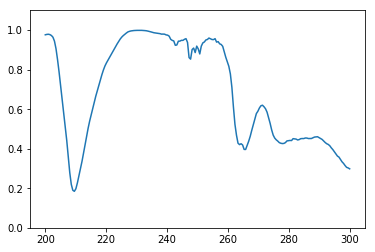

Test 647
True spectrum: 


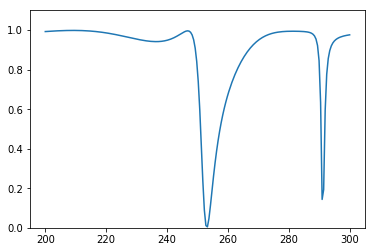

Predicted spectrum: 


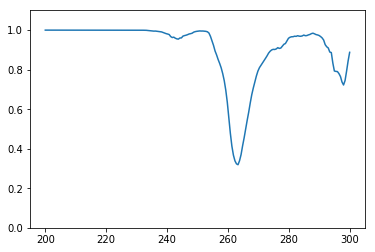

Test 648
True spectrum: 


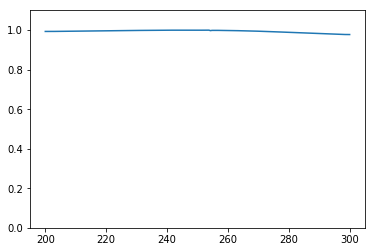

Predicted spectrum: 


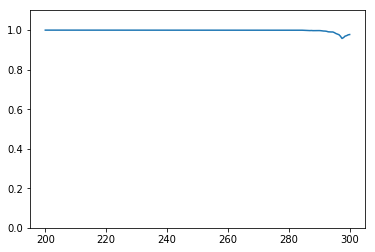

Test 649
True spectrum: 


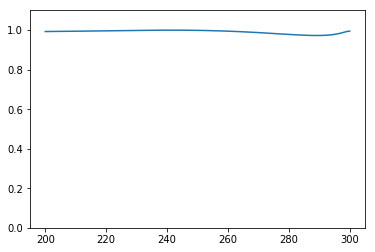

Predicted spectrum: 


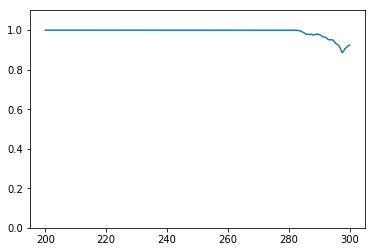

Test 650
True spectrum: 


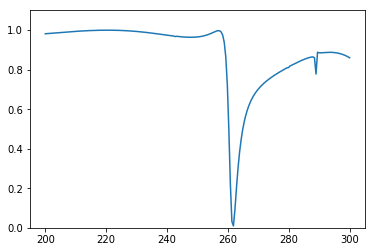

Predicted spectrum: 


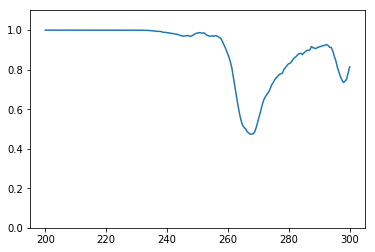

Test 651
True spectrum: 


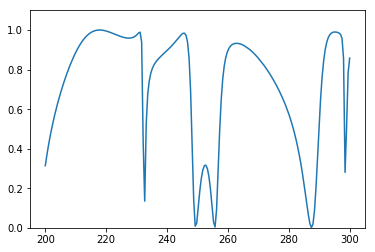

Predicted spectrum: 


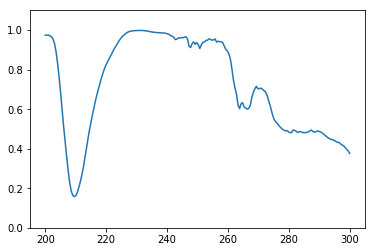

Test 652
True spectrum: 


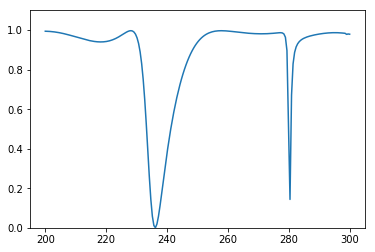

Predicted spectrum: 


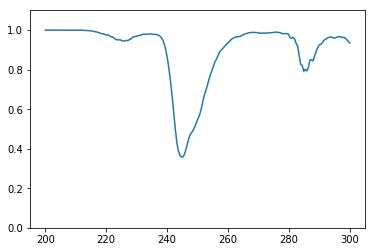

Test 653
True spectrum: 


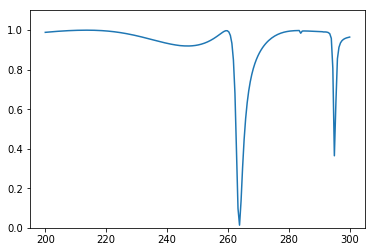

Predicted spectrum: 


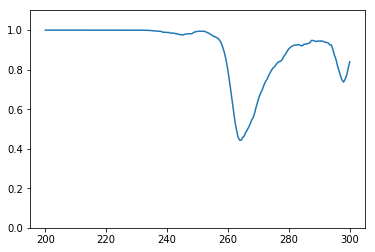

Test 654
True spectrum: 


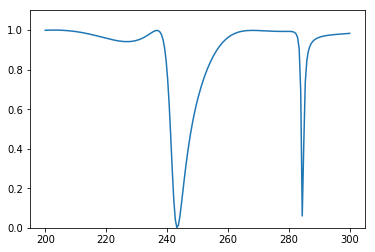

Predicted spectrum: 


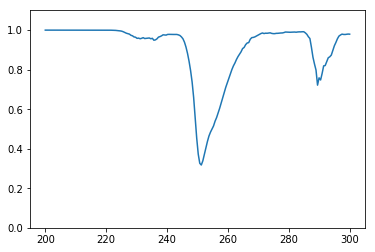

Test 655
True spectrum: 


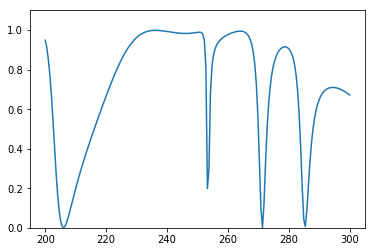

Predicted spectrum: 


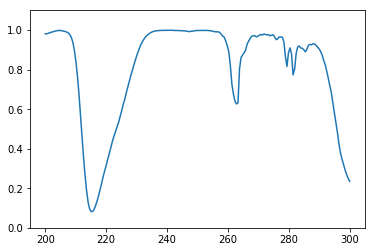

Test 656
True spectrum: 


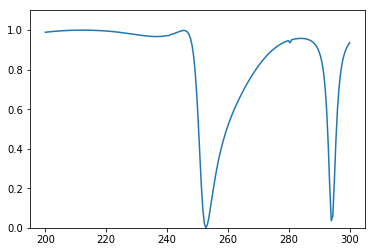

Predicted spectrum: 


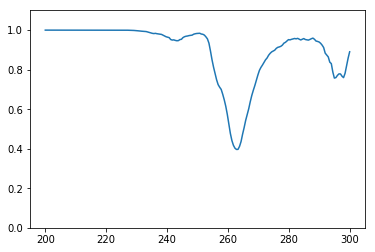

Test 657
True spectrum: 


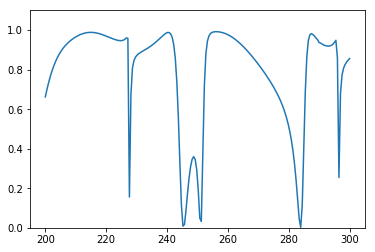

Predicted spectrum: 


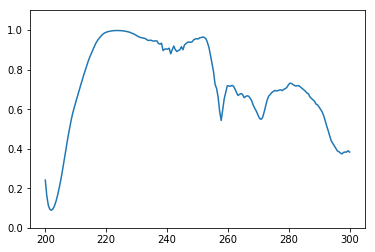

Test 658
True spectrum: 


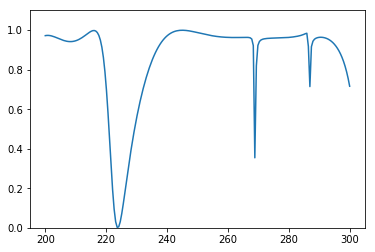

Predicted spectrum: 


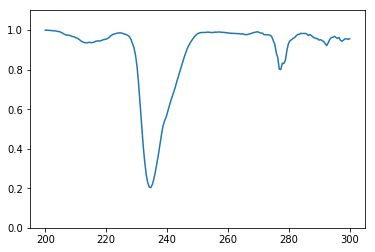

Test 659
True spectrum: 


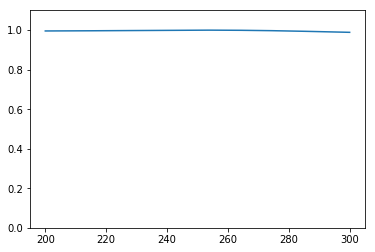

Predicted spectrum: 


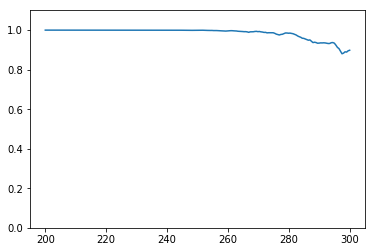

Test 660
True spectrum: 


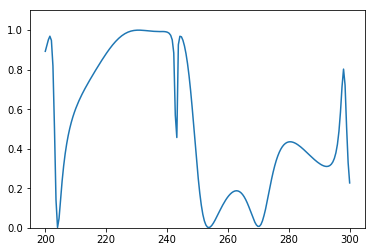

Predicted spectrum: 


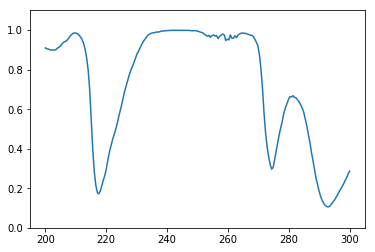

Test 661
True spectrum: 


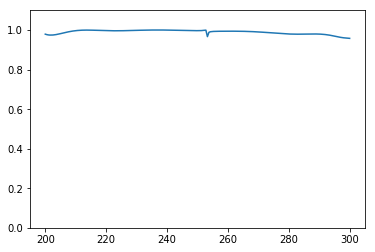

Predicted spectrum: 


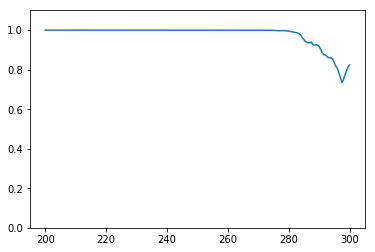

Test 662
True spectrum: 


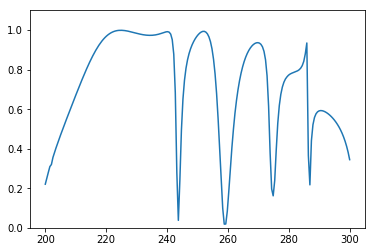

Predicted spectrum: 


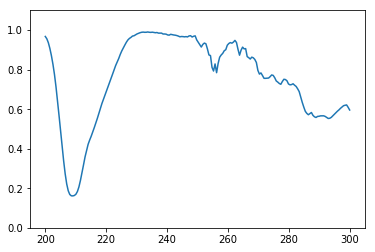

Test 663
True spectrum: 


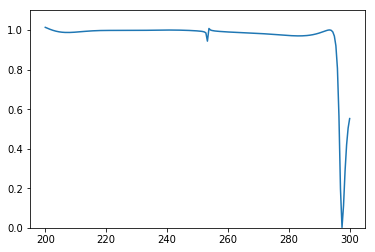

Predicted spectrum: 


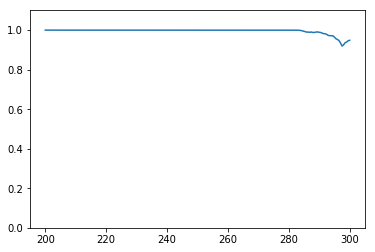

Test 664
True spectrum: 


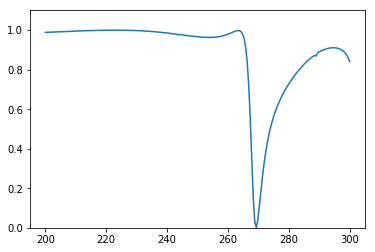

Predicted spectrum: 


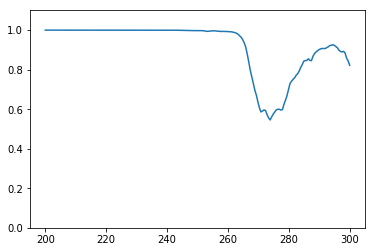

Test 665
True spectrum: 


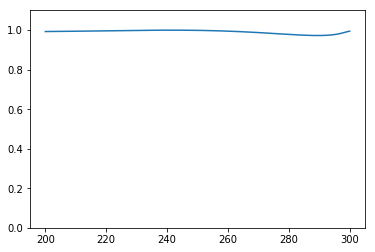

Predicted spectrum: 


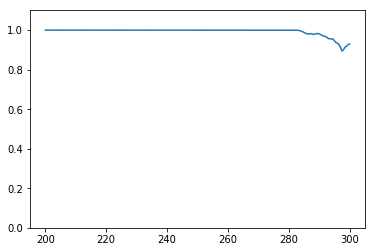

Test 666
True spectrum: 


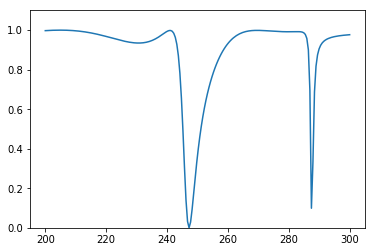

Predicted spectrum: 


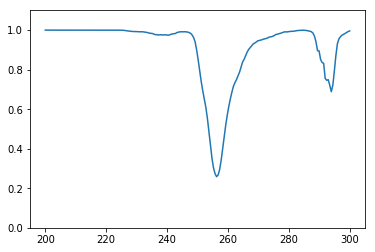

Test 667
True spectrum: 


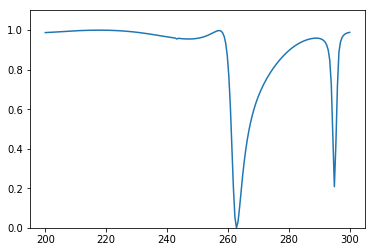

Predicted spectrum: 


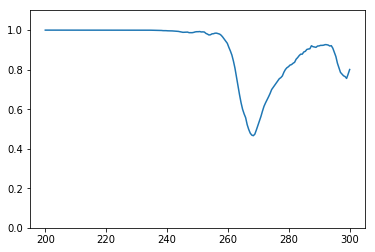

Test 668
True spectrum: 


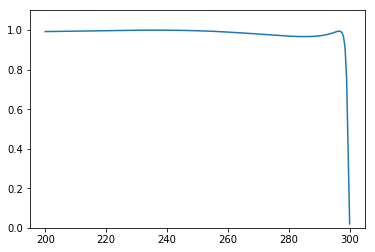

Predicted spectrum: 


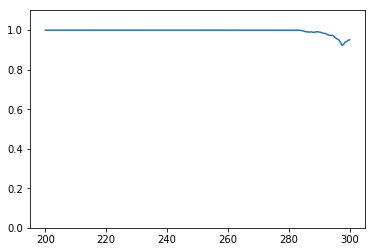

Test 669
True spectrum: 


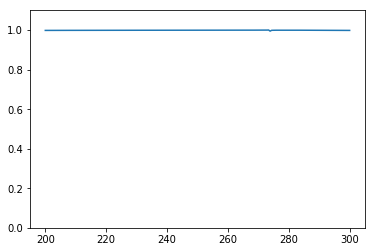

Predicted spectrum: 


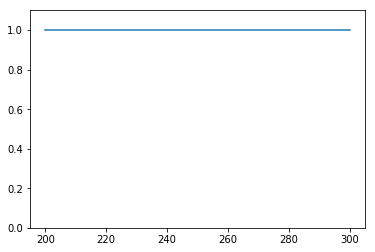

Test 670
True spectrum: 


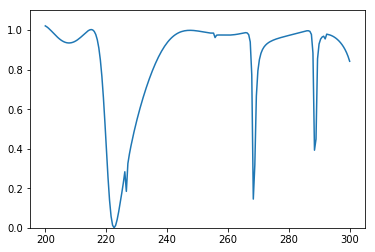

Predicted spectrum: 


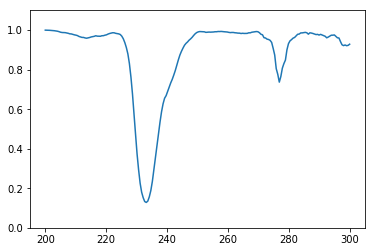

Test 671
True spectrum: 


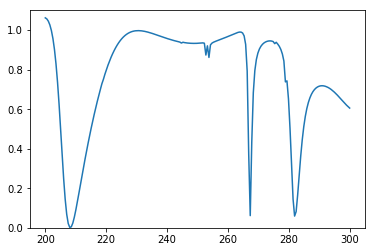

Predicted spectrum: 


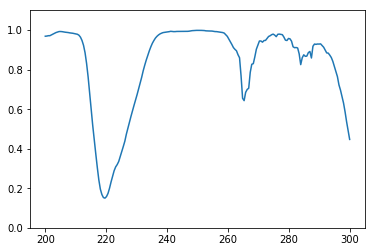

Test 672
True spectrum: 


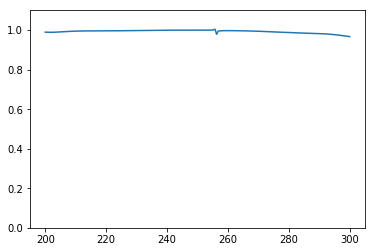

Predicted spectrum: 


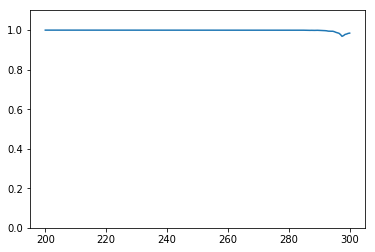

Test 673
True spectrum: 


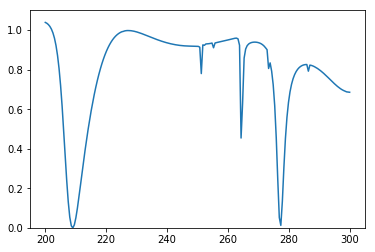

Predicted spectrum: 


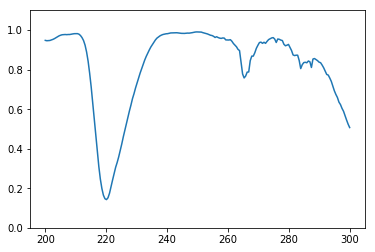

Test 674
True spectrum: 


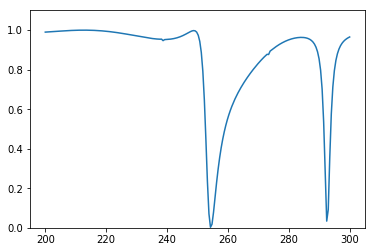

Predicted spectrum: 


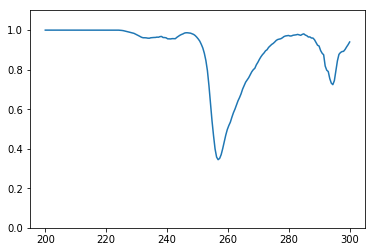

Test 675
True spectrum: 


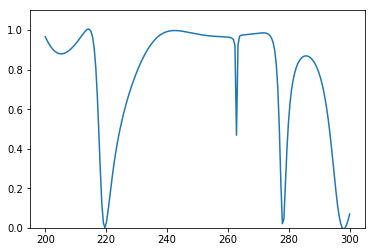

Predicted spectrum: 


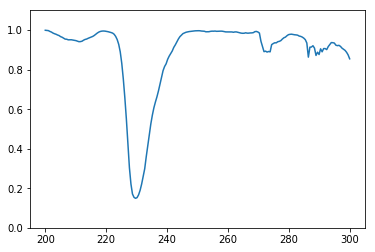

Test 676
True spectrum: 


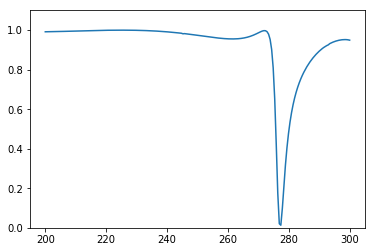

Predicted spectrum: 


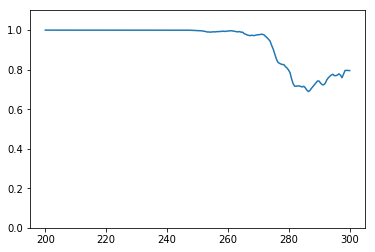

Test 677
True spectrum: 


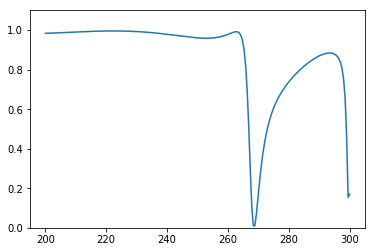

Predicted spectrum: 


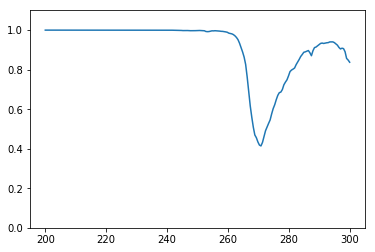

Test 678
True spectrum: 


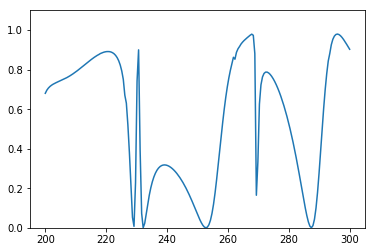

Predicted spectrum: 


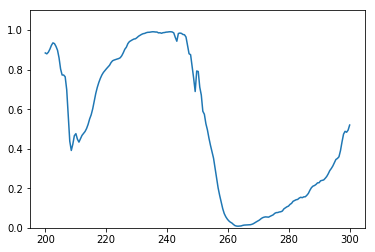

Test 679
True spectrum: 


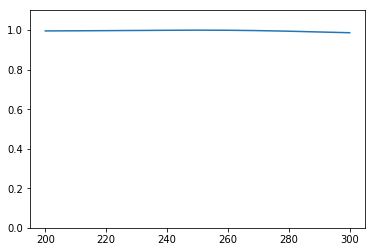

Predicted spectrum: 


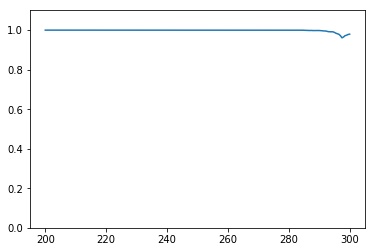

Test 680
True spectrum: 


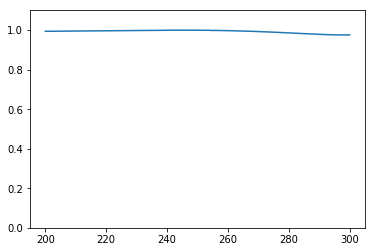

Predicted spectrum: 


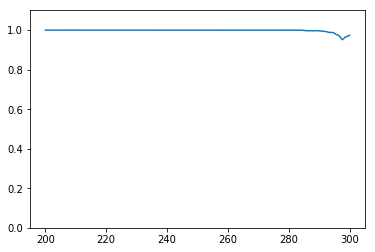

Test 681
True spectrum: 


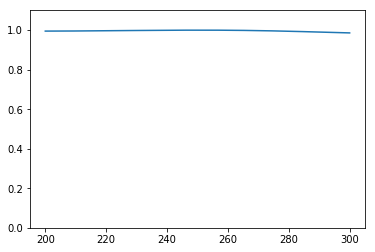

Predicted spectrum: 


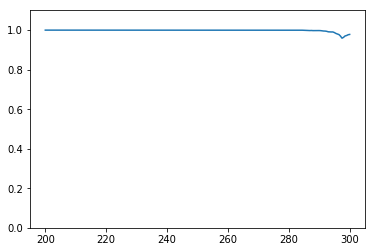

Test 682
True spectrum: 


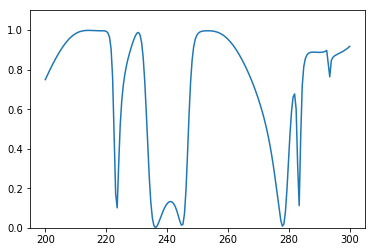

Predicted spectrum: 


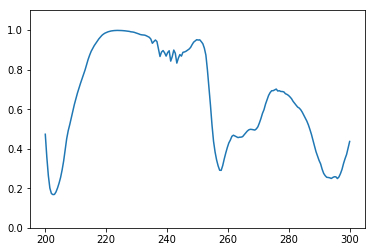

Test 683
True spectrum: 


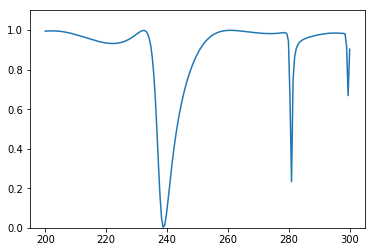

Predicted spectrum: 


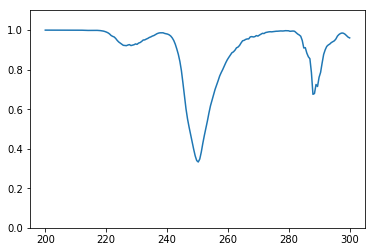

Test 684
True spectrum: 


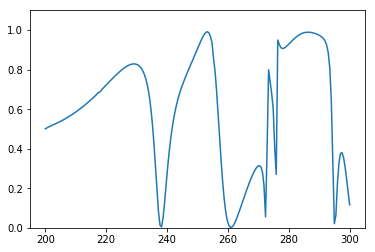

Predicted spectrum: 


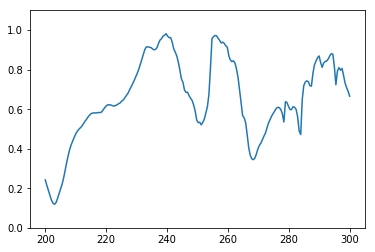

Test 685
True spectrum: 


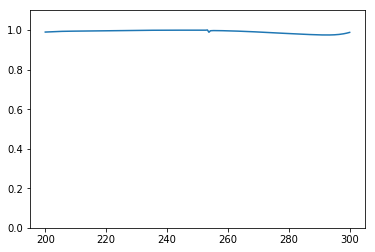

Predicted spectrum: 


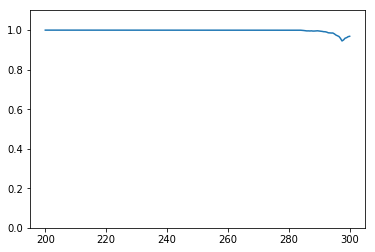

Test 686
True spectrum: 


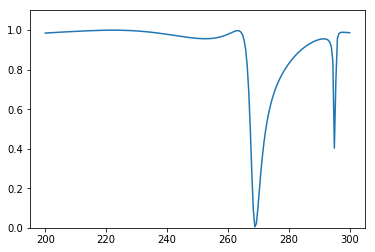

Predicted spectrum: 


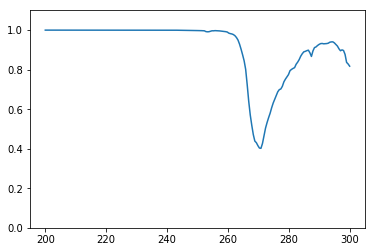

Test 687
True spectrum: 


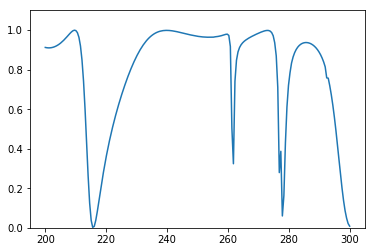

Predicted spectrum: 


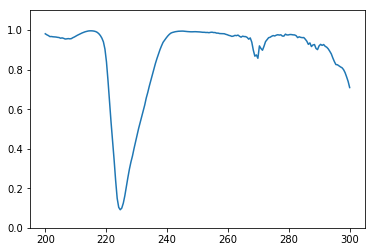

Test 688
True spectrum: 


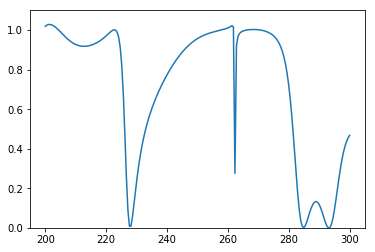

Predicted spectrum: 


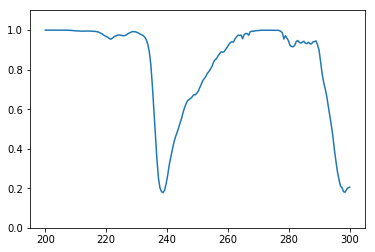

Test 689
True spectrum: 


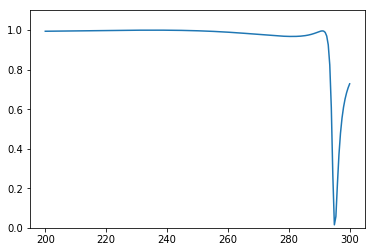

Predicted spectrum: 


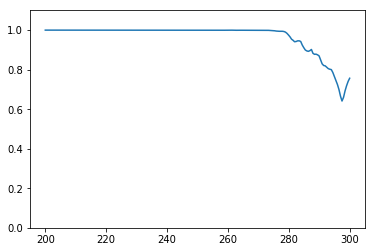

Test 690
True spectrum: 


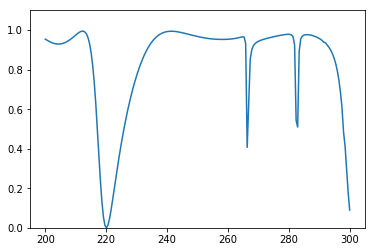

Predicted spectrum: 


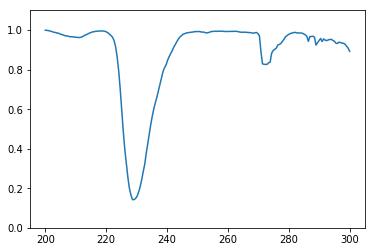

Test 691
True spectrum: 


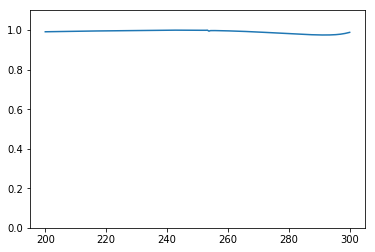

Predicted spectrum: 


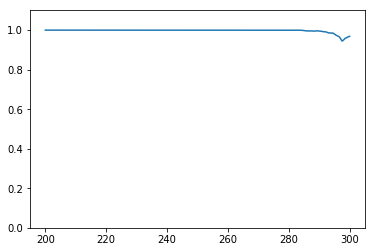

Test 692
True spectrum: 


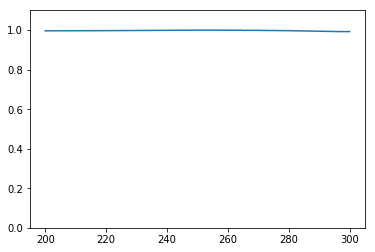

Predicted spectrum: 


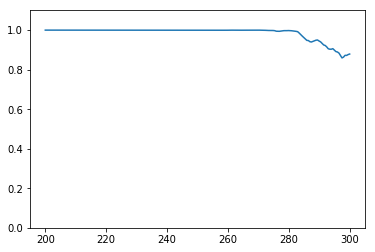

Test 693
True spectrum: 


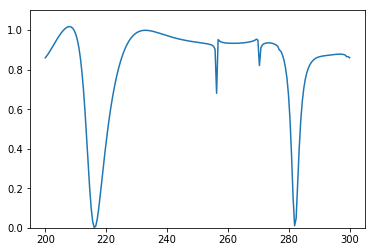

Predicted spectrum: 


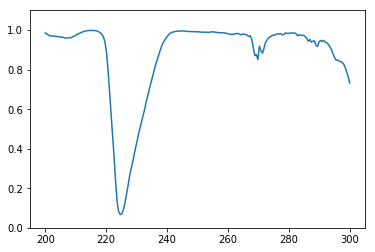

Test 694
True spectrum: 


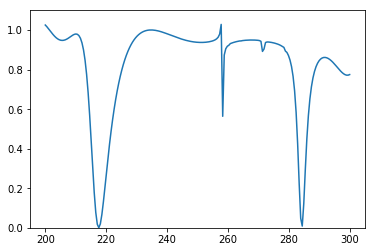

Predicted spectrum: 


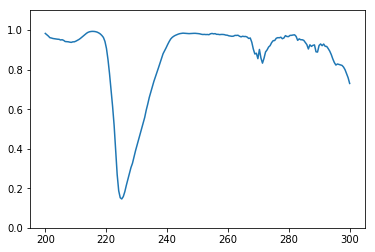

Test 695
True spectrum: 


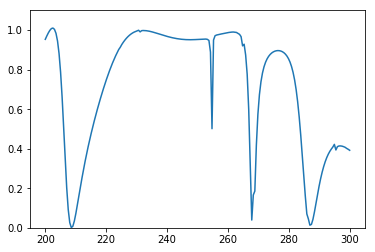

Predicted spectrum: 


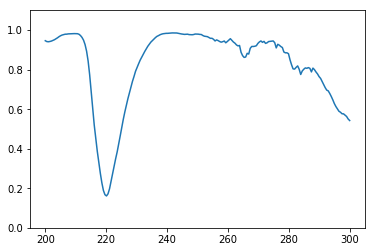

Test 696
True spectrum: 


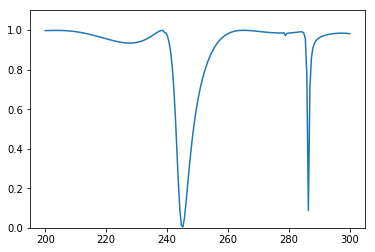

Predicted spectrum: 


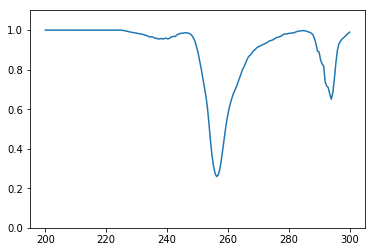

Test 697
True spectrum: 


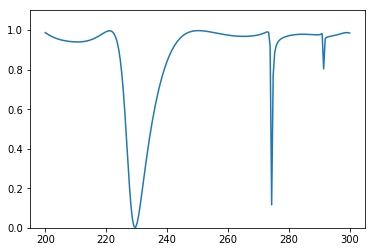

Predicted spectrum: 


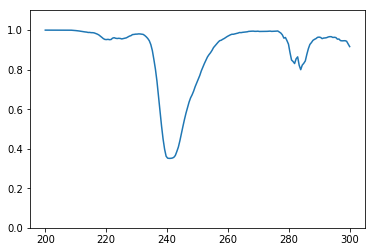

Test 698
True spectrum: 


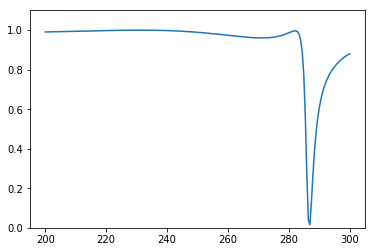

Predicted spectrum: 


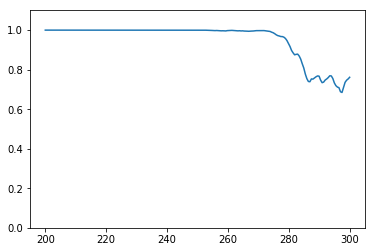

Test 699
True spectrum: 


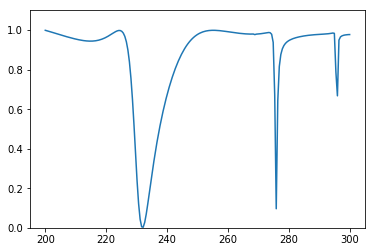

Predicted spectrum: 


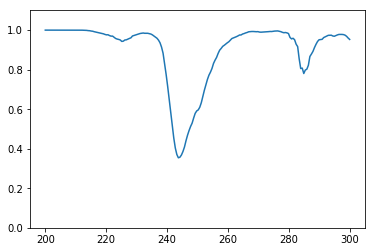

Test 700
True spectrum: 


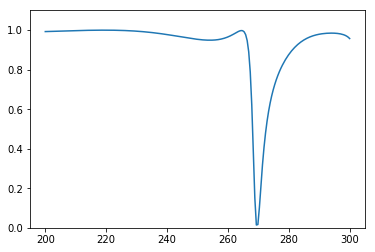

Predicted spectrum: 


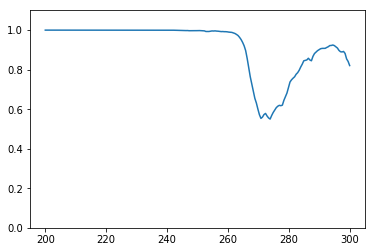

Test 701
True spectrum: 


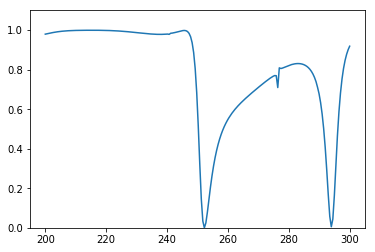

Predicted spectrum: 


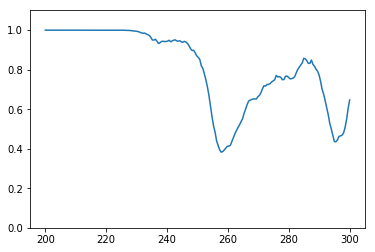

Test 702
True spectrum: 


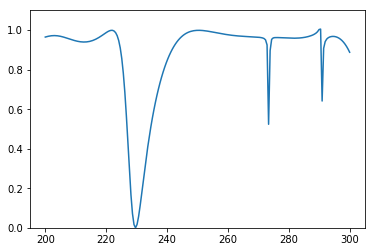

Predicted spectrum: 


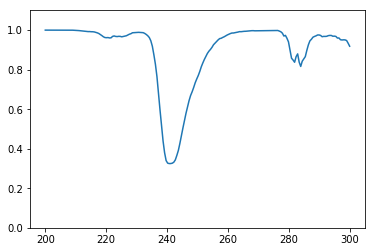

Test 703
True spectrum: 


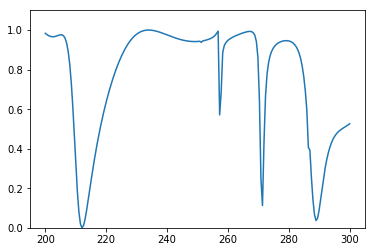

Predicted spectrum: 


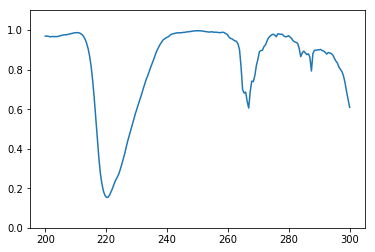

Test 704
True spectrum: 


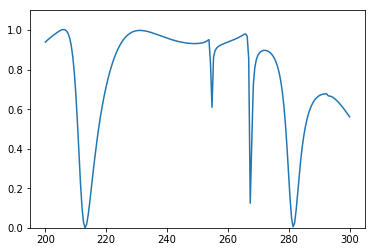

Predicted spectrum: 


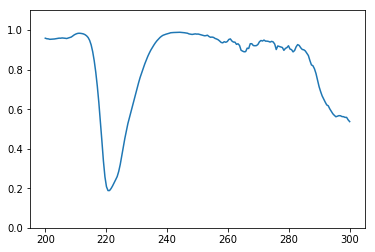

Test 705
True spectrum: 


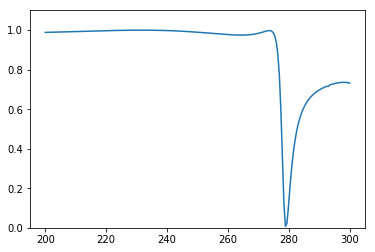

Predicted spectrum: 


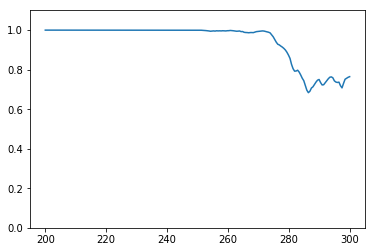

Test 706
True spectrum: 


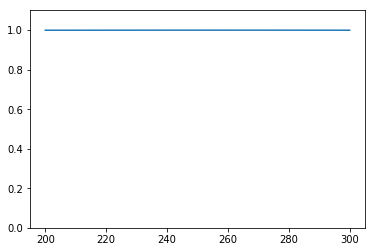

Predicted spectrum: 


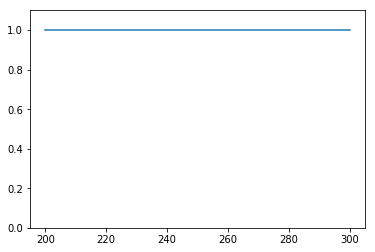

Test 707
True spectrum: 


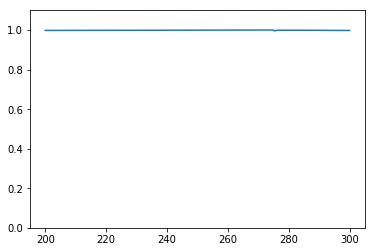

Predicted spectrum: 


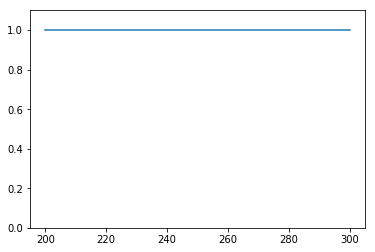

Test 708
True spectrum: 


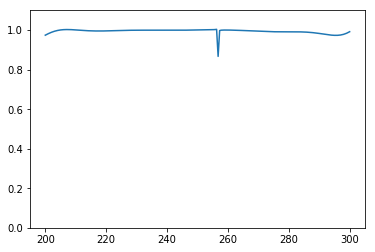

Predicted spectrum: 


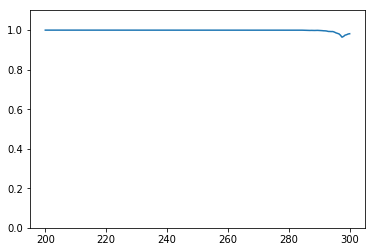

Test 709
True spectrum: 


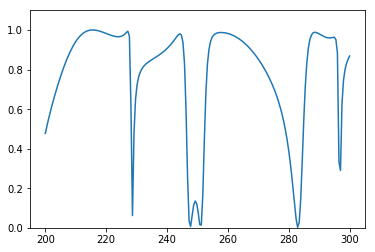

Predicted spectrum: 


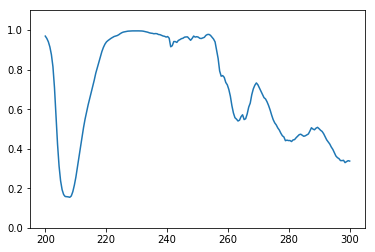

Test 710
True spectrum: 


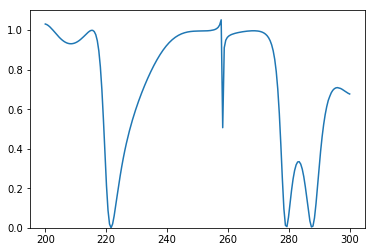

Predicted spectrum: 


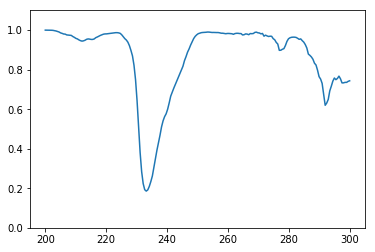

Test 711
True spectrum: 


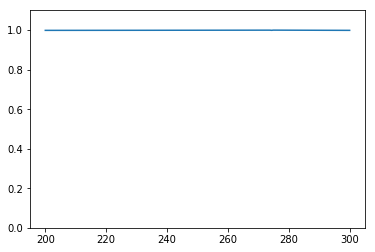

Predicted spectrum: 


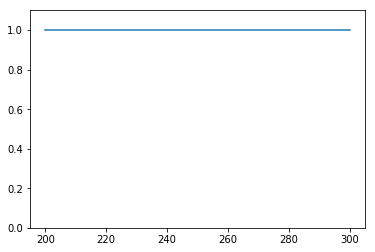

Test 712
True spectrum: 


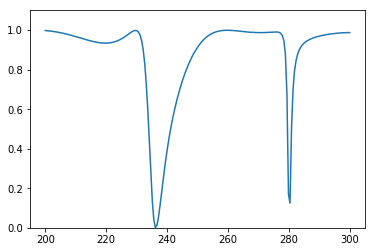

Predicted spectrum: 


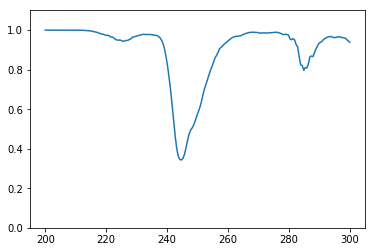

Test 713
True spectrum: 


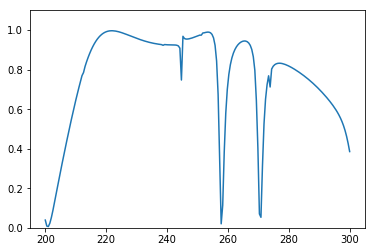

Predicted spectrum: 


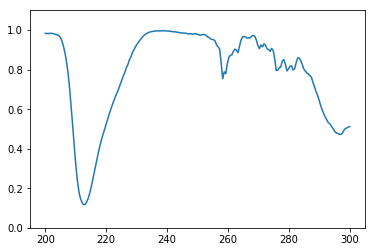

Test 714
True spectrum: 


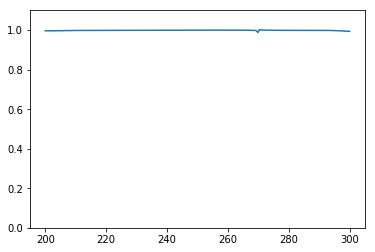

Predicted spectrum: 


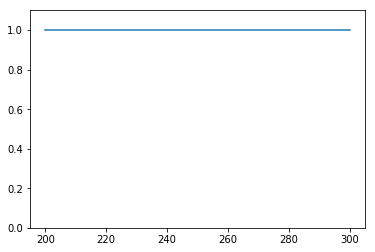

Test 715
True spectrum: 


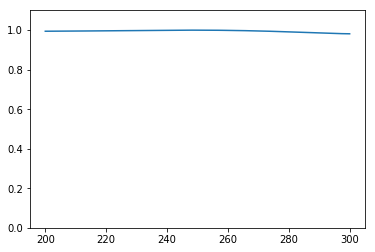

Predicted spectrum: 


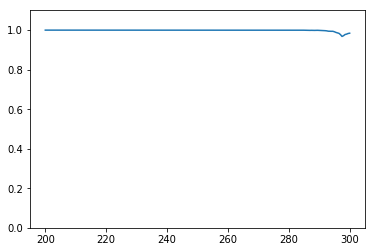

Test 716
True spectrum: 


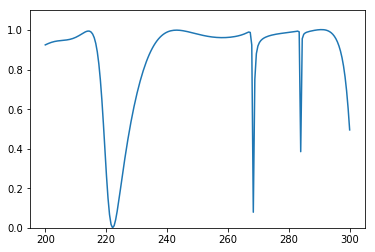

Predicted spectrum: 


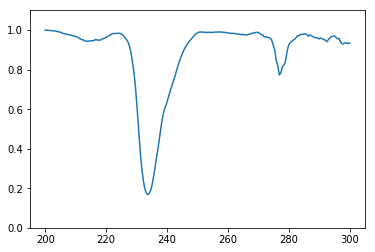

In [9]:
x = np.genfromtxt('meep_code/data/SP_xaxis.txt')
for i in range(len(test_X)):
    print('Test '+str(i))
    print('True spectrum: ')
    plt.ylim(0, 1.1)
    plt.plot(x, test_Y[i])
    plt.show()
    print('Predicted spectrum: ')
    plt.ylim(0, 1.1)
    plt.plot(x, np.reshape(model.predict(np.reshape(test_X[i], (1, 6))), (200,)))
    plt.show()